In [1]:
import os

# Create the 'kaggle' directory if it doesn't exist
kaggle_dir = '/content/drive/MyDrive/kaggle'
if not os.path.exists(kaggle_dir):
  os.makedirs(kaggle_dir)

# Install kaggle API
!pip install -q kaggle

# Check for kaggle.json in the kaggle directory
kaggle_json_path = os.path.join(kaggle_dir, 'kaggle.json')
if not os.path.exists(kaggle_json_path):
    # Upload your kaggle.json file
    from google.colab import files
    uploaded = files.upload()
else:
    print("kaggle.json found in kaggle directory. Skipping upload.")

# Move the kaggle.json file to the correct location
!mkdir -p ~/.kaggle
!cp {kaggle_json_path} ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Check if dataset already exists
dataset_path = os.path.join(kaggle_dir, 'brats20-dataset-training-validation.zip')
if not os.path.exists(dataset_path):
    # Download the dataset from Kaggle
    !kaggle datasets download -d awsaf49/brats20-dataset-training-validation -p /content/drive/MyDrive/kaggle
    print("Dataset downloaded successfully!")
else:
    print("Dataset already exists. Skipping download.")

# Check if dataset is extracted
extracted_path = os.path.join(kaggle_dir, 'BraTS2020_TrainingData')
if not os.path.exists(extracted_path):
    # Extract the dataset
    !unzip /content/drive/MyDrive/kaggle/brats20-dataset-training-validation.zip -d /content/drive/MyDrive/kaggle
    print("Dataset extracted successfully!")
else:
    print("Dataset already extracted. Skipping extraction.")

print("Dataset ready to use!")

kaggle.json found in kaggle directory. Skipping upload.
Dataset already exists. Skipping download.
Dataset already extracted. Skipping extraction.
Dataset ready to use!


In [2]:
Train_Path = "/content/drive/MyDrive/kaggle/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/"

In [3]:
pip install --upgrade tensorflow==2.18 tensorflow-text==2.18.0 tf-keras==2.18.0


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 109.3 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-text
    Found existing installation: tensorflow-text 2.18.1
    Uninstalling tensorflow-text-2.18.1:
      Successfully uninstalled tensorflow-text-2.18.1


In [4]:
import cv2
import os
import random
import glob
import PIL
import numpy as np
import shutil
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from skimage import data
from skimage.util import montage
import skimage.transform as skTrans
from skimage.transform import rotate, resize
from PIL import Image, ImageOps
import nibabel as nib
import keras
import tensorflow.keras.backend as K
from keras.callbacks import CSVLogger
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, TensorBoard
from tensorflow.keras.layers import (Input, Dense, Reshape, Flatten, Dropout,
                                     BatchNormalization, Activation, LeakyReLU,
                                     Conv2DTranspose, Conv2D)
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy

In [5]:
# load .nii file as a numpy array
test_image_flair = nib.load(Train_Path + "BraTS20_Training_355/BraTS20_Training_355_flair.nii").get_fdata()
print("Shape: ", test_image_flair.shape)
print("Dtype: ", test_image_flair.dtype)

Shape:  (240, 240, 155)
Dtype:  float64


# Version 1- Shows more anatomical structure

Removed synthetic image: /content/drive/MyDrive/kaggle/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/SyntheticMultiChannel/synthetic_multich_epoch10_img0.nii
Removed synthetic image: /content/drive/MyDrive/kaggle/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/SyntheticMultiChannel/synthetic_multich_epoch10_img1.nii
Removed synthetic image: /content/drive/MyDrive/kaggle/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/SyntheticMultiChannel/synthetic_multich_epoch10_img2.nii
Removed synthetic image: /content/drive/MyDrive/kaggle/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/SyntheticMultiChannel/synthetic_multich_epoch10_img3.nii
Loaded images shape: (369, 128, 128, 5)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 65536)               │       6,553,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 65536)               │         262,144 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu (ReLU)                         │ (None, 65536)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 8, 8, 1024)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 16, 16, 512)         │       8,388,608 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 16, 16, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_1 (ReLU)                       │ (None, 16, 16, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 32, 32, 256)         │       2,097,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_2 (ReLU)                       │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 64, 64, 128)         │         524,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_3 (ReLU)                       │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 128, 128, 64)        │         131,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_4 (ReLU)                       │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_4 (Conv2DTranspose) │ (None, 128, 128, 5)         │           2,885 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 17,963,589 (68.53 MB)

 Trainable params: 17,830,597 (68.02 MB)

 Non-trainable params: 132,992 (519.50 KB)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 128, 128, 5)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 64, 64, 64)          │           2,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 32768)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │          32,769 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,584,897 (6.05 MB)

 Trainable params: 1,584,897 (6.05 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/1000
  Discriminator Loss: -492.4735 | Generator Loss: -233.6717 | D Accuracy: 1.0000
Epoch 2/1000
  Discriminator Loss: -415.7133 | Generator Loss: -134.5081 | D Accuracy: 1.0000
Epoch 3/1000
  Discriminator Loss: -350.8918 | Generator Loss: -2.8125 | D Accuracy: 1.0000
Epoch 4/1000
  Discriminator Loss: -179.4108 | Generator Loss: -263.0503 | D Accuracy: 1.0000
Epoch 5/1000
  Discriminator Loss: -61.8019 | Generator Loss: -225.3946 | D Accuracy: 0.9661
Epoch 6/1000
  Discriminator Loss: -47.2285 | Generator Loss: -136.6382 | D Accuracy: 0.8906
Epoch 7/1000
  Discriminator Loss: -42.3548 | Generator Loss: -77.2253 | D Accuracy: 0.7839
Epoch 8/1000
  Discriminator Loss: -40.1537 | Generator Loss: -114.2270 | D Accuracy: 0.8438
Epoch 9/1000
  Discriminator Loss: -34.0949 | Generator Loss: -76.7735 | D Accuracy: 0.8073
Epoch 10/1000
  Discriminator Loss: -34.7365 | Generator Loss: -108.2890 | D Accuracy: 0.7708


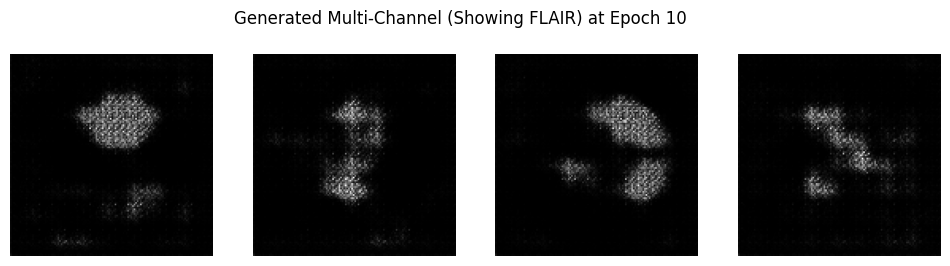

Epoch 11/1000
  Discriminator Loss: -33.4417 | Generator Loss: -34.6207 | D Accuracy: 0.8151
Epoch 12/1000
  Discriminator Loss: -39.2605 | Generator Loss: -78.1684 | D Accuracy: 0.8516
Epoch 13/1000
  Discriminator Loss: -33.0463 | Generator Loss: -15.3268 | D Accuracy: 0.8125
Epoch 14/1000
  Discriminator Loss: -43.0659 | Generator Loss: -61.5119 | D Accuracy: 0.8438
Epoch 15/1000
  Discriminator Loss: -32.1043 | Generator Loss: -35.7766 | D Accuracy: 0.8229
Epoch 16/1000
  Discriminator Loss: -43.2155 | Generator Loss: -37.2627 | D Accuracy: 0.8255
Epoch 17/1000
  Discriminator Loss: -45.7335 | Generator Loss: -12.8593 | D Accuracy: 0.8359
Epoch 18/1000
  Discriminator Loss: -43.1552 | Generator Loss: 24.0342 | D Accuracy: 0.7734
Epoch 19/1000
  Discriminator Loss: -36.8076 | Generator Loss: -34.5652 | D Accuracy: 0.8229
Epoch 20/1000
  Discriminator Loss: -44.8266 | Generator Loss: -10.6997 | D Accuracy: 0.7995


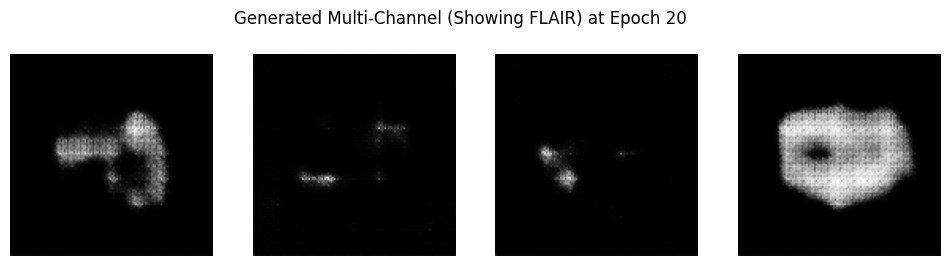

Epoch 21/1000
  Discriminator Loss: -36.7561 | Generator Loss: 23.0864 | D Accuracy: 0.7630
Epoch 22/1000
  Discriminator Loss: -38.5877 | Generator Loss: 9.2505 | D Accuracy: 0.8255
Epoch 23/1000
  Discriminator Loss: -43.6083 | Generator Loss: -22.4912 | D Accuracy: 0.8359
Epoch 24/1000
  Discriminator Loss: -33.3259 | Generator Loss: -15.7656 | D Accuracy: 0.7917
Epoch 25/1000
  Discriminator Loss: -35.8452 | Generator Loss: 0.5780 | D Accuracy: 0.7708
Epoch 26/1000
  Discriminator Loss: -42.0694 | Generator Loss: 54.9394 | D Accuracy: 0.7682
Epoch 27/1000
  Discriminator Loss: -29.0780 | Generator Loss: -13.7778 | D Accuracy: 0.6745
Epoch 28/1000
  Discriminator Loss: -33.4329 | Generator Loss: 16.1419 | D Accuracy: 0.7969
Epoch 29/1000
  Discriminator Loss: -28.2072 | Generator Loss: 30.5538 | D Accuracy: 0.6771
Epoch 30/1000
  Discriminator Loss: -25.5727 | Generator Loss: -24.4225 | D Accuracy: 0.7839


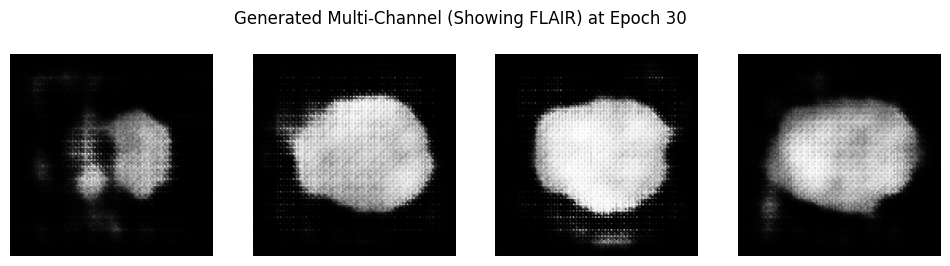

Epoch 31/1000
  Discriminator Loss: -31.0534 | Generator Loss: -19.9240 | D Accuracy: 0.7578
Epoch 32/1000
  Discriminator Loss: -26.3459 | Generator Loss: -26.1545 | D Accuracy: 0.7578
Epoch 33/1000
  Discriminator Loss: -27.2574 | Generator Loss: -21.7917 | D Accuracy: 0.7630
Epoch 34/1000
  Discriminator Loss: -28.4005 | Generator Loss: 3.8225 | D Accuracy: 0.7917
Epoch 35/1000
  Discriminator Loss: -28.0972 | Generator Loss: -43.1739 | D Accuracy: 0.7943
Epoch 36/1000
  Discriminator Loss: -29.3333 | Generator Loss: -22.9931 | D Accuracy: 0.7448
Epoch 37/1000
  Discriminator Loss: -30.2379 | Generator Loss: -66.1425 | D Accuracy: 0.8177
Epoch 38/1000
  Discriminator Loss: -26.5804 | Generator Loss: -23.1341 | D Accuracy: 0.7786
Epoch 39/1000
  Discriminator Loss: -25.7175 | Generator Loss: -7.0589 | D Accuracy: 0.7500
Epoch 40/1000
  Discriminator Loss: -28.7723 | Generator Loss: -65.8019 | D Accuracy: 0.7891


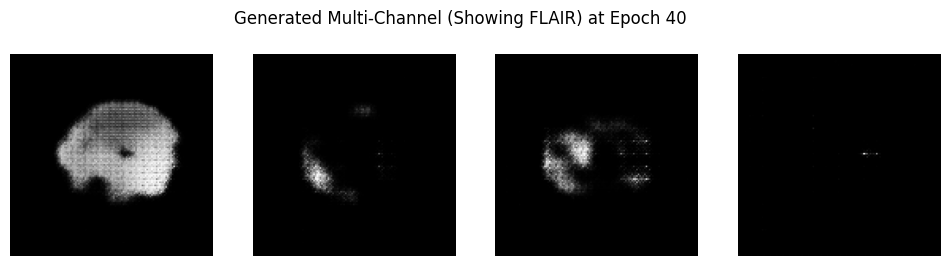

Epoch 41/1000
  Discriminator Loss: -26.0889 | Generator Loss: -9.3702 | D Accuracy: 0.7734
Epoch 42/1000
  Discriminator Loss: -30.8072 | Generator Loss: -31.8009 | D Accuracy: 0.8099
Epoch 43/1000
  Discriminator Loss: -18.2095 | Generator Loss: -42.1355 | D Accuracy: 0.7318
Epoch 44/1000
  Discriminator Loss: -26.2987 | Generator Loss: -2.3320 | D Accuracy: 0.8151
Epoch 45/1000
  Discriminator Loss: -23.1419 | Generator Loss: -17.3672 | D Accuracy: 0.7656
Epoch 46/1000
  Discriminator Loss: -26.5126 | Generator Loss: -22.5769 | D Accuracy: 0.7370
Epoch 47/1000
  Discriminator Loss: -23.6559 | Generator Loss: -13.6188 | D Accuracy: 0.7344
Epoch 48/1000
  Discriminator Loss: -21.2577 | Generator Loss: -29.9739 | D Accuracy: 0.7786
Epoch 49/1000
  Discriminator Loss: -26.8570 | Generator Loss: -0.4538 | D Accuracy: 0.7214
Epoch 50/1000
  Discriminator Loss: -24.7323 | Generator Loss: -26.4615 | D Accuracy: 0.7969


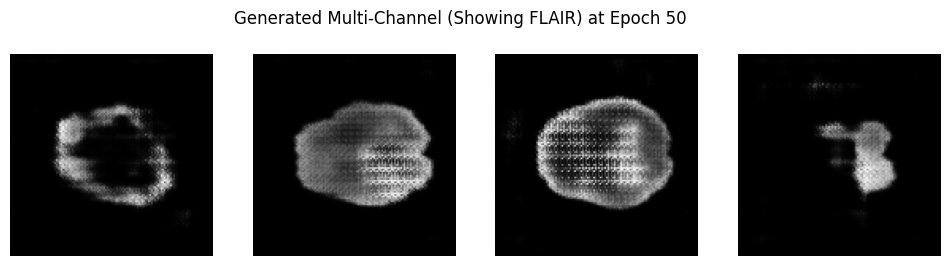

Epoch 51/1000
  Discriminator Loss: -24.6966 | Generator Loss: -6.4131 | D Accuracy: 0.7708
Epoch 52/1000
  Discriminator Loss: -25.1759 | Generator Loss: -8.9586 | D Accuracy: 0.7917
Epoch 53/1000
  Discriminator Loss: -23.8059 | Generator Loss: -27.1267 | D Accuracy: 0.7552
Epoch 54/1000
  Discriminator Loss: -22.4627 | Generator Loss: -36.3082 | D Accuracy: 0.7839
Epoch 55/1000
  Discriminator Loss: -21.0703 | Generator Loss: -38.6575 | D Accuracy: 0.7969
Epoch 56/1000
  Discriminator Loss: -30.8848 | Generator Loss: -46.4351 | D Accuracy: 0.6641
Epoch 57/1000
  Discriminator Loss: -22.8099 | Generator Loss: -8.0457 | D Accuracy: 0.7135
Epoch 58/1000
  Discriminator Loss: -18.3728 | Generator Loss: -66.3526 | D Accuracy: 0.7708
Epoch 59/1000
  Discriminator Loss: -24.5840 | Generator Loss: -10.4830 | D Accuracy: 0.7526
Epoch 60/1000
  Discriminator Loss: -22.8163 | Generator Loss: -35.2831 | D Accuracy: 0.7370


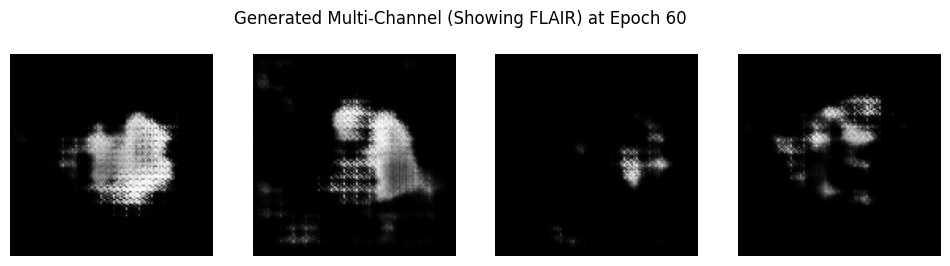

Epoch 61/1000
  Discriminator Loss: -29.5860 | Generator Loss: -46.7182 | D Accuracy: 0.7474
Epoch 62/1000
  Discriminator Loss: -24.0890 | Generator Loss: -7.5830 | D Accuracy: 0.6406
Epoch 63/1000
  Discriminator Loss: -22.5131 | Generator Loss: -58.9045 | D Accuracy: 0.8099
Epoch 64/1000
  Discriminator Loss: -19.8088 | Generator Loss: -57.3016 | D Accuracy: 0.7266
Epoch 65/1000
  Discriminator Loss: -26.6988 | Generator Loss: -42.0316 | D Accuracy: 0.7161
Epoch 66/1000
  Discriminator Loss: -25.3138 | Generator Loss: -21.6753 | D Accuracy: 0.7370
Epoch 67/1000
  Discriminator Loss: -20.8120 | Generator Loss: -12.1675 | D Accuracy: 0.7552
Epoch 68/1000
  Discriminator Loss: -24.2593 | Generator Loss: -49.5273 | D Accuracy: 0.7500
Epoch 69/1000
  Discriminator Loss: -21.5666 | Generator Loss: -1.7443 | D Accuracy: 0.6875
Epoch 70/1000
  Discriminator Loss: -26.6594 | Generator Loss: -65.4809 | D Accuracy: 0.7865


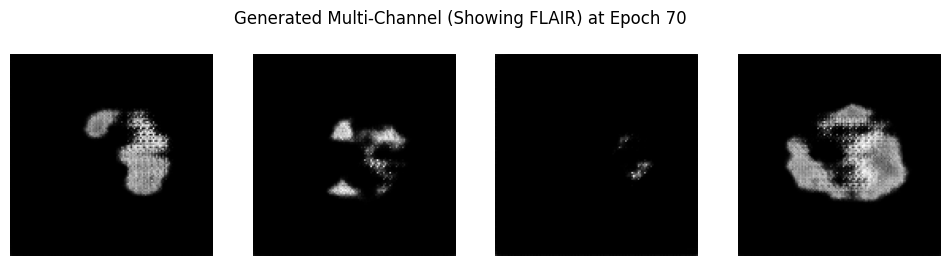

Epoch 71/1000
  Discriminator Loss: -21.6806 | Generator Loss: 11.0356 | D Accuracy: 0.6354
Epoch 72/1000
  Discriminator Loss: -20.0809 | Generator Loss: -48.5966 | D Accuracy: 0.7552
Epoch 73/1000
  Discriminator Loss: -24.1149 | Generator Loss: -21.0315 | D Accuracy: 0.7318
Epoch 74/1000
  Discriminator Loss: -24.3996 | Generator Loss: -52.5501 | D Accuracy: 0.7396
Epoch 75/1000
  Discriminator Loss: -25.7775 | Generator Loss: -24.8513 | D Accuracy: 0.6927
Epoch 76/1000
  Discriminator Loss: -26.0090 | Generator Loss: 9.0990 | D Accuracy: 0.7630
Epoch 77/1000
  Discriminator Loss: -24.1744 | Generator Loss: -11.6280 | D Accuracy: 0.7292
Epoch 78/1000
  Discriminator Loss: -20.6244 | Generator Loss: -16.8248 | D Accuracy: 0.7161
Epoch 79/1000
  Discriminator Loss: -30.1358 | Generator Loss: -48.8786 | D Accuracy: 0.7396
Epoch 80/1000
  Discriminator Loss: -22.8894 | Generator Loss: -37.6293 | D Accuracy: 0.7396


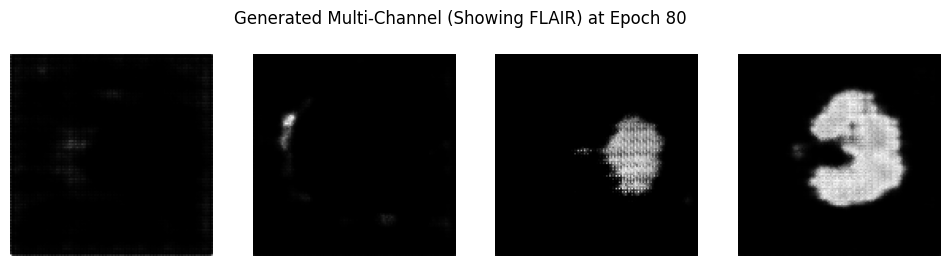

Epoch 81/1000
  Discriminator Loss: -20.3040 | Generator Loss: -43.3480 | D Accuracy: 0.6745
Epoch 82/1000
  Discriminator Loss: -28.7389 | Generator Loss: -30.9574 | D Accuracy: 0.7318
Epoch 83/1000
  Discriminator Loss: -26.1561 | Generator Loss: -0.8256 | D Accuracy: 0.7734
Epoch 84/1000
  Discriminator Loss: -21.2787 | Generator Loss: -31.8084 | D Accuracy: 0.7839
Epoch 85/1000
  Discriminator Loss: -22.5523 | Generator Loss: -28.8661 | D Accuracy: 0.7630
Epoch 86/1000
  Discriminator Loss: -20.8266 | Generator Loss: -29.9590 | D Accuracy: 0.7526
Epoch 87/1000
  Discriminator Loss: -18.0949 | Generator Loss: -36.5873 | D Accuracy: 0.7214
Epoch 88/1000
  Discriminator Loss: -19.3120 | Generator Loss: -27.3229 | D Accuracy: 0.7682
Epoch 89/1000
  Discriminator Loss: -24.6108 | Generator Loss: -34.5259 | D Accuracy: 0.7135
Epoch 90/1000
  Discriminator Loss: -20.0487 | Generator Loss: -32.7301 | D Accuracy: 0.7083


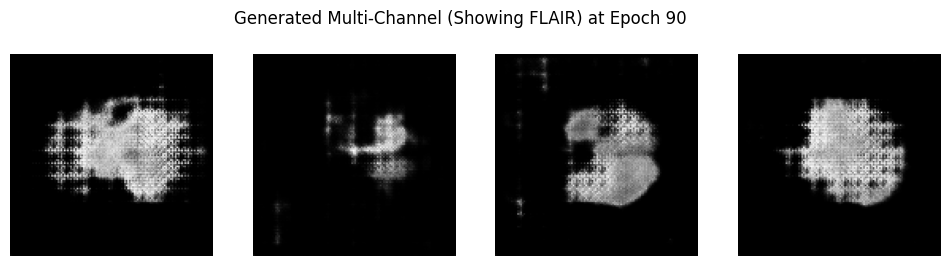

Epoch 91/1000
  Discriminator Loss: -18.8004 | Generator Loss: -38.4190 | D Accuracy: 0.7057
Epoch 92/1000
  Discriminator Loss: -20.7502 | Generator Loss: -42.4461 | D Accuracy: 0.7708
Epoch 93/1000
  Discriminator Loss: -18.6748 | Generator Loss: -21.2419 | D Accuracy: 0.7188
Epoch 94/1000
  Discriminator Loss: -21.1939 | Generator Loss: -15.1030 | D Accuracy: 0.7135
Epoch 95/1000
  Discriminator Loss: -22.9335 | Generator Loss: -39.9280 | D Accuracy: 0.7083
Epoch 96/1000
  Discriminator Loss: -17.0367 | Generator Loss: -26.8161 | D Accuracy: 0.6927
Epoch 97/1000
  Discriminator Loss: -17.1733 | Generator Loss: -34.3555 | D Accuracy: 0.6797
Epoch 98/1000
  Discriminator Loss: -21.2109 | Generator Loss: -26.5677 | D Accuracy: 0.7604
Epoch 99/1000
  Discriminator Loss: -16.3056 | Generator Loss: -69.5727 | D Accuracy: 0.7266
Epoch 100/1000
  Discriminator Loss: -17.0303 | Generator Loss: -25.0754 | D Accuracy: 0.7135


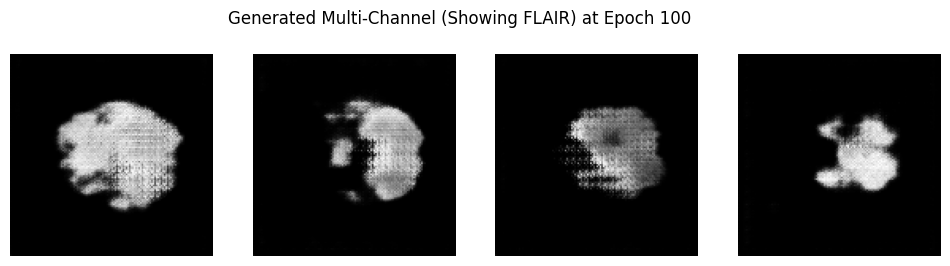

Epoch 101/1000
  Discriminator Loss: -24.6440 | Generator Loss: -68.4045 | D Accuracy: 0.7318
Epoch 102/1000
  Discriminator Loss: -19.7840 | Generator Loss: 3.8714 | D Accuracy: 0.7448
Epoch 103/1000
  Discriminator Loss: -25.9596 | Generator Loss: -54.2844 | D Accuracy: 0.7708
Epoch 104/1000
  Discriminator Loss: -21.6665 | Generator Loss: -41.8362 | D Accuracy: 0.6901
Epoch 105/1000
  Discriminator Loss: -19.9060 | Generator Loss: 19.1908 | D Accuracy: 0.7396
Epoch 106/1000
  Discriminator Loss: -18.0332 | Generator Loss: -71.2219 | D Accuracy: 0.7161
Epoch 107/1000
  Discriminator Loss: -21.6701 | Generator Loss: -19.5217 | D Accuracy: 0.7344
Epoch 108/1000
  Discriminator Loss: -18.7161 | Generator Loss: -81.9319 | D Accuracy: 0.7240
Epoch 109/1000
  Discriminator Loss: -18.5703 | Generator Loss: -88.9775 | D Accuracy: 0.7474
Epoch 110/1000
  Discriminator Loss: -19.0260 | Generator Loss: -36.5316 | D Accuracy: 0.7031


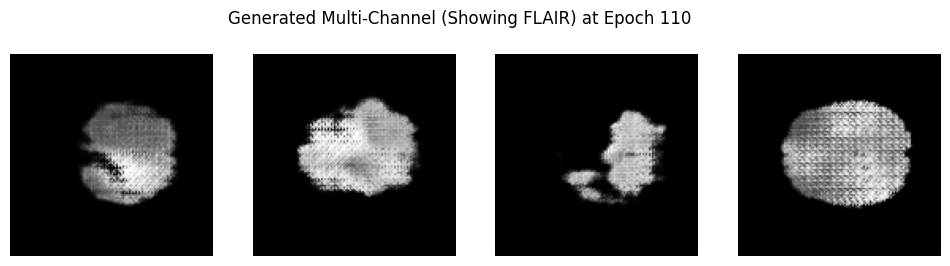

Epoch 111/1000
  Discriminator Loss: -16.7893 | Generator Loss: -30.0531 | D Accuracy: 0.6953
Epoch 112/1000
  Discriminator Loss: -16.8159 | Generator Loss: -25.9037 | D Accuracy: 0.6927
Epoch 113/1000
  Discriminator Loss: -15.6415 | Generator Loss: -64.4050 | D Accuracy: 0.7630
Epoch 114/1000
  Discriminator Loss: -19.2862 | Generator Loss: -46.3642 | D Accuracy: 0.7109
Epoch 115/1000
  Discriminator Loss: -17.7569 | Generator Loss: -59.4433 | D Accuracy: 0.7865
Epoch 116/1000
  Discriminator Loss: -19.9532 | Generator Loss: -56.6783 | D Accuracy: 0.6979
Epoch 117/1000
  Discriminator Loss: -21.9975 | Generator Loss: -59.9440 | D Accuracy: 0.7135
Epoch 118/1000
  Discriminator Loss: -15.4362 | Generator Loss: -38.1389 | D Accuracy: 0.7135
Epoch 119/1000
  Discriminator Loss: -17.2133 | Generator Loss: -80.6195 | D Accuracy: 0.7083
Epoch 120/1000
  Discriminator Loss: -17.8261 | Generator Loss: -21.2055 | D Accuracy: 0.7057


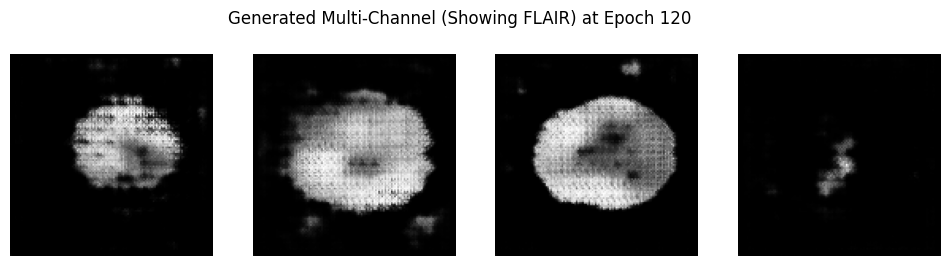

Epoch 121/1000
  Discriminator Loss: -25.8654 | Generator Loss: -54.4277 | D Accuracy: 0.7214
Epoch 122/1000
  Discriminator Loss: -25.2474 | Generator Loss: -107.6646 | D Accuracy: 0.6979
Epoch 123/1000
  Discriminator Loss: -18.8585 | Generator Loss: -39.2812 | D Accuracy: 0.6693
Epoch 124/1000
  Discriminator Loss: -17.7566 | Generator Loss: -58.2562 | D Accuracy: 0.7422
Epoch 125/1000
  Discriminator Loss: -15.9097 | Generator Loss: -56.4828 | D Accuracy: 0.7188
Epoch 126/1000
  Discriminator Loss: -17.0955 | Generator Loss: -61.9105 | D Accuracy: 0.6901
Epoch 127/1000
  Discriminator Loss: -19.5001 | Generator Loss: -11.6918 | D Accuracy: 0.7161
Epoch 128/1000
  Discriminator Loss: -20.8203 | Generator Loss: -52.2342 | D Accuracy: 0.6927
Epoch 129/1000
  Discriminator Loss: -17.3362 | Generator Loss: -41.4445 | D Accuracy: 0.7396
Epoch 130/1000
  Discriminator Loss: -16.4519 | Generator Loss: -75.7436 | D Accuracy: 0.6562


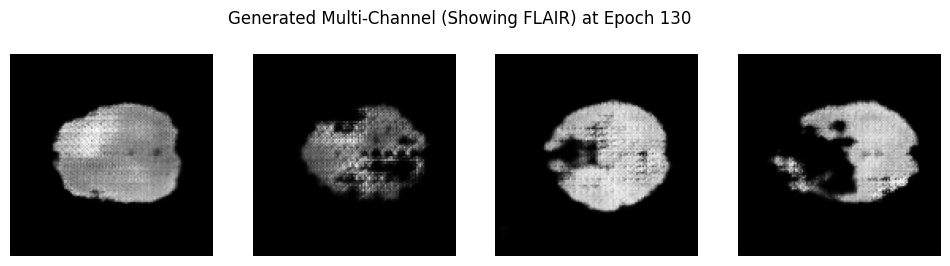

Epoch 131/1000
  Discriminator Loss: -17.5874 | Generator Loss: -39.7785 | D Accuracy: 0.6589
Epoch 132/1000
  Discriminator Loss: -21.3208 | Generator Loss: -34.4141 | D Accuracy: 0.7005
Epoch 133/1000
  Discriminator Loss: -17.1355 | Generator Loss: -83.0707 | D Accuracy: 0.6875
Epoch 134/1000
  Discriminator Loss: -18.5392 | Generator Loss: -15.5668 | D Accuracy: 0.7031
Epoch 135/1000
  Discriminator Loss: -16.8368 | Generator Loss: -61.1722 | D Accuracy: 0.7266
Epoch 136/1000
  Discriminator Loss: -14.9828 | Generator Loss: -70.0872 | D Accuracy: 0.7448
Epoch 137/1000
  Discriminator Loss: -17.2940 | Generator Loss: -38.8473 | D Accuracy: 0.7135
Epoch 138/1000
  Discriminator Loss: -16.9907 | Generator Loss: -71.2816 | D Accuracy: 0.6823
Epoch 139/1000
  Discriminator Loss: -17.1516 | Generator Loss: -13.5135 | D Accuracy: 0.7422
Epoch 140/1000
  Discriminator Loss: -23.2624 | Generator Loss: -0.8018 | D Accuracy: 0.6354


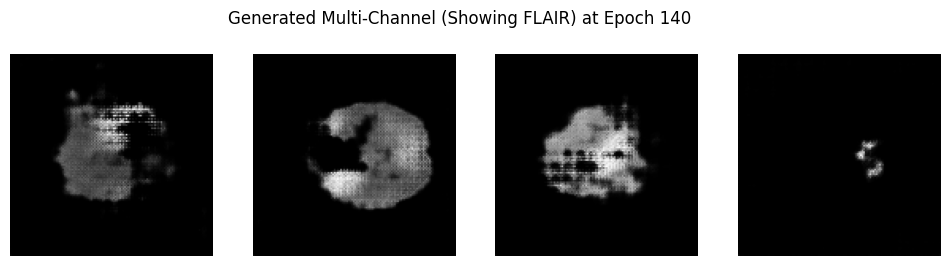

Epoch 141/1000
  Discriminator Loss: -18.0547 | Generator Loss: -66.2028 | D Accuracy: 0.7083
Epoch 142/1000
  Discriminator Loss: -18.6302 | Generator Loss: -63.1803 | D Accuracy: 0.6380
Epoch 143/1000
  Discriminator Loss: -15.8396 | Generator Loss: -31.0104 | D Accuracy: 0.6562
Epoch 144/1000
  Discriminator Loss: -16.0861 | Generator Loss: -84.1919 | D Accuracy: 0.7500
Epoch 145/1000
  Discriminator Loss: -23.9461 | Generator Loss: -64.4812 | D Accuracy: 0.6875
Epoch 146/1000
  Discriminator Loss: -19.4268 | Generator Loss: -60.5325 | D Accuracy: 0.7057
Epoch 147/1000
  Discriminator Loss: -15.7765 | Generator Loss: -26.5513 | D Accuracy: 0.7474
Epoch 148/1000
  Discriminator Loss: -15.5716 | Generator Loss: -63.2488 | D Accuracy: 0.7396
Epoch 149/1000
  Discriminator Loss: -19.8117 | Generator Loss: -84.7315 | D Accuracy: 0.7005
Epoch 150/1000
  Discriminator Loss: -15.6892 | Generator Loss: -27.0945 | D Accuracy: 0.6536


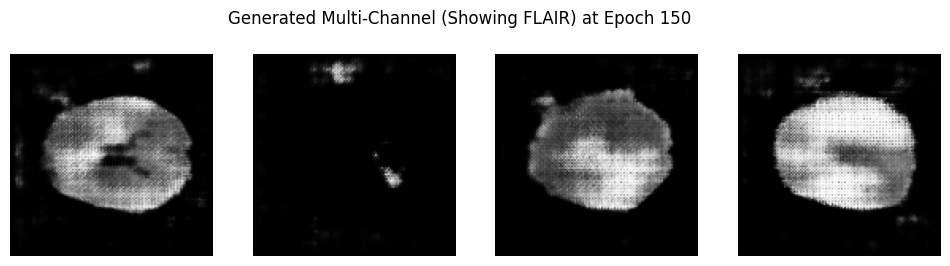

Epoch 151/1000
  Discriminator Loss: -17.6476 | Generator Loss: -30.1615 | D Accuracy: 0.7083
Epoch 152/1000
  Discriminator Loss: -15.3278 | Generator Loss: -79.3943 | D Accuracy: 0.7057
Epoch 153/1000
  Discriminator Loss: -15.1575 | Generator Loss: -84.7311 | D Accuracy: 0.6849
Epoch 154/1000
  Discriminator Loss: -18.2863 | Generator Loss: -60.4372 | D Accuracy: 0.7083
Epoch 155/1000
  Discriminator Loss: -15.1135 | Generator Loss: -34.9980 | D Accuracy: 0.6589
Epoch 156/1000
  Discriminator Loss: -22.0774 | Generator Loss: -69.6301 | D Accuracy: 0.6797
Epoch 157/1000
  Discriminator Loss: -11.7554 | Generator Loss: -44.1756 | D Accuracy: 0.6901
Epoch 158/1000
  Discriminator Loss: -15.1562 | Generator Loss: -75.8448 | D Accuracy: 0.6797
Epoch 159/1000
  Discriminator Loss: -15.6768 | Generator Loss: -27.0071 | D Accuracy: 0.7344
Epoch 160/1000
  Discriminator Loss: -20.8891 | Generator Loss: -97.8631 | D Accuracy: 0.6641


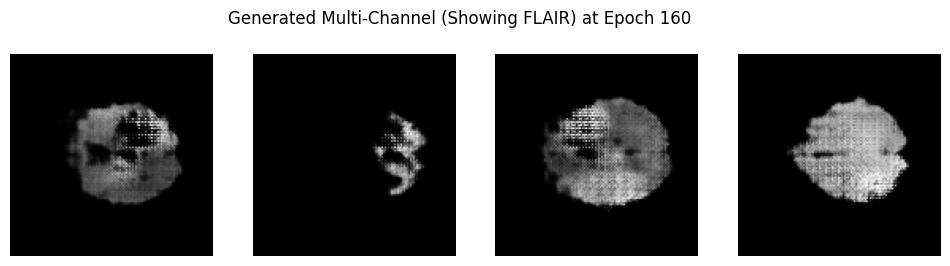

Epoch 161/1000
  Discriminator Loss: -21.7109 | Generator Loss: -72.0985 | D Accuracy: 0.6354
Epoch 162/1000
  Discriminator Loss: -16.2009 | Generator Loss: -4.9983 | D Accuracy: 0.6328
Epoch 163/1000
  Discriminator Loss: -15.7200 | Generator Loss: -72.0106 | D Accuracy: 0.6979
Epoch 164/1000
  Discriminator Loss: -14.9949 | Generator Loss: -88.7644 | D Accuracy: 0.6432
Epoch 165/1000
  Discriminator Loss: -20.9835 | Generator Loss: 13.4288 | D Accuracy: 0.7031
Epoch 166/1000
  Discriminator Loss: -19.9184 | Generator Loss: -67.1457 | D Accuracy: 0.6875
Epoch 167/1000
  Discriminator Loss: -12.8621 | Generator Loss: -70.7435 | D Accuracy: 0.7031
Epoch 168/1000
  Discriminator Loss: -12.7207 | Generator Loss: -82.5331 | D Accuracy: 0.6953
Epoch 169/1000
  Discriminator Loss: -17.2829 | Generator Loss: -69.9925 | D Accuracy: 0.6875
Epoch 170/1000
  Discriminator Loss: -15.7347 | Generator Loss: -50.6179 | D Accuracy: 0.7083


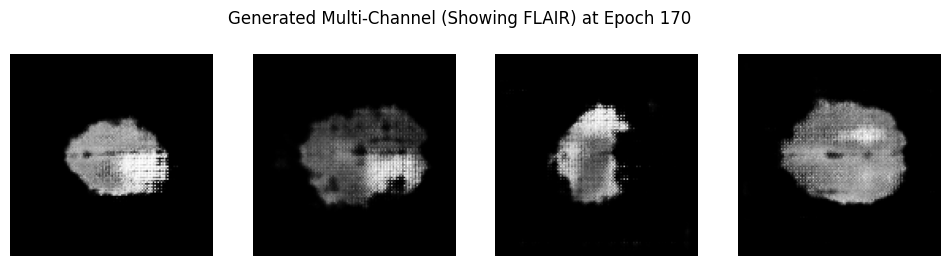

Epoch 171/1000
  Discriminator Loss: -14.4116 | Generator Loss: -84.8585 | D Accuracy: 0.6797
Epoch 172/1000
  Discriminator Loss: -16.9779 | Generator Loss: -75.3112 | D Accuracy: 0.7005
Epoch 173/1000
  Discriminator Loss: -19.3976 | Generator Loss: -29.0944 | D Accuracy: 0.6589
Epoch 174/1000
  Discriminator Loss: -15.9149 | Generator Loss: -26.3267 | D Accuracy: 0.7109
Epoch 175/1000
  Discriminator Loss: -14.7847 | Generator Loss: -70.9063 | D Accuracy: 0.6849
Epoch 176/1000
  Discriminator Loss: -12.9338 | Generator Loss: -68.6798 | D Accuracy: 0.7161
Epoch 177/1000
  Discriminator Loss: -15.5812 | Generator Loss: -32.0747 | D Accuracy: 0.6875
Epoch 178/1000
  Discriminator Loss: -14.2472 | Generator Loss: -80.1384 | D Accuracy: 0.7370
Epoch 179/1000
  Discriminator Loss: -14.3887 | Generator Loss: -39.2039 | D Accuracy: 0.7109
Epoch 180/1000
  Discriminator Loss: -19.4694 | Generator Loss: -83.4332 | D Accuracy: 0.6927


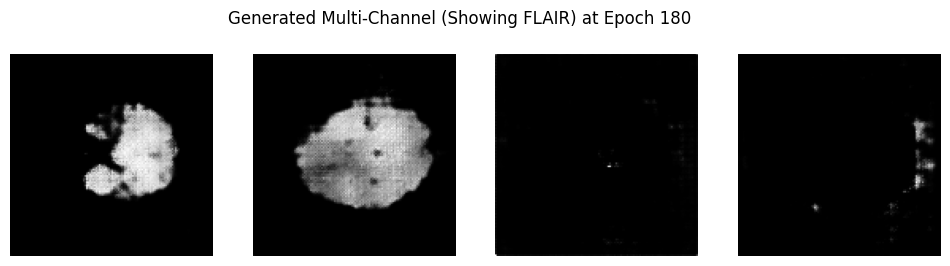

Epoch 181/1000
  Discriminator Loss: -19.4289 | Generator Loss: -93.8101 | D Accuracy: 0.7031
Epoch 182/1000
  Discriminator Loss: -13.3351 | Generator Loss: -78.4743 | D Accuracy: 0.7057
Epoch 183/1000
  Discriminator Loss: -14.5821 | Generator Loss: -56.2912 | D Accuracy: 0.6719
Epoch 184/1000
  Discriminator Loss: -14.3209 | Generator Loss: -75.0522 | D Accuracy: 0.7318
Epoch 185/1000
  Discriminator Loss: -18.0263 | Generator Loss: -25.3651 | D Accuracy: 0.7344
Epoch 186/1000
  Discriminator Loss: -18.1419 | Generator Loss: -135.6959 | D Accuracy: 0.7005
Epoch 187/1000
  Discriminator Loss: -13.5502 | Generator Loss: -40.7958 | D Accuracy: 0.6615
Epoch 188/1000
  Discriminator Loss: -18.6822 | Generator Loss: -56.7196 | D Accuracy: 0.6797
Epoch 189/1000
  Discriminator Loss: -17.8266 | Generator Loss: -48.7694 | D Accuracy: 0.6979
Epoch 190/1000
  Discriminator Loss: -15.3565 | Generator Loss: -80.2954 | D Accuracy: 0.7083


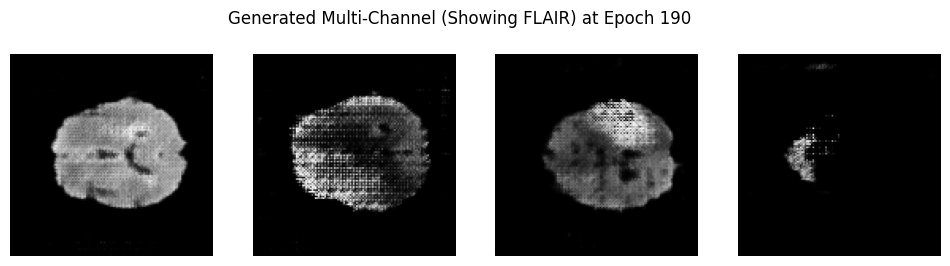

Epoch 191/1000
  Discriminator Loss: -12.2428 | Generator Loss: -82.3563 | D Accuracy: 0.6901
Epoch 192/1000
  Discriminator Loss: -17.2074 | Generator Loss: -14.2987 | D Accuracy: 0.6641
Epoch 193/1000
  Discriminator Loss: -13.0927 | Generator Loss: -84.8324 | D Accuracy: 0.6849
Epoch 194/1000
  Discriminator Loss: -16.5588 | Generator Loss: -68.3511 | D Accuracy: 0.7057
Epoch 195/1000
  Discriminator Loss: -13.5089 | Generator Loss: -46.7622 | D Accuracy: 0.6589
Epoch 196/1000
  Discriminator Loss: -20.2788 | Generator Loss: -46.1253 | D Accuracy: 0.7448
Epoch 197/1000
  Discriminator Loss: -13.8570 | Generator Loss: -30.3637 | D Accuracy: 0.6901
Epoch 198/1000
  Discriminator Loss: -18.8874 | Generator Loss: -86.7435 | D Accuracy: 0.6979
Epoch 199/1000
  Discriminator Loss: -21.2076 | Generator Loss: -61.2884 | D Accuracy: 0.6849
Epoch 200/1000
  Discriminator Loss: -15.1684 | Generator Loss: -96.1583 | D Accuracy: 0.6562


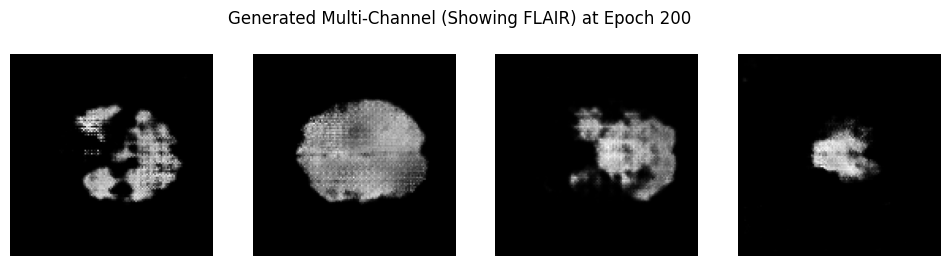

Epoch 201/1000
  Discriminator Loss: -18.2866 | Generator Loss: -58.3925 | D Accuracy: 0.6667
Epoch 202/1000
  Discriminator Loss: -15.1512 | Generator Loss: -48.6970 | D Accuracy: 0.6406
Epoch 203/1000
  Discriminator Loss: -12.3190 | Generator Loss: -70.7833 | D Accuracy: 0.6641
Epoch 204/1000
  Discriminator Loss: -15.9858 | Generator Loss: -58.5310 | D Accuracy: 0.6745
Epoch 205/1000
  Discriminator Loss: -21.9180 | Generator Loss: -78.0402 | D Accuracy: 0.6432
Epoch 206/1000
  Discriminator Loss: -15.7153 | Generator Loss: -42.9507 | D Accuracy: 0.6693
Epoch 207/1000
  Discriminator Loss: -14.0583 | Generator Loss: -31.8596 | D Accuracy: 0.6979
Epoch 208/1000
  Discriminator Loss: -13.2670 | Generator Loss: -68.4723 | D Accuracy: 0.6771
Epoch 209/1000
  Discriminator Loss: -15.5137 | Generator Loss: -44.2582 | D Accuracy: 0.6979
Epoch 210/1000
  Discriminator Loss: -18.3945 | Generator Loss: -74.9862 | D Accuracy: 0.6953


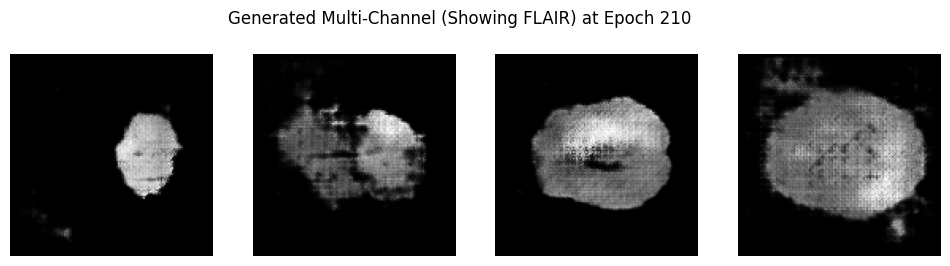

Epoch 211/1000
  Discriminator Loss: -17.9988 | Generator Loss: -78.1246 | D Accuracy: 0.6667
Epoch 212/1000
  Discriminator Loss: -15.0965 | Generator Loss: -62.6064 | D Accuracy: 0.7005
Epoch 213/1000
  Discriminator Loss: -18.8797 | Generator Loss: -26.9390 | D Accuracy: 0.6354
Epoch 214/1000
  Discriminator Loss: -21.1564 | Generator Loss: -78.9123 | D Accuracy: 0.6979
Epoch 215/1000
  Discriminator Loss: -14.1875 | Generator Loss: -11.1212 | D Accuracy: 0.6458
Epoch 216/1000
  Discriminator Loss: -18.3989 | Generator Loss: -28.7334 | D Accuracy: 0.7109
Epoch 217/1000
  Discriminator Loss: -21.5780 | Generator Loss: 0.8117 | D Accuracy: 0.6615
Epoch 218/1000
  Discriminator Loss: -15.1257 | Generator Loss: -35.8489 | D Accuracy: 0.7057
Epoch 219/1000
  Discriminator Loss: -11.1095 | Generator Loss: -58.8554 | D Accuracy: 0.6875
Epoch 220/1000
  Discriminator Loss: -15.3491 | Generator Loss: -24.6597 | D Accuracy: 0.6875


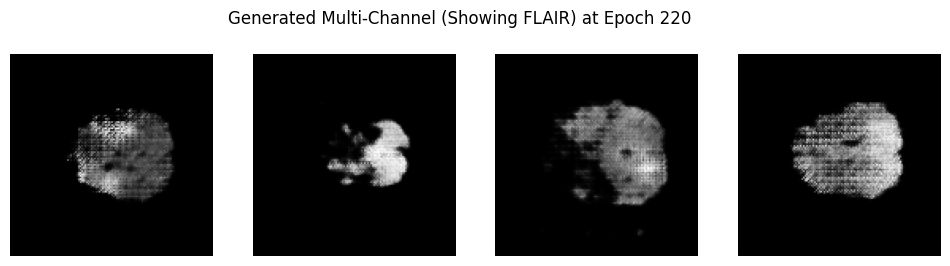

Epoch 221/1000
  Discriminator Loss: -13.7200 | Generator Loss: -76.0322 | D Accuracy: 0.7396
Epoch 222/1000
  Discriminator Loss: -14.6735 | Generator Loss: -51.9966 | D Accuracy: 0.6667
Epoch 223/1000
  Discriminator Loss: -14.5194 | Generator Loss: -28.7250 | D Accuracy: 0.6849
Epoch 224/1000
  Discriminator Loss: -17.1063 | Generator Loss: -17.8596 | D Accuracy: 0.7292
Epoch 225/1000
  Discriminator Loss: -14.4629 | Generator Loss: -110.7608 | D Accuracy: 0.7214
Epoch 226/1000
  Discriminator Loss: -16.2280 | Generator Loss: -60.6130 | D Accuracy: 0.6693
Epoch 227/1000
  Discriminator Loss: -14.3253 | Generator Loss: -58.3559 | D Accuracy: 0.6719
Epoch 228/1000
  Discriminator Loss: -14.5934 | Generator Loss: -32.6628 | D Accuracy: 0.7135
Epoch 229/1000
  Discriminator Loss: -13.2415 | Generator Loss: -6.8359 | D Accuracy: 0.7057
Epoch 230/1000
  Discriminator Loss: -15.2878 | Generator Loss: -49.6248 | D Accuracy: 0.7266


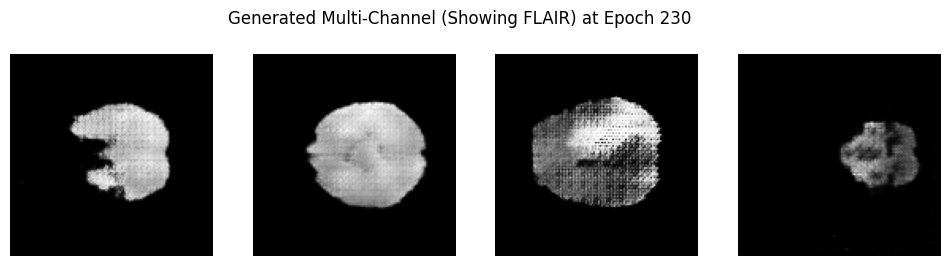

Epoch 231/1000
  Discriminator Loss: -16.7170 | Generator Loss: -40.9280 | D Accuracy: 0.7161
Epoch 232/1000
  Discriminator Loss: -14.3707 | Generator Loss: -12.5932 | D Accuracy: 0.6380
Epoch 233/1000
  Discriminator Loss: -16.6346 | Generator Loss: -95.6290 | D Accuracy: 0.7188
Epoch 234/1000
  Discriminator Loss: -12.9702 | Generator Loss: -24.2582 | D Accuracy: 0.6979
Epoch 235/1000
  Discriminator Loss: -13.5781 | Generator Loss: -58.9011 | D Accuracy: 0.7188
Epoch 236/1000
  Discriminator Loss: -14.8680 | Generator Loss: -48.0066 | D Accuracy: 0.6589
Epoch 237/1000
  Discriminator Loss: -12.1963 | Generator Loss: -22.6897 | D Accuracy: 0.6406
Epoch 238/1000
  Discriminator Loss: -14.7104 | Generator Loss: -47.1874 | D Accuracy: 0.6745
Epoch 239/1000
  Discriminator Loss: -19.1780 | Generator Loss: -75.3179 | D Accuracy: 0.6797
Epoch 240/1000
  Discriminator Loss: -12.7422 | Generator Loss: -26.6383 | D Accuracy: 0.7188


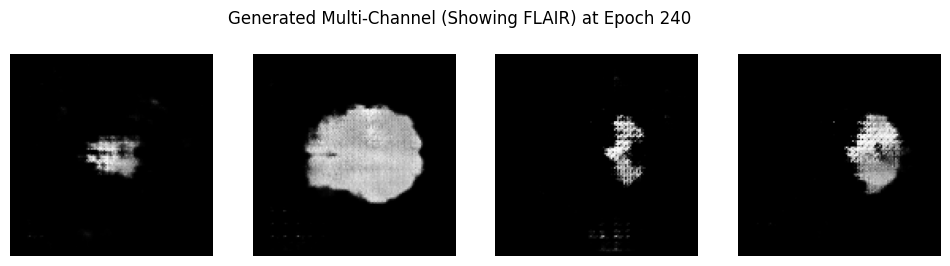

Epoch 241/1000
  Discriminator Loss: -12.7613 | Generator Loss: -82.7883 | D Accuracy: 0.7422
Epoch 242/1000
  Discriminator Loss: -15.7886 | Generator Loss: -82.6152 | D Accuracy: 0.7161
Epoch 243/1000
  Discriminator Loss: -11.7964 | Generator Loss: -70.4087 | D Accuracy: 0.6901
Epoch 244/1000
  Discriminator Loss: -14.8701 | Generator Loss: -66.8344 | D Accuracy: 0.6693
Epoch 245/1000
  Discriminator Loss: -15.0083 | Generator Loss: -47.8834 | D Accuracy: 0.7057
Epoch 246/1000
  Discriminator Loss: -17.5792 | Generator Loss: -80.0380 | D Accuracy: 0.6589
Epoch 247/1000
  Discriminator Loss: -13.4812 | Generator Loss: -40.3436 | D Accuracy: 0.6380
Epoch 248/1000
  Discriminator Loss: -13.8276 | Generator Loss: -28.9286 | D Accuracy: 0.7161
Epoch 249/1000
  Discriminator Loss: -12.5040 | Generator Loss: -25.6327 | D Accuracy: 0.7214
Epoch 250/1000
  Discriminator Loss: -15.0349 | Generator Loss: -89.5144 | D Accuracy: 0.7005


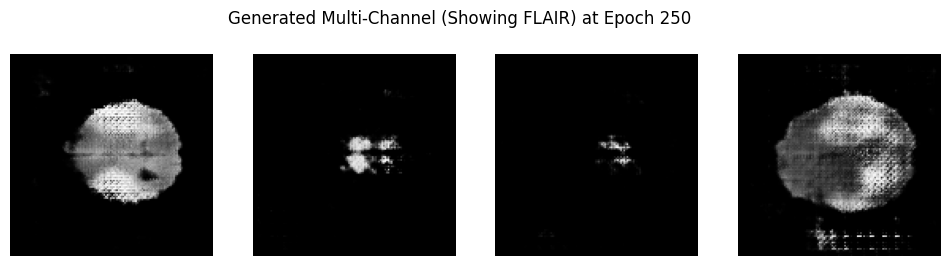

Epoch 251/1000
  Discriminator Loss: -17.7430 | Generator Loss: -51.3435 | D Accuracy: 0.6745
Epoch 252/1000
  Discriminator Loss: -15.7859 | Generator Loss: -24.3669 | D Accuracy: 0.6536
Epoch 253/1000
  Discriminator Loss: -13.9736 | Generator Loss: -1.4309 | D Accuracy: 0.6562
Epoch 254/1000
  Discriminator Loss: -15.9829 | Generator Loss: -86.2880 | D Accuracy: 0.7057
Epoch 255/1000
  Discriminator Loss: -12.9444 | Generator Loss: -59.9499 | D Accuracy: 0.6797
Epoch 256/1000
  Discriminator Loss: -13.7084 | Generator Loss: -71.8672 | D Accuracy: 0.6693
Epoch 257/1000
  Discriminator Loss: -13.4356 | Generator Loss: -54.7694 | D Accuracy: 0.6641
Epoch 258/1000
  Discriminator Loss: -11.8597 | Generator Loss: -64.0914 | D Accuracy: 0.6849
Epoch 259/1000
  Discriminator Loss: -14.7920 | Generator Loss: -39.0376 | D Accuracy: 0.7240
Epoch 260/1000
  Discriminator Loss: -12.1210 | Generator Loss: -67.2203 | D Accuracy: 0.6406


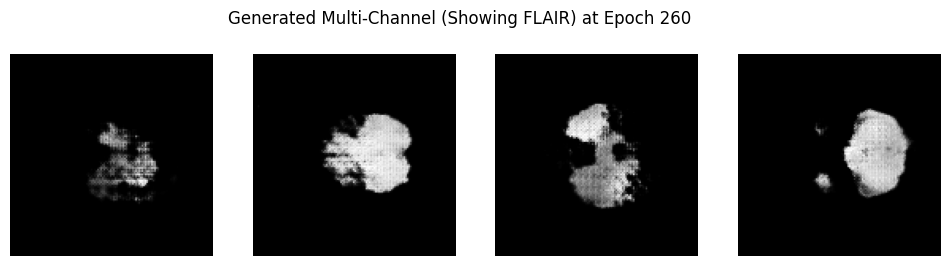

Epoch 261/1000
  Discriminator Loss: -12.6671 | Generator Loss: -47.6530 | D Accuracy: 0.6667
Epoch 262/1000
  Discriminator Loss: -18.3939 | Generator Loss: -27.9988 | D Accuracy: 0.6406
Epoch 263/1000
  Discriminator Loss: -14.2054 | Generator Loss: -28.7566 | D Accuracy: 0.7161
Epoch 264/1000
  Discriminator Loss: -18.1587 | Generator Loss: -24.7490 | D Accuracy: 0.6849
Epoch 265/1000
  Discriminator Loss: -14.0776 | Generator Loss: -70.7206 | D Accuracy: 0.6536
Epoch 266/1000
  Discriminator Loss: -16.0860 | Generator Loss: -49.2361 | D Accuracy: 0.6615
Epoch 267/1000
  Discriminator Loss: -16.6545 | Generator Loss: -57.2590 | D Accuracy: 0.7318
Epoch 268/1000
  Discriminator Loss: -17.5723 | Generator Loss: -52.6882 | D Accuracy: 0.6302
Epoch 269/1000
  Discriminator Loss: -11.8963 | Generator Loss: -81.3323 | D Accuracy: 0.6901
Epoch 270/1000
  Discriminator Loss: -15.4037 | Generator Loss: -39.5044 | D Accuracy: 0.6198


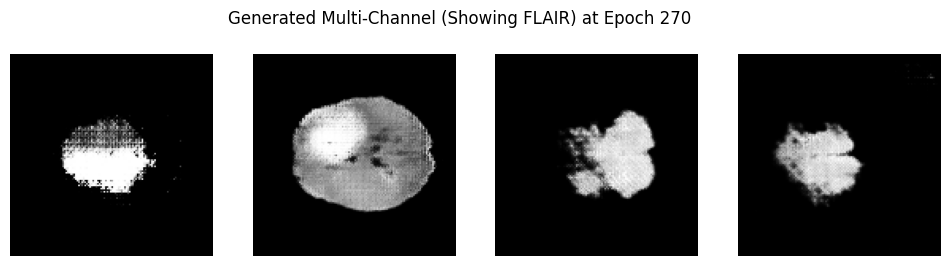

Epoch 271/1000
  Discriminator Loss: -13.7882 | Generator Loss: -39.6705 | D Accuracy: 0.6641
Epoch 272/1000
  Discriminator Loss: -16.1354 | Generator Loss: -13.7702 | D Accuracy: 0.6849
Epoch 273/1000
  Discriminator Loss: -12.9524 | Generator Loss: -94.9544 | D Accuracy: 0.6380
Epoch 274/1000
  Discriminator Loss: -13.3222 | Generator Loss: -102.0563 | D Accuracy: 0.6615
Epoch 275/1000
  Discriminator Loss: -13.8624 | Generator Loss: -90.7963 | D Accuracy: 0.6797
Epoch 276/1000
  Discriminator Loss: -19.3182 | Generator Loss: -41.1694 | D Accuracy: 0.6745
Epoch 277/1000
  Discriminator Loss: -12.0292 | Generator Loss: 52.9105 | D Accuracy: 0.7214
Epoch 278/1000
  Discriminator Loss: -14.4205 | Generator Loss: -21.7059 | D Accuracy: 0.6641
Epoch 279/1000
  Discriminator Loss: -11.8389 | Generator Loss: -16.3308 | D Accuracy: 0.7188
Epoch 280/1000
  Discriminator Loss: -14.0329 | Generator Loss: -29.5686 | D Accuracy: 0.6641


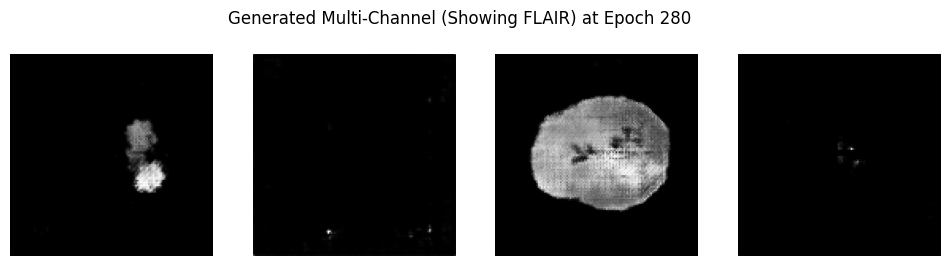

Epoch 281/1000
  Discriminator Loss: -15.3235 | Generator Loss: -1.0387 | D Accuracy: 0.6927
Epoch 282/1000
  Discriminator Loss: -13.1664 | Generator Loss: -73.8894 | D Accuracy: 0.7031
Epoch 283/1000
  Discriminator Loss: -18.4927 | Generator Loss: -51.8390 | D Accuracy: 0.7292
Epoch 284/1000
  Discriminator Loss: -15.7545 | Generator Loss: -24.7543 | D Accuracy: 0.6354
Epoch 285/1000
  Discriminator Loss: -13.2589 | Generator Loss: -47.7769 | D Accuracy: 0.6797
Epoch 286/1000
  Discriminator Loss: -17.3604 | Generator Loss: -137.9558 | D Accuracy: 0.6667
Epoch 287/1000
  Discriminator Loss: -10.7532 | Generator Loss: -59.2988 | D Accuracy: 0.6589
Epoch 288/1000
  Discriminator Loss: -10.5836 | Generator Loss: -20.1471 | D Accuracy: 0.7266
Epoch 289/1000
  Discriminator Loss: -10.8371 | Generator Loss: 1.0459 | D Accuracy: 0.7057
Epoch 290/1000
  Discriminator Loss: -13.8910 | Generator Loss: -35.7356 | D Accuracy: 0.6276


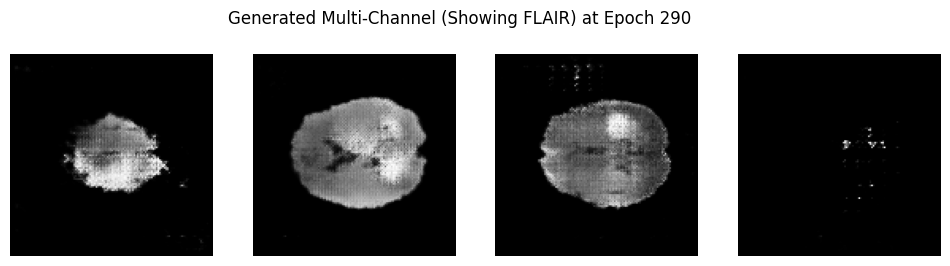

Epoch 291/1000
  Discriminator Loss: -14.8936 | Generator Loss: -34.3537 | D Accuracy: 0.6771
Epoch 292/1000
  Discriminator Loss: -11.6449 | Generator Loss: -11.0841 | D Accuracy: 0.6667
Epoch 293/1000
  Discriminator Loss: -19.5206 | Generator Loss: -4.5990 | D Accuracy: 0.6953
Epoch 294/1000
  Discriminator Loss: -12.9604 | Generator Loss: 14.0065 | D Accuracy: 0.6641
Epoch 295/1000
  Discriminator Loss: -14.2375 | Generator Loss: -41.4987 | D Accuracy: 0.7266
Epoch 296/1000
  Discriminator Loss: -12.7390 | Generator Loss: -90.0187 | D Accuracy: 0.6536
Epoch 297/1000
  Discriminator Loss: -18.7259 | Generator Loss: -47.5817 | D Accuracy: 0.6667
Epoch 298/1000
  Discriminator Loss: -12.7928 | Generator Loss: -39.9585 | D Accuracy: 0.6745
Epoch 299/1000
  Discriminator Loss: -11.5954 | Generator Loss: -50.0263 | D Accuracy: 0.6745
Epoch 300/1000
  Discriminator Loss: -14.3568 | Generator Loss: -93.5877 | D Accuracy: 0.6719


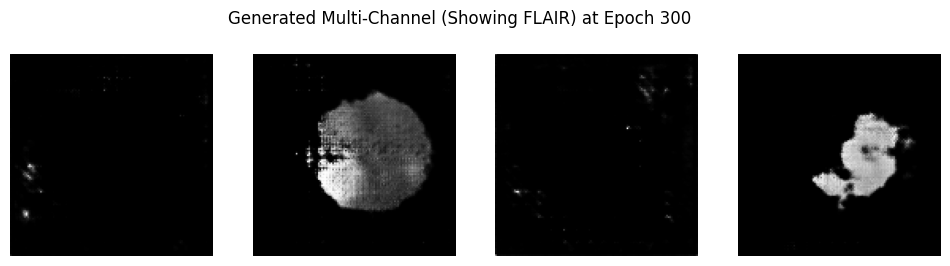

Epoch 301/1000
  Discriminator Loss: -15.1000 | Generator Loss: -75.2044 | D Accuracy: 0.6875
Epoch 302/1000
  Discriminator Loss: -13.1541 | Generator Loss: -43.2967 | D Accuracy: 0.6797
Epoch 303/1000
  Discriminator Loss: -12.4848 | Generator Loss: -55.7684 | D Accuracy: 0.6901
Epoch 304/1000
  Discriminator Loss: -14.8832 | Generator Loss: -17.4013 | D Accuracy: 0.6328
Epoch 305/1000
  Discriminator Loss: -12.2582 | Generator Loss: -49.7238 | D Accuracy: 0.6458
Epoch 306/1000
  Discriminator Loss: -15.7095 | Generator Loss: -51.8164 | D Accuracy: 0.7188
Epoch 307/1000
  Discriminator Loss: -13.0916 | Generator Loss: -15.0467 | D Accuracy: 0.6849
Epoch 308/1000
  Discriminator Loss: -14.6551 | Generator Loss: -59.2548 | D Accuracy: 0.7240
Epoch 309/1000
  Discriminator Loss: -12.5800 | Generator Loss: -32.3526 | D Accuracy: 0.6849
Epoch 310/1000
  Discriminator Loss: -14.7036 | Generator Loss: -66.4882 | D Accuracy: 0.7214


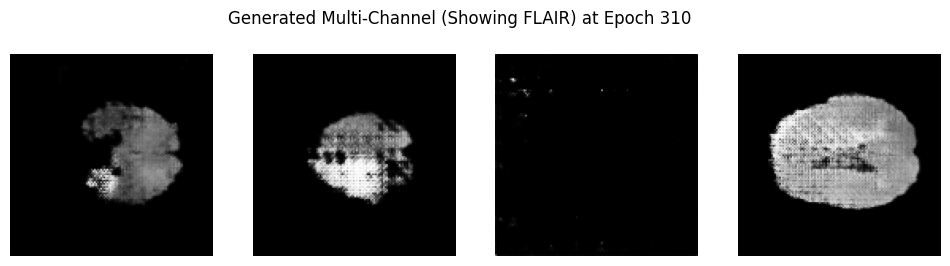

Epoch 311/1000
  Discriminator Loss: -13.6277 | Generator Loss: 2.4161 | D Accuracy: 0.6380
Epoch 312/1000
  Discriminator Loss: -12.1253 | Generator Loss: -52.6087 | D Accuracy: 0.7318
Epoch 313/1000
  Discriminator Loss: -12.7858 | Generator Loss: -63.7364 | D Accuracy: 0.7083
Epoch 314/1000
  Discriminator Loss: -16.3629 | Generator Loss: -79.3452 | D Accuracy: 0.6641
Epoch 315/1000
  Discriminator Loss: -14.8959 | Generator Loss: 6.5518 | D Accuracy: 0.6953
Epoch 316/1000
  Discriminator Loss: -15.2778 | Generator Loss: -37.5749 | D Accuracy: 0.7344
Epoch 317/1000
  Discriminator Loss: -17.3360 | Generator Loss: -18.6266 | D Accuracy: 0.6797
Epoch 318/1000
  Discriminator Loss: -14.3233 | Generator Loss: -45.6529 | D Accuracy: 0.6328
Epoch 319/1000
  Discriminator Loss: -14.3757 | Generator Loss: -53.3609 | D Accuracy: 0.6849
Epoch 320/1000
  Discriminator Loss: -13.5050 | Generator Loss: -30.8867 | D Accuracy: 0.7161


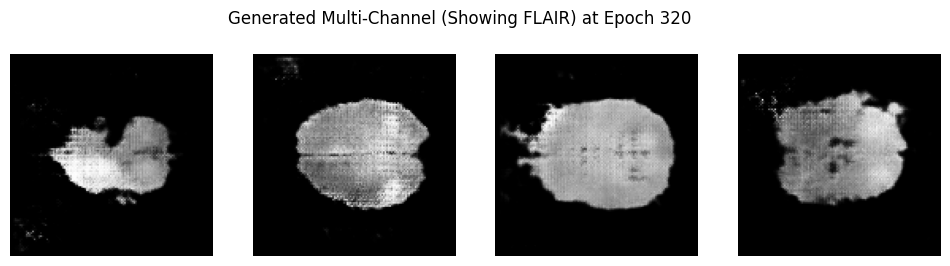

Epoch 321/1000
  Discriminator Loss: -14.7015 | Generator Loss: -79.2553 | D Accuracy: 0.6302
Epoch 322/1000
  Discriminator Loss: -16.7568 | Generator Loss: -22.5923 | D Accuracy: 0.6693
Epoch 323/1000
  Discriminator Loss: -11.4652 | Generator Loss: -40.5928 | D Accuracy: 0.6484
Epoch 324/1000
  Discriminator Loss: -11.1096 | Generator Loss: -29.8176 | D Accuracy: 0.7578
Epoch 325/1000
  Discriminator Loss: -12.2936 | Generator Loss: -36.5914 | D Accuracy: 0.7135
Epoch 326/1000
  Discriminator Loss: -16.0136 | Generator Loss: -41.1479 | D Accuracy: 0.7370
Epoch 327/1000
  Discriminator Loss: -15.9647 | Generator Loss: -30.5850 | D Accuracy: 0.6510
Epoch 328/1000
  Discriminator Loss: -13.2693 | Generator Loss: -29.8785 | D Accuracy: 0.6953
Epoch 329/1000
  Discriminator Loss: -15.1197 | Generator Loss: -77.3191 | D Accuracy: 0.6927
Epoch 330/1000
  Discriminator Loss: -13.5820 | Generator Loss: -23.3654 | D Accuracy: 0.6771


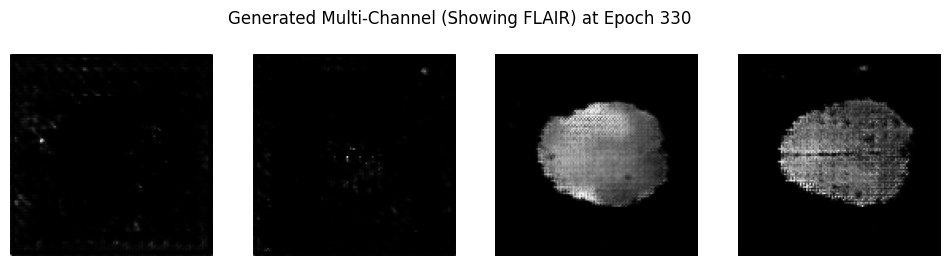

Epoch 331/1000
  Discriminator Loss: -12.3622 | Generator Loss: -34.1482 | D Accuracy: 0.7031
Epoch 332/1000
  Discriminator Loss: -15.8481 | Generator Loss: -94.0882 | D Accuracy: 0.6458
Epoch 333/1000
  Discriminator Loss: -14.0909 | Generator Loss: -49.9714 | D Accuracy: 0.6693
Epoch 334/1000
  Discriminator Loss: -17.1068 | Generator Loss: -73.8344 | D Accuracy: 0.6536
Epoch 335/1000
  Discriminator Loss: -15.0382 | Generator Loss: -11.1611 | D Accuracy: 0.7057
Epoch 336/1000
  Discriminator Loss: -12.6605 | Generator Loss: -94.6446 | D Accuracy: 0.6823
Epoch 337/1000
  Discriminator Loss: -14.8326 | Generator Loss: -78.6403 | D Accuracy: 0.6797
Epoch 338/1000
  Discriminator Loss: -15.1933 | Generator Loss: 10.7591 | D Accuracy: 0.6615
Epoch 339/1000
  Discriminator Loss: -12.0175 | Generator Loss: -70.4214 | D Accuracy: 0.6198
Epoch 340/1000
  Discriminator Loss: -10.8867 | Generator Loss: -23.8325 | D Accuracy: 0.7266


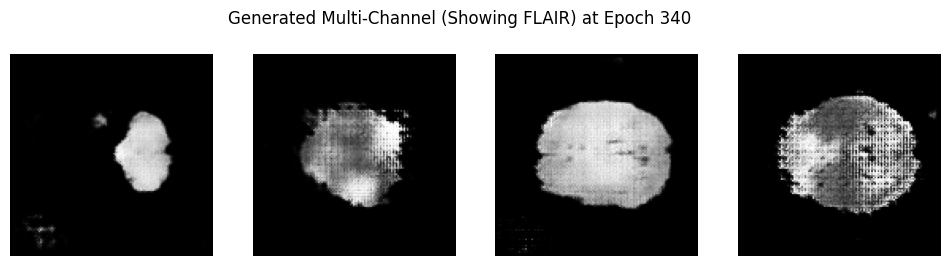

Epoch 341/1000
  Discriminator Loss: -13.1631 | Generator Loss: -37.8591 | D Accuracy: 0.7422
Epoch 342/1000
  Discriminator Loss: -14.0244 | Generator Loss: -46.3807 | D Accuracy: 0.7500
Epoch 343/1000
  Discriminator Loss: -14.1231 | Generator Loss: -58.5507 | D Accuracy: 0.6432
Epoch 344/1000
  Discriminator Loss: -12.5719 | Generator Loss: -32.1026 | D Accuracy: 0.7057
Epoch 345/1000
  Discriminator Loss: -14.7972 | Generator Loss: -28.8646 | D Accuracy: 0.6510
Epoch 346/1000
  Discriminator Loss: -12.7231 | Generator Loss: -20.4517 | D Accuracy: 0.7266
Epoch 347/1000
  Discriminator Loss: -18.3775 | Generator Loss: -68.7132 | D Accuracy: 0.6536
Epoch 348/1000
  Discriminator Loss: -15.1172 | Generator Loss: -6.5142 | D Accuracy: 0.6745
Epoch 349/1000
  Discriminator Loss: -15.9258 | Generator Loss: -66.9713 | D Accuracy: 0.6719
Epoch 350/1000
  Discriminator Loss: -10.9235 | Generator Loss: -41.1099 | D Accuracy: 0.6406


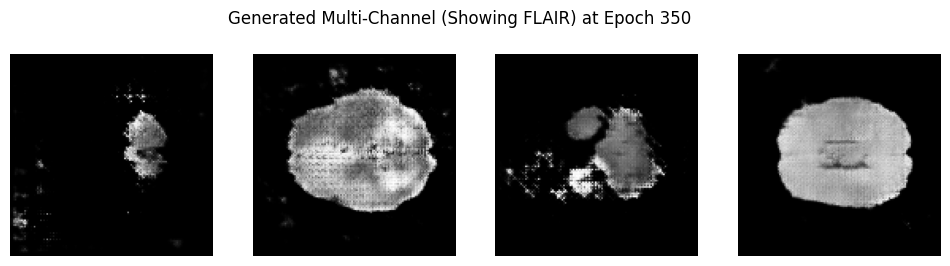

Epoch 351/1000
  Discriminator Loss: -15.2250 | Generator Loss: -78.8649 | D Accuracy: 0.6745
Epoch 352/1000
  Discriminator Loss: -16.4748 | Generator Loss: -26.3070 | D Accuracy: 0.7109
Epoch 353/1000
  Discriminator Loss: -15.1080 | Generator Loss: -50.6851 | D Accuracy: 0.6615
Epoch 354/1000
  Discriminator Loss: -15.1824 | Generator Loss: -56.4102 | D Accuracy: 0.6354
Epoch 355/1000
  Discriminator Loss: -13.7910 | Generator Loss: -74.7717 | D Accuracy: 0.6562
Epoch 356/1000
  Discriminator Loss: -12.6694 | Generator Loss: -47.5752 | D Accuracy: 0.6875
Epoch 357/1000
  Discriminator Loss: -14.8590 | Generator Loss: -46.5241 | D Accuracy: 0.6536
Epoch 358/1000
  Discriminator Loss: -10.4322 | Generator Loss: -15.8292 | D Accuracy: 0.6875
Epoch 359/1000
  Discriminator Loss: -13.8074 | Generator Loss: -28.5396 | D Accuracy: 0.7005
Epoch 360/1000
  Discriminator Loss: -11.1441 | Generator Loss: -80.6137 | D Accuracy: 0.7057


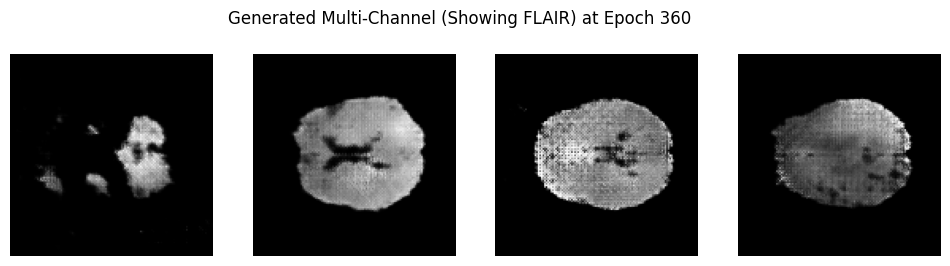

Epoch 361/1000
  Discriminator Loss: -14.0276 | Generator Loss: -56.6108 | D Accuracy: 0.6823
Epoch 362/1000
  Discriminator Loss: -10.5579 | Generator Loss: -35.3060 | D Accuracy: 0.7188
Epoch 363/1000
  Discriminator Loss: -12.9987 | Generator Loss: 14.4015 | D Accuracy: 0.7109
Epoch 364/1000
  Discriminator Loss: -14.1500 | Generator Loss: -10.8653 | D Accuracy: 0.7240
Epoch 365/1000
  Discriminator Loss: -16.6540 | Generator Loss: -39.5932 | D Accuracy: 0.6641
Epoch 366/1000
  Discriminator Loss: -11.8566 | Generator Loss: -36.1003 | D Accuracy: 0.7188
Epoch 367/1000
  Discriminator Loss: -13.5455 | Generator Loss: -43.8786 | D Accuracy: 0.7188
Epoch 368/1000
  Discriminator Loss: -13.0058 | Generator Loss: -37.2514 | D Accuracy: 0.7057
Epoch 369/1000
  Discriminator Loss: -12.4618 | Generator Loss: -38.2273 | D Accuracy: 0.7188
Epoch 370/1000
  Discriminator Loss: -18.6851 | Generator Loss: -41.7610 | D Accuracy: 0.7057


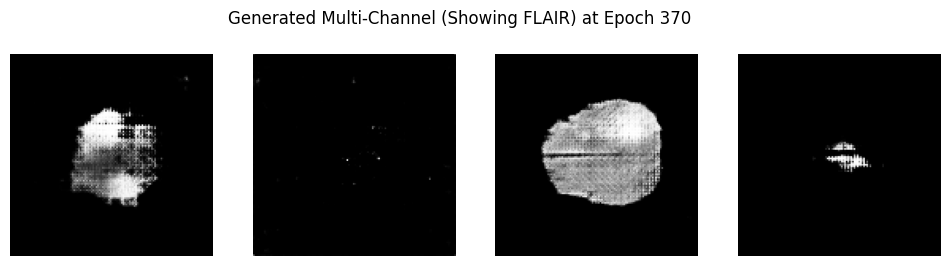

Epoch 371/1000
  Discriminator Loss: -13.5482 | Generator Loss: -92.6621 | D Accuracy: 0.6719
Epoch 372/1000
  Discriminator Loss: -14.5925 | Generator Loss: -54.5271 | D Accuracy: 0.6745
Epoch 373/1000
  Discriminator Loss: -16.0926 | Generator Loss: -31.1496 | D Accuracy: 0.6745
Epoch 374/1000
  Discriminator Loss: -19.3694 | Generator Loss: -24.8054 | D Accuracy: 0.6875
Epoch 375/1000
  Discriminator Loss: -13.8635 | Generator Loss: 2.5942 | D Accuracy: 0.6667
Epoch 376/1000
  Discriminator Loss: -12.6673 | Generator Loss: -61.3664 | D Accuracy: 0.6771
Epoch 377/1000
  Discriminator Loss: -15.1362 | Generator Loss: -5.1763 | D Accuracy: 0.6328
Epoch 378/1000
  Discriminator Loss: -11.3348 | Generator Loss: -58.7253 | D Accuracy: 0.7188
Epoch 379/1000
  Discriminator Loss: -13.3336 | Generator Loss: -47.2483 | D Accuracy: 0.7500
Epoch 380/1000
  Discriminator Loss: -13.5697 | Generator Loss: -34.8552 | D Accuracy: 0.6589


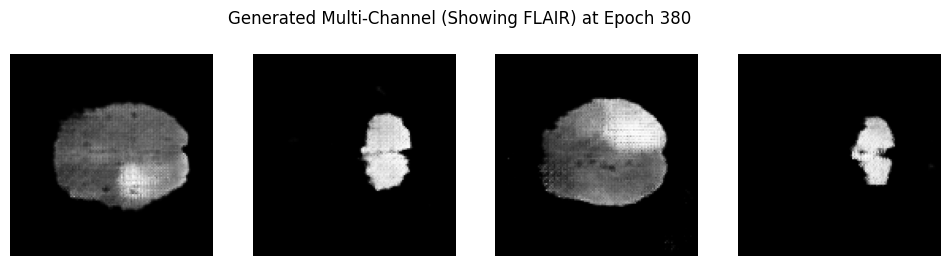

Epoch 381/1000
  Discriminator Loss: -15.3418 | Generator Loss: -19.9333 | D Accuracy: 0.7422
Epoch 382/1000
  Discriminator Loss: -10.1632 | Generator Loss: -48.9625 | D Accuracy: 0.7135
Epoch 383/1000
  Discriminator Loss: -12.0161 | Generator Loss: -47.3769 | D Accuracy: 0.6745
Epoch 384/1000
  Discriminator Loss: -12.7562 | Generator Loss: -6.9034 | D Accuracy: 0.6484
Epoch 385/1000
  Discriminator Loss: -14.2061 | Generator Loss: -52.3254 | D Accuracy: 0.7318
Epoch 386/1000
  Discriminator Loss: -14.4132 | Generator Loss: -19.4659 | D Accuracy: 0.6875
Epoch 387/1000
  Discriminator Loss: -11.9275 | Generator Loss: -42.6403 | D Accuracy: 0.7240
Epoch 388/1000
  Discriminator Loss: -15.8633 | Generator Loss: -43.2267 | D Accuracy: 0.6797
Epoch 389/1000
  Discriminator Loss: -16.4476 | Generator Loss: -36.7785 | D Accuracy: 0.6484
Epoch 390/1000
  Discriminator Loss: -13.2344 | Generator Loss: -21.0357 | D Accuracy: 0.6562


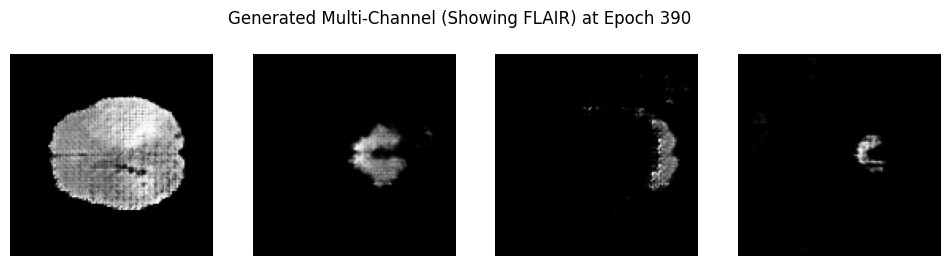

Epoch 391/1000
  Discriminator Loss: -13.7989 | Generator Loss: -24.9629 | D Accuracy: 0.7057
Epoch 392/1000
  Discriminator Loss: -13.6054 | Generator Loss: -50.5827 | D Accuracy: 0.6641
Epoch 393/1000
  Discriminator Loss: -16.0647 | Generator Loss: -29.9939 | D Accuracy: 0.7292
Epoch 394/1000
  Discriminator Loss: -10.0447 | Generator Loss: -26.7687 | D Accuracy: 0.6823
Epoch 395/1000
  Discriminator Loss: -11.9234 | Generator Loss: -39.6508 | D Accuracy: 0.7214
Epoch 396/1000
  Discriminator Loss: -12.4169 | Generator Loss: -33.1473 | D Accuracy: 0.7422
Epoch 397/1000
  Discriminator Loss: -11.7786 | Generator Loss: -49.7970 | D Accuracy: 0.6484
Epoch 398/1000
  Discriminator Loss: -13.9616 | Generator Loss: -61.2875 | D Accuracy: 0.6875
Epoch 399/1000
  Discriminator Loss: -11.9406 | Generator Loss: -36.9626 | D Accuracy: 0.7578
Epoch 400/1000
  Discriminator Loss: -12.9690 | Generator Loss: -52.3756 | D Accuracy: 0.7214


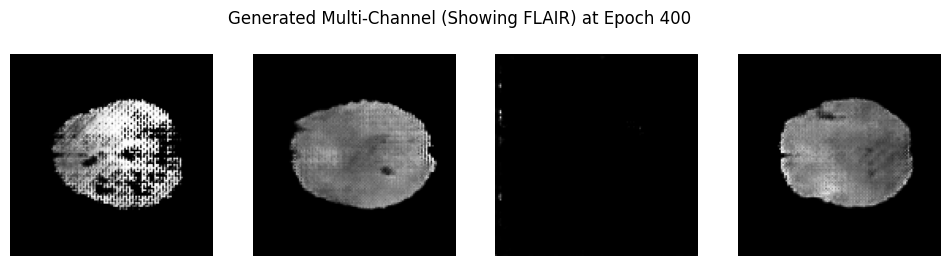

Epoch 401/1000
  Discriminator Loss: -13.6133 | Generator Loss: -39.9616 | D Accuracy: 0.6589
Epoch 402/1000
  Discriminator Loss: -17.9414 | Generator Loss: -13.3576 | D Accuracy: 0.7292
Epoch 403/1000
  Discriminator Loss: -13.0890 | Generator Loss: 5.2358 | D Accuracy: 0.7031
Epoch 404/1000
  Discriminator Loss: -12.1979 | Generator Loss: -45.8184 | D Accuracy: 0.6953
Epoch 405/1000
  Discriminator Loss: -10.8494 | Generator Loss: -33.6814 | D Accuracy: 0.7578
Epoch 406/1000
  Discriminator Loss: -16.2955 | Generator Loss: -42.1599 | D Accuracy: 0.6849
Epoch 407/1000
  Discriminator Loss: -10.6172 | Generator Loss: -28.1204 | D Accuracy: 0.6927
Epoch 408/1000
  Discriminator Loss: -12.2356 | Generator Loss: -52.5810 | D Accuracy: 0.7786
Epoch 409/1000
  Discriminator Loss: -12.1769 | Generator Loss: -23.7559 | D Accuracy: 0.7266
Epoch 410/1000
  Discriminator Loss: -13.1072 | Generator Loss: -28.3032 | D Accuracy: 0.7240


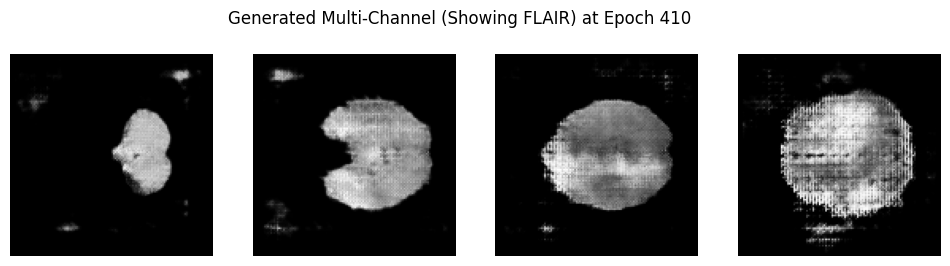

Epoch 411/1000
  Discriminator Loss: -13.5320 | Generator Loss: -50.3097 | D Accuracy: 0.6562
Epoch 412/1000
  Discriminator Loss: -10.8694 | Generator Loss: -33.0033 | D Accuracy: 0.6953
Epoch 413/1000
  Discriminator Loss: -15.0971 | Generator Loss: -39.2568 | D Accuracy: 0.6927
Epoch 414/1000
  Discriminator Loss: -12.9591 | Generator Loss: 11.5363 | D Accuracy: 0.6719
Epoch 415/1000
  Discriminator Loss: -17.5058 | Generator Loss: -75.3046 | D Accuracy: 0.6849
Epoch 416/1000
  Discriminator Loss: -15.4685 | Generator Loss: -29.4867 | D Accuracy: 0.6693
Epoch 417/1000
  Discriminator Loss: -12.1525 | Generator Loss: -49.7604 | D Accuracy: 0.6849
Epoch 418/1000
  Discriminator Loss: -14.6052 | Generator Loss: 41.1193 | D Accuracy: 0.6823
Epoch 419/1000
  Discriminator Loss: -16.5872 | Generator Loss: -35.0806 | D Accuracy: 0.6667
Epoch 420/1000
  Discriminator Loss: -13.9216 | Generator Loss: -77.0924 | D Accuracy: 0.5990


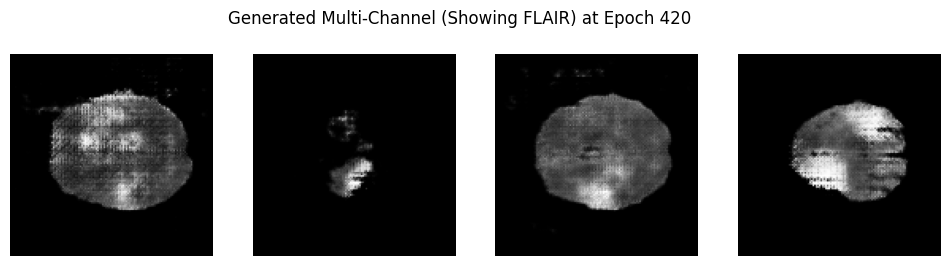

Epoch 421/1000
  Discriminator Loss: -14.2721 | Generator Loss: -77.4052 | D Accuracy: 0.6589
Epoch 422/1000
  Discriminator Loss: -13.7188 | Generator Loss: -11.4383 | D Accuracy: 0.7083
Epoch 423/1000
  Discriminator Loss: -15.2513 | Generator Loss: -6.0473 | D Accuracy: 0.6693
Epoch 424/1000
  Discriminator Loss: -13.7109 | Generator Loss: -72.1241 | D Accuracy: 0.7083
Epoch 425/1000
  Discriminator Loss: -15.2791 | Generator Loss: -3.9580 | D Accuracy: 0.6458
Epoch 426/1000
  Discriminator Loss: -11.0684 | Generator Loss: -42.7310 | D Accuracy: 0.6641
Epoch 427/1000
  Discriminator Loss: -13.5557 | Generator Loss: -24.4594 | D Accuracy: 0.6979
Epoch 428/1000
  Discriminator Loss: -11.1064 | Generator Loss: -84.6733 | D Accuracy: 0.6927
Epoch 429/1000
  Discriminator Loss: -13.6764 | Generator Loss: -23.5161 | D Accuracy: 0.7109
Epoch 430/1000
  Discriminator Loss: -11.8395 | Generator Loss: -6.6545 | D Accuracy: 0.6458


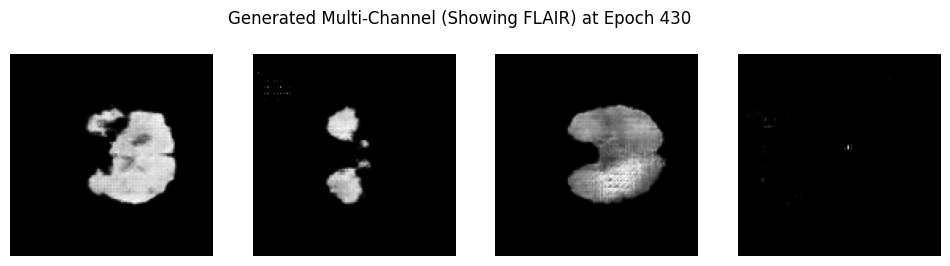

Epoch 431/1000
  Discriminator Loss: -14.0004 | Generator Loss: -37.0974 | D Accuracy: 0.7188
Epoch 432/1000
  Discriminator Loss: -12.8408 | Generator Loss: -18.3159 | D Accuracy: 0.6562
Epoch 433/1000
  Discriminator Loss: -15.8002 | Generator Loss: -69.4475 | D Accuracy: 0.6484
Epoch 434/1000
  Discriminator Loss: -11.6412 | Generator Loss: -26.3616 | D Accuracy: 0.6667
Epoch 435/1000
  Discriminator Loss: -13.3839 | Generator Loss: -23.9713 | D Accuracy: 0.6875
Epoch 436/1000
  Discriminator Loss: -13.8839 | Generator Loss: -36.3479 | D Accuracy: 0.6953
Epoch 437/1000
  Discriminator Loss: -20.8556 | Generator Loss: -15.6165 | D Accuracy: 0.7031
Epoch 438/1000
  Discriminator Loss: -13.1591 | Generator Loss: -123.6456 | D Accuracy: 0.7318
Epoch 439/1000
  Discriminator Loss: -10.4556 | Generator Loss: -9.6172 | D Accuracy: 0.6797
Epoch 440/1000
  Discriminator Loss: -15.7330 | Generator Loss: -59.5903 | D Accuracy: 0.6849


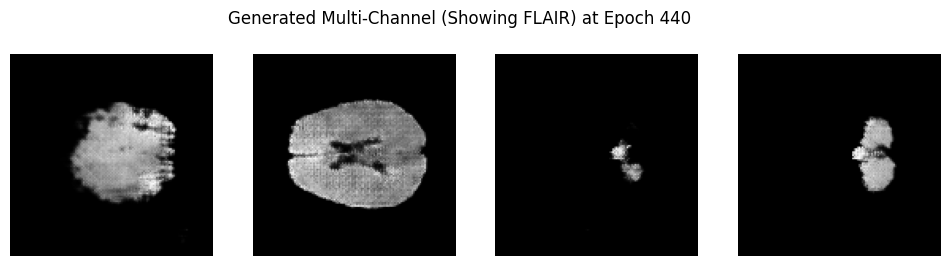

Epoch 441/1000
  Discriminator Loss: -14.7008 | Generator Loss: -1.8479 | D Accuracy: 0.7318
Epoch 442/1000
  Discriminator Loss: -11.7742 | Generator Loss: -56.2065 | D Accuracy: 0.6719
Epoch 443/1000
  Discriminator Loss: -16.7585 | Generator Loss: -12.9219 | D Accuracy: 0.6797
Epoch 444/1000
  Discriminator Loss: -13.9389 | Generator Loss: -42.1331 | D Accuracy: 0.6432
Epoch 445/1000
  Discriminator Loss: -11.7494 | Generator Loss: -20.2227 | D Accuracy: 0.7031
Epoch 446/1000
  Discriminator Loss: -15.0983 | Generator Loss: -50.0989 | D Accuracy: 0.6510
Epoch 447/1000
  Discriminator Loss: -13.8642 | Generator Loss: -18.4599 | D Accuracy: 0.7109
Epoch 448/1000
  Discriminator Loss: -11.2188 | Generator Loss: -34.7915 | D Accuracy: 0.6953
Epoch 449/1000
  Discriminator Loss: -14.5358 | Generator Loss: -22.9546 | D Accuracy: 0.7370
Epoch 450/1000
  Discriminator Loss: -11.8001 | Generator Loss: -55.5603 | D Accuracy: 0.7292


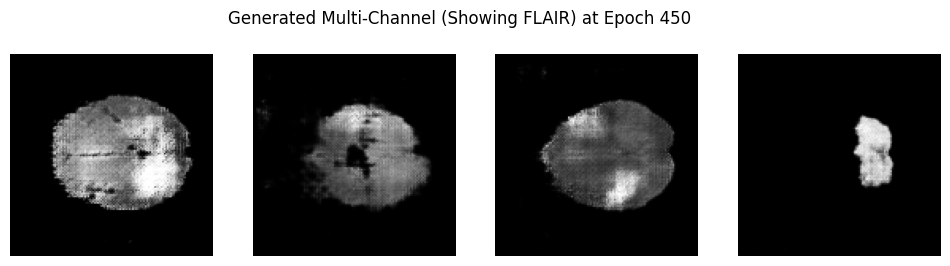

Epoch 451/1000
  Discriminator Loss: -14.9367 | Generator Loss: -10.9074 | D Accuracy: 0.6979
Epoch 452/1000
  Discriminator Loss: -15.3269 | Generator Loss: -72.9360 | D Accuracy: 0.7318
Epoch 453/1000
  Discriminator Loss: -15.2112 | Generator Loss: -82.4389 | D Accuracy: 0.6719
Epoch 454/1000
  Discriminator Loss: -15.3342 | Generator Loss: -33.2431 | D Accuracy: 0.7083
Epoch 455/1000
  Discriminator Loss: -13.1909 | Generator Loss: -49.6672 | D Accuracy: 0.7500
Epoch 456/1000
  Discriminator Loss: -12.6755 | Generator Loss: -27.8804 | D Accuracy: 0.6823
Epoch 457/1000
  Discriminator Loss: -21.5515 | Generator Loss: -58.5449 | D Accuracy: 0.6432
Epoch 458/1000
  Discriminator Loss: -12.7354 | Generator Loss: -12.4085 | D Accuracy: 0.6562
Epoch 459/1000
  Discriminator Loss: -13.9140 | Generator Loss: -71.2022 | D Accuracy: 0.6979
Epoch 460/1000
  Discriminator Loss: -12.3459 | Generator Loss: -41.5323 | D Accuracy: 0.6797


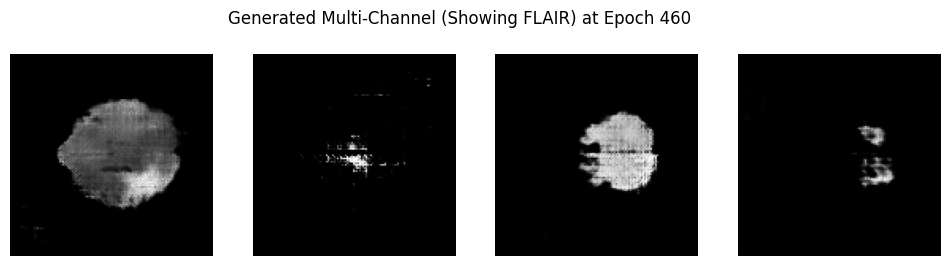

Epoch 461/1000
  Discriminator Loss: -14.1574 | Generator Loss: -52.7544 | D Accuracy: 0.7031
Epoch 462/1000
  Discriminator Loss: -15.7366 | Generator Loss: -69.2386 | D Accuracy: 0.6953
Epoch 463/1000
  Discriminator Loss: -17.7873 | Generator Loss: -57.7878 | D Accuracy: 0.7656
Epoch 464/1000
  Discriminator Loss: -14.0802 | Generator Loss: 11.1003 | D Accuracy: 0.6953
Epoch 465/1000
  Discriminator Loss: -15.7695 | Generator Loss: -75.1834 | D Accuracy: 0.7266
Epoch 466/1000
  Discriminator Loss: -12.3429 | Generator Loss: -50.9867 | D Accuracy: 0.6771
Epoch 467/1000
  Discriminator Loss: -12.4872 | Generator Loss: -64.1337 | D Accuracy: 0.6927
Epoch 468/1000
  Discriminator Loss: -13.2770 | Generator Loss: -40.3235 | D Accuracy: 0.7292
Epoch 469/1000
  Discriminator Loss: -12.7459 | Generator Loss: -18.2973 | D Accuracy: 0.7292
Epoch 470/1000
  Discriminator Loss: -13.7946 | Generator Loss: -20.6940 | D Accuracy: 0.7344


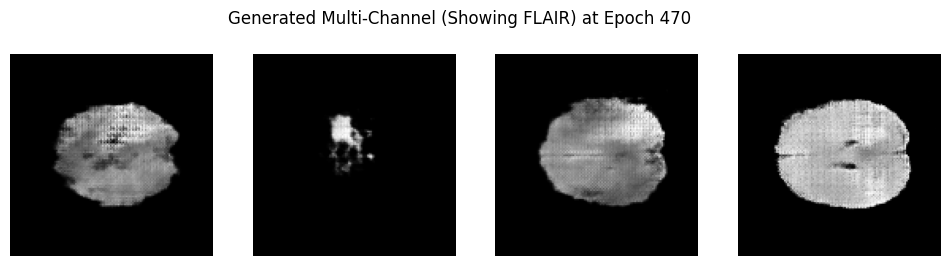

Epoch 471/1000
  Discriminator Loss: -17.5327 | Generator Loss: -94.1995 | D Accuracy: 0.7135
Epoch 472/1000
  Discriminator Loss: -14.5450 | Generator Loss: -64.8996 | D Accuracy: 0.6615
Epoch 473/1000
  Discriminator Loss: -12.0143 | Generator Loss: -42.3724 | D Accuracy: 0.6745
Epoch 474/1000
  Discriminator Loss: -14.7659 | Generator Loss: -48.8944 | D Accuracy: 0.7005
Epoch 475/1000
  Discriminator Loss: -18.6339 | Generator Loss: -29.7362 | D Accuracy: 0.6641
Epoch 476/1000
  Discriminator Loss: -10.9762 | Generator Loss: -6.1384 | D Accuracy: 0.6380
Epoch 477/1000
  Discriminator Loss: -13.3257 | Generator Loss: -21.8093 | D Accuracy: 0.6979
Epoch 478/1000
  Discriminator Loss: -14.0470 | Generator Loss: -54.8638 | D Accuracy: 0.6120
Epoch 479/1000
  Discriminator Loss: -17.6795 | Generator Loss: -19.7798 | D Accuracy: 0.7188
Epoch 480/1000
  Discriminator Loss: -10.8719 | Generator Loss: -52.8517 | D Accuracy: 0.6536


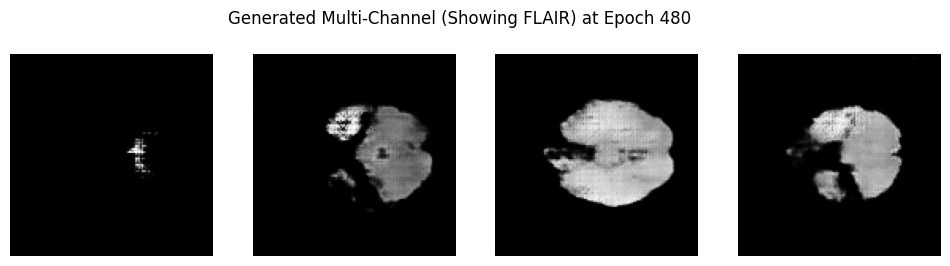

Epoch 481/1000
  Discriminator Loss: -12.6455 | Generator Loss: -24.7997 | D Accuracy: 0.7109
Epoch 482/1000
  Discriminator Loss: -17.1610 | Generator Loss: -46.6215 | D Accuracy: 0.6615
Epoch 483/1000
  Discriminator Loss: -15.3304 | Generator Loss: -13.1260 | D Accuracy: 0.6146
Epoch 484/1000
  Discriminator Loss: -13.2212 | Generator Loss: -77.9830 | D Accuracy: 0.6536
Epoch 485/1000
  Discriminator Loss: -14.8620 | Generator Loss: -78.4393 | D Accuracy: 0.6458
Epoch 486/1000
  Discriminator Loss: -13.4697 | Generator Loss: -55.9972 | D Accuracy: 0.6953
Epoch 487/1000
  Discriminator Loss: -16.7627 | Generator Loss: -39.0760 | D Accuracy: 0.6875
Epoch 488/1000
  Discriminator Loss: -14.3930 | Generator Loss: -10.1922 | D Accuracy: 0.6693
Epoch 489/1000
  Discriminator Loss: -15.8160 | Generator Loss: -59.8714 | D Accuracy: 0.6927
Epoch 490/1000
  Discriminator Loss: -13.0843 | Generator Loss: -48.3885 | D Accuracy: 0.6797


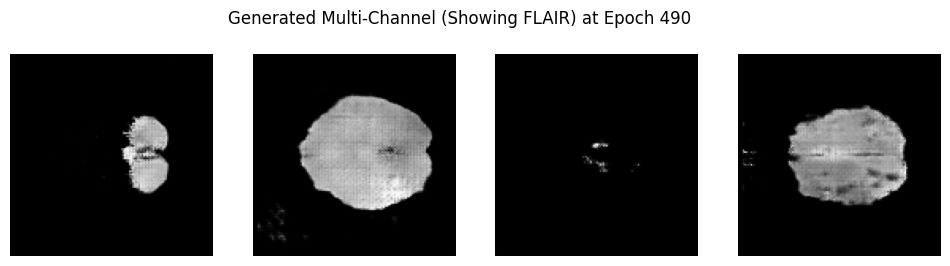

Epoch 491/1000
  Discriminator Loss: -15.3558 | Generator Loss: -70.4157 | D Accuracy: 0.6406
Epoch 492/1000
  Discriminator Loss: -11.8434 | Generator Loss: -35.1551 | D Accuracy: 0.7161
Epoch 493/1000
  Discriminator Loss: -15.9708 | Generator Loss: -46.8968 | D Accuracy: 0.7161
Epoch 494/1000
  Discriminator Loss: -13.7044 | Generator Loss: -60.8725 | D Accuracy: 0.6901
Epoch 495/1000
  Discriminator Loss: -12.7230 | Generator Loss: -68.1908 | D Accuracy: 0.6667
Epoch 496/1000
  Discriminator Loss: -11.7186 | Generator Loss: -49.8409 | D Accuracy: 0.7656
Epoch 497/1000
  Discriminator Loss: -18.0054 | Generator Loss: 0.5173 | D Accuracy: 0.6354
Epoch 498/1000
  Discriminator Loss: -12.9505 | Generator Loss: -37.5921 | D Accuracy: 0.7005
Epoch 499/1000
  Discriminator Loss: -13.7441 | Generator Loss: -72.6853 | D Accuracy: 0.6823
Epoch 500/1000
  Discriminator Loss: -13.4730 | Generator Loss: -76.5426 | D Accuracy: 0.7266


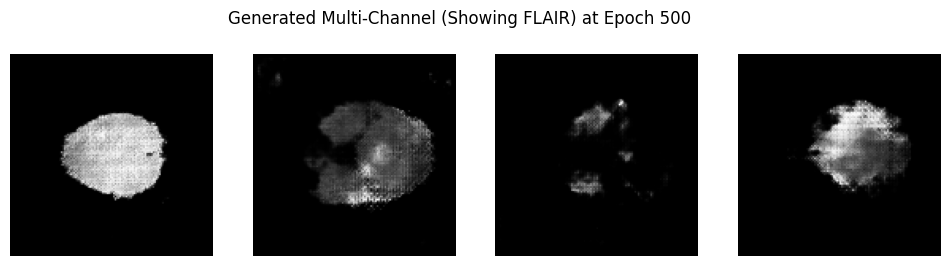

Epoch 501/1000
  Discriminator Loss: -13.3528 | Generator Loss: -27.8236 | D Accuracy: 0.6979
Epoch 502/1000
  Discriminator Loss: -17.4767 | Generator Loss: -77.1310 | D Accuracy: 0.6641
Epoch 503/1000
  Discriminator Loss: -14.3388 | Generator Loss: -33.7092 | D Accuracy: 0.6823
Epoch 504/1000
  Discriminator Loss: -10.8898 | Generator Loss: -18.7934 | D Accuracy: 0.6016
Epoch 505/1000
  Discriminator Loss: -16.5523 | Generator Loss: -76.7161 | D Accuracy: 0.7266
Epoch 506/1000
  Discriminator Loss: -15.6903 | Generator Loss: -72.0297 | D Accuracy: 0.6042
Epoch 507/1000
  Discriminator Loss: -16.7208 | Generator Loss: -69.3298 | D Accuracy: 0.6823
Epoch 508/1000
  Discriminator Loss: -12.2275 | Generator Loss: -13.1167 | D Accuracy: 0.6328
Epoch 509/1000
  Discriminator Loss: -16.0376 | Generator Loss: -54.1717 | D Accuracy: 0.6771
Epoch 510/1000
  Discriminator Loss: -15.7048 | Generator Loss: -12.5851 | D Accuracy: 0.7005


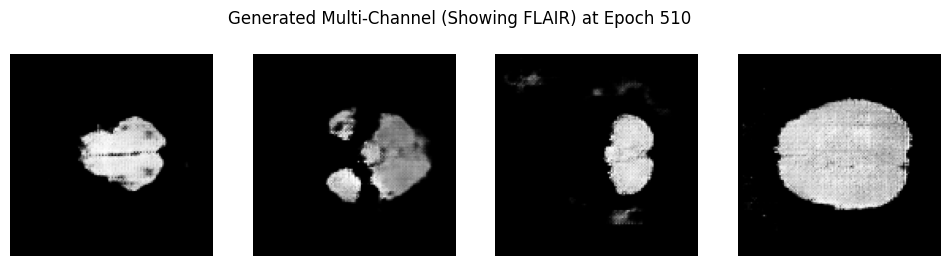

Epoch 511/1000
  Discriminator Loss: -13.3479 | Generator Loss: -35.2486 | D Accuracy: 0.6693
Epoch 512/1000
  Discriminator Loss: -13.7607 | Generator Loss: -5.0859 | D Accuracy: 0.7057
Epoch 513/1000
  Discriminator Loss: -11.5353 | Generator Loss: -19.9582 | D Accuracy: 0.6276
Epoch 514/1000
  Discriminator Loss: -15.9287 | Generator Loss: -51.3626 | D Accuracy: 0.7370
Epoch 515/1000
  Discriminator Loss: -11.4820 | Generator Loss: -64.5797 | D Accuracy: 0.7057
Epoch 516/1000
  Discriminator Loss: -18.0135 | Generator Loss: -27.5763 | D Accuracy: 0.6615
Epoch 517/1000
  Discriminator Loss: -8.9445 | Generator Loss: -37.9861 | D Accuracy: 0.7005
Epoch 518/1000
  Discriminator Loss: -15.4016 | Generator Loss: -26.1484 | D Accuracy: 0.7344
Epoch 519/1000
  Discriminator Loss: -12.9949 | Generator Loss: -15.3052 | D Accuracy: 0.6641
Epoch 520/1000
  Discriminator Loss: -17.1659 | Generator Loss: -24.0326 | D Accuracy: 0.6458


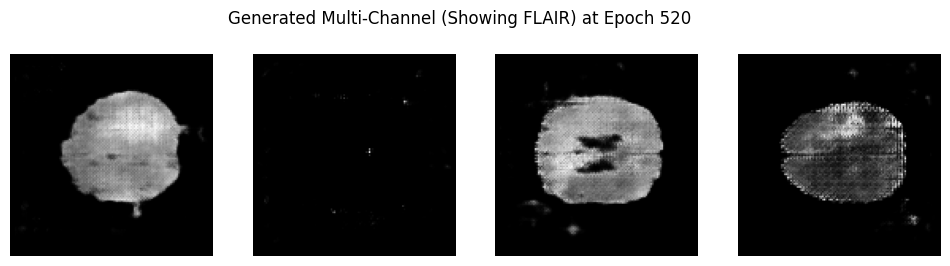

Epoch 521/1000
  Discriminator Loss: -12.9307 | Generator Loss: -39.7855 | D Accuracy: 0.7057
Epoch 522/1000
  Discriminator Loss: -15.8163 | Generator Loss: 6.8426 | D Accuracy: 0.6589
Epoch 523/1000
  Discriminator Loss: -13.0327 | Generator Loss: -25.4275 | D Accuracy: 0.6745
Epoch 524/1000
  Discriminator Loss: -16.8377 | Generator Loss: 18.3778 | D Accuracy: 0.6745
Epoch 525/1000
  Discriminator Loss: -11.9150 | Generator Loss: -63.2829 | D Accuracy: 0.7057
Epoch 526/1000
  Discriminator Loss: -16.5898 | Generator Loss: -16.0142 | D Accuracy: 0.7005
Epoch 527/1000
  Discriminator Loss: -13.0269 | Generator Loss: -39.5267 | D Accuracy: 0.6354
Epoch 528/1000
  Discriminator Loss: -11.7919 | Generator Loss: -20.8501 | D Accuracy: 0.7500
Epoch 529/1000
  Discriminator Loss: -13.2404 | Generator Loss: -26.3057 | D Accuracy: 0.7057
Epoch 530/1000
  Discriminator Loss: -14.4903 | Generator Loss: -53.4886 | D Accuracy: 0.7604


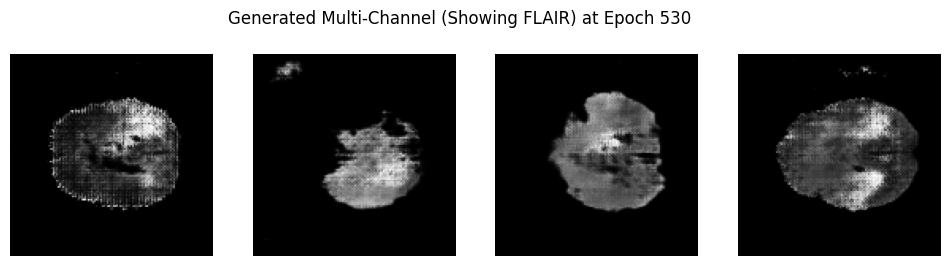

Epoch 531/1000
  Discriminator Loss: -13.5542 | Generator Loss: -42.0830 | D Accuracy: 0.7240
Epoch 532/1000
  Discriminator Loss: -13.8690 | Generator Loss: -18.5088 | D Accuracy: 0.6979
Epoch 533/1000
  Discriminator Loss: -14.2313 | Generator Loss: -16.4987 | D Accuracy: 0.7396
Epoch 534/1000
  Discriminator Loss: -20.4921 | Generator Loss: -63.1578 | D Accuracy: 0.6901
Epoch 535/1000
  Discriminator Loss: -14.5078 | Generator Loss: -104.5035 | D Accuracy: 0.6979
Epoch 536/1000
  Discriminator Loss: -15.0799 | Generator Loss: -27.4472 | D Accuracy: 0.7214
Epoch 537/1000
  Discriminator Loss: -15.1000 | Generator Loss: -24.9277 | D Accuracy: 0.6719
Epoch 538/1000
  Discriminator Loss: -13.6303 | Generator Loss: -35.4923 | D Accuracy: 0.7109
Epoch 539/1000
  Discriminator Loss: -12.2368 | Generator Loss: -22.4464 | D Accuracy: 0.6719
Epoch 540/1000
  Discriminator Loss: -15.3292 | Generator Loss: -57.0207 | D Accuracy: 0.6953


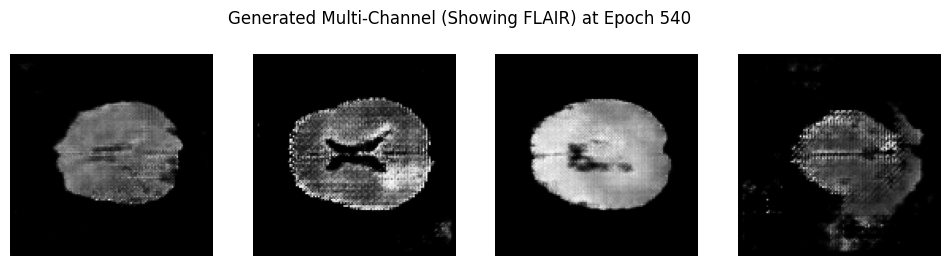

Epoch 541/1000
  Discriminator Loss: -16.4598 | Generator Loss: -14.7764 | D Accuracy: 0.7031
Epoch 542/1000
  Discriminator Loss: -14.6331 | Generator Loss: -15.4179 | D Accuracy: 0.6953
Epoch 543/1000
  Discriminator Loss: -12.5047 | Generator Loss: -43.6277 | D Accuracy: 0.7292
Epoch 544/1000
  Discriminator Loss: -16.6967 | Generator Loss: 0.7671 | D Accuracy: 0.6771
Epoch 545/1000
  Discriminator Loss: -11.7343 | Generator Loss: -21.7299 | D Accuracy: 0.7083
Epoch 546/1000
  Discriminator Loss: -13.8043 | Generator Loss: -27.4148 | D Accuracy: 0.7396
Epoch 547/1000
  Discriminator Loss: -20.6541 | Generator Loss: -73.7149 | D Accuracy: 0.6589
Epoch 548/1000
  Discriminator Loss: -11.9059 | Generator Loss: -32.9514 | D Accuracy: 0.6849
Epoch 549/1000
  Discriminator Loss: -15.7496 | Generator Loss: -49.3943 | D Accuracy: 0.7396
Epoch 550/1000
  Discriminator Loss: -12.9662 | Generator Loss: -51.7865 | D Accuracy: 0.6927


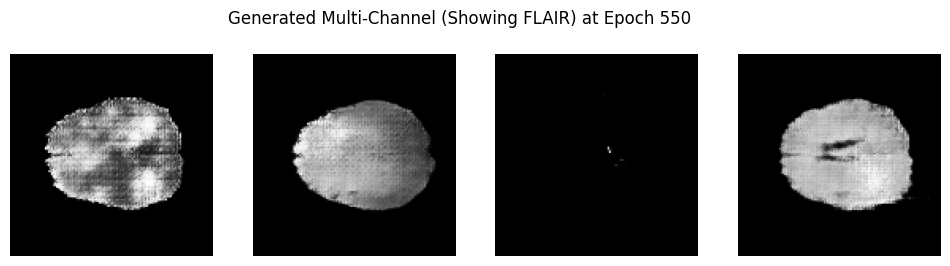

Epoch 551/1000
  Discriminator Loss: -15.3789 | Generator Loss: -75.9455 | D Accuracy: 0.6667
Epoch 552/1000
  Discriminator Loss: -14.4233 | Generator Loss: -71.6709 | D Accuracy: 0.7031
Epoch 553/1000
  Discriminator Loss: -12.9427 | Generator Loss: -26.7694 | D Accuracy: 0.6771
Epoch 554/1000
  Discriminator Loss: -14.4548 | Generator Loss: -30.0717 | D Accuracy: 0.7083
Epoch 555/1000
  Discriminator Loss: -17.3962 | Generator Loss: 9.3242 | D Accuracy: 0.6823
Epoch 556/1000
  Discriminator Loss: -11.9362 | Generator Loss: -63.5338 | D Accuracy: 0.6771
Epoch 557/1000
  Discriminator Loss: -14.4821 | Generator Loss: -21.4979 | D Accuracy: 0.7656
Epoch 558/1000
  Discriminator Loss: -20.2614 | Generator Loss: -37.7943 | D Accuracy: 0.6953
Epoch 559/1000
  Discriminator Loss: -11.0669 | Generator Loss: -19.7482 | D Accuracy: 0.6979
Epoch 560/1000
  Discriminator Loss: -14.4882 | Generator Loss: -65.3970 | D Accuracy: 0.7031


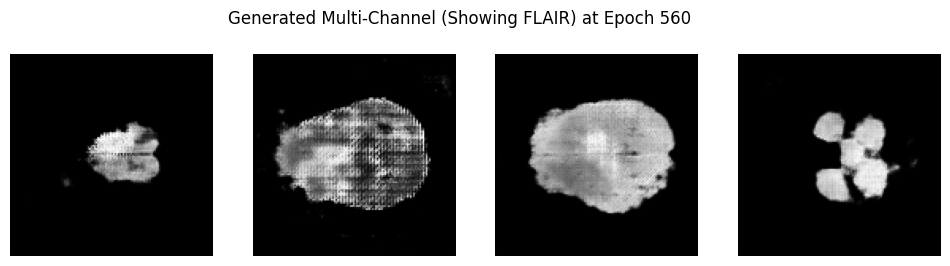

Epoch 561/1000
  Discriminator Loss: -14.9762 | Generator Loss: -2.4379 | D Accuracy: 0.6693
Epoch 562/1000
  Discriminator Loss: -13.1594 | Generator Loss: -16.0846 | D Accuracy: 0.6562
Epoch 563/1000
  Discriminator Loss: -12.9292 | Generator Loss: -47.4650 | D Accuracy: 0.6927
Epoch 564/1000
  Discriminator Loss: -15.0568 | Generator Loss: -42.7489 | D Accuracy: 0.7266
Epoch 565/1000
  Discriminator Loss: -13.7295 | Generator Loss: -79.9582 | D Accuracy: 0.7760
Epoch 566/1000
  Discriminator Loss: -12.6344 | Generator Loss: -29.1735 | D Accuracy: 0.7396
Epoch 567/1000
  Discriminator Loss: -15.1783 | Generator Loss: -46.4006 | D Accuracy: 0.7083
Epoch 568/1000
  Discriminator Loss: -15.5285 | Generator Loss: -21.6733 | D Accuracy: 0.6615
Epoch 569/1000
  Discriminator Loss: -12.4817 | Generator Loss: -48.4693 | D Accuracy: 0.7188
Epoch 570/1000
  Discriminator Loss: -13.7388 | Generator Loss: -60.9144 | D Accuracy: 0.6693


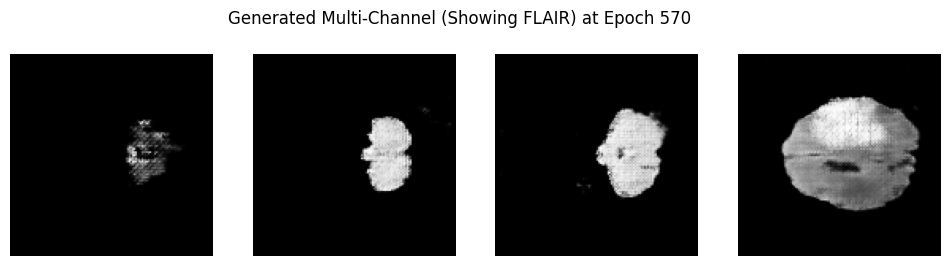

Epoch 571/1000
  Discriminator Loss: -15.6963 | Generator Loss: -42.6932 | D Accuracy: 0.6771
Epoch 572/1000
  Discriminator Loss: -15.0287 | Generator Loss: 22.1053 | D Accuracy: 0.6641
Epoch 573/1000
  Discriminator Loss: -12.4971 | Generator Loss: 8.0292 | D Accuracy: 0.7318
Epoch 574/1000
  Discriminator Loss: -14.0576 | Generator Loss: -1.5302 | D Accuracy: 0.7188
Epoch 575/1000
  Discriminator Loss: -14.0531 | Generator Loss: -67.3827 | D Accuracy: 0.7161
Epoch 576/1000
  Discriminator Loss: -17.0254 | Generator Loss: -47.8553 | D Accuracy: 0.6979
Epoch 577/1000
  Discriminator Loss: -15.0299 | Generator Loss: -19.2627 | D Accuracy: 0.6771
Epoch 578/1000
  Discriminator Loss: -14.2851 | Generator Loss: 20.3047 | D Accuracy: 0.5964
Epoch 579/1000
  Discriminator Loss: -14.2031 | Generator Loss: -56.4136 | D Accuracy: 0.7057
Epoch 580/1000
  Discriminator Loss: -12.4841 | Generator Loss: -12.5997 | D Accuracy: 0.7422


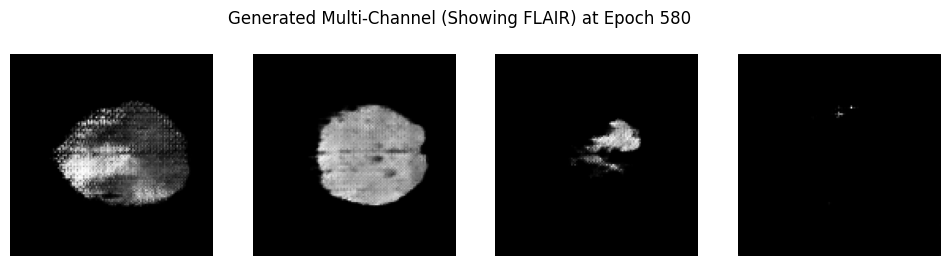

Epoch 581/1000
  Discriminator Loss: -17.3759 | Generator Loss: -5.1907 | D Accuracy: 0.7526
Epoch 582/1000
  Discriminator Loss: -13.7696 | Generator Loss: -29.6970 | D Accuracy: 0.6875
Epoch 583/1000
  Discriminator Loss: -18.1845 | Generator Loss: -75.4457 | D Accuracy: 0.7266
Epoch 584/1000
  Discriminator Loss: -12.4898 | Generator Loss: -59.7669 | D Accuracy: 0.6667
Epoch 585/1000
  Discriminator Loss: -14.1871 | Generator Loss: -54.2889 | D Accuracy: 0.7135
Epoch 586/1000
  Discriminator Loss: -21.5652 | Generator Loss: 29.3767 | D Accuracy: 0.6901
Epoch 587/1000
  Discriminator Loss: -14.4117 | Generator Loss: -12.8288 | D Accuracy: 0.6536
Epoch 588/1000
  Discriminator Loss: -13.4845 | Generator Loss: -48.2534 | D Accuracy: 0.7109
Epoch 589/1000
  Discriminator Loss: -16.4249 | Generator Loss: -69.6036 | D Accuracy: 0.6641
Epoch 590/1000
  Discriminator Loss: -12.8922 | Generator Loss: -77.4923 | D Accuracy: 0.6797


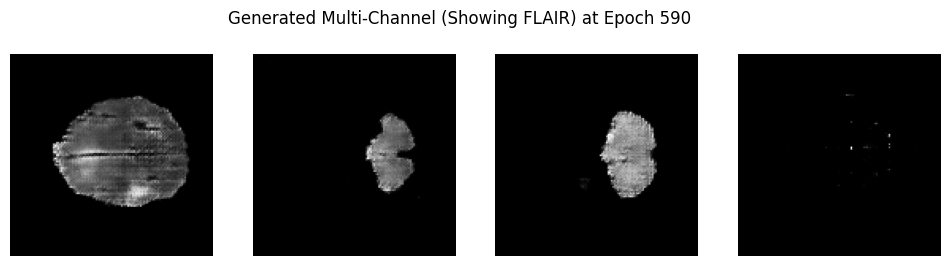

Epoch 591/1000
  Discriminator Loss: -14.9783 | Generator Loss: -46.6022 | D Accuracy: 0.7370
Epoch 592/1000
  Discriminator Loss: -14.2786 | Generator Loss: -16.7141 | D Accuracy: 0.6875
Epoch 593/1000
  Discriminator Loss: -12.7025 | Generator Loss: -66.8684 | D Accuracy: 0.6823
Epoch 594/1000
  Discriminator Loss: -15.6638 | Generator Loss: -36.8648 | D Accuracy: 0.7135
Epoch 595/1000
  Discriminator Loss: -15.6416 | Generator Loss: -60.3364 | D Accuracy: 0.6771
Epoch 596/1000
  Discriminator Loss: -14.0791 | Generator Loss: -61.4218 | D Accuracy: 0.7057
Epoch 597/1000
  Discriminator Loss: -14.6933 | Generator Loss: -45.2360 | D Accuracy: 0.7318
Epoch 598/1000
  Discriminator Loss: -14.0266 | Generator Loss: -25.1614 | D Accuracy: 0.6953
Epoch 599/1000
  Discriminator Loss: -14.5166 | Generator Loss: -51.8471 | D Accuracy: 0.7578
Epoch 600/1000
  Discriminator Loss: -14.1378 | Generator Loss: -10.1042 | D Accuracy: 0.6302


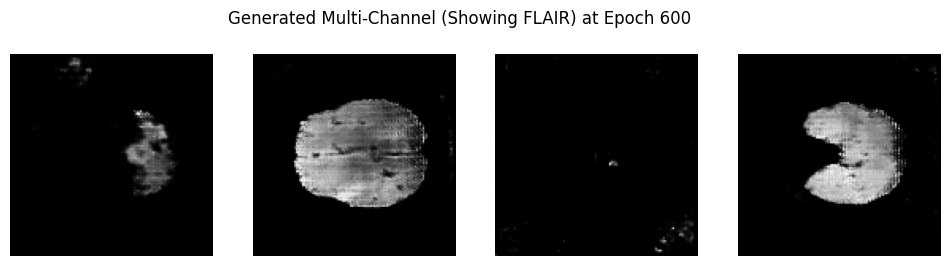

Epoch 601/1000
  Discriminator Loss: -13.4387 | Generator Loss: -99.1746 | D Accuracy: 0.7266
Epoch 602/1000
  Discriminator Loss: -15.7288 | Generator Loss: -30.5976 | D Accuracy: 0.7292
Epoch 603/1000
  Discriminator Loss: -12.7965 | Generator Loss: -26.4397 | D Accuracy: 0.7188
Epoch 604/1000
  Discriminator Loss: -13.7952 | Generator Loss: -15.7022 | D Accuracy: 0.7292
Epoch 605/1000
  Discriminator Loss: -12.2078 | Generator Loss: -32.8839 | D Accuracy: 0.7031
Epoch 606/1000
  Discriminator Loss: -14.5967 | Generator Loss: -35.8316 | D Accuracy: 0.7422
Epoch 607/1000
  Discriminator Loss: -12.9842 | Generator Loss: -50.5092 | D Accuracy: 0.7578
Epoch 608/1000
  Discriminator Loss: -16.2146 | Generator Loss: -59.0179 | D Accuracy: 0.7057
Epoch 609/1000
  Discriminator Loss: -15.8693 | Generator Loss: -54.8442 | D Accuracy: 0.7161
Epoch 610/1000
  Discriminator Loss: -15.2802 | Generator Loss: -31.0705 | D Accuracy: 0.7240


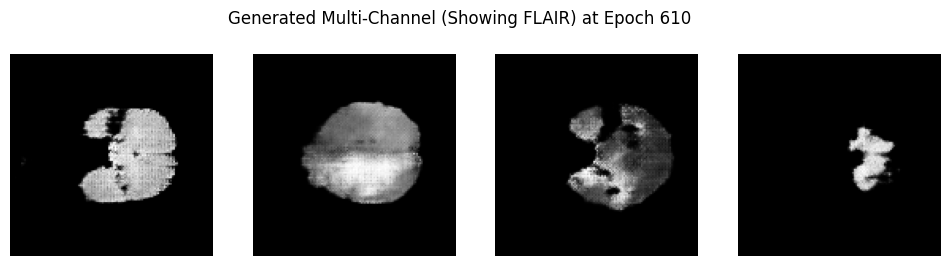

Epoch 611/1000
  Discriminator Loss: -14.9375 | Generator Loss: -38.0312 | D Accuracy: 0.7292
Epoch 612/1000
  Discriminator Loss: -14.4813 | Generator Loss: -76.1093 | D Accuracy: 0.6536
Epoch 613/1000
  Discriminator Loss: -14.4663 | Generator Loss: -15.8785 | D Accuracy: 0.7318
Epoch 614/1000
  Discriminator Loss: -13.8087 | Generator Loss: -26.3429 | D Accuracy: 0.7214
Epoch 615/1000
  Discriminator Loss: -12.9481 | Generator Loss: -35.7795 | D Accuracy: 0.7396
Epoch 616/1000
  Discriminator Loss: -15.3408 | Generator Loss: -38.8305 | D Accuracy: 0.6901
Epoch 617/1000
  Discriminator Loss: -16.1935 | Generator Loss: -22.9164 | D Accuracy: 0.7188
Epoch 618/1000
  Discriminator Loss: -12.4537 | Generator Loss: -47.1518 | D Accuracy: 0.7266
Epoch 619/1000
  Discriminator Loss: -14.1763 | Generator Loss: -48.9348 | D Accuracy: 0.6589
Epoch 620/1000
  Discriminator Loss: -16.4609 | Generator Loss: -15.6704 | D Accuracy: 0.7370


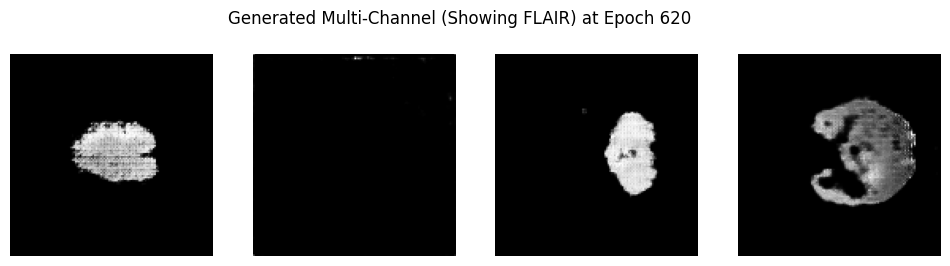

Epoch 621/1000
  Discriminator Loss: -19.8723 | Generator Loss: -46.5421 | D Accuracy: 0.6641
Epoch 622/1000
  Discriminator Loss: -14.3672 | Generator Loss: -36.9898 | D Accuracy: 0.7109
Epoch 623/1000
  Discriminator Loss: -15.9511 | Generator Loss: 4.5046 | D Accuracy: 0.6328
Epoch 624/1000
  Discriminator Loss: -16.2155 | Generator Loss: -87.9821 | D Accuracy: 0.6927
Epoch 625/1000
  Discriminator Loss: -12.4802 | Generator Loss: -38.3931 | D Accuracy: 0.7161
Epoch 626/1000
  Discriminator Loss: -20.6861 | Generator Loss: -62.2299 | D Accuracy: 0.7292
Epoch 627/1000
  Discriminator Loss: -13.2520 | Generator Loss: -120.8582 | D Accuracy: 0.6380
Epoch 628/1000
  Discriminator Loss: -13.3982 | Generator Loss: -80.2016 | D Accuracy: 0.6406
Epoch 629/1000
  Discriminator Loss: -14.1273 | Generator Loss: -99.8344 | D Accuracy: 0.6797
Epoch 630/1000
  Discriminator Loss: -16.5437 | Generator Loss: 21.4402 | D Accuracy: 0.6823


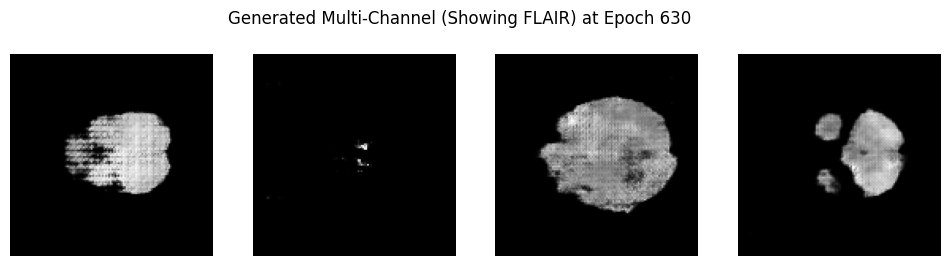

Epoch 631/1000
  Discriminator Loss: -13.6671 | Generator Loss: -31.5699 | D Accuracy: 0.6771
Epoch 632/1000
  Discriminator Loss: -16.1445 | Generator Loss: -6.8408 | D Accuracy: 0.6615
Epoch 633/1000
  Discriminator Loss: -18.2395 | Generator Loss: -6.9652 | D Accuracy: 0.6380
Epoch 634/1000
  Discriminator Loss: -13.5713 | Generator Loss: -35.1930 | D Accuracy: 0.6849
Epoch 635/1000
  Discriminator Loss: -18.4887 | Generator Loss: -44.0892 | D Accuracy: 0.6953
Epoch 636/1000
  Discriminator Loss: -13.3219 | Generator Loss: -84.4914 | D Accuracy: 0.7318
Epoch 637/1000
  Discriminator Loss: -19.8129 | Generator Loss: -4.1676 | D Accuracy: 0.7005
Epoch 638/1000
  Discriminator Loss: -13.1949 | Generator Loss: -39.8333 | D Accuracy: 0.6797
Epoch 639/1000
  Discriminator Loss: -13.9388 | Generator Loss: -36.3586 | D Accuracy: 0.7422
Epoch 640/1000
  Discriminator Loss: -13.9253 | Generator Loss: -52.0905 | D Accuracy: 0.6901


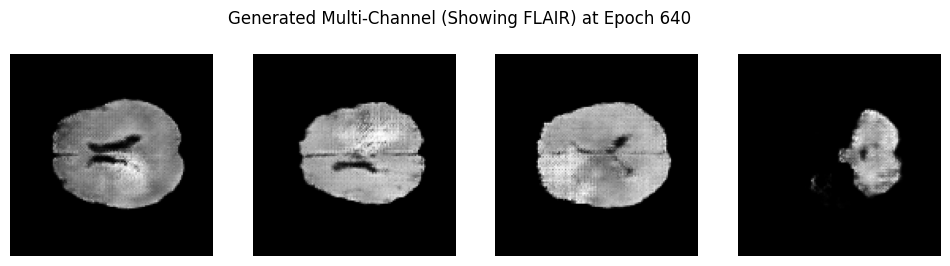

Epoch 641/1000
  Discriminator Loss: -15.0264 | Generator Loss: -40.5672 | D Accuracy: 0.6823
Epoch 642/1000
  Discriminator Loss: -15.2105 | Generator Loss: -77.5733 | D Accuracy: 0.7656
Epoch 643/1000
  Discriminator Loss: -13.9151 | Generator Loss: -110.6739 | D Accuracy: 0.6927
Epoch 644/1000
  Discriminator Loss: -15.8265 | Generator Loss: -48.3048 | D Accuracy: 0.6719
Epoch 645/1000
  Discriminator Loss: -14.7645 | Generator Loss: -88.8620 | D Accuracy: 0.6641
Epoch 646/1000
  Discriminator Loss: -11.6434 | Generator Loss: -64.3192 | D Accuracy: 0.7188
Epoch 647/1000
  Discriminator Loss: -14.0313 | Generator Loss: -5.7408 | D Accuracy: 0.6536
Epoch 648/1000
  Discriminator Loss: -12.3097 | Generator Loss: -32.8217 | D Accuracy: 0.7578
Epoch 649/1000
  Discriminator Loss: -14.1338 | Generator Loss: -10.3977 | D Accuracy: 0.6562
Epoch 650/1000
  Discriminator Loss: -16.1365 | Generator Loss: -50.1113 | D Accuracy: 0.7005


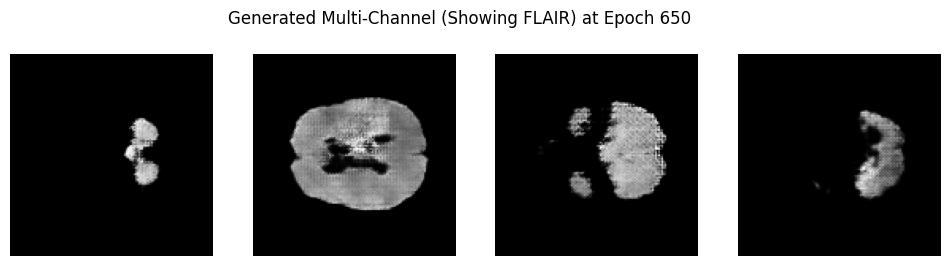

Epoch 651/1000
  Discriminator Loss: -16.2225 | Generator Loss: -35.6477 | D Accuracy: 0.7318
Epoch 652/1000
  Discriminator Loss: -14.3052 | Generator Loss: -45.3396 | D Accuracy: 0.7266
Epoch 653/1000
  Discriminator Loss: -16.4953 | Generator Loss: -64.1545 | D Accuracy: 0.7396
Epoch 654/1000
  Discriminator Loss: -15.0623 | Generator Loss: -60.5995 | D Accuracy: 0.7526
Epoch 655/1000
  Discriminator Loss: -15.0308 | Generator Loss: -37.4273 | D Accuracy: 0.7344
Epoch 656/1000
  Discriminator Loss: -12.7200 | Generator Loss: -50.8621 | D Accuracy: 0.7526
Epoch 657/1000
  Discriminator Loss: -20.8484 | Generator Loss: -38.0893 | D Accuracy: 0.6979
Epoch 658/1000
  Discriminator Loss: -11.8797 | Generator Loss: -121.2392 | D Accuracy: 0.6667
Epoch 659/1000
  Discriminator Loss: -15.7364 | Generator Loss: -22.0556 | D Accuracy: 0.6901
Epoch 660/1000
  Discriminator Loss: -14.0475 | Generator Loss: -14.6913 | D Accuracy: 0.7396


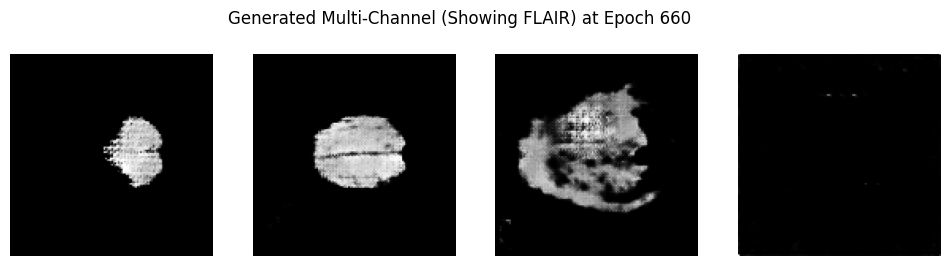

Epoch 661/1000
  Discriminator Loss: -15.1369 | Generator Loss: -75.4373 | D Accuracy: 0.6771
Epoch 662/1000
  Discriminator Loss: -13.9534 | Generator Loss: 22.2920 | D Accuracy: 0.6875
Epoch 663/1000
  Discriminator Loss: -15.4149 | Generator Loss: -30.4939 | D Accuracy: 0.7266
Epoch 664/1000
  Discriminator Loss: -13.3486 | Generator Loss: -53.3733 | D Accuracy: 0.6667
Epoch 665/1000
  Discriminator Loss: -16.0236 | Generator Loss: 30.9432 | D Accuracy: 0.7318
Epoch 666/1000
  Discriminator Loss: -13.5148 | Generator Loss: -16.0708 | D Accuracy: 0.6823
Epoch 667/1000
  Discriminator Loss: -14.7700 | Generator Loss: -8.6819 | D Accuracy: 0.7161
Epoch 668/1000
  Discriminator Loss: -12.8955 | Generator Loss: -41.2097 | D Accuracy: 0.7344
Epoch 669/1000
  Discriminator Loss: -13.3121 | Generator Loss: -37.3340 | D Accuracy: 0.7682
Epoch 670/1000
  Discriminator Loss: -15.7443 | Generator Loss: -29.5796 | D Accuracy: 0.7240


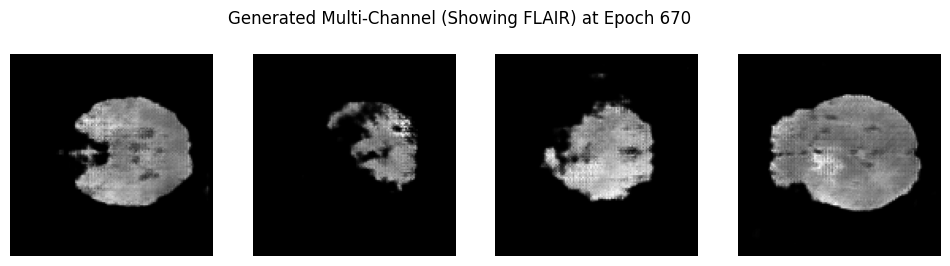

Epoch 671/1000
  Discriminator Loss: -20.2852 | Generator Loss: 9.4010 | D Accuracy: 0.6667
Epoch 672/1000
  Discriminator Loss: -12.3487 | Generator Loss: -38.3355 | D Accuracy: 0.6771
Epoch 673/1000
  Discriminator Loss: -15.8361 | Generator Loss: -33.7551 | D Accuracy: 0.7135
Epoch 674/1000
  Discriminator Loss: -20.8657 | Generator Loss: -113.8293 | D Accuracy: 0.6875
Epoch 675/1000
  Discriminator Loss: -14.7336 | Generator Loss: -114.3103 | D Accuracy: 0.6797
Epoch 676/1000
  Discriminator Loss: -13.1727 | Generator Loss: -74.0410 | D Accuracy: 0.7474
Epoch 677/1000
  Discriminator Loss: -15.6096 | Generator Loss: -64.0352 | D Accuracy: 0.7214
Epoch 678/1000
  Discriminator Loss: -12.7111 | Generator Loss: -54.5837 | D Accuracy: 0.7318
Epoch 679/1000
  Discriminator Loss: -15.4576 | Generator Loss: -9.6742 | D Accuracy: 0.7161
Epoch 680/1000
  Discriminator Loss: -14.8184 | Generator Loss: -29.9622 | D Accuracy: 0.7005


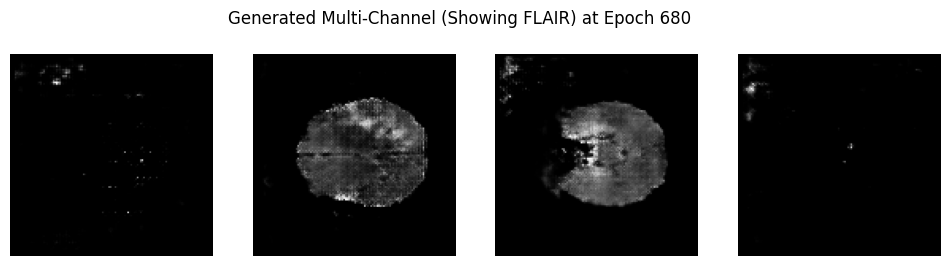

Epoch 681/1000
  Discriminator Loss: -12.1672 | Generator Loss: -30.9735 | D Accuracy: 0.6849
Epoch 682/1000
  Discriminator Loss: -14.7971 | Generator Loss: -21.7324 | D Accuracy: 0.7552
Epoch 683/1000
  Discriminator Loss: -16.1079 | Generator Loss: -12.2385 | D Accuracy: 0.6432
Epoch 684/1000
  Discriminator Loss: -14.4212 | Generator Loss: -70.1899 | D Accuracy: 0.6849
Epoch 685/1000
  Discriminator Loss: -14.5672 | Generator Loss: -39.1351 | D Accuracy: 0.7292
Epoch 686/1000
  Discriminator Loss: -17.9519 | Generator Loss: -10.1242 | D Accuracy: 0.6693
Epoch 687/1000
  Discriminator Loss: -16.1202 | Generator Loss: -32.7834 | D Accuracy: 0.6589
Epoch 688/1000
  Discriminator Loss: -16.2078 | Generator Loss: -48.7581 | D Accuracy: 0.7344
Epoch 689/1000
  Discriminator Loss: -13.1090 | Generator Loss: -14.0718 | D Accuracy: 0.7057
Epoch 690/1000
  Discriminator Loss: -14.0303 | Generator Loss: -38.9373 | D Accuracy: 0.6875


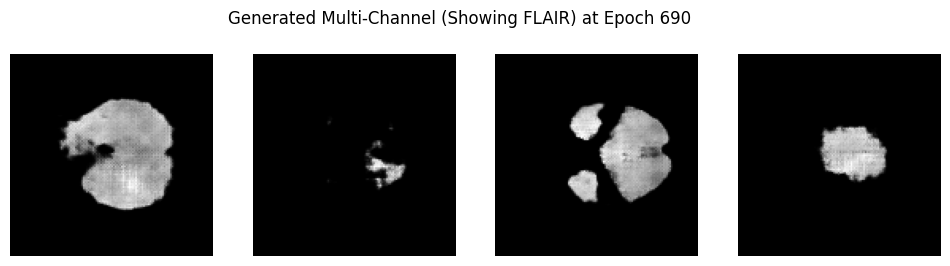

Epoch 691/1000
  Discriminator Loss: -19.7627 | Generator Loss: -14.1796 | D Accuracy: 0.7526
Epoch 692/1000
  Discriminator Loss: -14.4641 | Generator Loss: -73.2486 | D Accuracy: 0.7526
Epoch 693/1000
  Discriminator Loss: -14.5405 | Generator Loss: -33.8451 | D Accuracy: 0.6979
Epoch 694/1000
  Discriminator Loss: -14.6577 | Generator Loss: -27.4639 | D Accuracy: 0.6927
Epoch 695/1000
  Discriminator Loss: -15.6187 | Generator Loss: -34.0554 | D Accuracy: 0.7708
Epoch 696/1000
  Discriminator Loss: -17.8103 | Generator Loss: -12.1543 | D Accuracy: 0.6797
Epoch 697/1000
  Discriminator Loss: -17.6852 | Generator Loss: -69.1379 | D Accuracy: 0.6615
Epoch 698/1000
  Discriminator Loss: -15.5833 | Generator Loss: -47.7521 | D Accuracy: 0.6901
Epoch 699/1000
  Discriminator Loss: -16.0312 | Generator Loss: -18.4060 | D Accuracy: 0.6927
Epoch 700/1000
  Discriminator Loss: -16.6840 | Generator Loss: -47.3681 | D Accuracy: 0.7500


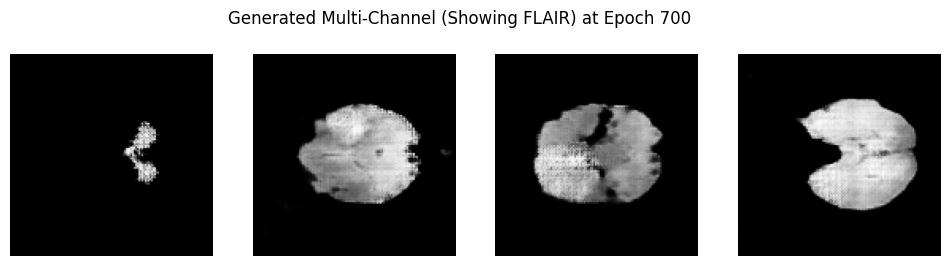

Epoch 701/1000
  Discriminator Loss: -17.3490 | Generator Loss: -70.0442 | D Accuracy: 0.7031
Epoch 702/1000
  Discriminator Loss: -15.8369 | Generator Loss: -74.4558 | D Accuracy: 0.6510
Epoch 703/1000
  Discriminator Loss: -24.1561 | Generator Loss: 21.3210 | D Accuracy: 0.7161
Epoch 704/1000
  Discriminator Loss: -13.9268 | Generator Loss: -50.2141 | D Accuracy: 0.6589
Epoch 705/1000
  Discriminator Loss: -13.3881 | Generator Loss: -68.9724 | D Accuracy: 0.7656
Epoch 706/1000
  Discriminator Loss: -18.0514 | Generator Loss: 1.4329 | D Accuracy: 0.7266
Epoch 707/1000
  Discriminator Loss: -14.9428 | Generator Loss: -9.8128 | D Accuracy: 0.7109
Epoch 708/1000
  Discriminator Loss: -14.3116 | Generator Loss: -46.9759 | D Accuracy: 0.7578
Epoch 709/1000
  Discriminator Loss: -15.3005 | Generator Loss: -76.3611 | D Accuracy: 0.7500
Epoch 710/1000
  Discriminator Loss: -13.6254 | Generator Loss: -37.7354 | D Accuracy: 0.7057


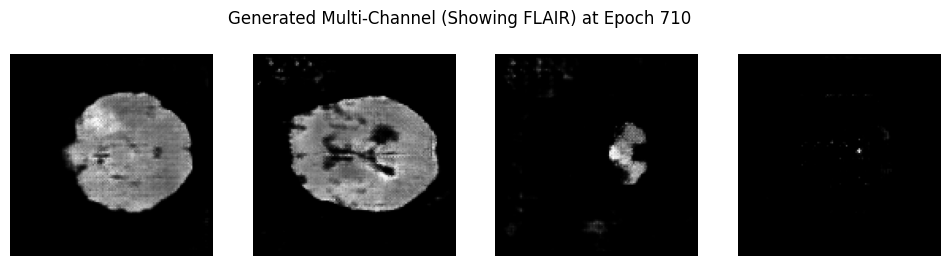

Epoch 711/1000
  Discriminator Loss: -18.1467 | Generator Loss: -18.5244 | D Accuracy: 0.7292
Epoch 712/1000
  Discriminator Loss: -12.8180 | Generator Loss: -6.0621 | D Accuracy: 0.6667
Epoch 713/1000
  Discriminator Loss: -19.3702 | Generator Loss: -41.3936 | D Accuracy: 0.6745
Epoch 714/1000
  Discriminator Loss: -14.2655 | Generator Loss: -45.8473 | D Accuracy: 0.6771
Epoch 715/1000
  Discriminator Loss: -16.5691 | Generator Loss: -87.5935 | D Accuracy: 0.6875
Epoch 716/1000
  Discriminator Loss: -13.0912 | Generator Loss: -57.3137 | D Accuracy: 0.6797
Epoch 717/1000
  Discriminator Loss: -14.9490 | Generator Loss: -60.3100 | D Accuracy: 0.6927
Epoch 718/1000
  Discriminator Loss: -16.1490 | Generator Loss: -90.9267 | D Accuracy: 0.6979
Epoch 719/1000
  Discriminator Loss: -18.5895 | Generator Loss: -16.0885 | D Accuracy: 0.6849
Epoch 720/1000
  Discriminator Loss: -13.9929 | Generator Loss: -8.0726 | D Accuracy: 0.6823


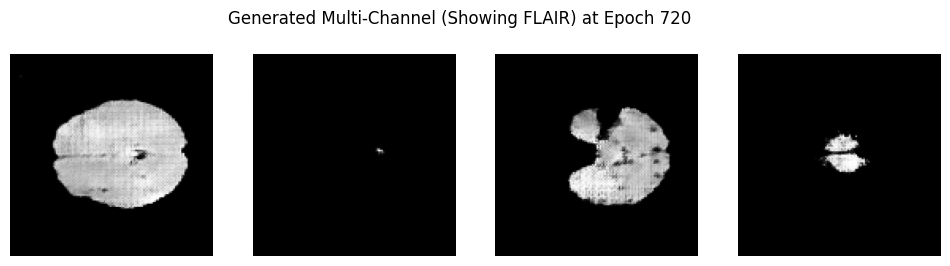

Epoch 721/1000
  Discriminator Loss: -15.4961 | Generator Loss: -39.8223 | D Accuracy: 0.7760
Epoch 722/1000
  Discriminator Loss: -15.2256 | Generator Loss: -38.6781 | D Accuracy: 0.6979
Epoch 723/1000
  Discriminator Loss: -15.2431 | Generator Loss: -18.4811 | D Accuracy: 0.7396
Epoch 724/1000
  Discriminator Loss: -11.6213 | Generator Loss: -26.9879 | D Accuracy: 0.7109
Epoch 725/1000
  Discriminator Loss: -15.8178 | Generator Loss: -37.2708 | D Accuracy: 0.7552
Epoch 726/1000
  Discriminator Loss: -14.8417 | Generator Loss: -37.4128 | D Accuracy: 0.7109
Epoch 727/1000
  Discriminator Loss: -15.9594 | Generator Loss: -17.2030 | D Accuracy: 0.6797
Epoch 728/1000
  Discriminator Loss: -16.1379 | Generator Loss: -32.6876 | D Accuracy: 0.7214
Epoch 729/1000
  Discriminator Loss: -17.0328 | Generator Loss: -40.8641 | D Accuracy: 0.7214
Epoch 730/1000
  Discriminator Loss: -20.0343 | Generator Loss: -48.0848 | D Accuracy: 0.7109


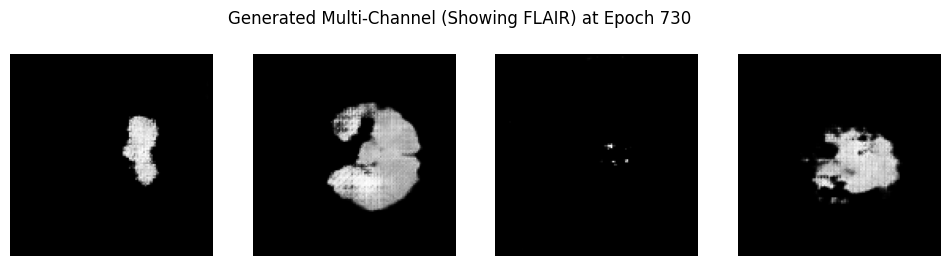

Epoch 731/1000
  Discriminator Loss: -15.3295 | Generator Loss: -48.9661 | D Accuracy: 0.6693
Epoch 732/1000
  Discriminator Loss: -14.6058 | Generator Loss: -45.3179 | D Accuracy: 0.7448
Epoch 733/1000
  Discriminator Loss: -14.2528 | Generator Loss: -10.2781 | D Accuracy: 0.7031
Epoch 734/1000
  Discriminator Loss: -14.6199 | Generator Loss: -19.0078 | D Accuracy: 0.7161
Epoch 735/1000
  Discriminator Loss: -12.4336 | Generator Loss: -47.7673 | D Accuracy: 0.7031
Epoch 736/1000
  Discriminator Loss: -14.8891 | Generator Loss: -40.6558 | D Accuracy: 0.7057
Epoch 737/1000
  Discriminator Loss: -17.7152 | Generator Loss: -23.0832 | D Accuracy: 0.7370
Epoch 738/1000
  Discriminator Loss: -14.4916 | Generator Loss: -43.3905 | D Accuracy: 0.7578
Epoch 739/1000
  Discriminator Loss: -14.5741 | Generator Loss: -4.4188 | D Accuracy: 0.7422
Epoch 740/1000
  Discriminator Loss: -17.6433 | Generator Loss: -15.2929 | D Accuracy: 0.6979


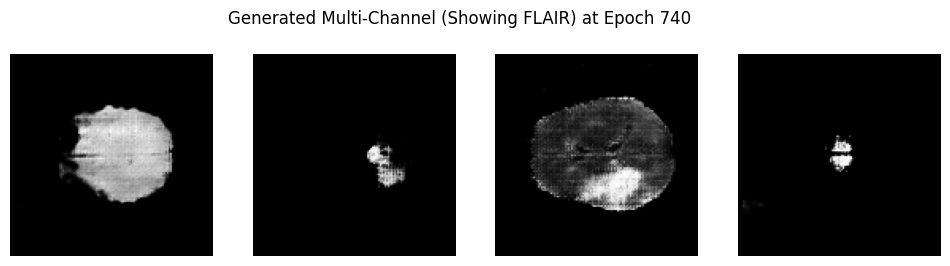

Epoch 741/1000
  Discriminator Loss: -20.4869 | Generator Loss: -28.8335 | D Accuracy: 0.7057
Epoch 742/1000
  Discriminator Loss: -12.8522 | Generator Loss: -30.8044 | D Accuracy: 0.6953
Epoch 743/1000
  Discriminator Loss: -14.4305 | Generator Loss: -23.6128 | D Accuracy: 0.7422
Epoch 744/1000
  Discriminator Loss: -17.1003 | Generator Loss: -59.0604 | D Accuracy: 0.7422
Epoch 745/1000
  Discriminator Loss: -17.0913 | Generator Loss: 3.5540 | D Accuracy: 0.7005
Epoch 746/1000
  Discriminator Loss: -14.8204 | Generator Loss: -21.4600 | D Accuracy: 0.7500
Epoch 747/1000
  Discriminator Loss: -15.8822 | Generator Loss: -30.2835 | D Accuracy: 0.7448
Epoch 748/1000
  Discriminator Loss: -18.9058 | Generator Loss: -70.2522 | D Accuracy: 0.7422
Epoch 749/1000
  Discriminator Loss: -14.4001 | Generator Loss: -30.4630 | D Accuracy: 0.7292
Epoch 750/1000
  Discriminator Loss: -13.7708 | Generator Loss: -10.2576 | D Accuracy: 0.6693


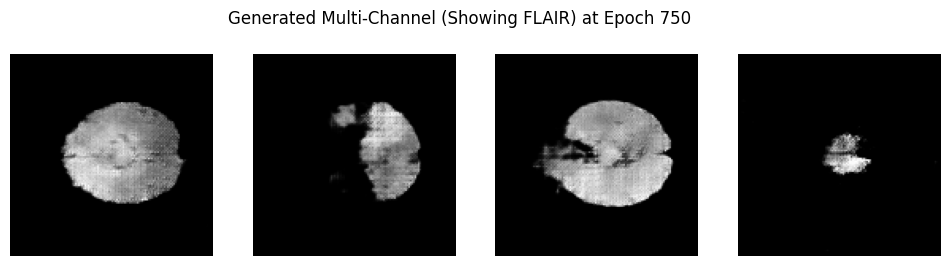

Epoch 751/1000
  Discriminator Loss: -18.3997 | Generator Loss: -24.2529 | D Accuracy: 0.7240
Epoch 752/1000
  Discriminator Loss: -15.7422 | Generator Loss: 21.4449 | D Accuracy: 0.6328
Epoch 753/1000
  Discriminator Loss: -16.2601 | Generator Loss: -82.0583 | D Accuracy: 0.7005
Epoch 754/1000
  Discriminator Loss: -14.8418 | Generator Loss: -39.9567 | D Accuracy: 0.7057
Epoch 755/1000
  Discriminator Loss: -17.9399 | Generator Loss: -23.9423 | D Accuracy: 0.7604
Epoch 756/1000
  Discriminator Loss: -16.1348 | Generator Loss: 27.3113 | D Accuracy: 0.7214
Epoch 757/1000
  Discriminator Loss: -14.5445 | Generator Loss: -40.5073 | D Accuracy: 0.7656
Epoch 758/1000
  Discriminator Loss: -15.1302 | Generator Loss: -23.7888 | D Accuracy: 0.7448
Epoch 759/1000
  Discriminator Loss: -12.9949 | Generator Loss: -54.7057 | D Accuracy: 0.6536
Epoch 760/1000
  Discriminator Loss: -13.7847 | Generator Loss: 2.0163 | D Accuracy: 0.7266


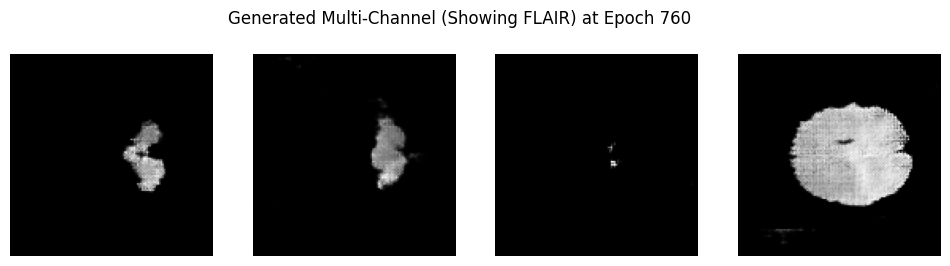

Epoch 761/1000
  Discriminator Loss: -16.1013 | Generator Loss: 17.5633 | D Accuracy: 0.6693
Epoch 762/1000
  Discriminator Loss: -14.8318 | Generator Loss: -68.0757 | D Accuracy: 0.7318
Epoch 763/1000
  Discriminator Loss: -13.6829 | Generator Loss: -38.6017 | D Accuracy: 0.7344
Epoch 764/1000
  Discriminator Loss: -17.7786 | Generator Loss: -23.1477 | D Accuracy: 0.7109
Epoch 765/1000
  Discriminator Loss: -14.9661 | Generator Loss: -31.5050 | D Accuracy: 0.7240
Epoch 766/1000
  Discriminator Loss: -14.3978 | Generator Loss: -43.8500 | D Accuracy: 0.7292
Epoch 767/1000
  Discriminator Loss: -14.8898 | Generator Loss: -38.4316 | D Accuracy: 0.7240
Epoch 768/1000
  Discriminator Loss: -14.1615 | Generator Loss: -66.1611 | D Accuracy: 0.7760
Epoch 769/1000
  Discriminator Loss: -16.3914 | Generator Loss: -43.3033 | D Accuracy: 0.7240
Epoch 770/1000
  Discriminator Loss: -14.3999 | Generator Loss: -7.6200 | D Accuracy: 0.7266


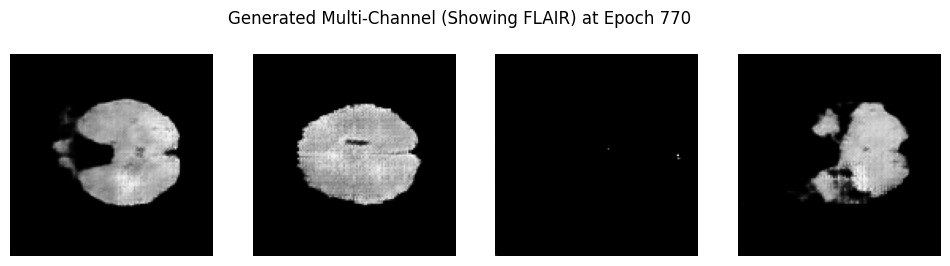

Epoch 771/1000
  Discriminator Loss: -14.5617 | Generator Loss: -73.0962 | D Accuracy: 0.6979
Epoch 772/1000
  Discriminator Loss: -14.2043 | Generator Loss: -81.5733 | D Accuracy: 0.6745
Epoch 773/1000
  Discriminator Loss: -14.7738 | Generator Loss: -47.0677 | D Accuracy: 0.7318
Epoch 774/1000
  Discriminator Loss: -15.4332 | Generator Loss: -52.4542 | D Accuracy: 0.6823
Epoch 775/1000
  Discriminator Loss: -12.8071 | Generator Loss: -37.1347 | D Accuracy: 0.7682
Epoch 776/1000
  Discriminator Loss: -17.4195 | Generator Loss: -11.0070 | D Accuracy: 0.7266
Epoch 777/1000
  Discriminator Loss: -14.7590 | Generator Loss: -25.7049 | D Accuracy: 0.7526
Epoch 778/1000
  Discriminator Loss: -13.3759 | Generator Loss: -38.8713 | D Accuracy: 0.6979
Epoch 779/1000
  Discriminator Loss: -12.1977 | Generator Loss: -45.8373 | D Accuracy: 0.7292
Epoch 780/1000
  Discriminator Loss: -14.1558 | Generator Loss: -15.4677 | D Accuracy: 0.7109


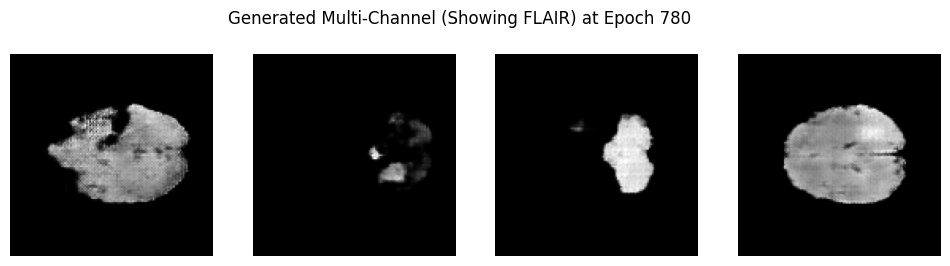

Epoch 781/1000
  Discriminator Loss: -14.6920 | Generator Loss: -52.4056 | D Accuracy: 0.7161
Epoch 782/1000
  Discriminator Loss: -14.0828 | Generator Loss: -58.1996 | D Accuracy: 0.7448
Epoch 783/1000
  Discriminator Loss: -16.8757 | Generator Loss: -46.8180 | D Accuracy: 0.7214
Epoch 784/1000
  Discriminator Loss: -14.0102 | Generator Loss: -29.1514 | D Accuracy: 0.6979
Epoch 785/1000
  Discriminator Loss: -14.2755 | Generator Loss: -33.5294 | D Accuracy: 0.7604
Epoch 786/1000
  Discriminator Loss: -18.0635 | Generator Loss: -4.0895 | D Accuracy: 0.7812
Epoch 787/1000
  Discriminator Loss: -15.6844 | Generator Loss: -32.0448 | D Accuracy: 0.7005
Epoch 788/1000
  Discriminator Loss: -14.5868 | Generator Loss: -65.5988 | D Accuracy: 0.6849
Epoch 789/1000
  Discriminator Loss: -14.1734 | Generator Loss: -28.4747 | D Accuracy: 0.6953
Epoch 790/1000
  Discriminator Loss: -15.1751 | Generator Loss: -47.3795 | D Accuracy: 0.7292


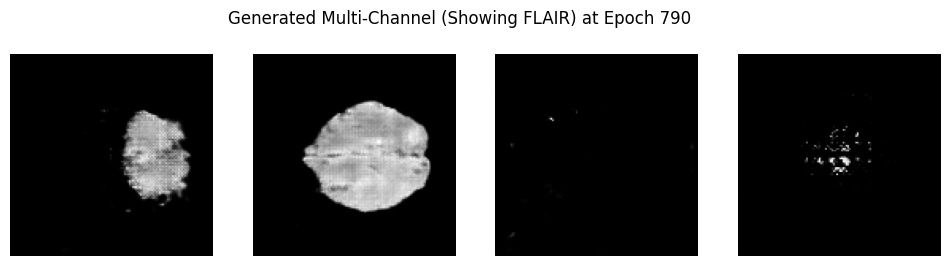

Epoch 791/1000
  Discriminator Loss: -15.4350 | Generator Loss: 1.6159 | D Accuracy: 0.7578
Epoch 792/1000
  Discriminator Loss: -19.4391 | Generator Loss: -32.4265 | D Accuracy: 0.7318
Epoch 793/1000
  Discriminator Loss: -14.4428 | Generator Loss: -66.5873 | D Accuracy: 0.6875
Epoch 794/1000
  Discriminator Loss: -15.3236 | Generator Loss: -6.7097 | D Accuracy: 0.6615
Epoch 795/1000
  Discriminator Loss: -18.5469 | Generator Loss: -30.1606 | D Accuracy: 0.7292
Epoch 796/1000
  Discriminator Loss: -16.0602 | Generator Loss: -72.0364 | D Accuracy: 0.7214
Epoch 797/1000
  Discriminator Loss: -15.0158 | Generator Loss: -29.5850 | D Accuracy: 0.7240
Epoch 798/1000
  Discriminator Loss: -15.2854 | Generator Loss: -45.0875 | D Accuracy: 0.7708
Epoch 799/1000
  Discriminator Loss: -15.2456 | Generator Loss: -64.2540 | D Accuracy: 0.7578
Epoch 800/1000
  Discriminator Loss: -15.6383 | Generator Loss: -61.7381 | D Accuracy: 0.7422


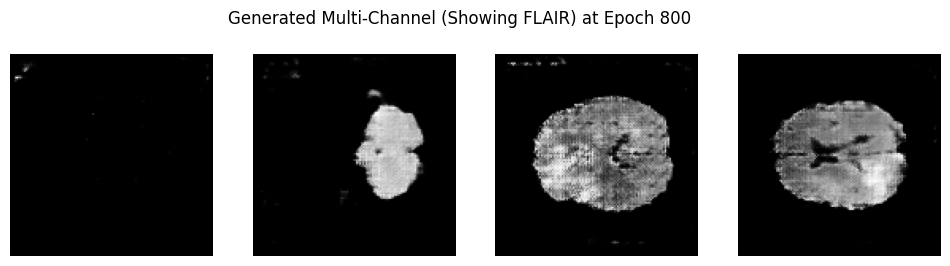

Epoch 801/1000
  Discriminator Loss: -21.7348 | Generator Loss: -10.1070 | D Accuracy: 0.7214
Epoch 802/1000
  Discriminator Loss: -13.2130 | Generator Loss: -16.5388 | D Accuracy: 0.7370
Epoch 803/1000
  Discriminator Loss: -15.5015 | Generator Loss: -64.0364 | D Accuracy: 0.7266
Epoch 804/1000
  Discriminator Loss: -18.0728 | Generator Loss: -39.8482 | D Accuracy: 0.7240
Epoch 805/1000
  Discriminator Loss: -15.6104 | Generator Loss: -39.9931 | D Accuracy: 0.7578
Epoch 806/1000
  Discriminator Loss: -12.8446 | Generator Loss: -52.7714 | D Accuracy: 0.7891
Epoch 807/1000
  Discriminator Loss: -17.5240 | Generator Loss: -72.4504 | D Accuracy: 0.7214
Epoch 808/1000
  Discriminator Loss: -12.6989 | Generator Loss: -58.5038 | D Accuracy: 0.7370
Epoch 809/1000
  Discriminator Loss: -18.3051 | Generator Loss: -34.3358 | D Accuracy: 0.7344
Epoch 810/1000
  Discriminator Loss: -12.8345 | Generator Loss: -17.9351 | D Accuracy: 0.7318


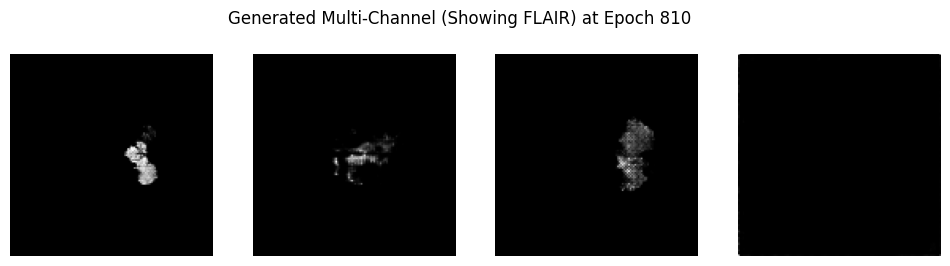

Epoch 811/1000
  Discriminator Loss: -15.0361 | Generator Loss: -50.9562 | D Accuracy: 0.7630
Epoch 812/1000
  Discriminator Loss: -14.8649 | Generator Loss: -47.1762 | D Accuracy: 0.7682
Epoch 813/1000
  Discriminator Loss: -13.9950 | Generator Loss: -29.8988 | D Accuracy: 0.7057
Epoch 814/1000
  Discriminator Loss: -16.3950 | Generator Loss: -39.8524 | D Accuracy: 0.7552
Epoch 815/1000
  Discriminator Loss: -17.6764 | Generator Loss: -45.7911 | D Accuracy: 0.7031
Epoch 816/1000
  Discriminator Loss: -16.8446 | Generator Loss: -18.7309 | D Accuracy: 0.6458
Epoch 817/1000
  Discriminator Loss: -17.6936 | Generator Loss: -38.0323 | D Accuracy: 0.6927
Epoch 818/1000
  Discriminator Loss: -17.7589 | Generator Loss: -75.9592 | D Accuracy: 0.7057
Epoch 819/1000
  Discriminator Loss: -14.9538 | Generator Loss: -58.2555 | D Accuracy: 0.7682
Epoch 820/1000
  Discriminator Loss: -14.7147 | Generator Loss: -28.0841 | D Accuracy: 0.7656


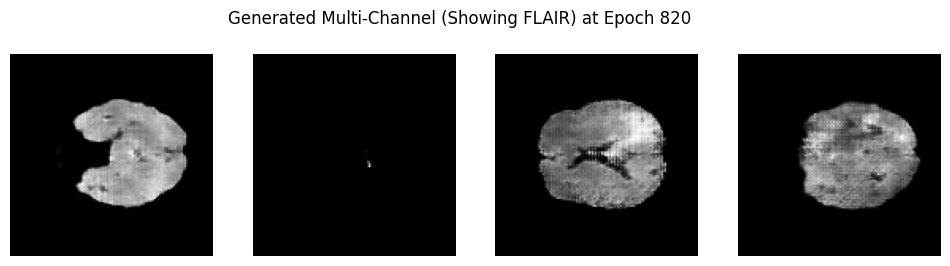

Epoch 821/1000
  Discriminator Loss: -14.7077 | Generator Loss: -48.2355 | D Accuracy: 0.7396
Epoch 822/1000
  Discriminator Loss: -15.4900 | Generator Loss: -12.7052 | D Accuracy: 0.6432
Epoch 823/1000
  Discriminator Loss: -16.5503 | Generator Loss: -28.5822 | D Accuracy: 0.7500
Epoch 824/1000
  Discriminator Loss: -14.7054 | Generator Loss: -13.0710 | D Accuracy: 0.7292
Epoch 825/1000
  Discriminator Loss: -13.9288 | Generator Loss: -28.3721 | D Accuracy: 0.7917
Epoch 826/1000
  Discriminator Loss: -17.6897 | Generator Loss: -16.4763 | D Accuracy: 0.7865
Epoch 827/1000
  Discriminator Loss: -14.3879 | Generator Loss: -25.3552 | D Accuracy: 0.7109
Epoch 828/1000
  Discriminator Loss: -16.9149 | Generator Loss: -44.5499 | D Accuracy: 0.7786
Epoch 829/1000
  Discriminator Loss: -15.5610 | Generator Loss: -25.2042 | D Accuracy: 0.7786
Epoch 830/1000
  Discriminator Loss: -16.2307 | Generator Loss: -25.7883 | D Accuracy: 0.7240


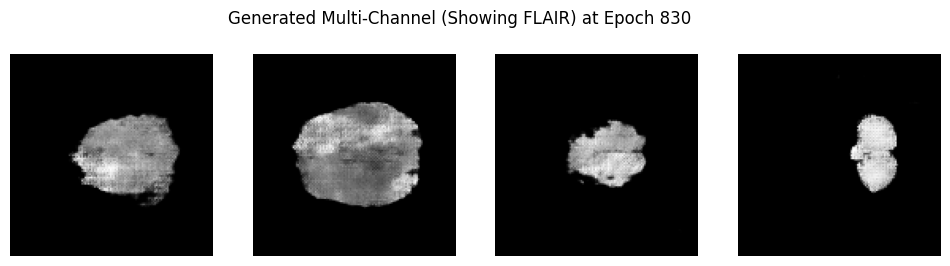

Epoch 831/1000
  Discriminator Loss: -18.5992 | Generator Loss: -66.2857 | D Accuracy: 0.6354
Epoch 832/1000
  Discriminator Loss: -16.1769 | Generator Loss: -37.9749 | D Accuracy: 0.7083
Epoch 833/1000
  Discriminator Loss: -15.0986 | Generator Loss: 11.8200 | D Accuracy: 0.6875
Epoch 834/1000
  Discriminator Loss: -19.4168 | Generator Loss: -49.2040 | D Accuracy: 0.7005
Epoch 835/1000
  Discriminator Loss: -15.6176 | Generator Loss: -22.4136 | D Accuracy: 0.6927
Epoch 836/1000
  Discriminator Loss: -18.4687 | Generator Loss: -52.2093 | D Accuracy: 0.6797
Epoch 837/1000
  Discriminator Loss: -17.5997 | Generator Loss: 5.7548 | D Accuracy: 0.6979
Epoch 838/1000
  Discriminator Loss: -14.3969 | Generator Loss: -19.2019 | D Accuracy: 0.7214
Epoch 839/1000
  Discriminator Loss: -14.7500 | Generator Loss: -42.6308 | D Accuracy: 0.6693
Epoch 840/1000
  Discriminator Loss: -16.2308 | Generator Loss: -44.2509 | D Accuracy: 0.7396


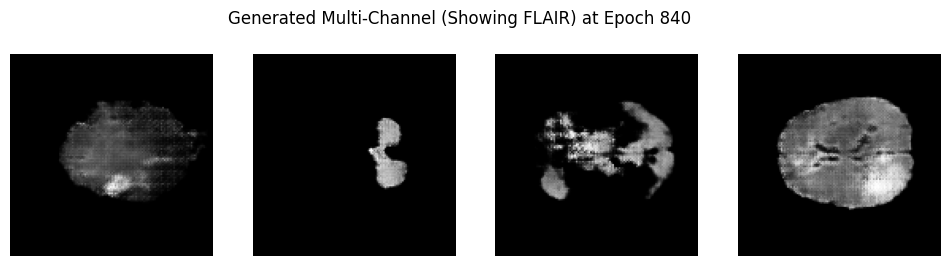

Epoch 841/1000
  Discriminator Loss: -13.1941 | Generator Loss: -44.1685 | D Accuracy: 0.7292
Epoch 842/1000
  Discriminator Loss: -15.4052 | Generator Loss: -56.9515 | D Accuracy: 0.7578
Epoch 843/1000
  Discriminator Loss: -14.9632 | Generator Loss: -9.7742 | D Accuracy: 0.7083
Epoch 844/1000
  Discriminator Loss: -15.6746 | Generator Loss: -60.2763 | D Accuracy: 0.7161
Epoch 845/1000
  Discriminator Loss: -15.0547 | Generator Loss: -60.3664 | D Accuracy: 0.7917
Epoch 846/1000
  Discriminator Loss: -15.1382 | Generator Loss: -44.8713 | D Accuracy: 0.6510
Epoch 847/1000
  Discriminator Loss: -20.0341 | Generator Loss: 53.1112 | D Accuracy: 0.6797
Epoch 848/1000
  Discriminator Loss: -16.5634 | Generator Loss: -28.7594 | D Accuracy: 0.7083
Epoch 849/1000
  Discriminator Loss: -14.9771 | Generator Loss: -51.1354 | D Accuracy: 0.7318
Epoch 850/1000
  Discriminator Loss: -14.8831 | Generator Loss: -54.6066 | D Accuracy: 0.7448


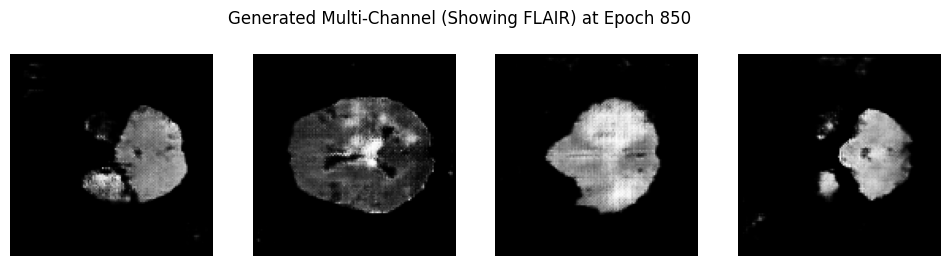

Epoch 851/1000
  Discriminator Loss: -13.8450 | Generator Loss: -43.3019 | D Accuracy: 0.7500
Epoch 852/1000
  Discriminator Loss: -16.1671 | Generator Loss: -12.8680 | D Accuracy: 0.7188
Epoch 853/1000
  Discriminator Loss: -15.0882 | Generator Loss: 6.2949 | D Accuracy: 0.6953
Epoch 854/1000
  Discriminator Loss: -16.4072 | Generator Loss: 12.4472 | D Accuracy: 0.7083
Epoch 855/1000
  Discriminator Loss: -15.7869 | Generator Loss: 34.1734 | D Accuracy: 0.6589
Epoch 856/1000
  Discriminator Loss: -17.4437 | Generator Loss: -21.7837 | D Accuracy: 0.6901
Epoch 857/1000
  Discriminator Loss: -16.9496 | Generator Loss: -31.0426 | D Accuracy: 0.7318
Epoch 858/1000
  Discriminator Loss: -13.1713 | Generator Loss: -33.1461 | D Accuracy: 0.7005
Epoch 859/1000
  Discriminator Loss: -15.2032 | Generator Loss: -78.0436 | D Accuracy: 0.7214
Epoch 860/1000
  Discriminator Loss: -16.5041 | Generator Loss: -43.5602 | D Accuracy: 0.7083


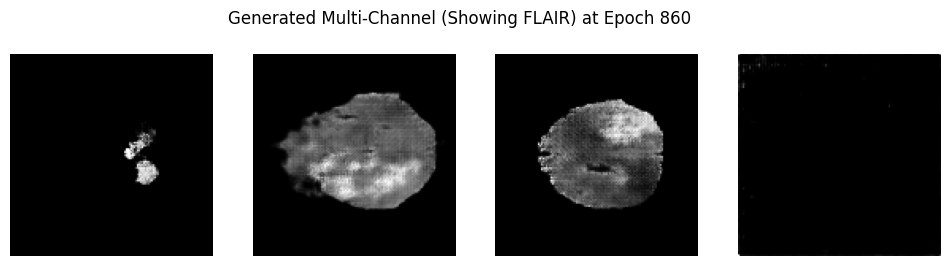

Epoch 861/1000
  Discriminator Loss: -17.0007 | Generator Loss: 5.3642 | D Accuracy: 0.7370
Epoch 862/1000
  Discriminator Loss: -13.9994 | Generator Loss: 4.6215 | D Accuracy: 0.7344
Epoch 863/1000
  Discriminator Loss: -17.1251 | Generator Loss: -58.4691 | D Accuracy: 0.7161
Epoch 864/1000
  Discriminator Loss: -14.4456 | Generator Loss: -13.0721 | D Accuracy: 0.7135
Epoch 865/1000
  Discriminator Loss: -14.8665 | Generator Loss: -21.0645 | D Accuracy: 0.7500
Epoch 866/1000
  Discriminator Loss: -14.7583 | Generator Loss: -33.3813 | D Accuracy: 0.6875
Epoch 867/1000
  Discriminator Loss: -15.0135 | Generator Loss: -33.1123 | D Accuracy: 0.7760
Epoch 868/1000
  Discriminator Loss: -13.8485 | Generator Loss: -31.2104 | D Accuracy: 0.7786
Epoch 869/1000
  Discriminator Loss: -16.8827 | Generator Loss: -0.5815 | D Accuracy: 0.6927
Epoch 870/1000
  Discriminator Loss: -18.1379 | Generator Loss: -40.3468 | D Accuracy: 0.7422


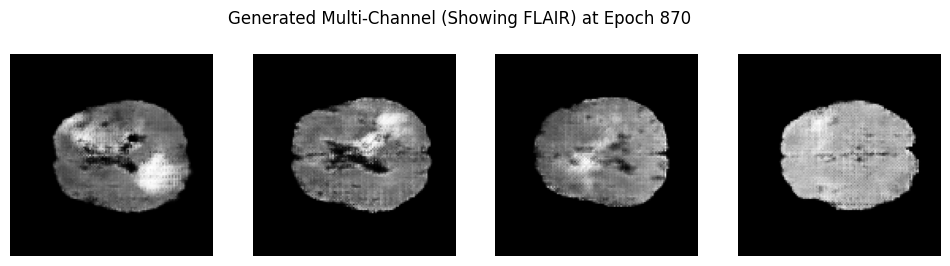

Epoch 871/1000
  Discriminator Loss: -18.2842 | Generator Loss: -39.8614 | D Accuracy: 0.7656
Epoch 872/1000
  Discriminator Loss: -14.8298 | Generator Loss: -17.4063 | D Accuracy: 0.7057
Epoch 873/1000
  Discriminator Loss: -19.2610 | Generator Loss: -34.9623 | D Accuracy: 0.7552
Epoch 874/1000
  Discriminator Loss: -13.6217 | Generator Loss: -33.1823 | D Accuracy: 0.7552
Epoch 875/1000
  Discriminator Loss: -17.8933 | Generator Loss: 2.4191 | D Accuracy: 0.7240
Epoch 876/1000
  Discriminator Loss: -18.6740 | Generator Loss: -8.9168 | D Accuracy: 0.7005
Epoch 877/1000
  Discriminator Loss: -18.5191 | Generator Loss: -35.8461 | D Accuracy: 0.7083
Epoch 878/1000
  Discriminator Loss: -15.3934 | Generator Loss: -13.5726 | D Accuracy: 0.7891
Epoch 879/1000
  Discriminator Loss: -17.0284 | Generator Loss: -25.9182 | D Accuracy: 0.7109
Epoch 880/1000
  Discriminator Loss: -17.5208 | Generator Loss: -53.6878 | D Accuracy: 0.7448


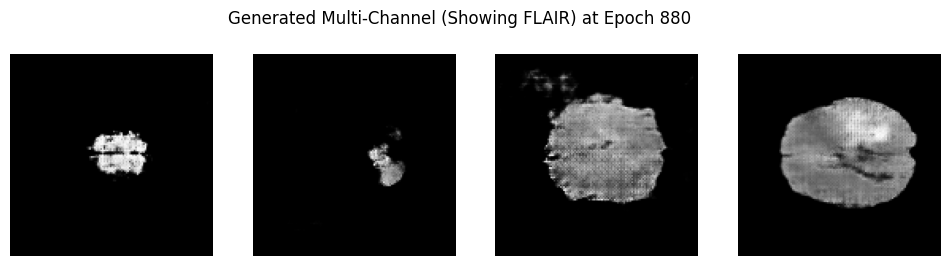

Epoch 881/1000
  Discriminator Loss: -13.7709 | Generator Loss: -36.9008 | D Accuracy: 0.6927
Epoch 882/1000
  Discriminator Loss: -18.9645 | Generator Loss: -4.0532 | D Accuracy: 0.6901
Epoch 883/1000
  Discriminator Loss: -16.1345 | Generator Loss: -37.7450 | D Accuracy: 0.7422
Epoch 884/1000
  Discriminator Loss: -16.5332 | Generator Loss: -33.8127 | D Accuracy: 0.6510
Epoch 885/1000
  Discriminator Loss: -13.7890 | Generator Loss: -38.6330 | D Accuracy: 0.6484
Epoch 886/1000
  Discriminator Loss: -18.3524 | Generator Loss: -37.7693 | D Accuracy: 0.7109
Epoch 887/1000
  Discriminator Loss: -15.3272 | Generator Loss: -53.9639 | D Accuracy: 0.7109
Epoch 888/1000
  Discriminator Loss: -16.1419 | Generator Loss: -40.2255 | D Accuracy: 0.7214
Epoch 889/1000
  Discriminator Loss: -13.5036 | Generator Loss: -30.9696 | D Accuracy: 0.7344
Epoch 890/1000
  Discriminator Loss: -23.4584 | Generator Loss: -27.2596 | D Accuracy: 0.7474


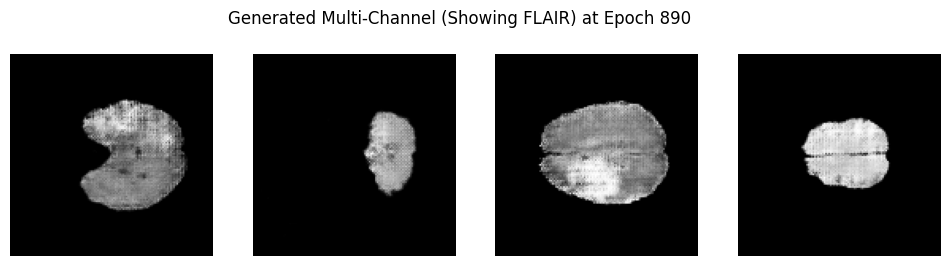

Epoch 891/1000
  Discriminator Loss: -18.1383 | Generator Loss: -99.1948 | D Accuracy: 0.7083
Epoch 892/1000
  Discriminator Loss: -17.4112 | Generator Loss: -75.9108 | D Accuracy: 0.6771
Epoch 893/1000
  Discriminator Loss: -16.7498 | Generator Loss: -27.2894 | D Accuracy: 0.7240
Epoch 894/1000
  Discriminator Loss: -12.8349 | Generator Loss: -20.1364 | D Accuracy: 0.7578
Epoch 895/1000
  Discriminator Loss: -16.7331 | Generator Loss: -52.6979 | D Accuracy: 0.7526
Epoch 896/1000
  Discriminator Loss: -15.6984 | Generator Loss: -49.3849 | D Accuracy: 0.7370
Epoch 897/1000
  Discriminator Loss: -20.6798 | Generator Loss: -16.0234 | D Accuracy: 0.7005
Epoch 898/1000
  Discriminator Loss: -14.7868 | Generator Loss: -12.6737 | D Accuracy: 0.6849
Epoch 899/1000
  Discriminator Loss: -19.5721 | Generator Loss: -11.2287 | D Accuracy: 0.6745
Epoch 900/1000
  Discriminator Loss: -19.8395 | Generator Loss: -83.0375 | D Accuracy: 0.7370


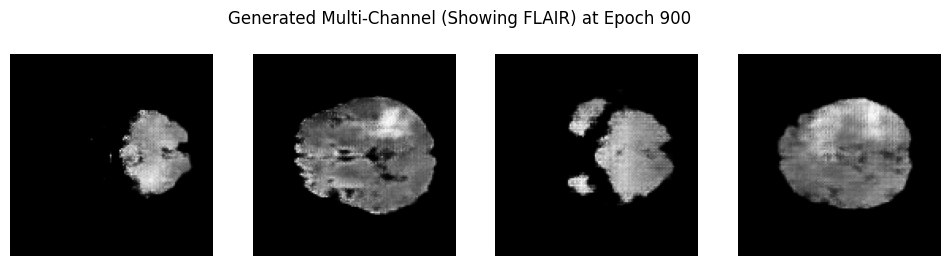

Epoch 901/1000
  Discriminator Loss: -15.5305 | Generator Loss: -69.9785 | D Accuracy: 0.6875
Epoch 902/1000
  Discriminator Loss: -15.8926 | Generator Loss: -20.5408 | D Accuracy: 0.7474
Epoch 903/1000
  Discriminator Loss: -20.3335 | Generator Loss: -46.3184 | D Accuracy: 0.7786
Epoch 904/1000
  Discriminator Loss: -14.7247 | Generator Loss: -53.7995 | D Accuracy: 0.7161
Epoch 905/1000
  Discriminator Loss: -20.7242 | Generator Loss: -27.1802 | D Accuracy: 0.6901
Epoch 906/1000
  Discriminator Loss: -15.5200 | Generator Loss: -19.2919 | D Accuracy: 0.7266
Epoch 907/1000
  Discriminator Loss: -15.2155 | Generator Loss: -44.0236 | D Accuracy: 0.7214
Epoch 908/1000
  Discriminator Loss: -16.0749 | Generator Loss: -57.2417 | D Accuracy: 0.7083
Epoch 909/1000
  Discriminator Loss: -20.9650 | Generator Loss: -50.4296 | D Accuracy: 0.7109
Epoch 910/1000
  Discriminator Loss: -14.8634 | Generator Loss: -4.1705 | D Accuracy: 0.7188


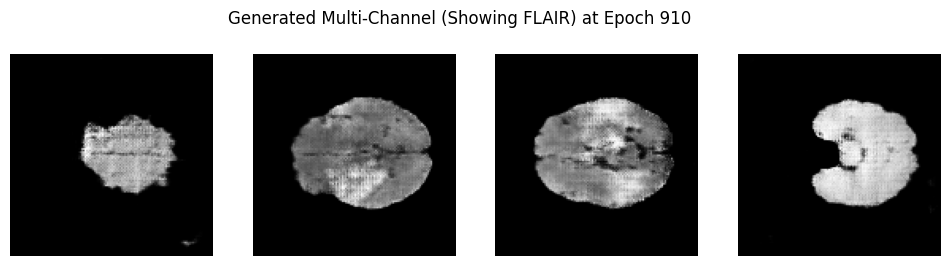

Epoch 911/1000
  Discriminator Loss: -20.8048 | Generator Loss: -60.7313 | D Accuracy: 0.6901
Epoch 912/1000
  Discriminator Loss: -17.6568 | Generator Loss: 9.0902 | D Accuracy: 0.6380
Epoch 913/1000
  Discriminator Loss: -19.0845 | Generator Loss: -26.3859 | D Accuracy: 0.6354
Epoch 914/1000
  Discriminator Loss: -14.6303 | Generator Loss: -20.3482 | D Accuracy: 0.7161
Epoch 915/1000
  Discriminator Loss: -15.3082 | Generator Loss: -11.3236 | D Accuracy: 0.6693
Epoch 916/1000
  Discriminator Loss: -13.0116 | Generator Loss: -12.2991 | D Accuracy: 0.7422
Epoch 917/1000
  Discriminator Loss: -14.8023 | Generator Loss: -32.0564 | D Accuracy: 0.7188
Epoch 918/1000
  Discriminator Loss: -14.4616 | Generator Loss: -28.1452 | D Accuracy: 0.7474
Epoch 919/1000
  Discriminator Loss: -19.2917 | Generator Loss: -46.8947 | D Accuracy: 0.7005
Epoch 920/1000
  Discriminator Loss: -14.7013 | Generator Loss: -40.0407 | D Accuracy: 0.7031


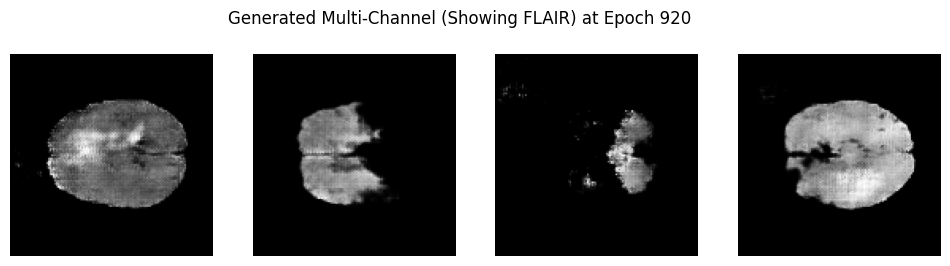

Epoch 921/1000
  Discriminator Loss: -15.7881 | Generator Loss: -34.8947 | D Accuracy: 0.7005
Epoch 922/1000
  Discriminator Loss: -20.3727 | Generator Loss: -30.2722 | D Accuracy: 0.6875
Epoch 923/1000
  Discriminator Loss: -15.2388 | Generator Loss: -7.3897 | D Accuracy: 0.7135
Epoch 924/1000
  Discriminator Loss: -13.8998 | Generator Loss: 0.6193 | D Accuracy: 0.7318
Epoch 925/1000
  Discriminator Loss: -18.5546 | Generator Loss: -27.5563 | D Accuracy: 0.7318
Epoch 926/1000
  Discriminator Loss: -15.3816 | Generator Loss: -22.0804 | D Accuracy: 0.7240
Epoch 927/1000
  Discriminator Loss: -15.9580 | Generator Loss: -23.9482 | D Accuracy: 0.7135
Epoch 928/1000
  Discriminator Loss: -22.4256 | Generator Loss: -38.4653 | D Accuracy: 0.7057
Epoch 929/1000
  Discriminator Loss: -24.5291 | Generator Loss: -9.3590 | D Accuracy: 0.7057
Epoch 930/1000
  Discriminator Loss: -17.0793 | Generator Loss: 55.4523 | D Accuracy: 0.6380


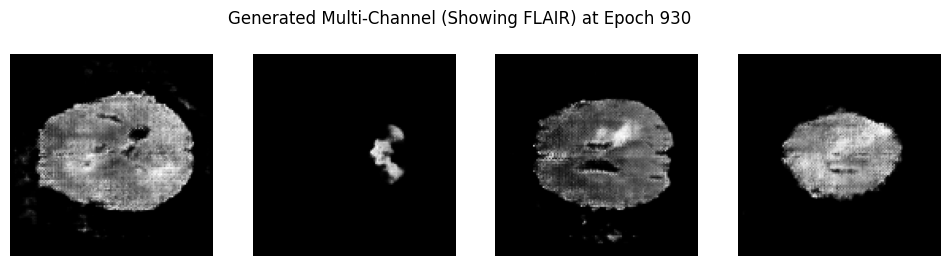

Epoch 931/1000
  Discriminator Loss: -15.0808 | Generator Loss: -4.6009 | D Accuracy: 0.7344
Epoch 932/1000
  Discriminator Loss: -15.3147 | Generator Loss: -55.8174 | D Accuracy: 0.6979
Epoch 933/1000
  Discriminator Loss: -16.5809 | Generator Loss: -39.2536 | D Accuracy: 0.6849
Epoch 934/1000
  Discriminator Loss: -17.8156 | Generator Loss: -34.3204 | D Accuracy: 0.6745
Epoch 935/1000
  Discriminator Loss: -20.0739 | Generator Loss: -7.2983 | D Accuracy: 0.6615
Epoch 936/1000
  Discriminator Loss: -18.2033 | Generator Loss: -33.1282 | D Accuracy: 0.7448
Epoch 937/1000
  Discriminator Loss: -17.2004 | Generator Loss: -26.5558 | D Accuracy: 0.7057
Epoch 938/1000
  Discriminator Loss: -18.0065 | Generator Loss: -6.3644 | D Accuracy: 0.6823
Epoch 939/1000
  Discriminator Loss: -26.7467 | Generator Loss: 27.4509 | D Accuracy: 0.6641
Epoch 940/1000
  Discriminator Loss: -11.4940 | Generator Loss: 23.3554 | D Accuracy: 0.6536


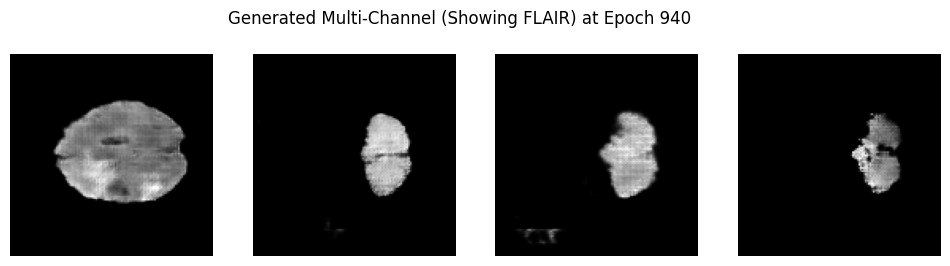

Epoch 941/1000
  Discriminator Loss: -16.3733 | Generator Loss: -67.5315 | D Accuracy: 0.7005
Epoch 942/1000
  Discriminator Loss: -13.5844 | Generator Loss: -0.4240 | D Accuracy: 0.7344
Epoch 943/1000
  Discriminator Loss: -14.0772 | Generator Loss: -27.3463 | D Accuracy: 0.7292
Epoch 944/1000
  Discriminator Loss: -16.8026 | Generator Loss: -24.5998 | D Accuracy: 0.6719
Epoch 945/1000
  Discriminator Loss: -18.1254 | Generator Loss: -35.9829 | D Accuracy: 0.7240
Epoch 946/1000
  Discriminator Loss: -17.0842 | Generator Loss: -30.3230 | D Accuracy: 0.6589
Epoch 947/1000
  Discriminator Loss: -17.2411 | Generator Loss: -1.9475 | D Accuracy: 0.7161
Epoch 948/1000
  Discriminator Loss: -24.3936 | Generator Loss: 89.0015 | D Accuracy: 0.6745
Epoch 949/1000
  Discriminator Loss: -19.8428 | Generator Loss: -3.4452 | D Accuracy: 0.7318
Epoch 950/1000
  Discriminator Loss: -14.8863 | Generator Loss: -10.5205 | D Accuracy: 0.7083


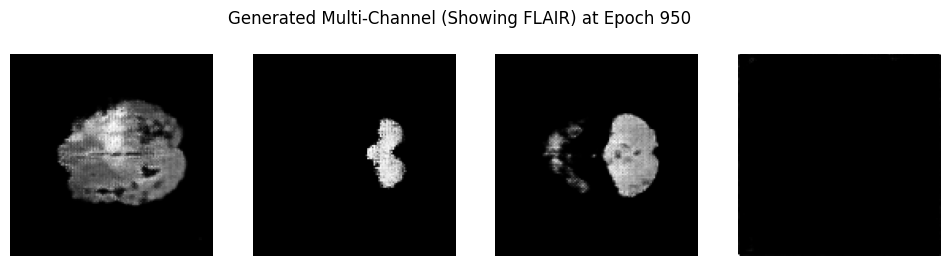

Epoch 951/1000
  Discriminator Loss: -15.5552 | Generator Loss: -37.8796 | D Accuracy: 0.7318
Epoch 952/1000
  Discriminator Loss: -17.9641 | Generator Loss: -21.6421 | D Accuracy: 0.7057
Epoch 953/1000
  Discriminator Loss: -15.3439 | Generator Loss: -42.0384 | D Accuracy: 0.7057
Epoch 954/1000
  Discriminator Loss: -17.7491 | Generator Loss: -3.9616 | D Accuracy: 0.7630
Epoch 955/1000
  Discriminator Loss: -14.7699 | Generator Loss: -12.5288 | D Accuracy: 0.7422
Epoch 956/1000
  Discriminator Loss: -16.8866 | Generator Loss: -24.9735 | D Accuracy: 0.7500
Epoch 957/1000
  Discriminator Loss: -20.0807 | Generator Loss: -9.5814 | D Accuracy: 0.7214
Epoch 958/1000
  Discriminator Loss: -17.0447 | Generator Loss: -46.7081 | D Accuracy: 0.7708
Epoch 959/1000
  Discriminator Loss: -14.9772 | Generator Loss: -16.0492 | D Accuracy: 0.7812
Epoch 960/1000
  Discriminator Loss: -25.3197 | Generator Loss: -76.1186 | D Accuracy: 0.7214


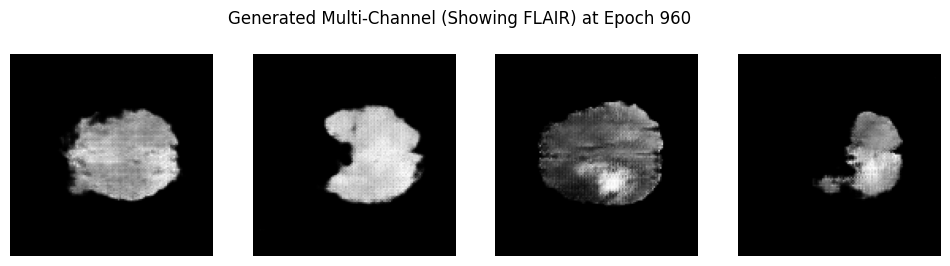

Epoch 961/1000
  Discriminator Loss: -15.4789 | Generator Loss: -34.9948 | D Accuracy: 0.6693
Epoch 962/1000
  Discriminator Loss: -20.0304 | Generator Loss: 1.9254 | D Accuracy: 0.6849
Epoch 963/1000
  Discriminator Loss: -15.7071 | Generator Loss: -25.5499 | D Accuracy: 0.7135
Epoch 964/1000
  Discriminator Loss: -18.2885 | Generator Loss: -26.4201 | D Accuracy: 0.6927
Epoch 965/1000
  Discriminator Loss: -14.6563 | Generator Loss: -6.2832 | D Accuracy: 0.7396
Epoch 966/1000
  Discriminator Loss: -19.8274 | Generator Loss: -13.0220 | D Accuracy: 0.7500
Epoch 967/1000
  Discriminator Loss: -17.0371 | Generator Loss: -63.4865 | D Accuracy: 0.6693
Epoch 968/1000
  Discriminator Loss: -20.8459 | Generator Loss: -14.8646 | D Accuracy: 0.6953
Epoch 969/1000
  Discriminator Loss: -14.8943 | Generator Loss: -1.9660 | D Accuracy: 0.7161
Epoch 970/1000
  Discriminator Loss: -16.4615 | Generator Loss: -14.2433 | D Accuracy: 0.7109


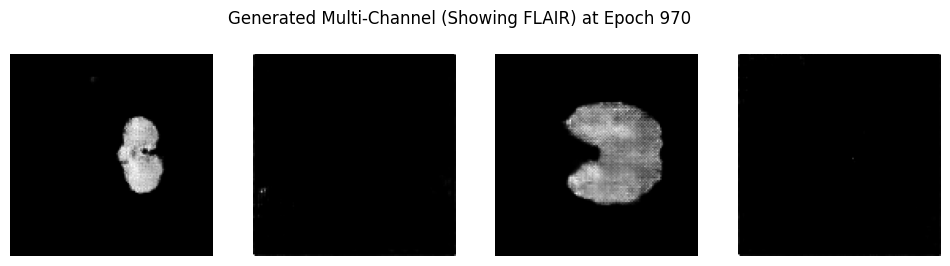

Epoch 971/1000
  Discriminator Loss: -17.6864 | Generator Loss: -18.6930 | D Accuracy: 0.6797
Epoch 972/1000
  Discriminator Loss: -19.2338 | Generator Loss: -30.8435 | D Accuracy: 0.6875
Epoch 973/1000
  Discriminator Loss: -18.9937 | Generator Loss: -58.9912 | D Accuracy: 0.7188
Epoch 974/1000
  Discriminator Loss: -16.0159 | Generator Loss: -17.1605 | D Accuracy: 0.6901
Epoch 975/1000
  Discriminator Loss: -17.1547 | Generator Loss: -2.5090 | D Accuracy: 0.6979
Epoch 976/1000
  Discriminator Loss: -13.6074 | Generator Loss: 39.4248 | D Accuracy: 0.7292
Epoch 977/1000
  Discriminator Loss: -17.4663 | Generator Loss: -15.0848 | D Accuracy: 0.7370
Epoch 978/1000
  Discriminator Loss: -15.5935 | Generator Loss: -50.6375 | D Accuracy: 0.7292
Epoch 979/1000
  Discriminator Loss: -16.5481 | Generator Loss: -47.5033 | D Accuracy: 0.6953
Epoch 980/1000
  Discriminator Loss: -21.5444 | Generator Loss: -51.5667 | D Accuracy: 0.6979


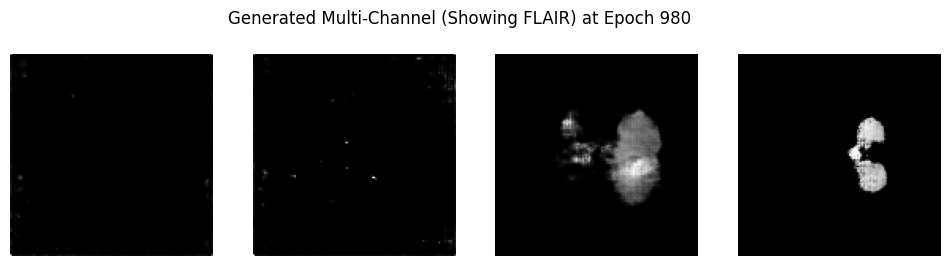

Epoch 981/1000
  Discriminator Loss: -16.8563 | Generator Loss: 42.4207 | D Accuracy: 0.7135
Epoch 982/1000
  Discriminator Loss: -17.3371 | Generator Loss: -21.7911 | D Accuracy: 0.6797
Epoch 983/1000
  Discriminator Loss: -19.4051 | Generator Loss: -67.0799 | D Accuracy: 0.7292
Epoch 984/1000
  Discriminator Loss: -21.3753 | Generator Loss: -96.7821 | D Accuracy: 0.7031
Epoch 985/1000
  Discriminator Loss: -17.1561 | Generator Loss: -53.4231 | D Accuracy: 0.6849
Epoch 986/1000
  Discriminator Loss: -16.1196 | Generator Loss: -36.5213 | D Accuracy: 0.6797
Epoch 987/1000
  Discriminator Loss: -15.3891 | Generator Loss: -27.8266 | D Accuracy: 0.7161
Epoch 988/1000
  Discriminator Loss: -15.8634 | Generator Loss: -42.0113 | D Accuracy: 0.7370
Epoch 989/1000
  Discriminator Loss: -20.9067 | Generator Loss: -24.0134 | D Accuracy: 0.6615
Epoch 990/1000
  Discriminator Loss: -17.3152 | Generator Loss: 8.3671 | D Accuracy: 0.7188


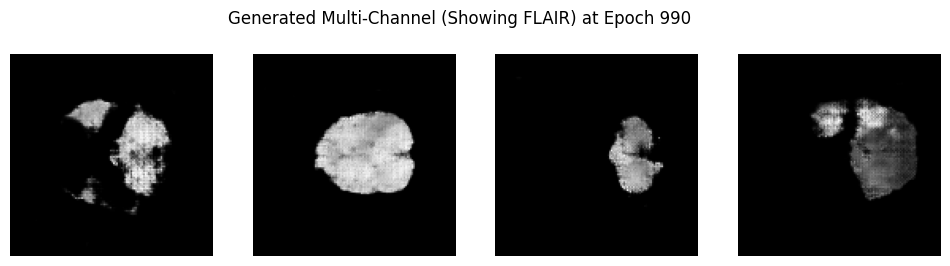

Epoch 991/1000
  Discriminator Loss: -17.6469 | Generator Loss: 36.6364 | D Accuracy: 0.7161
Epoch 992/1000
  Discriminator Loss: -14.3296 | Generator Loss: -19.5839 | D Accuracy: 0.7214
Epoch 993/1000
  Discriminator Loss: -15.1991 | Generator Loss: -42.9381 | D Accuracy: 0.7656
Epoch 994/1000
  Discriminator Loss: -17.1585 | Generator Loss: -34.2920 | D Accuracy: 0.7266
Epoch 995/1000
  Discriminator Loss: -15.4475 | Generator Loss: -67.6267 | D Accuracy: 0.7031
Epoch 996/1000
  Discriminator Loss: -18.8975 | Generator Loss: -2.4206 | D Accuracy: 0.7083
Epoch 997/1000
  Discriminator Loss: -22.1273 | Generator Loss: -64.2665 | D Accuracy: 0.6745
Epoch 998/1000
  Discriminator Loss: -17.5541 | Generator Loss: -3.8095 | D Accuracy: 0.7161
Epoch 999/1000
  Discriminator Loss: -17.4772 | Generator Loss: -18.6941 | D Accuracy: 0.6927
Epoch 1000/1000
  Discriminator Loss: -14.8435 | Generator Loss: -35.8959 | D Accuracy: 0.7161


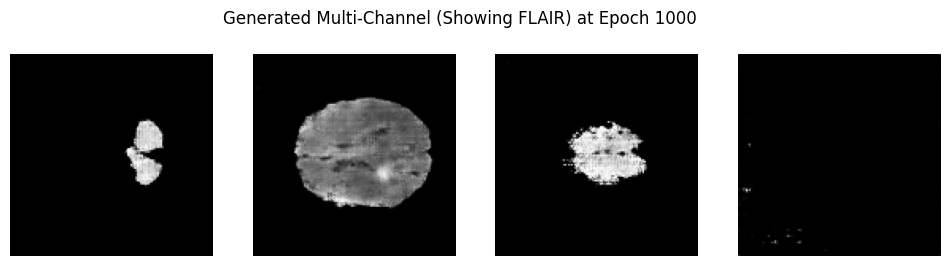

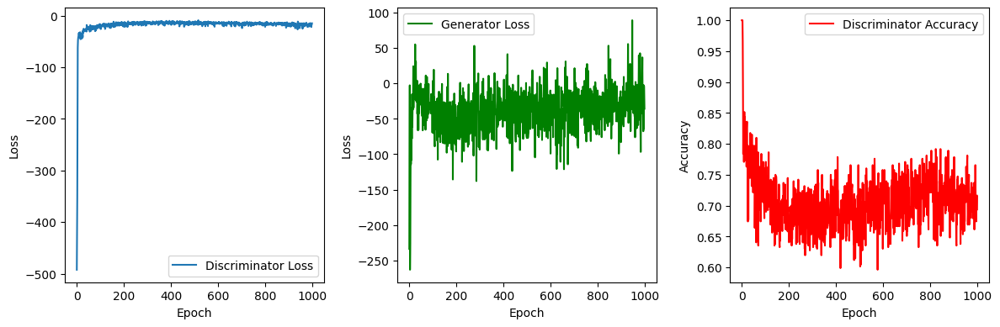

In [18]:
# def remove_synthetic_images(train_path):
#     """
#     Removes synthetic images from the BraTS2020 dataset.
#     """
#     for root, _, files in os.walk(train_path):
#         for file in files:
#             if file.startswith('synthetic'):
#                 file_path = os.path.join(root, file)
#                 try:
#                     os.remove(file_path)
#                     print(f"Removed synthetic image: {file_path}")
#                 except OSError as e:
#                     print(f"Error removing file: {file_path} - {e}")

# # Call the function to remove synthetic images
# remove_synthetic_images(Train_Path)

# ###############################################################################
# # 1. Load T1, T1CE, T2, FLAIR, SEG as 5-channel slices
# ###############################################################################
# def load_multimodal_images(train_path, img_size=128, slice_range=(0, 154)):
#     """
#     For each BraTS20_Training_### folder, load:
#       - FLAIR, T1, T1CE, T2, SEG
#     Pick a random slice from slice_range, resize to img_size x img_size,
#     stack them as channels, normalize to [-1,1] for MRI intensities,
#     and keep the segmentation mask as well.

#     Returns: numpy array of shape (N, img_size, img_size, 5)
#       - Channel order: [FLAIR, SEG, T1, T1CE, T2]
#         (You can change the order as you wish.)
#     """
#     folders = sorted([
#         os.path.join(train_path, f)
#         for f in os.listdir(train_path)
#         if f.startswith("BraTS20_Training_") and os.path.isdir(os.path.join(train_path, f))
#     ])

#     images = []

#     for folder in folders:
#         # Collect file paths
#         flair_file = None
#         seg_file   = None
#         t1_file    = None
#         t1ce_file  = None
#         t2_file    = None

#         for file in os.listdir(folder):
#             if file.endswith("_flair.nii"):
#                 flair_file = os.path.join(folder, file)
#             elif file.endswith("_seg.nii"):
#                 seg_file = os.path.join(folder, file)
#             elif file.endswith("_t1.nii"):
#                 t1_file = os.path.join(folder, file)
#             elif file.endswith("_t1ce.nii"):
#                 t1ce_file = os.path.join(folder, file)
#             elif file.endswith("_t2.nii"):
#                 t2_file = os.path.join(folder, file)

#         # If any modality is missing, skip
#         if not all([flair_file, seg_file, t1_file, t1ce_file, t2_file]):
#             continue

#         # Load each NIfTI
#         flair_nii = nib.load(flair_file).get_fdata()
#         seg_nii   = nib.load(seg_file).get_fdata()
#         t1_nii    = nib.load(t1_file).get_fdata()
#         t1ce_nii  = nib.load(t1ce_file).get_fdata()
#         t2_nii    = nib.load(t2_file).get_fdata()

#         # The shape is typically (240,240,155) for each
#         # Pick a random slice index from the valid range
#         max_slices = flair_nii.shape[2]
#         slice_index = np.random.randint(slice_range[0], min(slice_range[1], max_slices-1))

#         # Extract that slice from each modality
#         flair_slice = flair_nii[:, :, slice_index]
#         seg_slice   = seg_nii[:, :, slice_index]
#         t1_slice    = t1_nii[:, :, slice_index]
#         t1ce_slice  = t1ce_nii[:, :, slice_index]
#         t2_slice    = t2_nii[:, :, slice_index]

#         # Resize to (img_size, img_size)
#         flair_slice = cv2.resize(flair_slice, (img_size, img_size))
#         seg_slice   = cv2.resize(seg_slice,   (img_size, img_size), interpolation=cv2.INTER_NEAREST)
#         t1_slice    = cv2.resize(t1_slice,    (img_size, img_size))
#         t1ce_slice  = cv2.resize(t1ce_slice,  (img_size, img_size))
#         t2_slice    = cv2.resize(t2_slice,    (img_size, img_size))

#         # Convert to float32
#         flair_slice = flair_slice.astype(np.float32)
#         seg_slice   = seg_slice.astype(np.float32)
#         t1_slice    = t1_slice.astype(np.float32)
#         t1ce_slice  = t1ce_slice.astype(np.float32)
#         t2_slice    = t2_slice.astype(np.float32)

#         # Normalize each MRI slice to [-1,1]
#         # (seg_slice is 0/1, but for simplicity we'll also keep it in [-1,1])
#         def norm_mri(img):
#             min_val = np.min(img)
#             max_val = np.max(img)
#             # To avoid dividing by zero if the slice is uniform
#             return 2.0 * ( (img - min_val) / (max_val - min_val + 1e-8) ) - 1.0

#         flair_slice = norm_mri(flair_slice)
#         t1_slice    = norm_mri(t1_slice)
#         t1ce_slice  = norm_mri(t1ce_slice)
#         t2_slice    = norm_mri(t2_slice)

#         # For segmentation, you could leave it 0/1, but let's also do the same normalization
#         seg_slice = norm_mri(seg_slice)

#         # Stack them into a single 5-channel image: [H, W, 5]
#         # Order them however you like; here we do [FLAIR, SEG, T1, T1CE, T2]
#         multi_slice = np.stack([flair_slice, seg_slice, t1_slice, t1ce_slice, t2_slice], axis=-1)

#         images.append(multi_slice)

#     images = np.array(images, dtype=np.float32)
#     return images

# # Load multi-channel images
# images = load_multimodal_images(Train_Path, img_size=128, slice_range=(0, 154))
# print("Loaded images shape:", images.shape)  # (N, 128, 128, 5)

# # Create tf.data.Dataset
# batch_size = 16  # Might need smaller batch if memory is an issue
# dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(buffer_size=len(images)).batch(batch_size)

# ###############################################################################
# # 2. Define a Larger WGAN-GP for 5-channel images
# ###############################################################################
# latent_dim = 100
# epochs = 1000
# n_critic = 5
# lambda_gp = 10.0

# from tensorflow.keras.layers import (
#     Input, Dense, BatchNormalization, ReLU, Reshape,
#     Conv2DTranspose, Conv2D, LeakyReLU, Flatten
# )
# from tensorflow.keras.models import Model

# # Bigger Generator: outputs 5 channels
# def build_generator():
#     input_tensor = Input(shape=(latent_dim,))
#     # Increase the initial dense layer size and filters
#     x = Dense(8 * 8 * 1024, use_bias=False)(input_tensor)
#     x = BatchNormalization()(x)
#     x = ReLU()(x)
#     x = Reshape((8, 8, 1024))(x)

#     x = Conv2DTranspose(512, kernel_size=4, strides=2, padding='same', use_bias=False)(x)
#     x = BatchNormalization()(x)
#     x = ReLU()(x)

#     x = Conv2DTranspose(256, kernel_size=4, strides=2, padding='same', use_bias=False)(x)
#     x = BatchNormalization()(x)
#     x = ReLU()(x)

#     x = Conv2DTranspose(128, kernel_size=4, strides=2, padding='same', use_bias=False)(x)
#     x = BatchNormalization()(x)
#     x = ReLU()(x)

#     x = Conv2DTranspose(64, kernel_size=4, strides=2, padding='same', use_bias=False)(x)
#     x = BatchNormalization()(x)
#     x = ReLU()(x)

#     # Final layer: 5 channels, tanh activation
#     x = Conv2DTranspose(5, kernel_size=3, padding='same', activation='tanh')(x)

#     model = Model(inputs=input_tensor, outputs=x)
#     return model

# # Bigger Discriminator: expects 5 channels
# def build_discriminator():
#     input_tensor = Input(shape=(128, 128, 5))

#     x = Conv2D(64, kernel_size=3, strides=2, padding='same')(input_tensor)
#     x = LeakyReLU(0.2)(x)

#     x = Conv2D(128, kernel_size=3, strides=2, padding='same')(x)
#     x = LeakyReLU(0.2)(x)

#     x = Conv2D(256, kernel_size=3, strides=2, padding='same')(x)
#     x = LeakyReLU(0.2)(x)

#     x = Conv2D(512, kernel_size=3, strides=2, padding='same')(x)
#     x = LeakyReLU(0.2)(x)

#     x = Flatten()(x)
#     x = Dense(1)(x)

#     model = Model(inputs=input_tensor, outputs=x)
#     return model

# generator = build_generator()
# discriminator = build_discriminator()

# generator.summary()
# discriminator.summary()

# ###############################################################################
# # 3. Define WGAN-GP Loss and Optimizers
# ###############################################################################
# generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.5, beta_2=0.9)
# discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.5, beta_2=0.9)

# def discriminator_loss(real_output, fake_output):
#     return tf.reduce_mean(fake_output) - tf.reduce_mean(real_output)

# def generator_loss(fake_output):
#     return -tf.reduce_mean(fake_output)

# ###############################################################################
# # 4. Training Loop with Gradient Penalty
# ###############################################################################
# @tf.function
# def train_step(real_images):
#     current_batch_size = tf.shape(real_images)[0]

#     # Update the critic n_critic times
#     for _ in range(n_critic):
#         noise = tf.random.normal([current_batch_size, latent_dim])
#         with tf.GradientTape() as disc_tape:
#             fake_images = generator(noise, training=True)
#             real_output = discriminator(real_images, training=True)
#             fake_output = discriminator(fake_images, training=True)

#             d_loss = discriminator_loss(real_output, fake_output)

#             # Gradient penalty
#             alpha = tf.random.uniform([current_batch_size, 1, 1, 1], 0.0, 1.0)
#             interpolated = alpha * real_images + (1 - alpha) * fake_images
#             with tf.GradientTape() as gp_tape:
#                 gp_tape.watch(interpolated)
#                 pred = discriminator(interpolated, training=True)
#             grads = gp_tape.gradient(pred, [interpolated])[0]
#             grad_norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1,2,3]) + 1e-12)
#             gp = tf.reduce_mean((grad_norm - 1.0)**2)

#             d_loss += lambda_gp * gp

#         disc_grads = disc_tape.gradient(d_loss, discriminator.trainable_variables)
#         discriminator_optimizer.apply_gradients(zip(disc_grads, discriminator.trainable_variables))

#     # Simple "accuracy"
#     noise = tf.random.normal([current_batch_size, latent_dim])
#     fake_images = generator(noise, training=False)
#     real_output = discriminator(real_images, training=False)
#     fake_output = discriminator(fake_images, training=False)
#     acc = tf.reduce_mean(tf.cast(real_output > fake_output, tf.float32))

#     # Update generator
#     noise = tf.random.normal([current_batch_size, latent_dim])
#     with tf.GradientTape() as gen_tape:
#         generated_images = generator(noise, training=True)
#         fake_output = discriminator(generated_images, training=True)
#         g_loss = generator_loss(fake_output)
#     gen_grads = gen_tape.gradient(g_loss, generator.trainable_variables)
#     generator_optimizer.apply_gradients(zip(gen_grads, generator.trainable_variables))

#     return d_loss, g_loss, acc

# epochs_d_loss = []
# epochs_g_loss = []
# epochs_d_acc = []

# # Directory to save synthetic images
# synthetic_dir = os.path.join(Train_Path, "SyntheticMultiChannel")
# os.makedirs(synthetic_dir, exist_ok=True)

# for epoch in range(epochs):
#     print(f"Epoch {epoch+1}/{epochs}")
#     epoch_d_loss = []
#     epoch_g_loss = []
#     epoch_d_acc = []

#     for real_batch in dataset:
#         d_loss_val, g_loss_val, acc_val = train_step(real_batch)
#         epoch_d_loss.append(d_loss_val.numpy())
#         epoch_g_loss.append(g_loss_val.numpy())
#         epoch_d_acc.append(acc_val.numpy())

#     mean_d_loss = np.mean(epoch_d_loss)
#     mean_g_loss = np.mean(epoch_g_loss)
#     mean_d_acc = np.mean(epoch_d_acc)

#     epochs_d_loss.append(mean_d_loss)
#     epochs_g_loss.append(mean_g_loss)
#     epochs_d_acc.append(mean_d_acc)

#     print(f"  Discriminator Loss: {mean_d_loss:.4f} | Generator Loss: {mean_g_loss:.4f} | D Accuracy: {mean_d_acc:.4f}")

#     # Generate a few sample images every 10 epochs
#     if (epoch + 1) % 10 == 0:
#         noise = tf.random.normal([4, latent_dim])
#         gen_imgs = generator(noise, training=False)
#         # gen_imgs has shape (4, 128, 128, 5)

#         # For quick visualization, just show the first channel (e.g., FLAIR)
#         gen_flair = gen_imgs[..., 0]  # channel 0
#         gen_flair_rescaled = (gen_flair + 1.0) / 2.0  # [-1,1] -> [0,1]

#         fig, axes = plt.subplots(1, 4, figsize=(12, 3))
#         for i in range(4):
#             axes[i].imshow(gen_flair_rescaled[i], cmap='gray')
#             axes[i].axis('off')
#         plt.suptitle(f"Generated Multi-Channel (Showing FLAIR) at Epoch {epoch+1}")
#         plt.show()

#         # Optionally, save the 5-channel data as NIfTI
#         for i in range(gen_imgs.shape[0]):
#             img_5ch = gen_imgs[i].numpy()
#             # Rescale all channels to [0,1]
#             img_5ch = (img_5ch + 1.0) / 2.0
#             # Save each channel or all channels together as a 4D volume (H,W,Channels)
#             # For demonstration, let's save as a single 3D volume: shape = (128,128,5)
#             nifti_img = nib.Nifti1Image(img_5ch, np.eye(4))
#             save_path = os.path.join(synthetic_dir, f"synthetic_multich_epoch{epoch+1}_img{i}.nii")
#             nib.save(nifti_img, save_path)

# # Plot training metrics
# plt.figure(figsize=(12, 4))

# plt.subplot(1, 3, 1)
# plt.plot(epochs_d_loss, label='Discriminator Loss')
# plt.xlabel('Epoch')
# plt.ylabel('Loss')
# plt.legend()

# plt.subplot(1, 3, 2)
# plt.plot(epochs_g_loss, label='Generator Loss', color='green')
# plt.xlabel('Epoch')
# plt.ylabel('Loss')
# plt.legend()

# plt.subplot(1, 3, 3)
# plt.plot(epochs_d_acc, label='Discriminator Accuracy', color='red')
# plt.xlabel('Epoch')
# plt.ylabel('Accuracy')
# plt.legend()

# plt.tight_layout()
# plt.show()


Removed synthetic image: /content/drive/MyDrive/kaggle/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/SyntheticMultiChannel/synthetic_multich_epoch10_img0.nii
Removed synthetic image: /content/drive/MyDrive/kaggle/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/SyntheticMultiChannel/synthetic_multich_epoch10_img1.nii
Removed synthetic image: /content/drive/MyDrive/kaggle/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/SyntheticMultiChannel/synthetic_multich_epoch10_img2.nii
Removed synthetic image: /content/drive/MyDrive/kaggle/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/SyntheticMultiChannel/synthetic_multich_epoch10_img3.nii
Removed synthetic image: /content/drive/MyDrive/kaggle/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/SyntheticMultiChannel/synthetic_multich_epoch20_img0.nii
Removed synthetic image: /content/drive/MyDrive/kaggle/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/SyntheticMultiChannel/synthetic_multich_epoch20_img1.nii
Removed sy

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 8192)                │         819,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 8192)                │          32,768 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu (ReLU)                         │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 8, 8, 256)           │       2,097,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_1 (ReLU)                       │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 16, 16, 128)         │         524,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_2 (ReLU)                       │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 32, 32, 128)         │         262,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_3 (ReLU)                       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ self_attention (SelfAttention)       │ (None, 32, 32, 128)         │          20,641 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 64, 64, 64)          │         131,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_4 (ReLU)                       │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_4 (Conv2DTranspose) │ (None, 128, 128, 5)         │           5,1

 Total params: 3,894,694 (14.86 MB)

 Trainable params: 3,877,158 (14.79 MB)

 Non-trainable params: 17,536 (68.50 KB)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 128, 128, 5)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 64, 64, 64)          │           5,184 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 32, 32, 128)         │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 16, 16, 128)         │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ self_attention_1 (SelfAttention)     │ (None, 16, 16, 128)         │          20,641 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 8, 8, 256)           │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 4, 4, 512)           │       2,097,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,049,698 (11.63 MB)

 Trainable params: 3,049,698 (11.63 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/1000
  Discriminator Loss: -1193.9684 | Generator Loss: -162.7054 | D Accuracy: 1.0000
Epoch 2/1000
  Discriminator Loss: -860.0768 | Generator Loss: -599.8730 | D Accuracy: 1.0000
Epoch 3/1000
  Discriminator Loss: -532.9929 | Generator Loss: -616.3560 | D Accuracy: 1.0000
Epoch 4/1000
  Discriminator Loss: -352.6846 | Generator Loss: -521.4753 | D Accuracy: 1.0000
Epoch 5/1000
  Discriminator Loss: -250.2230 | Generator Loss: -422.4149 | D Accuracy: 1.0000
Epoch 6/1000
  Discriminator Loss: -188.4046 | Generator Loss: -295.6561 | D Accuracy: 1.0000
Epoch 7/1000
  Discriminator Loss: -110.7626 | Generator Loss: -282.1819 | D Accuracy: 0.9740
Epoch 8/1000
  Discriminator Loss: -72.6646 | Generator Loss: -251.1439 | D Accuracy: 0.9635
Epoch 9/1000
  Discriminator Loss: -64.8202 | Generator Loss: -223.1365 | D Accuracy: 0.9375
Epoch 10/1000
  Discriminator Loss: -66.2911 | Generator Loss: -148.6306 | D Accuracy: 0.8854


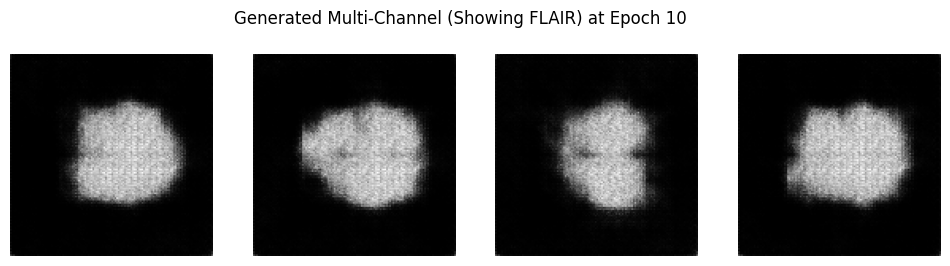

Epoch 11/1000
  Discriminator Loss: -56.4753 | Generator Loss: -111.4644 | D Accuracy: 0.8490
Epoch 12/1000
  Discriminator Loss: -58.0579 | Generator Loss: -103.7820 | D Accuracy: 0.8542
Epoch 13/1000
  Discriminator Loss: -63.2053 | Generator Loss: -97.8918 | D Accuracy: 0.8906
Epoch 14/1000
  Discriminator Loss: -64.0866 | Generator Loss: -31.0193 | D Accuracy: 0.8932
Epoch 15/1000
  Discriminator Loss: -55.6840 | Generator Loss: -71.5031 | D Accuracy: 0.9141
Epoch 16/1000
  Discriminator Loss: -63.1184 | Generator Loss: -94.2886 | D Accuracy: 0.9010
Epoch 17/1000
  Discriminator Loss: -62.0957 | Generator Loss: -62.6227 | D Accuracy: 0.8646
Epoch 18/1000
  Discriminator Loss: -52.8739 | Generator Loss: -48.6961 | D Accuracy: 0.8542
Epoch 19/1000
  Discriminator Loss: -61.4006 | Generator Loss: -47.8068 | D Accuracy: 0.8802
Epoch 20/1000
  Discriminator Loss: -57.6534 | Generator Loss: -86.2974 | D Accuracy: 0.8802


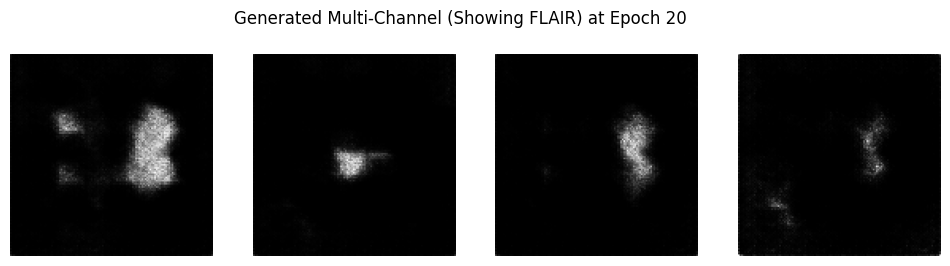

Epoch 21/1000
  Discriminator Loss: -52.6137 | Generator Loss: -54.8341 | D Accuracy: 0.8880
Epoch 22/1000
  Discriminator Loss: -57.7254 | Generator Loss: -20.1038 | D Accuracy: 0.8620
Epoch 23/1000
  Discriminator Loss: -61.0358 | Generator Loss: -41.2881 | D Accuracy: 0.8906
Epoch 24/1000
  Discriminator Loss: -60.7839 | Generator Loss: -65.3242 | D Accuracy: 0.8620
Epoch 25/1000
  Discriminator Loss: -55.7711 | Generator Loss: -14.1626 | D Accuracy: 0.9010
Epoch 26/1000
  Discriminator Loss: -59.9923 | Generator Loss: -45.5624 | D Accuracy: 0.8958
Epoch 27/1000
  Discriminator Loss: -66.0452 | Generator Loss: 3.5378 | D Accuracy: 0.8490
Epoch 28/1000
  Discriminator Loss: -66.0440 | Generator Loss: -27.7304 | D Accuracy: 0.8464
Epoch 29/1000
  Discriminator Loss: -59.4604 | Generator Loss: -52.2195 | D Accuracy: 0.8385
Epoch 30/1000
  Discriminator Loss: -58.4382 | Generator Loss: -26.1499 | D Accuracy: 0.8932


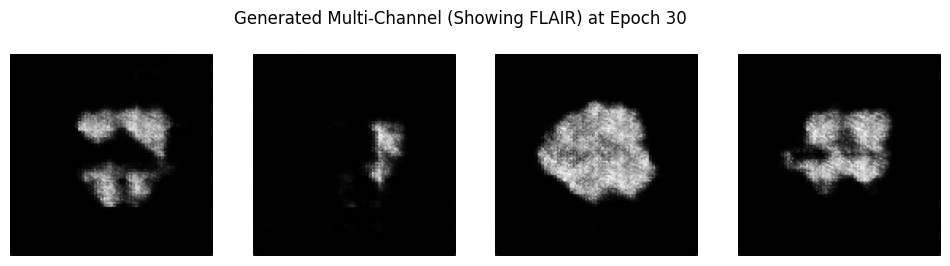

Epoch 31/1000
  Discriminator Loss: -60.5410 | Generator Loss: -15.4078 | D Accuracy: 0.9010
Epoch 32/1000
  Discriminator Loss: -54.2702 | Generator Loss: -34.5998 | D Accuracy: 0.8620
Epoch 33/1000
  Discriminator Loss: -53.6656 | Generator Loss: -40.9949 | D Accuracy: 0.8750
Epoch 34/1000
  Discriminator Loss: -56.7896 | Generator Loss: -19.7004 | D Accuracy: 0.8490
Epoch 35/1000
  Discriminator Loss: -50.9422 | Generator Loss: -34.0041 | D Accuracy: 0.8333
Epoch 36/1000
  Discriminator Loss: -51.9050 | Generator Loss: -8.5939 | D Accuracy: 0.8411
Epoch 37/1000
  Discriminator Loss: -47.7364 | Generator Loss: -21.0788 | D Accuracy: 0.8411
Epoch 38/1000
  Discriminator Loss: -51.3018 | Generator Loss: 11.9542 | D Accuracy: 0.8438
Epoch 39/1000
  Discriminator Loss: -50.8916 | Generator Loss: -18.5332 | D Accuracy: 0.8698
Epoch 40/1000
  Discriminator Loss: -44.0626 | Generator Loss: -21.5395 | D Accuracy: 0.8542


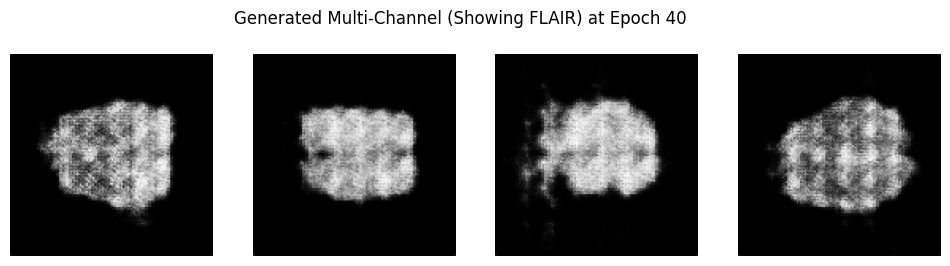

Epoch 41/1000
  Discriminator Loss: -49.5654 | Generator Loss: -16.1601 | D Accuracy: 0.8464
Epoch 42/1000
  Discriminator Loss: -39.7288 | Generator Loss: -55.6178 | D Accuracy: 0.8568
Epoch 43/1000
  Discriminator Loss: -39.4415 | Generator Loss: -46.7443 | D Accuracy: 0.8516
Epoch 44/1000
  Discriminator Loss: -39.9315 | Generator Loss: -39.8012 | D Accuracy: 0.8620
Epoch 45/1000
  Discriminator Loss: -41.0567 | Generator Loss: -23.1445 | D Accuracy: 0.7891
Epoch 46/1000
  Discriminator Loss: -40.7201 | Generator Loss: -32.2555 | D Accuracy: 0.8359
Epoch 47/1000
  Discriminator Loss: -44.8918 | Generator Loss: -46.3318 | D Accuracy: 0.8646
Epoch 48/1000
  Discriminator Loss: -43.1009 | Generator Loss: -39.1725 | D Accuracy: 0.7917
Epoch 49/1000
  Discriminator Loss: -40.4474 | Generator Loss: -50.9913 | D Accuracy: 0.7865
Epoch 50/1000
  Discriminator Loss: -38.1613 | Generator Loss: -37.5260 | D Accuracy: 0.8177


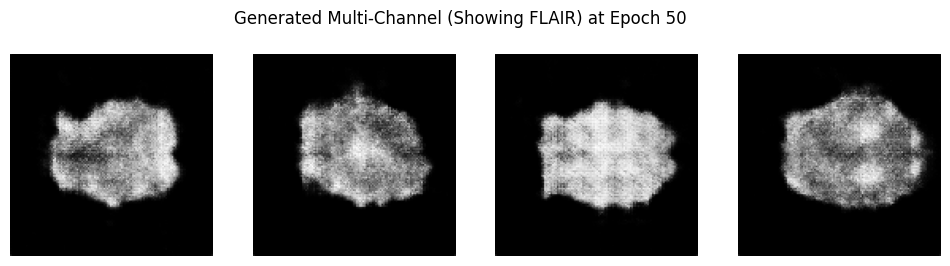

Epoch 51/1000
  Discriminator Loss: -39.7052 | Generator Loss: -32.1553 | D Accuracy: 0.8281
Epoch 52/1000
  Discriminator Loss: -36.4543 | Generator Loss: -34.5662 | D Accuracy: 0.8411
Epoch 53/1000
  Discriminator Loss: -41.3093 | Generator Loss: -36.2301 | D Accuracy: 0.8073
Epoch 54/1000
  Discriminator Loss: -36.5695 | Generator Loss: -60.5571 | D Accuracy: 0.8385
Epoch 55/1000
  Discriminator Loss: -39.0580 | Generator Loss: -44.6474 | D Accuracy: 0.8021
Epoch 56/1000
  Discriminator Loss: -36.2950 | Generator Loss: -56.3132 | D Accuracy: 0.8646
Epoch 57/1000
  Discriminator Loss: -44.3997 | Generator Loss: -39.7984 | D Accuracy: 0.8411
Epoch 58/1000
  Discriminator Loss: -44.2370 | Generator Loss: -13.8281 | D Accuracy: 0.7422
Epoch 59/1000
  Discriminator Loss: -32.7189 | Generator Loss: -41.4655 | D Accuracy: 0.8307
Epoch 60/1000
  Discriminator Loss: -36.1179 | Generator Loss: -48.5728 | D Accuracy: 0.7969


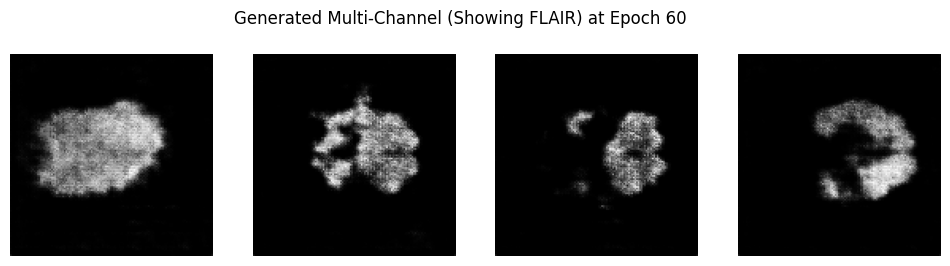

Epoch 61/1000
  Discriminator Loss: -31.5635 | Generator Loss: -53.0556 | D Accuracy: 0.8047
Epoch 62/1000
  Discriminator Loss: -37.9207 | Generator Loss: -41.2847 | D Accuracy: 0.7995
Epoch 63/1000
  Discriminator Loss: -33.7815 | Generator Loss: -38.9416 | D Accuracy: 0.7812
Epoch 64/1000
  Discriminator Loss: -35.8101 | Generator Loss: -41.8872 | D Accuracy: 0.8125
Epoch 65/1000
  Discriminator Loss: -33.7330 | Generator Loss: -46.0151 | D Accuracy: 0.8151
Epoch 66/1000
  Discriminator Loss: -28.8771 | Generator Loss: -42.3162 | D Accuracy: 0.8281
Epoch 67/1000
  Discriminator Loss: -33.2673 | Generator Loss: -45.6688 | D Accuracy: 0.7943
Epoch 68/1000
  Discriminator Loss: -30.8939 | Generator Loss: -42.9555 | D Accuracy: 0.8073
Epoch 69/1000
  Discriminator Loss: -29.0823 | Generator Loss: -54.9931 | D Accuracy: 0.8177
Epoch 70/1000
  Discriminator Loss: -28.6470 | Generator Loss: -43.0797 | D Accuracy: 0.8021


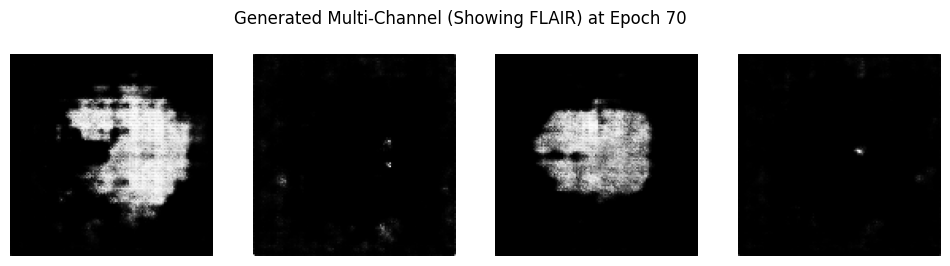

Epoch 71/1000
  Discriminator Loss: -28.5336 | Generator Loss: -33.5334 | D Accuracy: 0.8411
Epoch 72/1000
  Discriminator Loss: -38.2136 | Generator Loss: -39.4303 | D Accuracy: 0.7969
Epoch 73/1000
  Discriminator Loss: -30.5380 | Generator Loss: 1.1992 | D Accuracy: 0.7786
Epoch 74/1000
  Discriminator Loss: -29.5635 | Generator Loss: -52.0443 | D Accuracy: 0.7943
Epoch 75/1000
  Discriminator Loss: -28.2898 | Generator Loss: -45.6145 | D Accuracy: 0.8307
Epoch 76/1000
  Discriminator Loss: -29.1534 | Generator Loss: -62.3068 | D Accuracy: 0.7760
Epoch 77/1000
  Discriminator Loss: -27.2223 | Generator Loss: -46.4376 | D Accuracy: 0.8073
Epoch 78/1000
  Discriminator Loss: -35.1470 | Generator Loss: -41.3055 | D Accuracy: 0.7708
Epoch 79/1000
  Discriminator Loss: -26.4776 | Generator Loss: -42.8721 | D Accuracy: 0.7604
Epoch 80/1000
  Discriminator Loss: -33.6144 | Generator Loss: -52.7414 | D Accuracy: 0.8125


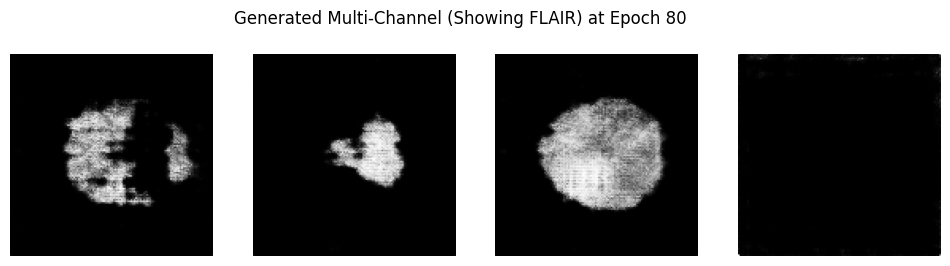

Epoch 81/1000
  Discriminator Loss: -31.3293 | Generator Loss: -30.7784 | D Accuracy: 0.8073
Epoch 82/1000
  Discriminator Loss: -26.9091 | Generator Loss: -43.0927 | D Accuracy: 0.7578
Epoch 83/1000
  Discriminator Loss: -28.2364 | Generator Loss: -22.7738 | D Accuracy: 0.7812
Epoch 84/1000
  Discriminator Loss: -30.8952 | Generator Loss: -28.8212 | D Accuracy: 0.7760
Epoch 85/1000
  Discriminator Loss: -28.5994 | Generator Loss: -25.2640 | D Accuracy: 0.8047
Epoch 86/1000
  Discriminator Loss: -27.0153 | Generator Loss: -15.4794 | D Accuracy: 0.7917
Epoch 87/1000
  Discriminator Loss: -26.6101 | Generator Loss: -23.9313 | D Accuracy: 0.8359
Epoch 88/1000
  Discriminator Loss: -27.3869 | Generator Loss: -8.2811 | D Accuracy: 0.8099
Epoch 89/1000
  Discriminator Loss: -28.8166 | Generator Loss: 6.0742 | D Accuracy: 0.8099
Epoch 90/1000
  Discriminator Loss: -33.4599 | Generator Loss: 11.1736 | D Accuracy: 0.7500


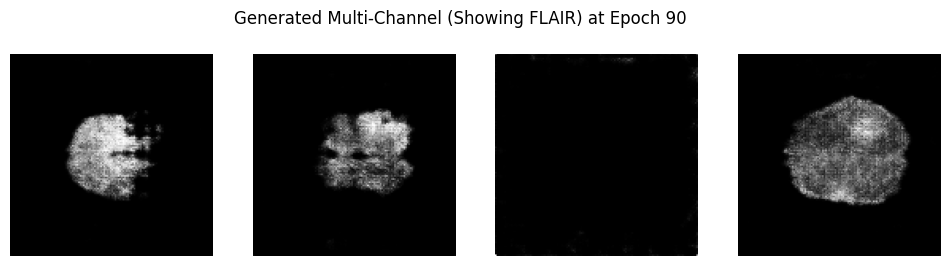

Epoch 91/1000
  Discriminator Loss: -26.5478 | Generator Loss: -16.6639 | D Accuracy: 0.7526
Epoch 92/1000
  Discriminator Loss: -25.8948 | Generator Loss: -16.7194 | D Accuracy: 0.8125
Epoch 93/1000
  Discriminator Loss: -30.8836 | Generator Loss: -7.8071 | D Accuracy: 0.7943
Epoch 94/1000
  Discriminator Loss: -25.9839 | Generator Loss: 6.0666 | D Accuracy: 0.7865
Epoch 95/1000
  Discriminator Loss: -29.5917 | Generator Loss: -6.7387 | D Accuracy: 0.7604
Epoch 96/1000
  Discriminator Loss: -28.7189 | Generator Loss: 8.9675 | D Accuracy: 0.7917
Epoch 97/1000
  Discriminator Loss: -28.0645 | Generator Loss: -14.6204 | D Accuracy: 0.7526
Epoch 98/1000
  Discriminator Loss: -27.3976 | Generator Loss: 15.6943 | D Accuracy: 0.7552
Epoch 99/1000
  Discriminator Loss: -26.0538 | Generator Loss: -11.4429 | D Accuracy: 0.7396
Epoch 100/1000
  Discriminator Loss: -24.2821 | Generator Loss: -11.4019 | D Accuracy: 0.7891


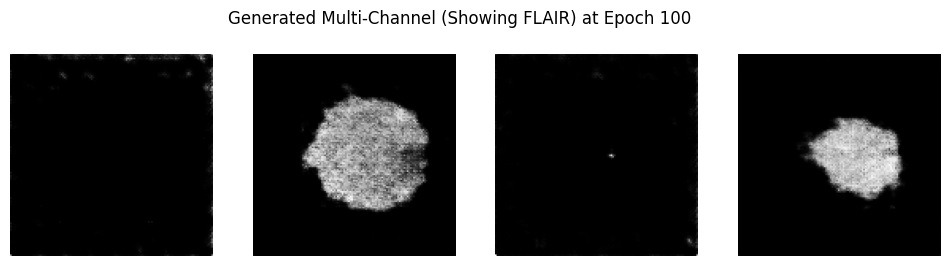

Epoch 101/1000
  Discriminator Loss: -30.8564 | Generator Loss: -5.1834 | D Accuracy: 0.8021
Epoch 102/1000
  Discriminator Loss: -22.8360 | Generator Loss: 16.2036 | D Accuracy: 0.7578
Epoch 103/1000
  Discriminator Loss: -22.3958 | Generator Loss: -24.8795 | D Accuracy: 0.7630
Epoch 104/1000
  Discriminator Loss: -25.2868 | Generator Loss: 0.8438 | D Accuracy: 0.7839
Epoch 105/1000
  Discriminator Loss: -28.6623 | Generator Loss: -11.0088 | D Accuracy: 0.7552
Epoch 106/1000
  Discriminator Loss: -26.1176 | Generator Loss: -5.4255 | D Accuracy: 0.8021
Epoch 107/1000
  Discriminator Loss: -32.5800 | Generator Loss: -1.2860 | D Accuracy: 0.7786
Epoch 108/1000
  Discriminator Loss: -27.1898 | Generator Loss: 21.3991 | D Accuracy: 0.7552
Epoch 109/1000
  Discriminator Loss: -24.7662 | Generator Loss: -7.2092 | D Accuracy: 0.7917
Epoch 110/1000
  Discriminator Loss: -26.8621 | Generator Loss: -3.6880 | D Accuracy: 0.7422


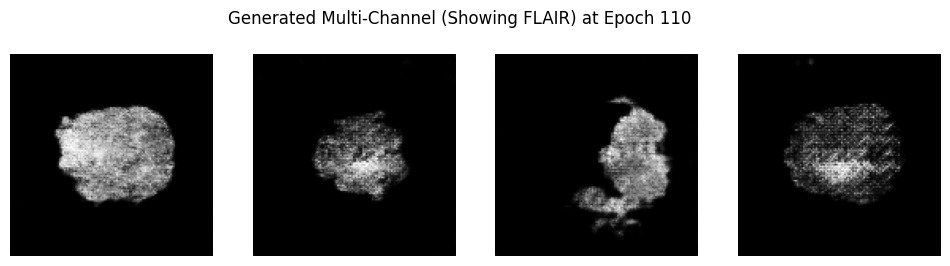

Epoch 111/1000
  Discriminator Loss: -26.1878 | Generator Loss: 9.2603 | D Accuracy: 0.7526
Epoch 112/1000
  Discriminator Loss: -22.7909 | Generator Loss: 18.7269 | D Accuracy: 0.7266
Epoch 113/1000
  Discriminator Loss: -32.4382 | Generator Loss: 8.7989 | D Accuracy: 0.7891
Epoch 114/1000
  Discriminator Loss: -29.4693 | Generator Loss: -1.1680 | D Accuracy: 0.7422
Epoch 115/1000
  Discriminator Loss: -25.8756 | Generator Loss: 5.7555 | D Accuracy: 0.7630
Epoch 116/1000
  Discriminator Loss: -33.6285 | Generator Loss: -4.6893 | D Accuracy: 0.7318
Epoch 117/1000
  Discriminator Loss: -22.2319 | Generator Loss: -10.2885 | D Accuracy: 0.7760
Epoch 118/1000
  Discriminator Loss: -25.6963 | Generator Loss: -5.2473 | D Accuracy: 0.7969
Epoch 119/1000
  Discriminator Loss: -28.0903 | Generator Loss: 4.9062 | D Accuracy: 0.7786
Epoch 120/1000
  Discriminator Loss: -24.4072 | Generator Loss: 5.5775 | D Accuracy: 0.7734


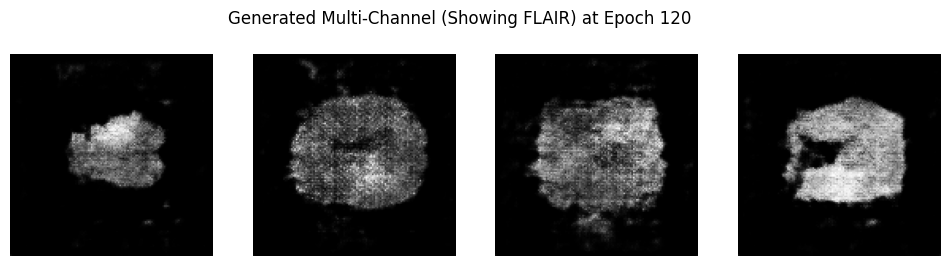

Epoch 121/1000
  Discriminator Loss: -34.3417 | Generator Loss: 6.4243 | D Accuracy: 0.8021
Epoch 122/1000
  Discriminator Loss: -23.6983 | Generator Loss: 34.5246 | D Accuracy: 0.7474
Epoch 123/1000
  Discriminator Loss: -25.7073 | Generator Loss: -6.4334 | D Accuracy: 0.8047
Epoch 124/1000
  Discriminator Loss: -32.0736 | Generator Loss: 3.1632 | D Accuracy: 0.7578
Epoch 125/1000
  Discriminator Loss: -30.2616 | Generator Loss: 19.7418 | D Accuracy: 0.7552
Epoch 126/1000
  Discriminator Loss: -25.2854 | Generator Loss: 6.8400 | D Accuracy: 0.7812
Epoch 127/1000
  Discriminator Loss: -24.8673 | Generator Loss: 15.4450 | D Accuracy: 0.7995
Epoch 128/1000
  Discriminator Loss: -22.5817 | Generator Loss: 6.5669 | D Accuracy: 0.7734
Epoch 129/1000
  Discriminator Loss: -24.3196 | Generator Loss: -12.4845 | D Accuracy: 0.7760
Epoch 130/1000
  Discriminator Loss: -29.0577 | Generator Loss: -1.7430 | D Accuracy: 0.7786


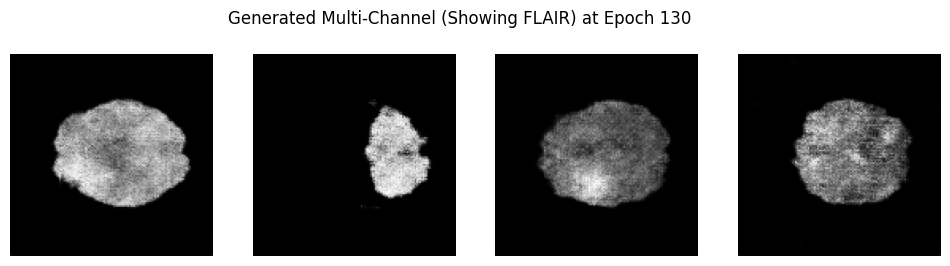

Epoch 131/1000
  Discriminator Loss: -23.6057 | Generator Loss: -10.7861 | D Accuracy: 0.7656
Epoch 132/1000
  Discriminator Loss: -27.8533 | Generator Loss: 4.2345 | D Accuracy: 0.7526
Epoch 133/1000
  Discriminator Loss: -25.1230 | Generator Loss: 25.1370 | D Accuracy: 0.7578
Epoch 134/1000
  Discriminator Loss: -27.3637 | Generator Loss: 10.7165 | D Accuracy: 0.8151
Epoch 135/1000
  Discriminator Loss: -23.0548 | Generator Loss: -4.9386 | D Accuracy: 0.8021
Epoch 136/1000
  Discriminator Loss: -26.0668 | Generator Loss: -1.3144 | D Accuracy: 0.7943
Epoch 137/1000
  Discriminator Loss: -23.8547 | Generator Loss: 10.6452 | D Accuracy: 0.7865
Epoch 138/1000
  Discriminator Loss: -27.6896 | Generator Loss: 1.3107 | D Accuracy: 0.7552
Epoch 139/1000
  Discriminator Loss: -23.1630 | Generator Loss: 6.2885 | D Accuracy: 0.8151
Epoch 140/1000
  Discriminator Loss: -27.0302 | Generator Loss: -5.4631 | D Accuracy: 0.7734


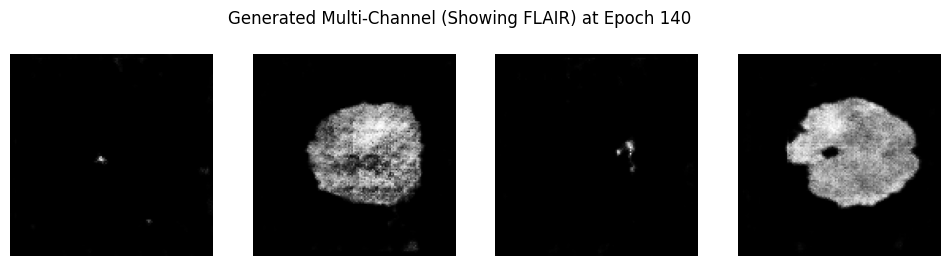

Epoch 141/1000
  Discriminator Loss: -29.0019 | Generator Loss: -17.5985 | D Accuracy: 0.7656
Epoch 142/1000
  Discriminator Loss: -24.2374 | Generator Loss: 6.7019 | D Accuracy: 0.8047
Epoch 143/1000
  Discriminator Loss: -25.7566 | Generator Loss: 1.8436 | D Accuracy: 0.7943
Epoch 144/1000
  Discriminator Loss: -25.3568 | Generator Loss: -12.1308 | D Accuracy: 0.7448
Epoch 145/1000
  Discriminator Loss: -26.0453 | Generator Loss: -4.9273 | D Accuracy: 0.7344
Epoch 146/1000
  Discriminator Loss: -26.2160 | Generator Loss: -21.1926 | D Accuracy: 0.7578
Epoch 147/1000
  Discriminator Loss: -24.5876 | Generator Loss: 8.8081 | D Accuracy: 0.7786
Epoch 148/1000
  Discriminator Loss: -28.3189 | Generator Loss: -14.0390 | D Accuracy: 0.7917
Epoch 149/1000
  Discriminator Loss: -25.5067 | Generator Loss: 1.1974 | D Accuracy: 0.7500
Epoch 150/1000
  Discriminator Loss: -26.8584 | Generator Loss: -18.0314 | D Accuracy: 0.7734


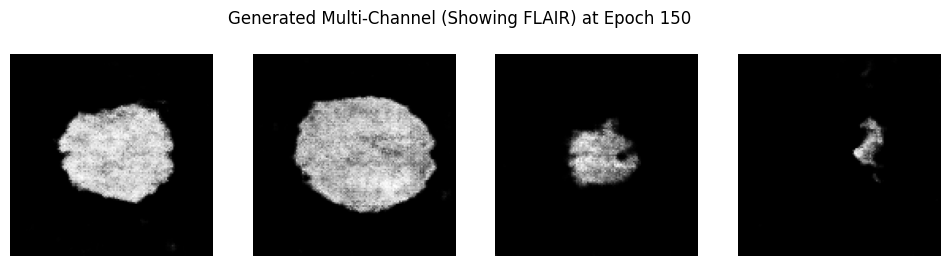

Epoch 151/1000
  Discriminator Loss: -24.9521 | Generator Loss: 22.3839 | D Accuracy: 0.7500
Epoch 152/1000
  Discriminator Loss: -24.2944 | Generator Loss: -17.0288 | D Accuracy: 0.8125
Epoch 153/1000
  Discriminator Loss: -28.1990 | Generator Loss: -16.8073 | D Accuracy: 0.7812
Epoch 154/1000
  Discriminator Loss: -23.4103 | Generator Loss: -5.1706 | D Accuracy: 0.8620
Epoch 155/1000
  Discriminator Loss: -25.1398 | Generator Loss: 3.2412 | D Accuracy: 0.8281
Epoch 156/1000
  Discriminator Loss: -28.9298 | Generator Loss: 15.2685 | D Accuracy: 0.7839
Epoch 157/1000
  Discriminator Loss: -27.5097 | Generator Loss: 6.8142 | D Accuracy: 0.7448
Epoch 158/1000
  Discriminator Loss: -26.4338 | Generator Loss: -0.4400 | D Accuracy: 0.7682
Epoch 159/1000
  Discriminator Loss: -20.4745 | Generator Loss: -7.7678 | D Accuracy: 0.7760
Epoch 160/1000
  Discriminator Loss: -25.3129 | Generator Loss: 8.4514 | D Accuracy: 0.7969


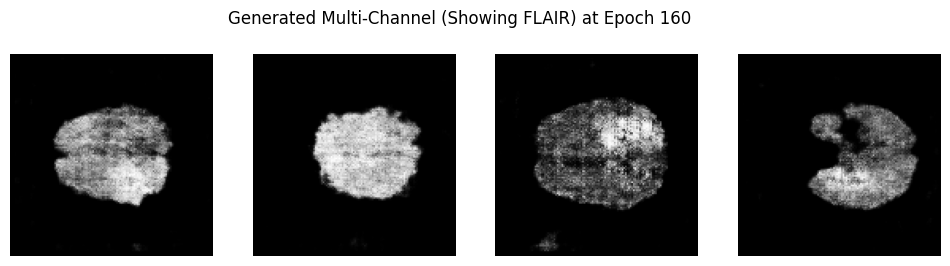

Epoch 161/1000
  Discriminator Loss: -22.3155 | Generator Loss: -9.6308 | D Accuracy: 0.7786
Epoch 162/1000
  Discriminator Loss: -25.9135 | Generator Loss: -1.1722 | D Accuracy: 0.7656
Epoch 163/1000
  Discriminator Loss: -26.0907 | Generator Loss: -1.3720 | D Accuracy: 0.8125
Epoch 164/1000
  Discriminator Loss: -25.2134 | Generator Loss: -8.2511 | D Accuracy: 0.7578
Epoch 165/1000
  Discriminator Loss: -25.8202 | Generator Loss: -10.4580 | D Accuracy: 0.7240
Epoch 166/1000
  Discriminator Loss: -25.7100 | Generator Loss: -8.7346 | D Accuracy: 0.7917
Epoch 167/1000
  Discriminator Loss: -24.5191 | Generator Loss: -3.8954 | D Accuracy: 0.7786
Epoch 168/1000
  Discriminator Loss: -23.6194 | Generator Loss: -4.9635 | D Accuracy: 0.7995
Epoch 169/1000
  Discriminator Loss: -24.3173 | Generator Loss: -21.8677 | D Accuracy: 0.7630
Epoch 170/1000
  Discriminator Loss: -23.8692 | Generator Loss: -8.2598 | D Accuracy: 0.8047


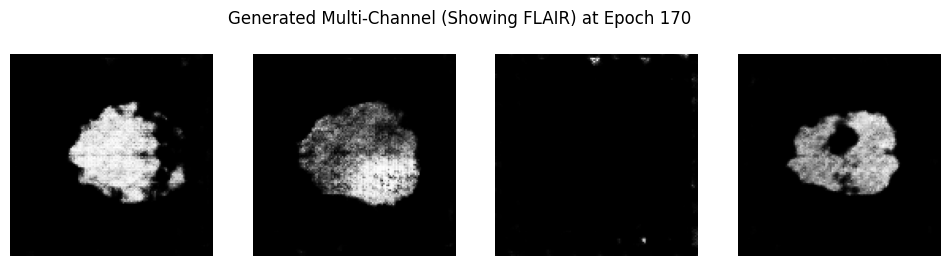

Epoch 171/1000
  Discriminator Loss: -22.4317 | Generator Loss: -5.1442 | D Accuracy: 0.7969
Epoch 172/1000
  Discriminator Loss: -21.4887 | Generator Loss: 2.2873 | D Accuracy: 0.8411
Epoch 173/1000
  Discriminator Loss: -23.5276 | Generator Loss: -1.3442 | D Accuracy: 0.7630
Epoch 174/1000
  Discriminator Loss: -23.8108 | Generator Loss: -10.3230 | D Accuracy: 0.7630
Epoch 175/1000
  Discriminator Loss: -29.2522 | Generator Loss: -3.8168 | D Accuracy: 0.7552
Epoch 176/1000
  Discriminator Loss: -27.0309 | Generator Loss: -13.9011 | D Accuracy: 0.7760
Epoch 177/1000
  Discriminator Loss: -26.6558 | Generator Loss: -6.8574 | D Accuracy: 0.7318
Epoch 178/1000
  Discriminator Loss: -24.8375 | Generator Loss: 5.9959 | D Accuracy: 0.7630
Epoch 179/1000
  Discriminator Loss: -25.6439 | Generator Loss: 11.0930 | D Accuracy: 0.7448
Epoch 180/1000
  Discriminator Loss: -23.6810 | Generator Loss: -1.0287 | D Accuracy: 0.7396


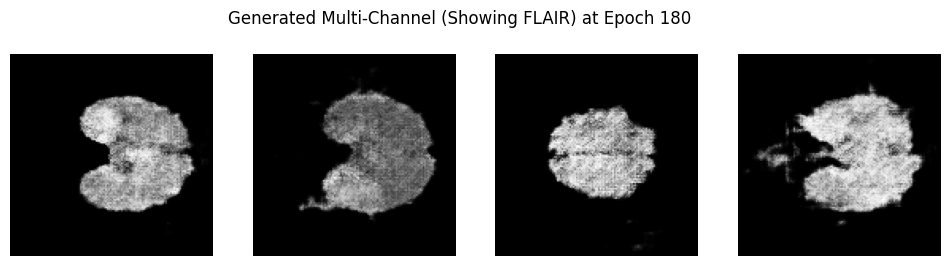

Epoch 181/1000
  Discriminator Loss: -20.9520 | Generator Loss: -2.7353 | D Accuracy: 0.8047
Epoch 182/1000
  Discriminator Loss: -22.3963 | Generator Loss: -3.5581 | D Accuracy: 0.8125
Epoch 183/1000
  Discriminator Loss: -22.3146 | Generator Loss: -4.0185 | D Accuracy: 0.8099
Epoch 184/1000
  Discriminator Loss: -23.3488 | Generator Loss: 2.0914 | D Accuracy: 0.7422
Epoch 185/1000
  Discriminator Loss: -25.4313 | Generator Loss: 6.0705 | D Accuracy: 0.7734
Epoch 186/1000
  Discriminator Loss: -23.4350 | Generator Loss: -8.6076 | D Accuracy: 0.7734
Epoch 187/1000
  Discriminator Loss: -23.1183 | Generator Loss: -6.5504 | D Accuracy: 0.7995
Epoch 188/1000
  Discriminator Loss: -24.0335 | Generator Loss: 0.3531 | D Accuracy: 0.8021
Epoch 189/1000
  Discriminator Loss: -24.9147 | Generator Loss: -2.8513 | D Accuracy: 0.7656
Epoch 190/1000
  Discriminator Loss: -25.7916 | Generator Loss: 9.4962 | D Accuracy: 0.7214


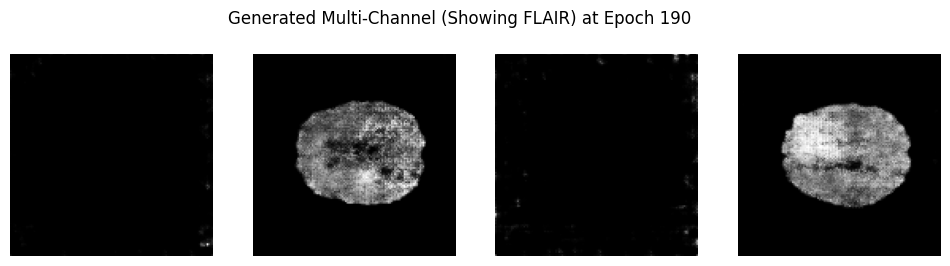

Epoch 191/1000
  Discriminator Loss: -21.2223 | Generator Loss: 8.1710 | D Accuracy: 0.7682
Epoch 192/1000
  Discriminator Loss: -31.2510 | Generator Loss: 16.1957 | D Accuracy: 0.7656
Epoch 193/1000
  Discriminator Loss: -22.0813 | Generator Loss: 8.7330 | D Accuracy: 0.7630
Epoch 194/1000
  Discriminator Loss: -24.7486 | Generator Loss: -12.5777 | D Accuracy: 0.8021
Epoch 195/1000
  Discriminator Loss: -21.8148 | Generator Loss: 3.1774 | D Accuracy: 0.7839
Epoch 196/1000
  Discriminator Loss: -22.9543 | Generator Loss: 4.4583 | D Accuracy: 0.7500
Epoch 197/1000
  Discriminator Loss: -22.3008 | Generator Loss: 0.3616 | D Accuracy: 0.8177
Epoch 198/1000
  Discriminator Loss: -26.3788 | Generator Loss: -1.3154 | D Accuracy: 0.7656
Epoch 199/1000
  Discriminator Loss: -21.8184 | Generator Loss: 5.0620 | D Accuracy: 0.7969
Epoch 200/1000
  Discriminator Loss: -23.2343 | Generator Loss: -5.2155 | D Accuracy: 0.7812


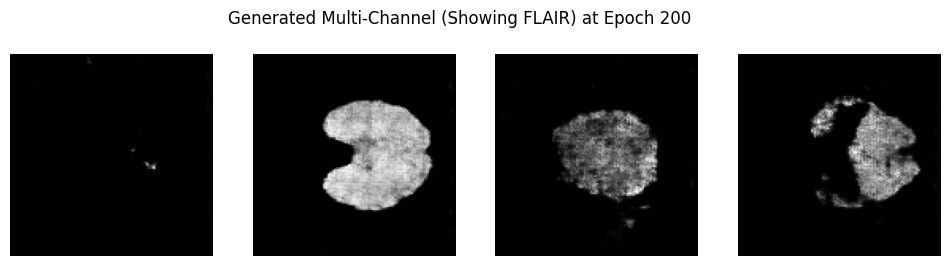

Epoch 201/1000
  Discriminator Loss: -31.7026 | Generator Loss: 5.9470 | D Accuracy: 0.8047
Epoch 202/1000
  Discriminator Loss: -24.0457 | Generator Loss: 26.0419 | D Accuracy: 0.8125
Epoch 203/1000
  Discriminator Loss: -28.3064 | Generator Loss: 12.6046 | D Accuracy: 0.7708
Epoch 204/1000
  Discriminator Loss: -24.5489 | Generator Loss: 6.1695 | D Accuracy: 0.7630
Epoch 205/1000
  Discriminator Loss: -24.8857 | Generator Loss: -8.1189 | D Accuracy: 0.7578
Epoch 206/1000
  Discriminator Loss: -21.5431 | Generator Loss: 12.4828 | D Accuracy: 0.7708
Epoch 207/1000
  Discriminator Loss: -24.1445 | Generator Loss: 0.3595 | D Accuracy: 0.7682
Epoch 208/1000
  Discriminator Loss: -22.8853 | Generator Loss: 10.0793 | D Accuracy: 0.7630
Epoch 209/1000
  Discriminator Loss: -26.6377 | Generator Loss: 13.5006 | D Accuracy: 0.7969
Epoch 210/1000
  Discriminator Loss: -28.5124 | Generator Loss: -5.7566 | D Accuracy: 0.8047


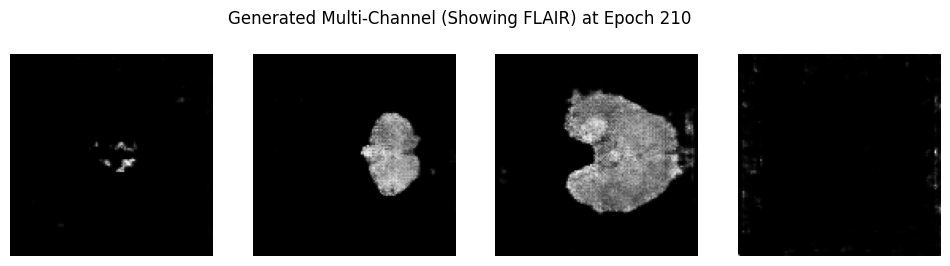

Epoch 211/1000
  Discriminator Loss: -20.4557 | Generator Loss: 11.6770 | D Accuracy: 0.7552
Epoch 212/1000
  Discriminator Loss: -25.9052 | Generator Loss: 3.1637 | D Accuracy: 0.7500
Epoch 213/1000
  Discriminator Loss: -24.8986 | Generator Loss: -7.8492 | D Accuracy: 0.7760
Epoch 214/1000
  Discriminator Loss: -23.6379 | Generator Loss: 0.6551 | D Accuracy: 0.7969
Epoch 215/1000
  Discriminator Loss: -24.2442 | Generator Loss: 10.1686 | D Accuracy: 0.7708
Epoch 216/1000
  Discriminator Loss: -25.4100 | Generator Loss: 1.0792 | D Accuracy: 0.7760
Epoch 217/1000
  Discriminator Loss: -22.0158 | Generator Loss: -0.7168 | D Accuracy: 0.7578
Epoch 218/1000
  Discriminator Loss: -27.2605 | Generator Loss: 1.8205 | D Accuracy: 0.7292
Epoch 219/1000
  Discriminator Loss: -27.4001 | Generator Loss: -15.3458 | D Accuracy: 0.7526
Epoch 220/1000
  Discriminator Loss: -26.0536 | Generator Loss: -10.4830 | D Accuracy: 0.7135


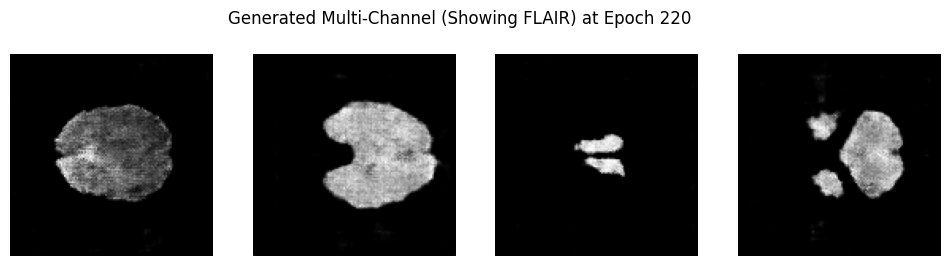

Epoch 221/1000
  Discriminator Loss: -25.1174 | Generator Loss: -4.9995 | D Accuracy: 0.7656
Epoch 222/1000
  Discriminator Loss: -26.4233 | Generator Loss: -8.7319 | D Accuracy: 0.7422
Epoch 223/1000
  Discriminator Loss: -22.5690 | Generator Loss: -9.5509 | D Accuracy: 0.7839
Epoch 224/1000
  Discriminator Loss: -23.6464 | Generator Loss: -10.5144 | D Accuracy: 0.7734
Epoch 225/1000
  Discriminator Loss: -24.0736 | Generator Loss: 8.7197 | D Accuracy: 0.7995
Epoch 226/1000
  Discriminator Loss: -23.5987 | Generator Loss: -17.9190 | D Accuracy: 0.7995
Epoch 227/1000
  Discriminator Loss: -24.5893 | Generator Loss: -16.7846 | D Accuracy: 0.7812
Epoch 228/1000
  Discriminator Loss: -22.5980 | Generator Loss: -7.2423 | D Accuracy: 0.7943
Epoch 229/1000
  Discriminator Loss: -26.8737 | Generator Loss: -2.5947 | D Accuracy: 0.8151
Epoch 230/1000
  Discriminator Loss: -24.2429 | Generator Loss: -26.3929 | D Accuracy: 0.7682


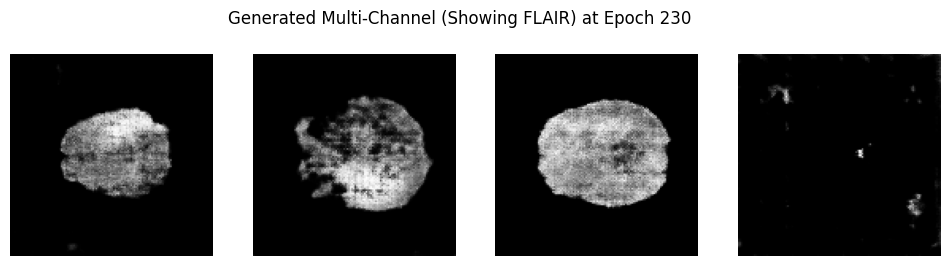

Epoch 231/1000
  Discriminator Loss: -32.3369 | Generator Loss: -15.1029 | D Accuracy: 0.7422
Epoch 232/1000
  Discriminator Loss: -22.2106 | Generator Loss: -17.0194 | D Accuracy: 0.8151
Epoch 233/1000
  Discriminator Loss: -22.1179 | Generator Loss: -15.0008 | D Accuracy: 0.8073
Epoch 234/1000
  Discriminator Loss: -25.5569 | Generator Loss: -7.0046 | D Accuracy: 0.8177
Epoch 235/1000
  Discriminator Loss: -25.5469 | Generator Loss: 7.8657 | D Accuracy: 0.7630
Epoch 236/1000
  Discriminator Loss: -24.6924 | Generator Loss: 2.5877 | D Accuracy: 0.7812
Epoch 237/1000
  Discriminator Loss: -24.1355 | Generator Loss: 1.4109 | D Accuracy: 0.7708
Epoch 238/1000
  Discriminator Loss: -24.7273 | Generator Loss: -12.4254 | D Accuracy: 0.7500
Epoch 239/1000
  Discriminator Loss: -23.9282 | Generator Loss: -18.6602 | D Accuracy: 0.7734
Epoch 240/1000
  Discriminator Loss: -25.4435 | Generator Loss: -21.2728 | D Accuracy: 0.7500


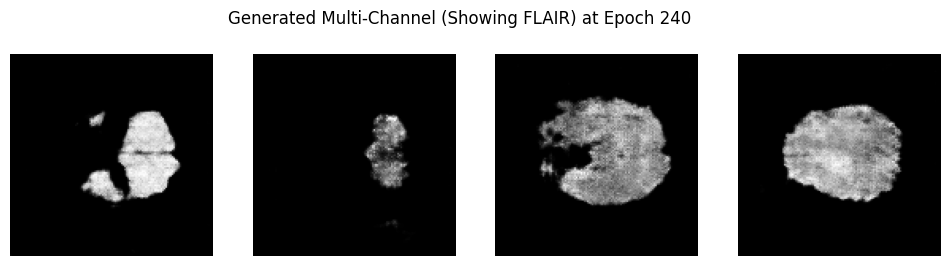

Epoch 241/1000
  Discriminator Loss: -28.1579 | Generator Loss: -13.3721 | D Accuracy: 0.6927
Epoch 242/1000
  Discriminator Loss: -32.3531 | Generator Loss: 2.3551 | D Accuracy: 0.7474
Epoch 243/1000
  Discriminator Loss: -29.5963 | Generator Loss: -27.0249 | D Accuracy: 0.7344
Epoch 244/1000
  Discriminator Loss: -23.3701 | Generator Loss: -7.1901 | D Accuracy: 0.8047
Epoch 245/1000
  Discriminator Loss: -32.2041 | Generator Loss: 7.7503 | D Accuracy: 0.7318
Epoch 246/1000
  Discriminator Loss: -23.6084 | Generator Loss: -6.1945 | D Accuracy: 0.7969
Epoch 247/1000
  Discriminator Loss: -27.5761 | Generator Loss: -14.3227 | D Accuracy: 0.7839
Epoch 248/1000
  Discriminator Loss: -25.2305 | Generator Loss: -3.7754 | D Accuracy: 0.7995
Epoch 249/1000
  Discriminator Loss: -26.7106 | Generator Loss: -17.5906 | D Accuracy: 0.7812
Epoch 250/1000
  Discriminator Loss: -22.9894 | Generator Loss: -3.1084 | D Accuracy: 0.7995


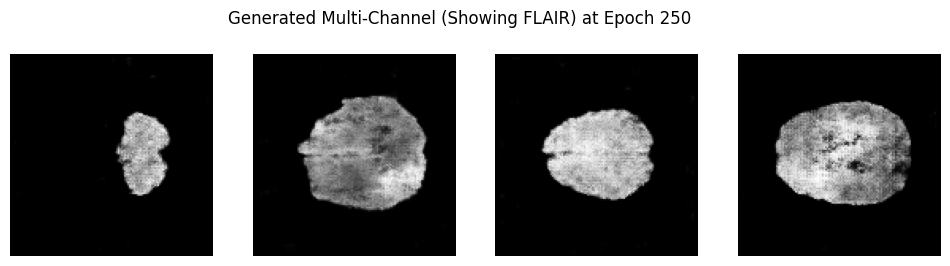

Epoch 251/1000
  Discriminator Loss: -23.5309 | Generator Loss: -7.2716 | D Accuracy: 0.8255
Epoch 252/1000
  Discriminator Loss: -28.1817 | Generator Loss: 6.5717 | D Accuracy: 0.8047
Epoch 253/1000
  Discriminator Loss: -29.1855 | Generator Loss: 1.9297 | D Accuracy: 0.7995
Epoch 254/1000
  Discriminator Loss: -25.9323 | Generator Loss: 2.5776 | D Accuracy: 0.7552
Epoch 255/1000
  Discriminator Loss: -28.7131 | Generator Loss: 1.3959 | D Accuracy: 0.7500
Epoch 256/1000
  Discriminator Loss: -25.3732 | Generator Loss: 1.9421 | D Accuracy: 0.7760
Epoch 257/1000
  Discriminator Loss: -25.9773 | Generator Loss: -0.6798 | D Accuracy: 0.7708
Epoch 258/1000
  Discriminator Loss: -22.9104 | Generator Loss: -7.3765 | D Accuracy: 0.8229
Epoch 259/1000
  Discriminator Loss: -26.2461 | Generator Loss: 2.9848 | D Accuracy: 0.7943
Epoch 260/1000
  Discriminator Loss: -23.4423 | Generator Loss: 5.4494 | D Accuracy: 0.7760


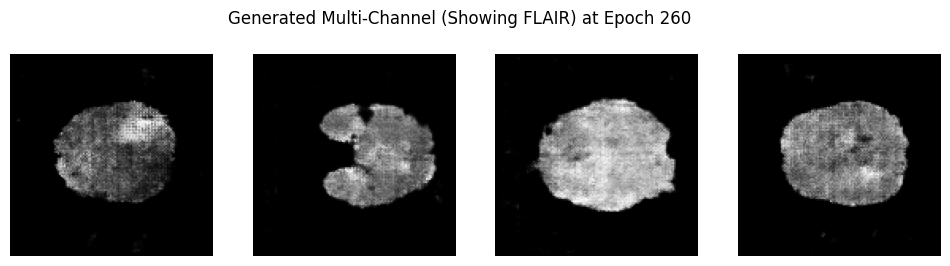

Epoch 261/1000
  Discriminator Loss: -23.7858 | Generator Loss: 1.9491 | D Accuracy: 0.7448
Epoch 262/1000
  Discriminator Loss: -23.6264 | Generator Loss: 2.0729 | D Accuracy: 0.8229
Epoch 263/1000
  Discriminator Loss: -28.0796 | Generator Loss: -3.5472 | D Accuracy: 0.8385
Epoch 264/1000
  Discriminator Loss: -29.9264 | Generator Loss: -1.1219 | D Accuracy: 0.7682
Epoch 265/1000
  Discriminator Loss: -25.9634 | Generator Loss: 12.6377 | D Accuracy: 0.7448
Epoch 266/1000
  Discriminator Loss: -25.5584 | Generator Loss: 2.1541 | D Accuracy: 0.8255
Epoch 267/1000
  Discriminator Loss: -26.1486 | Generator Loss: 2.1980 | D Accuracy: 0.7917
Epoch 268/1000
  Discriminator Loss: -35.2667 | Generator Loss: -1.4474 | D Accuracy: 0.7943
Epoch 269/1000
  Discriminator Loss: -26.6923 | Generator Loss: 39.6737 | D Accuracy: 0.7552
Epoch 270/1000
  Discriminator Loss: -24.0531 | Generator Loss: 8.1431 | D Accuracy: 0.7734


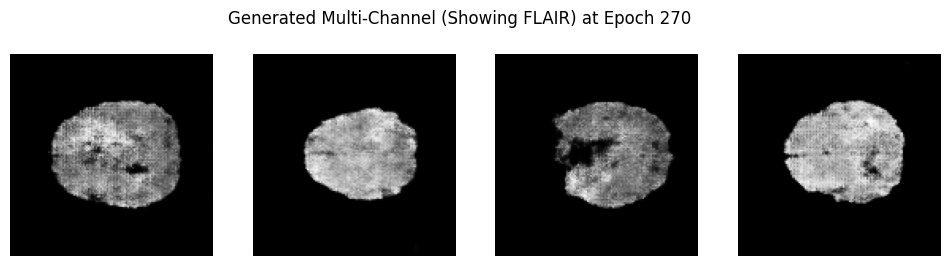

Epoch 271/1000
  Discriminator Loss: -26.0424 | Generator Loss: 3.2619 | D Accuracy: 0.8047
Epoch 272/1000
  Discriminator Loss: -23.8571 | Generator Loss: 0.1637 | D Accuracy: 0.8177
Epoch 273/1000
  Discriminator Loss: -24.6670 | Generator Loss: -0.4039 | D Accuracy: 0.8047
Epoch 274/1000
  Discriminator Loss: -26.7914 | Generator Loss: -0.4898 | D Accuracy: 0.8281
Epoch 275/1000
  Discriminator Loss: -26.5004 | Generator Loss: -5.1759 | D Accuracy: 0.7865
Epoch 276/1000
  Discriminator Loss: -27.5065 | Generator Loss: -1.9382 | D Accuracy: 0.8021
Epoch 277/1000
  Discriminator Loss: -25.8607 | Generator Loss: 5.6582 | D Accuracy: 0.8047
Epoch 278/1000
  Discriminator Loss: -25.3682 | Generator Loss: 2.7972 | D Accuracy: 0.7969
Epoch 279/1000
  Discriminator Loss: -26.8831 | Generator Loss: 4.5164 | D Accuracy: 0.8255
Epoch 280/1000
  Discriminator Loss: -27.8247 | Generator Loss: 10.3781 | D Accuracy: 0.7943


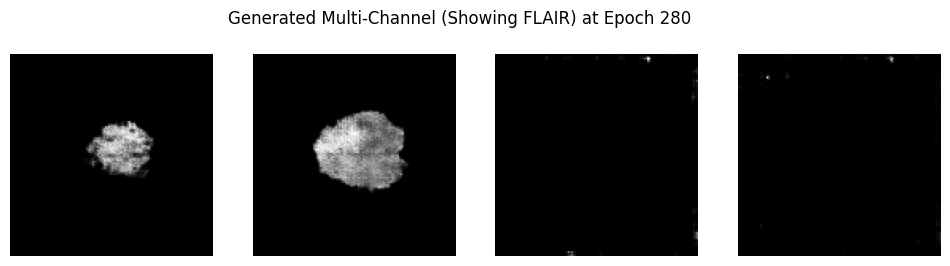

Epoch 281/1000
  Discriminator Loss: -27.3939 | Generator Loss: 6.9152 | D Accuracy: 0.7682
Epoch 282/1000
  Discriminator Loss: -27.4159 | Generator Loss: -6.4016 | D Accuracy: 0.7891
Epoch 283/1000
  Discriminator Loss: -26.6657 | Generator Loss: -19.3937 | D Accuracy: 0.8177
Epoch 284/1000
  Discriminator Loss: -25.4623 | Generator Loss: 6.4450 | D Accuracy: 0.7422
Epoch 285/1000
  Discriminator Loss: -30.7905 | Generator Loss: 9.2689 | D Accuracy: 0.7604
Epoch 286/1000
  Discriminator Loss: -27.9234 | Generator Loss: 0.5811 | D Accuracy: 0.7812
Epoch 287/1000
  Discriminator Loss: -24.1083 | Generator Loss: 6.9542 | D Accuracy: 0.8151
Epoch 288/1000
  Discriminator Loss: -27.9854 | Generator Loss: -7.1685 | D Accuracy: 0.7604
Epoch 289/1000
  Discriminator Loss: -26.3892 | Generator Loss: -4.0166 | D Accuracy: 0.8099
Epoch 290/1000
  Discriminator Loss: -25.6094 | Generator Loss: 4.9299 | D Accuracy: 0.7760


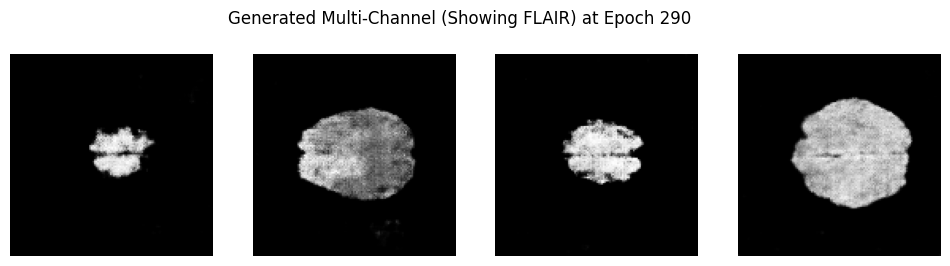

Epoch 291/1000
  Discriminator Loss: -24.4939 | Generator Loss: 2.6868 | D Accuracy: 0.7682
Epoch 292/1000
  Discriminator Loss: -32.1993 | Generator Loss: -0.8714 | D Accuracy: 0.7552
Epoch 293/1000
  Discriminator Loss: -27.3139 | Generator Loss: 14.1478 | D Accuracy: 0.7839
Epoch 294/1000
  Discriminator Loss: -26.3186 | Generator Loss: -8.0532 | D Accuracy: 0.7500
Epoch 295/1000
  Discriminator Loss: -28.3438 | Generator Loss: 1.7953 | D Accuracy: 0.7995
Epoch 296/1000
  Discriminator Loss: -32.7138 | Generator Loss: 1.0909 | D Accuracy: 0.7656
Epoch 297/1000
  Discriminator Loss: -28.1038 | Generator Loss: -8.6195 | D Accuracy: 0.7500
Epoch 298/1000
  Discriminator Loss: -26.5600 | Generator Loss: 5.5880 | D Accuracy: 0.7760
Epoch 299/1000
  Discriminator Loss: -24.7471 | Generator Loss: -12.1878 | D Accuracy: 0.7812
Epoch 300/1000
  Discriminator Loss: -27.1027 | Generator Loss: -2.7576 | D Accuracy: 0.8307


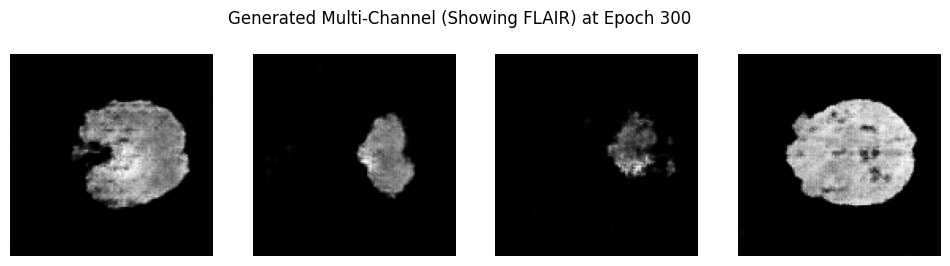

Epoch 301/1000
  Discriminator Loss: -28.6376 | Generator Loss: -2.5307 | D Accuracy: 0.8177
Epoch 302/1000
  Discriminator Loss: -26.2006 | Generator Loss: -2.1111 | D Accuracy: 0.7969
Epoch 303/1000
  Discriminator Loss: -33.9112 | Generator Loss: 2.2566 | D Accuracy: 0.7109
Epoch 304/1000
  Discriminator Loss: -25.5543 | Generator Loss: 18.5869 | D Accuracy: 0.7995
Epoch 305/1000
  Discriminator Loss: -26.8395 | Generator Loss: -6.0621 | D Accuracy: 0.8516
Epoch 306/1000
  Discriminator Loss: -22.9694 | Generator Loss: 5.3871 | D Accuracy: 0.8333
Epoch 307/1000
  Discriminator Loss: -29.6914 | Generator Loss: -5.4525 | D Accuracy: 0.8203
Epoch 308/1000
  Discriminator Loss: -24.2131 | Generator Loss: 2.8981 | D Accuracy: 0.7943
Epoch 309/1000
  Discriminator Loss: -26.4307 | Generator Loss: 0.1702 | D Accuracy: 0.8125
Epoch 310/1000
  Discriminator Loss: -26.4596 | Generator Loss: 4.9017 | D Accuracy: 0.8151


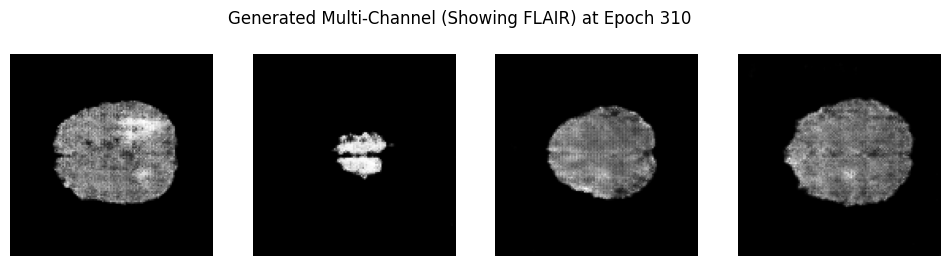

Epoch 311/1000
  Discriminator Loss: -29.6167 | Generator Loss: 2.6694 | D Accuracy: 0.7995
Epoch 312/1000
  Discriminator Loss: -29.3861 | Generator Loss: 2.6141 | D Accuracy: 0.8125
Epoch 313/1000
  Discriminator Loss: -28.8148 | Generator Loss: 2.3332 | D Accuracy: 0.8359
Epoch 314/1000
  Discriminator Loss: -30.2442 | Generator Loss: -0.4680 | D Accuracy: 0.8411
Epoch 315/1000
  Discriminator Loss: -31.2172 | Generator Loss: 8.1090 | D Accuracy: 0.7995
Epoch 316/1000
  Discriminator Loss: -32.2618 | Generator Loss: 11.2452 | D Accuracy: 0.7839
Epoch 317/1000
  Discriminator Loss: -28.2767 | Generator Loss: -11.3235 | D Accuracy: 0.7448
Epoch 318/1000
  Discriminator Loss: -34.2866 | Generator Loss: -8.5022 | D Accuracy: 0.7786
Epoch 319/1000
  Discriminator Loss: -29.8134 | Generator Loss: 8.6736 | D Accuracy: 0.8021
Epoch 320/1000
  Discriminator Loss: -29.2833 | Generator Loss: 5.5384 | D Accuracy: 0.8177


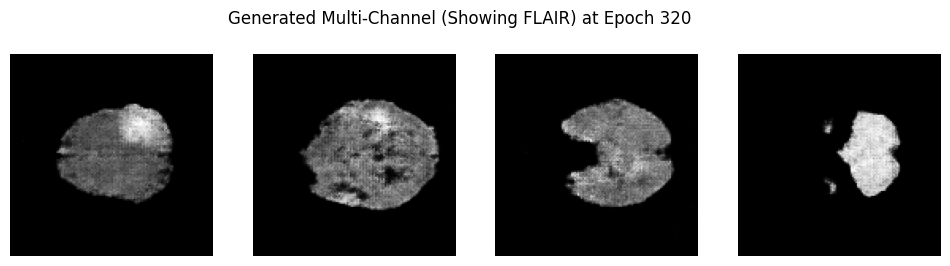

Epoch 321/1000
  Discriminator Loss: -26.2707 | Generator Loss: 2.6310 | D Accuracy: 0.8047
Epoch 322/1000
  Discriminator Loss: -29.2963 | Generator Loss: 5.4803 | D Accuracy: 0.8464
Epoch 323/1000
  Discriminator Loss: -29.7652 | Generator Loss: 11.5143 | D Accuracy: 0.7708
Epoch 324/1000
  Discriminator Loss: -27.8693 | Generator Loss: 10.5817 | D Accuracy: 0.8151
Epoch 325/1000
  Discriminator Loss: -24.0886 | Generator Loss: 5.8720 | D Accuracy: 0.8229
Epoch 326/1000
  Discriminator Loss: -31.3185 | Generator Loss: 7.9713 | D Accuracy: 0.7891
Epoch 327/1000
  Discriminator Loss: -31.2650 | Generator Loss: 19.3396 | D Accuracy: 0.7839
Epoch 328/1000
  Discriminator Loss: -29.3312 | Generator Loss: 7.0324 | D Accuracy: 0.7943
Epoch 329/1000
  Discriminator Loss: -26.6061 | Generator Loss: 7.5814 | D Accuracy: 0.8229
Epoch 330/1000
  Discriminator Loss: -28.2123 | Generator Loss: 7.1475 | D Accuracy: 0.8151


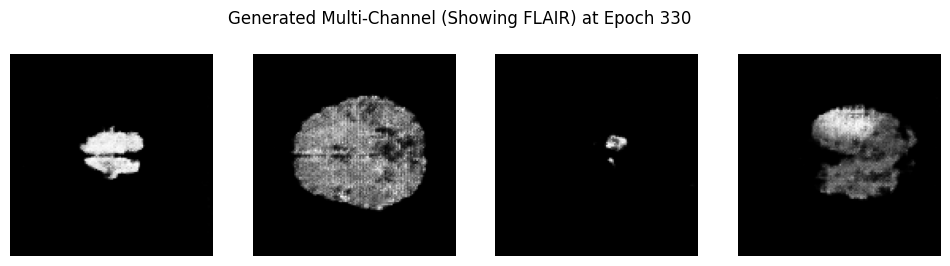

Epoch 331/1000
  Discriminator Loss: -26.3786 | Generator Loss: 0.2869 | D Accuracy: 0.8333
Epoch 332/1000
  Discriminator Loss: -28.2563 | Generator Loss: 5.8553 | D Accuracy: 0.8177
Epoch 333/1000
  Discriminator Loss: -33.2910 | Generator Loss: 6.9335 | D Accuracy: 0.7526
Epoch 334/1000
  Discriminator Loss: -32.0277 | Generator Loss: 6.1975 | D Accuracy: 0.7812
Epoch 335/1000
  Discriminator Loss: -36.4932 | Generator Loss: 10.5792 | D Accuracy: 0.8047
Epoch 336/1000
  Discriminator Loss: -26.3334 | Generator Loss: 8.9219 | D Accuracy: 0.8281
Epoch 337/1000
  Discriminator Loss: -32.4115 | Generator Loss: 4.5450 | D Accuracy: 0.8177
Epoch 338/1000
  Discriminator Loss: -25.5307 | Generator Loss: 2.3519 | D Accuracy: 0.8229
Epoch 339/1000
  Discriminator Loss: -30.1867 | Generator Loss: 8.3609 | D Accuracy: 0.7865
Epoch 340/1000
  Discriminator Loss: -30.3836 | Generator Loss: -1.1881 | D Accuracy: 0.8177


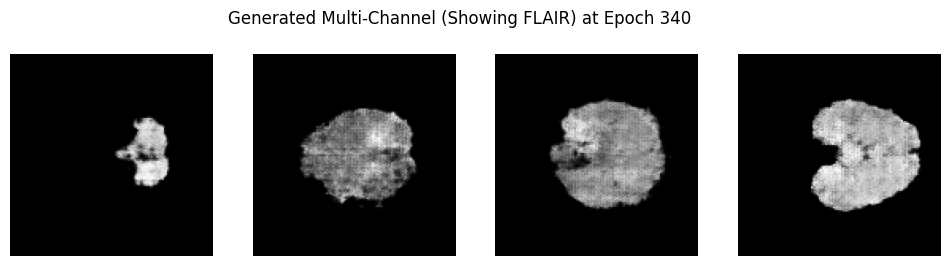

Epoch 341/1000
  Discriminator Loss: -30.4743 | Generator Loss: -2.9722 | D Accuracy: 0.7943
Epoch 342/1000
  Discriminator Loss: -35.6932 | Generator Loss: 10.7586 | D Accuracy: 0.7552
Epoch 343/1000
  Discriminator Loss: -28.5506 | Generator Loss: -9.2010 | D Accuracy: 0.8333
Epoch 344/1000
  Discriminator Loss: -28.9167 | Generator Loss: -6.6480 | D Accuracy: 0.8125
Epoch 345/1000
  Discriminator Loss: -33.5595 | Generator Loss: 2.6983 | D Accuracy: 0.7526
Epoch 346/1000
  Discriminator Loss: -23.2520 | Generator Loss: -8.9817 | D Accuracy: 0.8281
Epoch 347/1000
  Discriminator Loss: -29.3830 | Generator Loss: 1.7167 | D Accuracy: 0.8672
Epoch 348/1000
  Discriminator Loss: -27.0832 | Generator Loss: -15.2484 | D Accuracy: 0.8255
Epoch 349/1000
  Discriminator Loss: -38.4370 | Generator Loss: -6.5373 | D Accuracy: 0.8307
Epoch 350/1000
  Discriminator Loss: -32.1530 | Generator Loss: -1.9248 | D Accuracy: 0.7578


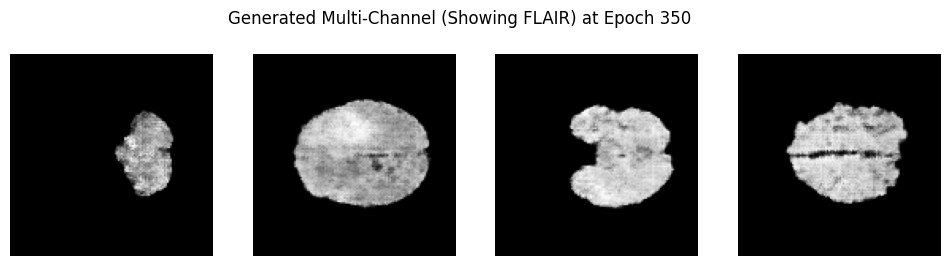

Epoch 351/1000
  Discriminator Loss: -27.2172 | Generator Loss: -7.6071 | D Accuracy: 0.7865
Epoch 352/1000
  Discriminator Loss: -34.5650 | Generator Loss: 0.6754 | D Accuracy: 0.8333
Epoch 353/1000
  Discriminator Loss: -28.2976 | Generator Loss: 10.4784 | D Accuracy: 0.7500
Epoch 354/1000
  Discriminator Loss: -30.0920 | Generator Loss: 1.7402 | D Accuracy: 0.8229
Epoch 355/1000
  Discriminator Loss: -28.4996 | Generator Loss: -3.8610 | D Accuracy: 0.8438
Epoch 356/1000
  Discriminator Loss: -33.1146 | Generator Loss: 7.3071 | D Accuracy: 0.8229
Epoch 357/1000
  Discriminator Loss: -32.4584 | Generator Loss: -4.4673 | D Accuracy: 0.8255
Epoch 358/1000
  Discriminator Loss: -30.3398 | Generator Loss: 0.7070 | D Accuracy: 0.7578
Epoch 359/1000
  Discriminator Loss: -30.7688 | Generator Loss: -0.7843 | D Accuracy: 0.7969
Epoch 360/1000
  Discriminator Loss: -32.6542 | Generator Loss: -13.5545 | D Accuracy: 0.7708


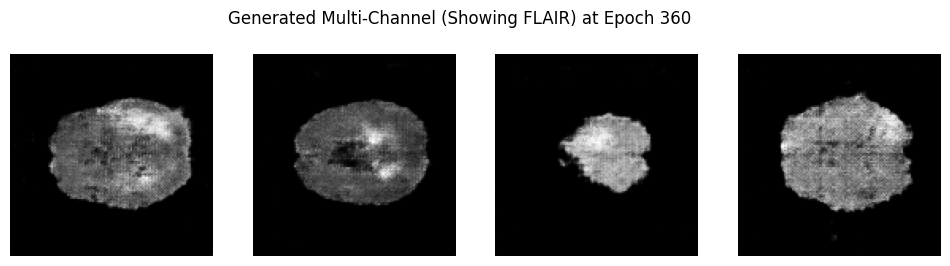

Epoch 361/1000
  Discriminator Loss: -28.5896 | Generator Loss: -3.2683 | D Accuracy: 0.8177
Epoch 362/1000
  Discriminator Loss: -30.1887 | Generator Loss: 2.3308 | D Accuracy: 0.8438
Epoch 363/1000
  Discriminator Loss: -20.3962 | Generator Loss: 12.6356 | D Accuracy: 0.8177
Epoch 364/1000
  Discriminator Loss: -27.7411 | Generator Loss: -0.4170 | D Accuracy: 0.7734
Epoch 365/1000
  Discriminator Loss: -32.5058 | Generator Loss: 1.9077 | D Accuracy: 0.8099
Epoch 366/1000
  Discriminator Loss: -31.9159 | Generator Loss: -5.7325 | D Accuracy: 0.8307
Epoch 367/1000
  Discriminator Loss: -30.6706 | Generator Loss: 7.2036 | D Accuracy: 0.7891
Epoch 368/1000
  Discriminator Loss: -30.5484 | Generator Loss: -4.4707 | D Accuracy: 0.8672
Epoch 369/1000
  Discriminator Loss: -30.1614 | Generator Loss: 1.8284 | D Accuracy: 0.8359
Epoch 370/1000
  Discriminator Loss: -30.6356 | Generator Loss: -10.0674 | D Accuracy: 0.8151


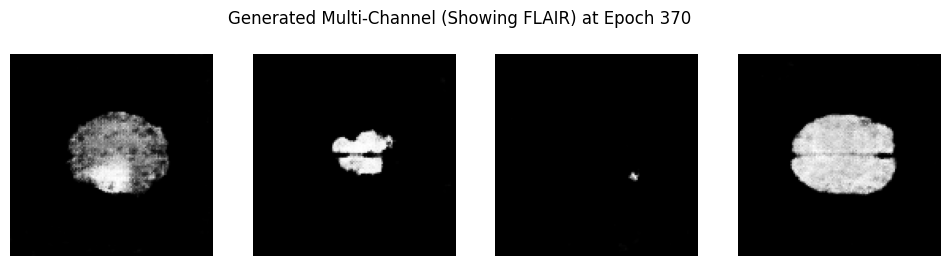

Epoch 371/1000
  Discriminator Loss: -29.8138 | Generator Loss: -7.5782 | D Accuracy: 0.7891
Epoch 372/1000
  Discriminator Loss: -34.4651 | Generator Loss: -8.6206 | D Accuracy: 0.7865
Epoch 373/1000
  Discriminator Loss: -28.8133 | Generator Loss: 11.3249 | D Accuracy: 0.7708
Epoch 374/1000
  Discriminator Loss: -30.1282 | Generator Loss: -3.6810 | D Accuracy: 0.8438
Epoch 375/1000
  Discriminator Loss: -30.9003 | Generator Loss: -2.8182 | D Accuracy: 0.8385
Epoch 376/1000
  Discriminator Loss: -31.6714 | Generator Loss: -1.3851 | D Accuracy: 0.7839
Epoch 377/1000
  Discriminator Loss: -33.9648 | Generator Loss: -5.1075 | D Accuracy: 0.8828
Epoch 378/1000
  Discriminator Loss: -36.9852 | Generator Loss: -6.0773 | D Accuracy: 0.8021
Epoch 379/1000
  Discriminator Loss: -29.6156 | Generator Loss: 1.5789 | D Accuracy: 0.8281
Epoch 380/1000
  Discriminator Loss: -29.0202 | Generator Loss: 2.2637 | D Accuracy: 0.8464


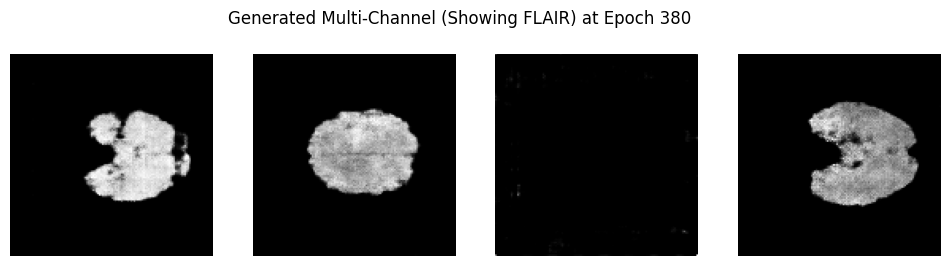

Epoch 381/1000
  Discriminator Loss: -33.0671 | Generator Loss: 8.9751 | D Accuracy: 0.8464
Epoch 382/1000
  Discriminator Loss: -37.7305 | Generator Loss: 15.0951 | D Accuracy: 0.8125
Epoch 383/1000
  Discriminator Loss: -35.9083 | Generator Loss: 46.7042 | D Accuracy: 0.7943
Epoch 384/1000
  Discriminator Loss: -28.4716 | Generator Loss: 17.1074 | D Accuracy: 0.8203
Epoch 385/1000
  Discriminator Loss: -30.3496 | Generator Loss: 4.5417 | D Accuracy: 0.8307
Epoch 386/1000
  Discriminator Loss: -31.4835 | Generator Loss: 7.8686 | D Accuracy: 0.8490
Epoch 387/1000
  Discriminator Loss: -35.5369 | Generator Loss: 10.5148 | D Accuracy: 0.7786
Epoch 388/1000
  Discriminator Loss: -32.9117 | Generator Loss: 7.8149 | D Accuracy: 0.8359
Epoch 389/1000
  Discriminator Loss: -30.9658 | Generator Loss: 6.6069 | D Accuracy: 0.8255
Epoch 390/1000
  Discriminator Loss: -36.3407 | Generator Loss: 13.0266 | D Accuracy: 0.8047


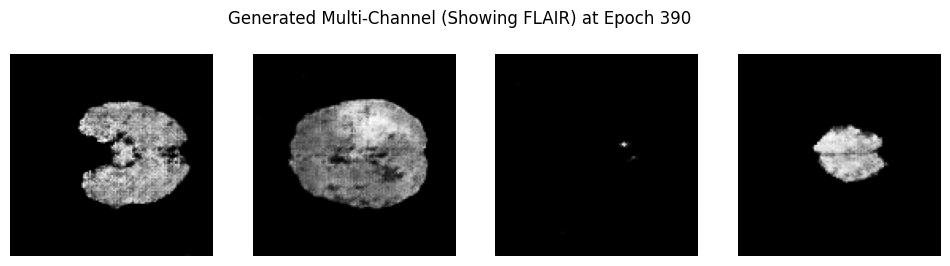

Epoch 391/1000
  Discriminator Loss: -33.5377 | Generator Loss: 6.2825 | D Accuracy: 0.8411
Epoch 392/1000
  Discriminator Loss: -37.7692 | Generator Loss: 8.3959 | D Accuracy: 0.7917
Epoch 393/1000
  Discriminator Loss: -38.9374 | Generator Loss: 14.6495 | D Accuracy: 0.8047
Epoch 394/1000
  Discriminator Loss: -33.0055 | Generator Loss: -5.1176 | D Accuracy: 0.7812
Epoch 395/1000
  Discriminator Loss: -33.8897 | Generator Loss: 4.3883 | D Accuracy: 0.8177
Epoch 396/1000
  Discriminator Loss: -34.3242 | Generator Loss: 1.2350 | D Accuracy: 0.8047
Epoch 397/1000
  Discriminator Loss: -32.0940 | Generator Loss: -2.3970 | D Accuracy: 0.7995
Epoch 398/1000
  Discriminator Loss: -34.8031 | Generator Loss: -1.0104 | D Accuracy: 0.8203
Epoch 399/1000
  Discriminator Loss: -30.8563 | Generator Loss: -11.8889 | D Accuracy: 0.8255
Epoch 400/1000
  Discriminator Loss: -37.2206 | Generator Loss: -0.1141 | D Accuracy: 0.8047


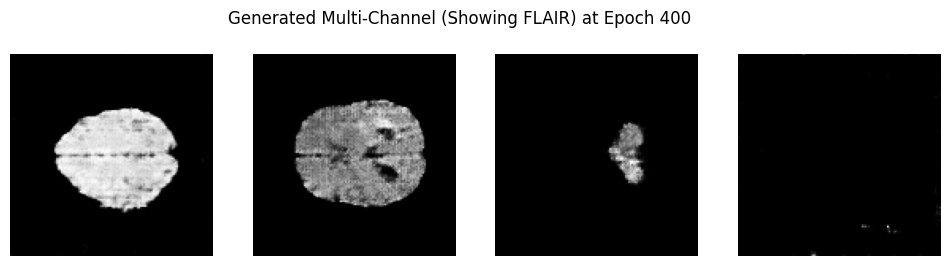

Epoch 401/1000
  Discriminator Loss: -32.4771 | Generator Loss: -0.5220 | D Accuracy: 0.8385
Epoch 402/1000
  Discriminator Loss: -34.2642 | Generator Loss: 7.3538 | D Accuracy: 0.8203
Epoch 403/1000
  Discriminator Loss: -32.0524 | Generator Loss: -2.1912 | D Accuracy: 0.7865
Epoch 404/1000
  Discriminator Loss: -35.3893 | Generator Loss: 9.6630 | D Accuracy: 0.8177
Epoch 405/1000
  Discriminator Loss: -35.7375 | Generator Loss: 6.1424 | D Accuracy: 0.8307
Epoch 406/1000
  Discriminator Loss: -33.1487 | Generator Loss: 3.7903 | D Accuracy: 0.7812
Epoch 407/1000
  Discriminator Loss: -33.9256 | Generator Loss: -3.8352 | D Accuracy: 0.8281
Epoch 408/1000
  Discriminator Loss: -32.3418 | Generator Loss: 5.4093 | D Accuracy: 0.7969
Epoch 409/1000
  Discriminator Loss: -33.7310 | Generator Loss: 0.4017 | D Accuracy: 0.8438
Epoch 410/1000
  Discriminator Loss: -30.5450 | Generator Loss: 5.8446 | D Accuracy: 0.7943


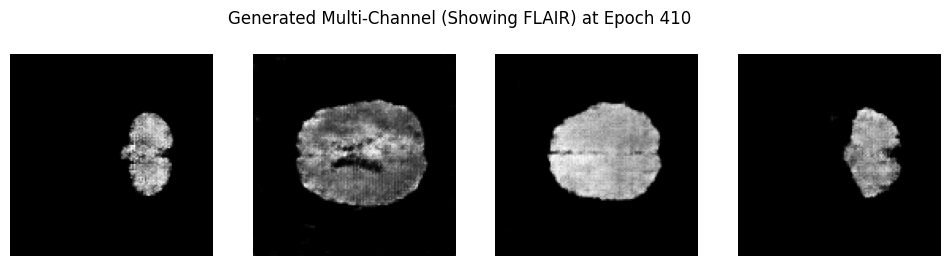

Epoch 411/1000
  Discriminator Loss: -37.5059 | Generator Loss: -3.0094 | D Accuracy: 0.8776
Epoch 412/1000
  Discriminator Loss: -34.2749 | Generator Loss: -6.2185 | D Accuracy: 0.8229
Epoch 413/1000
  Discriminator Loss: -33.8110 | Generator Loss: -13.9243 | D Accuracy: 0.8047
Epoch 414/1000
  Discriminator Loss: -30.6606 | Generator Loss: -1.9046 | D Accuracy: 0.7812
Epoch 415/1000
  Discriminator Loss: -34.8853 | Generator Loss: 7.1258 | D Accuracy: 0.8359
Epoch 416/1000
  Discriminator Loss: -35.4459 | Generator Loss: 2.5686 | D Accuracy: 0.8125
Epoch 417/1000
  Discriminator Loss: -30.6608 | Generator Loss: -3.4431 | D Accuracy: 0.8229
Epoch 418/1000
  Discriminator Loss: -39.7715 | Generator Loss: 5.1328 | D Accuracy: 0.8203
Epoch 419/1000
  Discriminator Loss: -28.2084 | Generator Loss: 3.0324 | D Accuracy: 0.8203
Epoch 420/1000
  Discriminator Loss: -32.3821 | Generator Loss: 1.8382 | D Accuracy: 0.8021


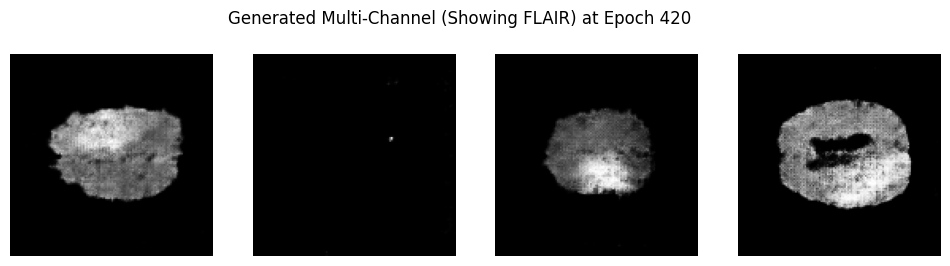

Epoch 421/1000
  Discriminator Loss: -39.4011 | Generator Loss: 13.2696 | D Accuracy: 0.8125
Epoch 422/1000
  Discriminator Loss: -31.5516 | Generator Loss: -3.2754 | D Accuracy: 0.8516
Epoch 423/1000
  Discriminator Loss: -34.0340 | Generator Loss: 8.1396 | D Accuracy: 0.8724
Epoch 424/1000
  Discriminator Loss: -32.9620 | Generator Loss: 0.7773 | D Accuracy: 0.8438
Epoch 425/1000
  Discriminator Loss: -34.9226 | Generator Loss: 6.2816 | D Accuracy: 0.8802
Epoch 426/1000
  Discriminator Loss: -27.8502 | Generator Loss: 3.3189 | D Accuracy: 0.8880
Epoch 427/1000
  Discriminator Loss: -32.2695 | Generator Loss: -7.8622 | D Accuracy: 0.8177
Epoch 428/1000
  Discriminator Loss: -31.4177 | Generator Loss: 2.7336 | D Accuracy: 0.8021
Epoch 429/1000
  Discriminator Loss: -32.2972 | Generator Loss: 1.2577 | D Accuracy: 0.8281
Epoch 430/1000
  Discriminator Loss: -36.9684 | Generator Loss: -2.4369 | D Accuracy: 0.8385


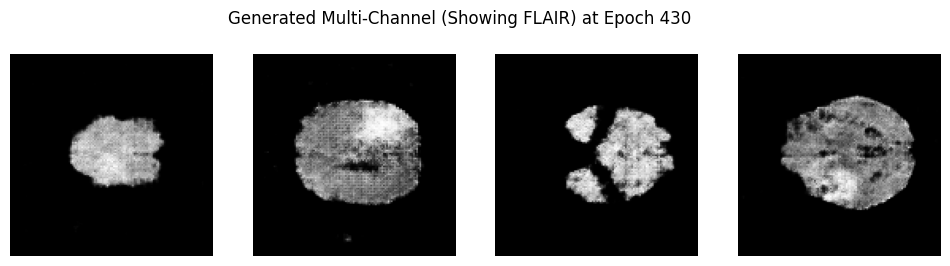

Epoch 431/1000
  Discriminator Loss: -35.1391 | Generator Loss: -2.9689 | D Accuracy: 0.8099
Epoch 432/1000
  Discriminator Loss: -35.2387 | Generator Loss: -3.2104 | D Accuracy: 0.8021
Epoch 433/1000
  Discriminator Loss: -36.5992 | Generator Loss: -3.9948 | D Accuracy: 0.8542
Epoch 434/1000
  Discriminator Loss: -35.9515 | Generator Loss: -5.2150 | D Accuracy: 0.8464
Epoch 435/1000
  Discriminator Loss: -34.0518 | Generator Loss: -9.3831 | D Accuracy: 0.8073
Epoch 436/1000
  Discriminator Loss: -35.6696 | Generator Loss: -8.8573 | D Accuracy: 0.8333
Epoch 437/1000
  Discriminator Loss: -38.8147 | Generator Loss: -5.5064 | D Accuracy: 0.8776
Epoch 438/1000
  Discriminator Loss: -31.2546 | Generator Loss: 2.0338 | D Accuracy: 0.8411
Epoch 439/1000
  Discriminator Loss: -35.8132 | Generator Loss: -3.5425 | D Accuracy: 0.8516
Epoch 440/1000
  Discriminator Loss: -38.4799 | Generator Loss: -0.9411 | D Accuracy: 0.8021


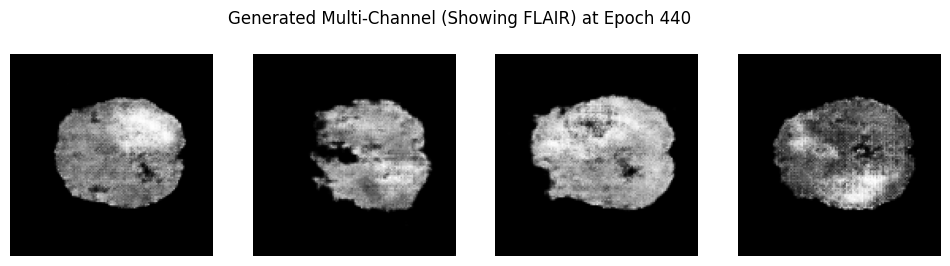

Epoch 441/1000
  Discriminator Loss: -34.0568 | Generator Loss: -14.3498 | D Accuracy: 0.8281
Epoch 442/1000
  Discriminator Loss: -35.0582 | Generator Loss: -7.5490 | D Accuracy: 0.8281
Epoch 443/1000
  Discriminator Loss: -39.4038 | Generator Loss: -2.2453 | D Accuracy: 0.8229
Epoch 444/1000
  Discriminator Loss: -32.0764 | Generator Loss: 7.9414 | D Accuracy: 0.7786
Epoch 445/1000
  Discriminator Loss: -33.4370 | Generator Loss: 14.3970 | D Accuracy: 0.8516
Epoch 446/1000
  Discriminator Loss: -34.0687 | Generator Loss: 4.2290 | D Accuracy: 0.8411
Epoch 447/1000
  Discriminator Loss: -35.0390 | Generator Loss: -0.6376 | D Accuracy: 0.8620
Epoch 448/1000
  Discriminator Loss: -38.0998 | Generator Loss: 5.2626 | D Accuracy: 0.8490
Epoch 449/1000
  Discriminator Loss: -33.2902 | Generator Loss: 6.2748 | D Accuracy: 0.8594
Epoch 450/1000
  Discriminator Loss: -37.8333 | Generator Loss: 5.7824 | D Accuracy: 0.8385


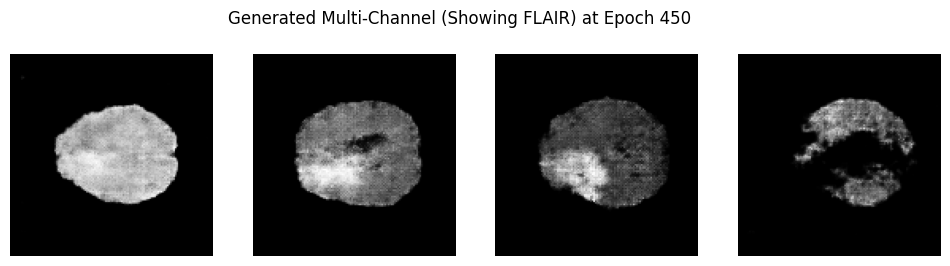

Epoch 451/1000
  Discriminator Loss: -40.6314 | Generator Loss: 2.2800 | D Accuracy: 0.8672
Epoch 452/1000
  Discriminator Loss: -32.9903 | Generator Loss: 8.4288 | D Accuracy: 0.8203
Epoch 453/1000
  Discriminator Loss: -32.1543 | Generator Loss: -4.7957 | D Accuracy: 0.8828
Epoch 454/1000
  Discriminator Loss: -38.0539 | Generator Loss: 9.0839 | D Accuracy: 0.8542
Epoch 455/1000
  Discriminator Loss: -34.0062 | Generator Loss: 13.3298 | D Accuracy: 0.8177
Epoch 456/1000
  Discriminator Loss: -36.4691 | Generator Loss: 4.0137 | D Accuracy: 0.8542
Epoch 457/1000
  Discriminator Loss: -34.8038 | Generator Loss: 3.1334 | D Accuracy: 0.8698
Epoch 458/1000
  Discriminator Loss: -34.8378 | Generator Loss: 5.4266 | D Accuracy: 0.8411
Epoch 459/1000
  Discriminator Loss: -35.3763 | Generator Loss: 4.9725 | D Accuracy: 0.8307
Epoch 460/1000
  Discriminator Loss: -34.1356 | Generator Loss: 4.4084 | D Accuracy: 0.8464


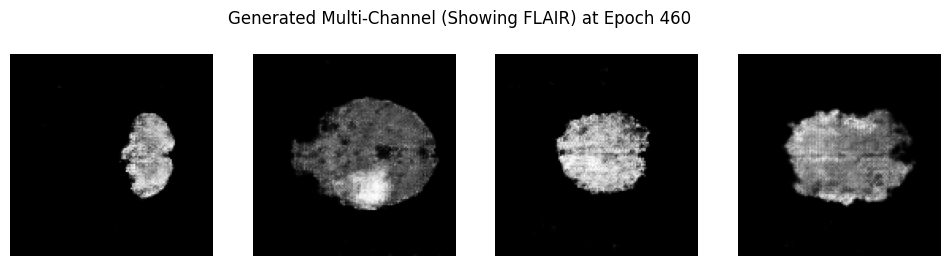

Epoch 461/1000
  Discriminator Loss: -34.6537 | Generator Loss: 4.1761 | D Accuracy: 0.8776
Epoch 462/1000
  Discriminator Loss: -34.2905 | Generator Loss: 7.1168 | D Accuracy: 0.8177
Epoch 463/1000
  Discriminator Loss: -36.1875 | Generator Loss: 6.9421 | D Accuracy: 0.8620
Epoch 464/1000
  Discriminator Loss: -36.3837 | Generator Loss: 14.4508 | D Accuracy: 0.8385
Epoch 465/1000
  Discriminator Loss: -35.6527 | Generator Loss: 2.1543 | D Accuracy: 0.8594
Epoch 466/1000
  Discriminator Loss: -38.1754 | Generator Loss: 7.4107 | D Accuracy: 0.8828
Epoch 467/1000
  Discriminator Loss: -40.7830 | Generator Loss: 17.2036 | D Accuracy: 0.8359
Epoch 468/1000
  Discriminator Loss: -34.4547 | Generator Loss: 11.7555 | D Accuracy: 0.8438
Epoch 469/1000
  Discriminator Loss: -37.4293 | Generator Loss: -1.1033 | D Accuracy: 0.8620
Epoch 470/1000
  Discriminator Loss: -38.5011 | Generator Loss: 4.0432 | D Accuracy: 0.8776


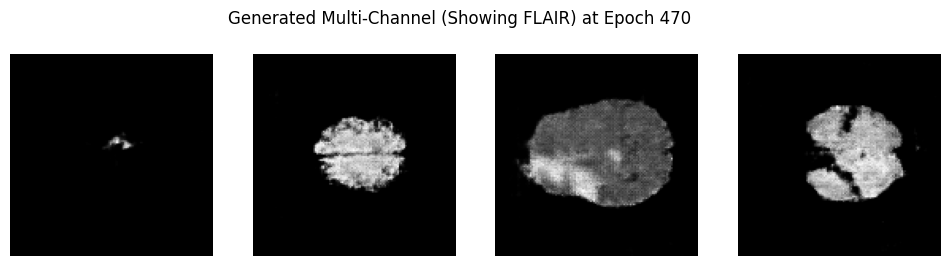

Epoch 471/1000
  Discriminator Loss: -38.9269 | Generator Loss: 0.8069 | D Accuracy: 0.8490
Epoch 472/1000
  Discriminator Loss: -32.6841 | Generator Loss: 1.7662 | D Accuracy: 0.8307
Epoch 473/1000
  Discriminator Loss: -41.0067 | Generator Loss: 3.4595 | D Accuracy: 0.8698
Epoch 474/1000
  Discriminator Loss: -33.4084 | Generator Loss: 1.9136 | D Accuracy: 0.8385
Epoch 475/1000
  Discriminator Loss: -36.2753 | Generator Loss: -1.7449 | D Accuracy: 0.8880
Epoch 476/1000
  Discriminator Loss: -38.9348 | Generator Loss: 12.4847 | D Accuracy: 0.8359
Epoch 477/1000
  Discriminator Loss: -36.3049 | Generator Loss: -1.8984 | D Accuracy: 0.8750
Epoch 478/1000
  Discriminator Loss: -34.9311 | Generator Loss: 2.8428 | D Accuracy: 0.8516
Epoch 479/1000
  Discriminator Loss: -42.3412 | Generator Loss: 7.2493 | D Accuracy: 0.8464
Epoch 480/1000
  Discriminator Loss: -32.8744 | Generator Loss: 6.4536 | D Accuracy: 0.8255


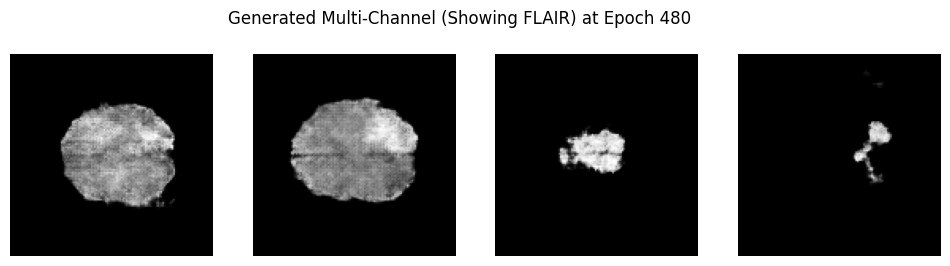

Epoch 481/1000
  Discriminator Loss: -37.8033 | Generator Loss: 14.0507 | D Accuracy: 0.8385
Epoch 482/1000
  Discriminator Loss: -42.0302 | Generator Loss: 6.9014 | D Accuracy: 0.8672
Epoch 483/1000
  Discriminator Loss: -38.2400 | Generator Loss: 0.2448 | D Accuracy: 0.8490
Epoch 484/1000
  Discriminator Loss: -45.5481 | Generator Loss: 11.7417 | D Accuracy: 0.8229
Epoch 485/1000
  Discriminator Loss: -36.2404 | Generator Loss: 1.9184 | D Accuracy: 0.8177
Epoch 486/1000
  Discriminator Loss: -37.3461 | Generator Loss: -3.2099 | D Accuracy: 0.8385
Epoch 487/1000
  Discriminator Loss: -35.6093 | Generator Loss: -0.5806 | D Accuracy: 0.8281
Epoch 488/1000
  Discriminator Loss: -39.4042 | Generator Loss: 4.0155 | D Accuracy: 0.8203
Epoch 489/1000
  Discriminator Loss: -40.0501 | Generator Loss: 8.2990 | D Accuracy: 0.8333
Epoch 490/1000
  Discriminator Loss: -37.9683 | Generator Loss: 4.5566 | D Accuracy: 0.8438


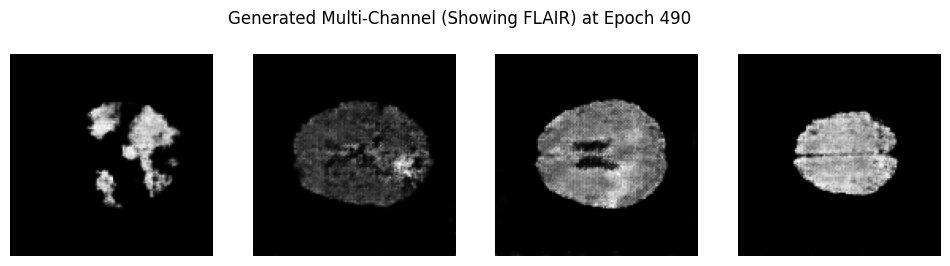

Epoch 491/1000
  Discriminator Loss: -47.1084 | Generator Loss: 4.4547 | D Accuracy: 0.8464
Epoch 492/1000
  Discriminator Loss: -40.8703 | Generator Loss: 5.5930 | D Accuracy: 0.8333
Epoch 493/1000
  Discriminator Loss: -36.6875 | Generator Loss: -0.0586 | D Accuracy: 0.8490
Epoch 494/1000
  Discriminator Loss: -40.2336 | Generator Loss: -1.3831 | D Accuracy: 0.8646
Epoch 495/1000
  Discriminator Loss: -37.8718 | Generator Loss: -5.7185 | D Accuracy: 0.8802
Epoch 496/1000
  Discriminator Loss: -36.6976 | Generator Loss: 6.2786 | D Accuracy: 0.8438
Epoch 497/1000
  Discriminator Loss: -38.1169 | Generator Loss: 2.2164 | D Accuracy: 0.8620
Epoch 498/1000
  Discriminator Loss: -38.5945 | Generator Loss: -7.3168 | D Accuracy: 0.8516
Epoch 499/1000
  Discriminator Loss: -38.3041 | Generator Loss: -1.4122 | D Accuracy: 0.8776
Epoch 500/1000
  Discriminator Loss: -39.6195 | Generator Loss: 7.8822 | D Accuracy: 0.8568


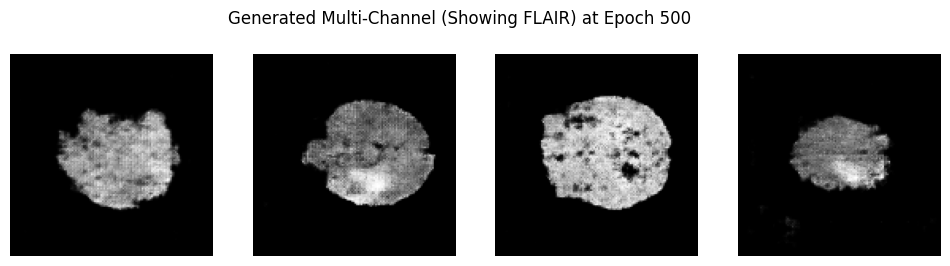

Epoch 501/1000
  Discriminator Loss: -34.6832 | Generator Loss: -0.4742 | D Accuracy: 0.8672
Epoch 502/1000
  Discriminator Loss: -42.8764 | Generator Loss: 5.7494 | D Accuracy: 0.8568
Epoch 503/1000
  Discriminator Loss: -42.2395 | Generator Loss: 3.0419 | D Accuracy: 0.8281
Epoch 504/1000
  Discriminator Loss: -39.0848 | Generator Loss: 6.4380 | D Accuracy: 0.8047
Epoch 505/1000
  Discriminator Loss: -38.7708 | Generator Loss: -2.6981 | D Accuracy: 0.8568
Epoch 506/1000
  Discriminator Loss: -38.2413 | Generator Loss: -4.8928 | D Accuracy: 0.8464
Epoch 507/1000
  Discriminator Loss: -29.8003 | Generator Loss: -1.7150 | D Accuracy: 0.8516
Epoch 508/1000
  Discriminator Loss: -34.8108 | Generator Loss: -5.7274 | D Accuracy: 0.8333
Epoch 509/1000
  Discriminator Loss: -39.0491 | Generator Loss: 0.6476 | D Accuracy: 0.8359
Epoch 510/1000
  Discriminator Loss: -38.7852 | Generator Loss: 0.6569 | D Accuracy: 0.8568


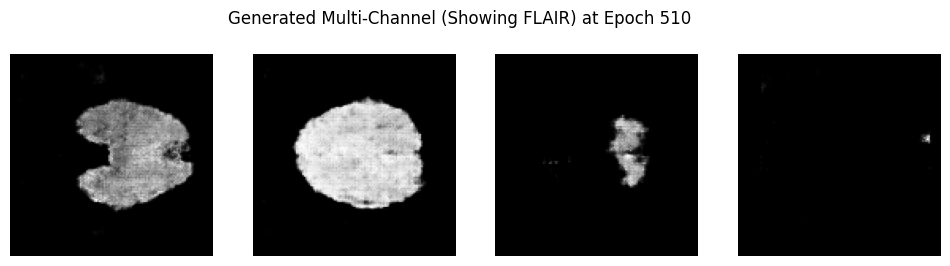

Epoch 511/1000
  Discriminator Loss: -38.6665 | Generator Loss: 4.1578 | D Accuracy: 0.8255
Epoch 512/1000
  Discriminator Loss: -43.3097 | Generator Loss: -6.2380 | D Accuracy: 0.8281
Epoch 513/1000
  Discriminator Loss: -39.7587 | Generator Loss: 4.2056 | D Accuracy: 0.8281
Epoch 514/1000
  Discriminator Loss: -39.9593 | Generator Loss: 2.3207 | D Accuracy: 0.8255
Epoch 515/1000
  Discriminator Loss: -48.8771 | Generator Loss: 8.9995 | D Accuracy: 0.7995
Epoch 516/1000
  Discriminator Loss: -35.9644 | Generator Loss: 3.9314 | D Accuracy: 0.7891
Epoch 517/1000
  Discriminator Loss: -40.9375 | Generator Loss: 5.5387 | D Accuracy: 0.8438
Epoch 518/1000
  Discriminator Loss: -38.9357 | Generator Loss: 5.7658 | D Accuracy: 0.8620
Epoch 519/1000
  Discriminator Loss: -41.1226 | Generator Loss: -2.7769 | D Accuracy: 0.8724
Epoch 520/1000
  Discriminator Loss: -40.1025 | Generator Loss: 4.5263 | D Accuracy: 0.8490


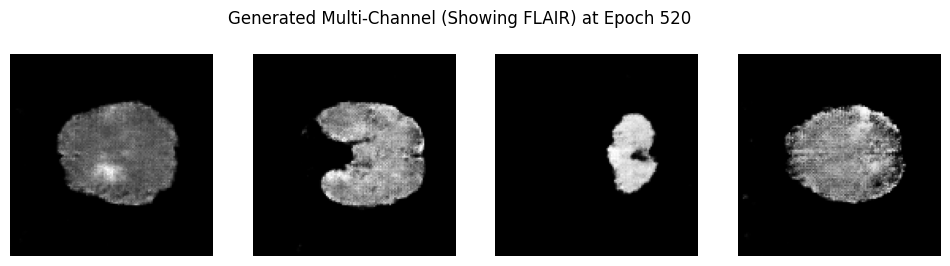

Epoch 521/1000
  Discriminator Loss: -42.3399 | Generator Loss: 4.5596 | D Accuracy: 0.8125
Epoch 522/1000
  Discriminator Loss: -36.1725 | Generator Loss: 11.7772 | D Accuracy: 0.8828
Epoch 523/1000
  Discriminator Loss: -43.9295 | Generator Loss: 8.5042 | D Accuracy: 0.8724
Epoch 524/1000
  Discriminator Loss: -46.1267 | Generator Loss: 5.4223 | D Accuracy: 0.8281
Epoch 525/1000
  Discriminator Loss: -40.9853 | Generator Loss: 6.7688 | D Accuracy: 0.8177
Epoch 526/1000
  Discriminator Loss: -49.3076 | Generator Loss: 10.1167 | D Accuracy: 0.8776
Epoch 527/1000
  Discriminator Loss: -36.9426 | Generator Loss: 15.8690 | D Accuracy: 0.8125
Epoch 528/1000
  Discriminator Loss: -42.7758 | Generator Loss: 13.1758 | D Accuracy: 0.8490
Epoch 529/1000
  Discriminator Loss: -40.5729 | Generator Loss: 11.2802 | D Accuracy: 0.8672
Epoch 530/1000
  Discriminator Loss: -48.2760 | Generator Loss: 12.5406 | D Accuracy: 0.8073


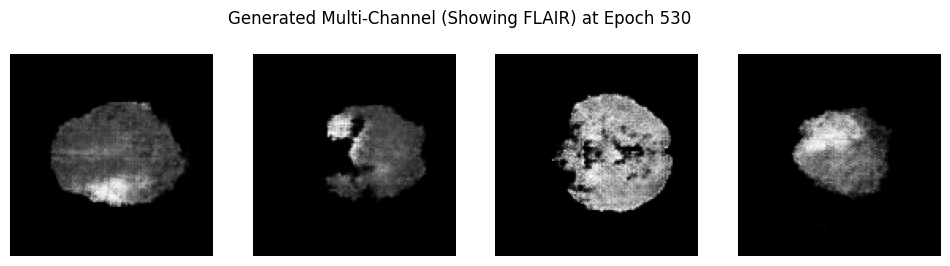

Epoch 531/1000
  Discriminator Loss: -43.5417 | Generator Loss: 14.5979 | D Accuracy: 0.8359
Epoch 532/1000
  Discriminator Loss: -39.0459 | Generator Loss: 13.9960 | D Accuracy: 0.8151
Epoch 533/1000
  Discriminator Loss: -38.6312 | Generator Loss: 12.6526 | D Accuracy: 0.8385
Epoch 534/1000
  Discriminator Loss: -51.7060 | Generator Loss: 10.2706 | D Accuracy: 0.8958
Epoch 535/1000
  Discriminator Loss: -48.1915 | Generator Loss: 6.5972 | D Accuracy: 0.8672
Epoch 536/1000
  Discriminator Loss: -44.3387 | Generator Loss: 10.4655 | D Accuracy: 0.8359
Epoch 537/1000
  Discriminator Loss: -41.7713 | Generator Loss: 7.1943 | D Accuracy: 0.8672
Epoch 538/1000
  Discriminator Loss: -41.4600 | Generator Loss: 14.9615 | D Accuracy: 0.8672
Epoch 539/1000
  Discriminator Loss: -39.7408 | Generator Loss: 9.0814 | D Accuracy: 0.8490
Epoch 540/1000
  Discriminator Loss: -38.8752 | Generator Loss: 10.7386 | D Accuracy: 0.8698


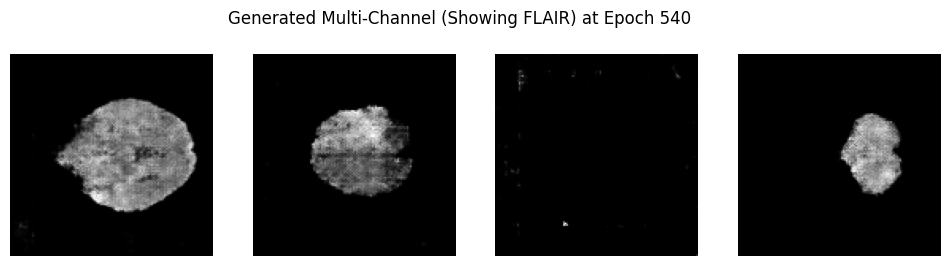

Epoch 541/1000
  Discriminator Loss: -42.6285 | Generator Loss: 7.3992 | D Accuracy: 0.8516
Epoch 542/1000
  Discriminator Loss: -40.9926 | Generator Loss: 9.0549 | D Accuracy: 0.8802
Epoch 543/1000
  Discriminator Loss: -44.7681 | Generator Loss: 8.6373 | D Accuracy: 0.8750
Epoch 544/1000
  Discriminator Loss: -41.6229 | Generator Loss: 15.6584 | D Accuracy: 0.8672
Epoch 545/1000
  Discriminator Loss: -41.9555 | Generator Loss: 23.1956 | D Accuracy: 0.8542
Epoch 546/1000
  Discriminator Loss: -41.3243 | Generator Loss: 16.3334 | D Accuracy: 0.8047
Epoch 547/1000
  Discriminator Loss: -40.8306 | Generator Loss: 11.7293 | D Accuracy: 0.8646
Epoch 548/1000
  Discriminator Loss: -40.7838 | Generator Loss: 6.9248 | D Accuracy: 0.8620
Epoch 549/1000
  Discriminator Loss: -46.3456 | Generator Loss: 11.1186 | D Accuracy: 0.8490
Epoch 550/1000
  Discriminator Loss: -41.4126 | Generator Loss: 3.5937 | D Accuracy: 0.8594


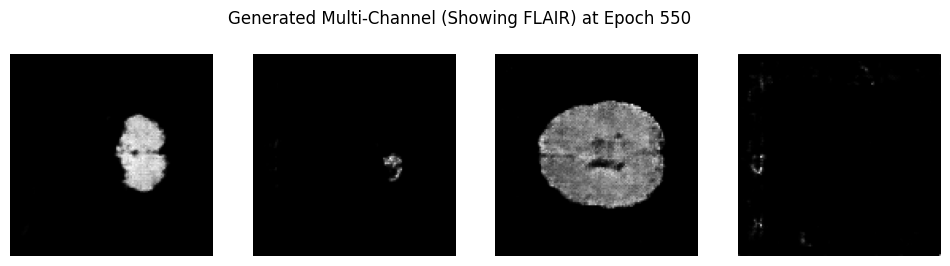

Epoch 551/1000
  Discriminator Loss: -41.0487 | Generator Loss: 12.2188 | D Accuracy: 0.8464
Epoch 552/1000
  Discriminator Loss: -49.5624 | Generator Loss: 11.9867 | D Accuracy: 0.8568
Epoch 553/1000
  Discriminator Loss: -38.0373 | Generator Loss: 11.6678 | D Accuracy: 0.8542
Epoch 554/1000
  Discriminator Loss: -44.4548 | Generator Loss: 14.8861 | D Accuracy: 0.8594
Epoch 555/1000
  Discriminator Loss: -40.6898 | Generator Loss: 13.2277 | D Accuracy: 0.8438
Epoch 556/1000
  Discriminator Loss: -41.8332 | Generator Loss: 7.2524 | D Accuracy: 0.8776
Epoch 557/1000
  Discriminator Loss: -42.8260 | Generator Loss: 6.1733 | D Accuracy: 0.8724
Epoch 558/1000
  Discriminator Loss: -44.1703 | Generator Loss: 7.8856 | D Accuracy: 0.8203
Epoch 559/1000
  Discriminator Loss: -43.4118 | Generator Loss: 18.4432 | D Accuracy: 0.8828
Epoch 560/1000
  Discriminator Loss: -45.6541 | Generator Loss: 3.4855 | D Accuracy: 0.8776


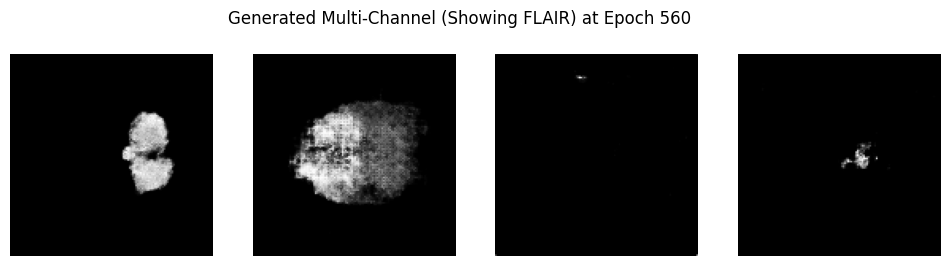

Epoch 561/1000
  Discriminator Loss: -38.0565 | Generator Loss: 1.8674 | D Accuracy: 0.8620
Epoch 562/1000
  Discriminator Loss: -43.4937 | Generator Loss: 12.3258 | D Accuracy: 0.8542
Epoch 563/1000
  Discriminator Loss: -47.1240 | Generator Loss: 17.9491 | D Accuracy: 0.8568
Epoch 564/1000
  Discriminator Loss: -40.0954 | Generator Loss: 14.6196 | D Accuracy: 0.8750
Epoch 565/1000
  Discriminator Loss: -49.1585 | Generator Loss: 18.0859 | D Accuracy: 0.8542
Epoch 566/1000
  Discriminator Loss: -40.7382 | Generator Loss: 18.0414 | D Accuracy: 0.8594
Epoch 567/1000
  Discriminator Loss: -42.3729 | Generator Loss: 5.1992 | D Accuracy: 0.8724
Epoch 568/1000
  Discriminator Loss: -46.3027 | Generator Loss: 11.1127 | D Accuracy: 0.8568
Epoch 569/1000
  Discriminator Loss: -43.5577 | Generator Loss: 9.6088 | D Accuracy: 0.9010
Epoch 570/1000
  Discriminator Loss: -48.2223 | Generator Loss: 13.4328 | D Accuracy: 0.8490


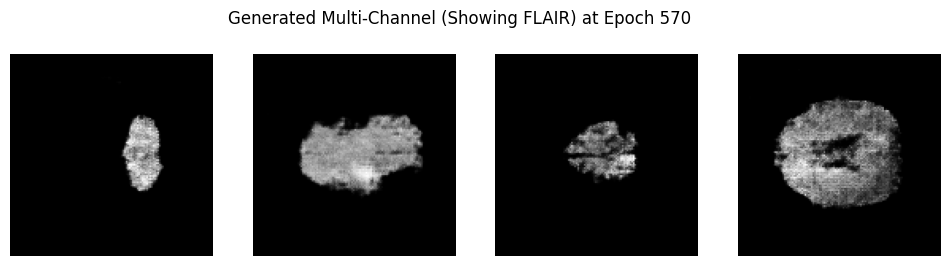

Epoch 571/1000
  Discriminator Loss: -50.3251 | Generator Loss: 10.2523 | D Accuracy: 0.8490
Epoch 572/1000
  Discriminator Loss: -39.2746 | Generator Loss: 17.6755 | D Accuracy: 0.8750
Epoch 573/1000
  Discriminator Loss: -46.5477 | Generator Loss: 17.0290 | D Accuracy: 0.8750
Epoch 574/1000
  Discriminator Loss: -45.6503 | Generator Loss: 17.7214 | D Accuracy: 0.8802
Epoch 575/1000
  Discriminator Loss: -48.9762 | Generator Loss: 20.1121 | D Accuracy: 0.8438
Epoch 576/1000
  Discriminator Loss: -40.0908 | Generator Loss: 20.2779 | D Accuracy: 0.8802
Epoch 577/1000
  Discriminator Loss: -50.9208 | Generator Loss: 14.8908 | D Accuracy: 0.8464
Epoch 578/1000
  Discriminator Loss: -40.5740 | Generator Loss: 15.8623 | D Accuracy: 0.8698
Epoch 579/1000
  Discriminator Loss: -44.7755 | Generator Loss: 25.2077 | D Accuracy: 0.8464
Epoch 580/1000
  Discriminator Loss: -42.8573 | Generator Loss: 22.4464 | D Accuracy: 0.8828


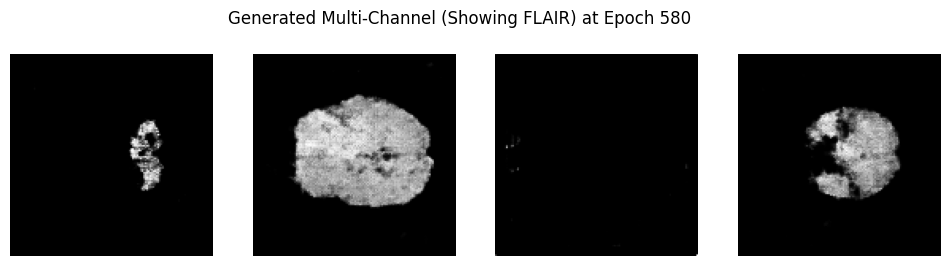

Epoch 581/1000
  Discriminator Loss: -45.1846 | Generator Loss: 16.4027 | D Accuracy: 0.8776
Epoch 582/1000
  Discriminator Loss: -44.7013 | Generator Loss: 20.4471 | D Accuracy: 0.7891
Epoch 583/1000
  Discriminator Loss: -42.8223 | Generator Loss: 26.9697 | D Accuracy: 0.9167
Epoch 584/1000
  Discriminator Loss: -44.4709 | Generator Loss: 29.1091 | D Accuracy: 0.8750
Epoch 585/1000
  Discriminator Loss: -49.4326 | Generator Loss: 22.0925 | D Accuracy: 0.8776
Epoch 586/1000
  Discriminator Loss: -42.3684 | Generator Loss: 18.9932 | D Accuracy: 0.8698
Epoch 587/1000
  Discriminator Loss: -44.9747 | Generator Loss: 20.8435 | D Accuracy: 0.8490
Epoch 588/1000
  Discriminator Loss: -45.3342 | Generator Loss: 20.9371 | D Accuracy: 0.9297
Epoch 589/1000
  Discriminator Loss: -44.2458 | Generator Loss: 22.9144 | D Accuracy: 0.8255
Epoch 590/1000
  Discriminator Loss: -42.3694 | Generator Loss: 25.1912 | D Accuracy: 0.8568


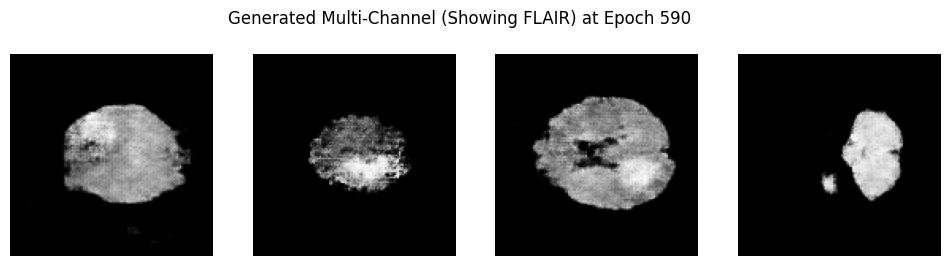

Epoch 591/1000
  Discriminator Loss: -46.9172 | Generator Loss: 24.4027 | D Accuracy: 0.8672
Epoch 592/1000
  Discriminator Loss: -50.2360 | Generator Loss: 30.9700 | D Accuracy: 0.8490
Epoch 593/1000
  Discriminator Loss: -43.9897 | Generator Loss: 29.1464 | D Accuracy: 0.8542
Epoch 594/1000
  Discriminator Loss: -47.6968 | Generator Loss: 22.9535 | D Accuracy: 0.8307
Epoch 595/1000
  Discriminator Loss: -44.8804 | Generator Loss: 25.5155 | D Accuracy: 0.8490
Epoch 596/1000
  Discriminator Loss: -42.9644 | Generator Loss: 18.5650 | D Accuracy: 0.8594
Epoch 597/1000
  Discriminator Loss: -42.9628 | Generator Loss: 12.5115 | D Accuracy: 0.8828
Epoch 598/1000
  Discriminator Loss: -45.0755 | Generator Loss: 19.9737 | D Accuracy: 0.8906
Epoch 599/1000
  Discriminator Loss: -40.8627 | Generator Loss: 26.7008 | D Accuracy: 0.8750
Epoch 600/1000
  Discriminator Loss: -45.6191 | Generator Loss: 20.9726 | D Accuracy: 0.9036


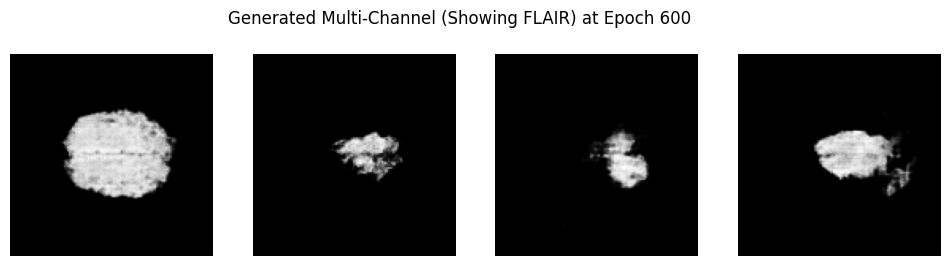

Epoch 601/1000
  Discriminator Loss: -47.8985 | Generator Loss: 23.0279 | D Accuracy: 0.9062
Epoch 602/1000
  Discriminator Loss: -40.3683 | Generator Loss: 20.9593 | D Accuracy: 0.9141
Epoch 603/1000
  Discriminator Loss: -46.4173 | Generator Loss: 20.5796 | D Accuracy: 0.8854
Epoch 604/1000
  Discriminator Loss: -46.3813 | Generator Loss: 25.1973 | D Accuracy: 0.8802
Epoch 605/1000
  Discriminator Loss: -43.2804 | Generator Loss: 20.8816 | D Accuracy: 0.8906
Epoch 606/1000
  Discriminator Loss: -46.8783 | Generator Loss: 22.6758 | D Accuracy: 0.8724
Epoch 607/1000
  Discriminator Loss: -47.2653 | Generator Loss: 28.0237 | D Accuracy: 0.8672
Epoch 608/1000
  Discriminator Loss: -45.0681 | Generator Loss: 16.6435 | D Accuracy: 0.8750
Epoch 609/1000
  Discriminator Loss: -47.4419 | Generator Loss: 23.3714 | D Accuracy: 0.8854
Epoch 610/1000
  Discriminator Loss: -50.0370 | Generator Loss: 20.2136 | D Accuracy: 0.9089


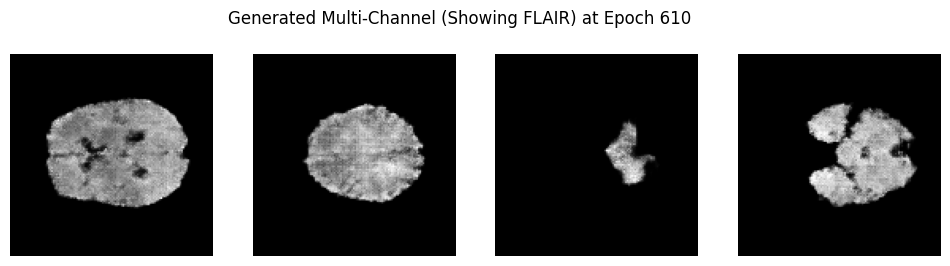

Epoch 611/1000
  Discriminator Loss: -46.1982 | Generator Loss: 23.5947 | D Accuracy: 0.9010
Epoch 612/1000
  Discriminator Loss: -48.0434 | Generator Loss: 24.2264 | D Accuracy: 0.9062
Epoch 613/1000
  Discriminator Loss: -46.4177 | Generator Loss: 34.1500 | D Accuracy: 0.8620
Epoch 614/1000
  Discriminator Loss: -46.7178 | Generator Loss: 30.1691 | D Accuracy: 0.8568
Epoch 615/1000
  Discriminator Loss: -47.2625 | Generator Loss: 24.7166 | D Accuracy: 0.8724
Epoch 616/1000
  Discriminator Loss: -46.2787 | Generator Loss: 17.9811 | D Accuracy: 0.8776
Epoch 617/1000
  Discriminator Loss: -43.9361 | Generator Loss: 21.9480 | D Accuracy: 0.8438
Epoch 618/1000
  Discriminator Loss: -49.9339 | Generator Loss: 20.6947 | D Accuracy: 0.8542
Epoch 619/1000
  Discriminator Loss: -52.2827 | Generator Loss: 28.8455 | D Accuracy: 0.8516
Epoch 620/1000
  Discriminator Loss: -51.4659 | Generator Loss: 27.0150 | D Accuracy: 0.8359


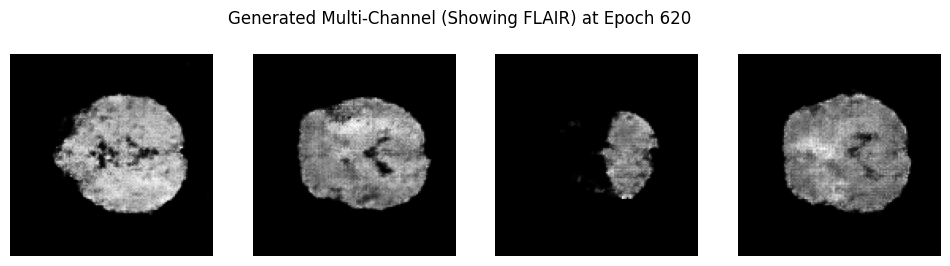

Epoch 621/1000
  Discriminator Loss: -46.6526 | Generator Loss: 26.4283 | D Accuracy: 0.8854
Epoch 622/1000
  Discriminator Loss: -44.9719 | Generator Loss: 20.6377 | D Accuracy: 0.8854
Epoch 623/1000
  Discriminator Loss: -46.8924 | Generator Loss: 29.7896 | D Accuracy: 0.8724
Epoch 624/1000
  Discriminator Loss: -45.1413 | Generator Loss: 22.0022 | D Accuracy: 0.8932
Epoch 625/1000
  Discriminator Loss: -45.7124 | Generator Loss: 15.4906 | D Accuracy: 0.9089
Epoch 626/1000
  Discriminator Loss: -45.3370 | Generator Loss: 15.9280 | D Accuracy: 0.8906
Epoch 627/1000
  Discriminator Loss: -47.0264 | Generator Loss: 15.2172 | D Accuracy: 0.9062
Epoch 628/1000
  Discriminator Loss: -47.2652 | Generator Loss: 15.8064 | D Accuracy: 0.8854
Epoch 629/1000
  Discriminator Loss: -50.7609 | Generator Loss: 18.7941 | D Accuracy: 0.8828
Epoch 630/1000
  Discriminator Loss: -44.8924 | Generator Loss: 24.7254 | D Accuracy: 0.8672


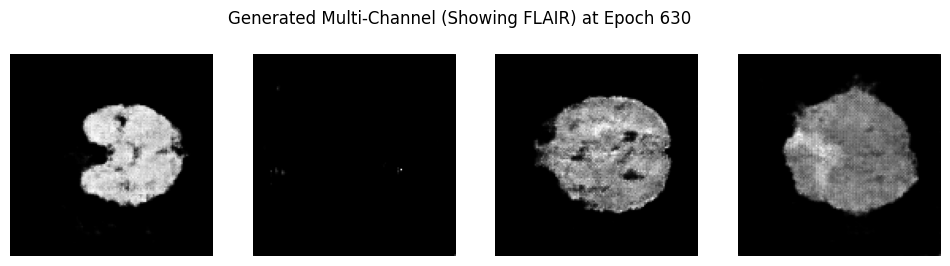

Epoch 631/1000
  Discriminator Loss: -45.0198 | Generator Loss: 18.8513 | D Accuracy: 0.9036
Epoch 632/1000
  Discriminator Loss: -42.1274 | Generator Loss: 21.9739 | D Accuracy: 0.8620
Epoch 633/1000
  Discriminator Loss: -44.3229 | Generator Loss: 18.2088 | D Accuracy: 0.9089
Epoch 634/1000
  Discriminator Loss: -51.2582 | Generator Loss: 26.2002 | D Accuracy: 0.8542
Epoch 635/1000
  Discriminator Loss: -47.8324 | Generator Loss: 14.9276 | D Accuracy: 0.8724
Epoch 636/1000
  Discriminator Loss: -46.3498 | Generator Loss: 20.6387 | D Accuracy: 0.8750
Epoch 637/1000
  Discriminator Loss: -46.7327 | Generator Loss: 22.6633 | D Accuracy: 0.8646
Epoch 638/1000
  Discriminator Loss: -47.1772 | Generator Loss: 17.4748 | D Accuracy: 0.8880
Epoch 639/1000
  Discriminator Loss: -51.7878 | Generator Loss: 28.1379 | D Accuracy: 0.8568
Epoch 640/1000
  Discriminator Loss: -47.2810 | Generator Loss: 21.6462 | D Accuracy: 0.8958


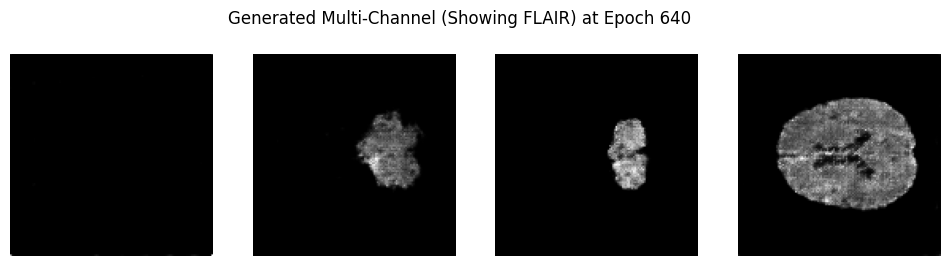

Epoch 641/1000
  Discriminator Loss: -45.4215 | Generator Loss: 30.3088 | D Accuracy: 0.8594
Epoch 642/1000
  Discriminator Loss: -48.8234 | Generator Loss: 21.7531 | D Accuracy: 0.8984
Epoch 643/1000
  Discriminator Loss: -48.8104 | Generator Loss: 26.5887 | D Accuracy: 0.8750
Epoch 644/1000
  Discriminator Loss: -51.3157 | Generator Loss: 28.6124 | D Accuracy: 0.9193
Epoch 645/1000
  Discriminator Loss: -47.9537 | Generator Loss: 25.8614 | D Accuracy: 0.8776
Epoch 646/1000
  Discriminator Loss: -42.6063 | Generator Loss: 19.7815 | D Accuracy: 0.8932
Epoch 647/1000
  Discriminator Loss: -47.8346 | Generator Loss: 20.0868 | D Accuracy: 0.9245
Epoch 648/1000
  Discriminator Loss: -47.0140 | Generator Loss: 15.0115 | D Accuracy: 0.8932
Epoch 649/1000
  Discriminator Loss: -47.0045 | Generator Loss: 19.1897 | D Accuracy: 0.8880
Epoch 650/1000
  Discriminator Loss: -47.9210 | Generator Loss: 28.2563 | D Accuracy: 0.8828


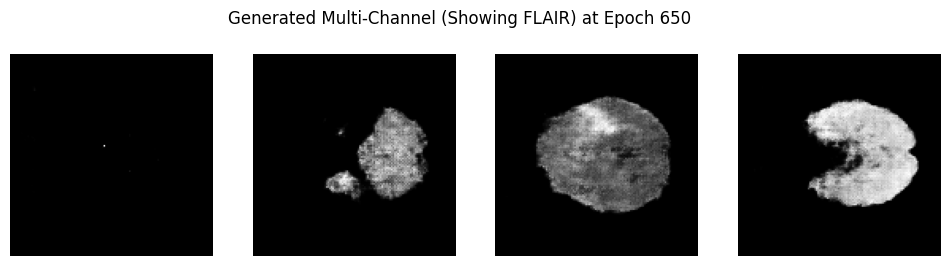

Epoch 651/1000
  Discriminator Loss: -46.2000 | Generator Loss: 20.9984 | D Accuracy: 0.8880
Epoch 652/1000
  Discriminator Loss: -50.5289 | Generator Loss: 23.2130 | D Accuracy: 0.8594
Epoch 653/1000
  Discriminator Loss: -51.1220 | Generator Loss: 30.6629 | D Accuracy: 0.8750
Epoch 654/1000
  Discriminator Loss: -48.7759 | Generator Loss: 41.7658 | D Accuracy: 0.8776
Epoch 655/1000
  Discriminator Loss: -52.4392 | Generator Loss: 29.0181 | D Accuracy: 0.8646
Epoch 656/1000
  Discriminator Loss: -49.3892 | Generator Loss: 29.2691 | D Accuracy: 0.8385
Epoch 657/1000
  Discriminator Loss: -53.2961 | Generator Loss: 37.5640 | D Accuracy: 0.8542
Epoch 658/1000
  Discriminator Loss: -44.8825 | Generator Loss: 32.5338 | D Accuracy: 0.9062
Epoch 659/1000
  Discriminator Loss: -49.9964 | Generator Loss: 30.8244 | D Accuracy: 0.8932
Epoch 660/1000
  Discriminator Loss: -47.0391 | Generator Loss: 27.9276 | D Accuracy: 0.8724


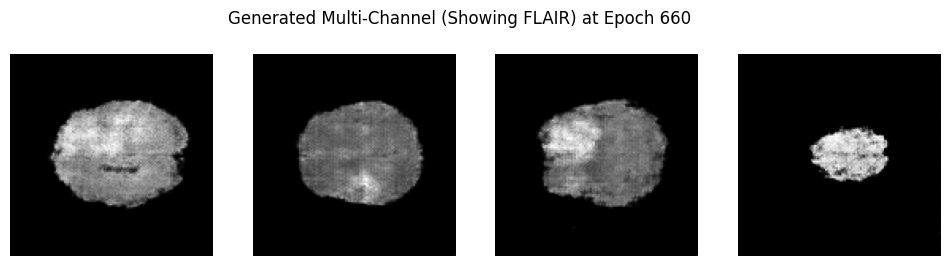

Epoch 661/1000
  Discriminator Loss: -51.1304 | Generator Loss: 26.8234 | D Accuracy: 0.9010
Epoch 662/1000
  Discriminator Loss: -48.3442 | Generator Loss: 28.0507 | D Accuracy: 0.8932
Epoch 663/1000
  Discriminator Loss: -53.1087 | Generator Loss: 25.8445 | D Accuracy: 0.8464
Epoch 664/1000
  Discriminator Loss: -47.0614 | Generator Loss: 42.4252 | D Accuracy: 0.8646
Epoch 665/1000
  Discriminator Loss: -50.7819 | Generator Loss: 42.7205 | D Accuracy: 0.8359
Epoch 666/1000
  Discriminator Loss: -50.0890 | Generator Loss: 30.5889 | D Accuracy: 0.8854
Epoch 667/1000
  Discriminator Loss: -50.4452 | Generator Loss: 27.4769 | D Accuracy: 0.8828
Epoch 668/1000
  Discriminator Loss: -56.3942 | Generator Loss: 36.0001 | D Accuracy: 0.8698
Epoch 669/1000
  Discriminator Loss: -42.7545 | Generator Loss: 28.7534 | D Accuracy: 0.9036
Epoch 670/1000
  Discriminator Loss: -44.3639 | Generator Loss: 32.4207 | D Accuracy: 0.8698


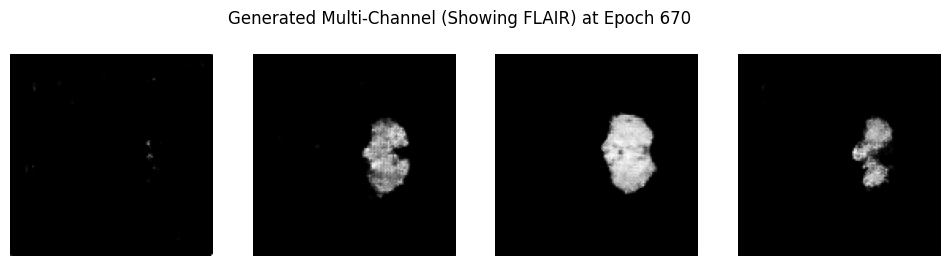

Epoch 671/1000
  Discriminator Loss: -49.7133 | Generator Loss: 19.4790 | D Accuracy: 0.8880
Epoch 672/1000
  Discriminator Loss: -58.0682 | Generator Loss: 45.5459 | D Accuracy: 0.8750
Epoch 673/1000
  Discriminator Loss: -48.6613 | Generator Loss: 36.5084 | D Accuracy: 0.8411
Epoch 674/1000
  Discriminator Loss: -51.7356 | Generator Loss: 31.7741 | D Accuracy: 0.8672
Epoch 675/1000
  Discriminator Loss: -45.2875 | Generator Loss: 24.9256 | D Accuracy: 0.9062
Epoch 676/1000
  Discriminator Loss: -55.5600 | Generator Loss: 26.8994 | D Accuracy: 0.8594
Epoch 677/1000
  Discriminator Loss: -46.3193 | Generator Loss: 32.9669 | D Accuracy: 0.8828
Epoch 678/1000
  Discriminator Loss: -51.7974 | Generator Loss: 32.5568 | D Accuracy: 0.8984
Epoch 679/1000
  Discriminator Loss: -46.9069 | Generator Loss: 40.2327 | D Accuracy: 0.8984
Epoch 680/1000
  Discriminator Loss: -45.6594 | Generator Loss: 39.4655 | D Accuracy: 0.8932


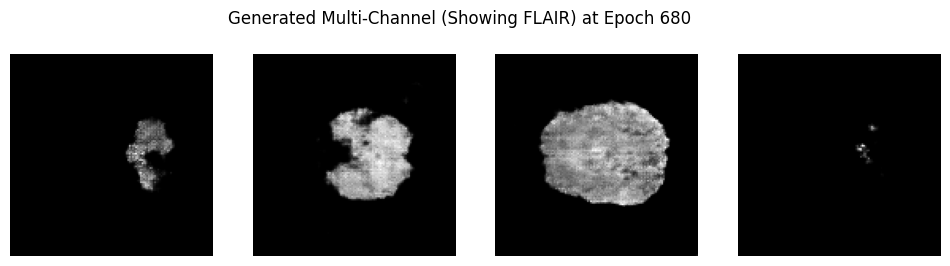

Epoch 681/1000
  Discriminator Loss: -52.0673 | Generator Loss: 30.8698 | D Accuracy: 0.8776
Epoch 682/1000
  Discriminator Loss: -49.5569 | Generator Loss: 31.7456 | D Accuracy: 0.8672
Epoch 683/1000
  Discriminator Loss: -48.7523 | Generator Loss: 32.3840 | D Accuracy: 0.8932
Epoch 684/1000
  Discriminator Loss: -47.5514 | Generator Loss: 25.3630 | D Accuracy: 0.9036
Epoch 685/1000
  Discriminator Loss: -47.2378 | Generator Loss: 23.8251 | D Accuracy: 0.8906
Epoch 686/1000
  Discriminator Loss: -50.8241 | Generator Loss: 28.6786 | D Accuracy: 0.9219
Epoch 687/1000
  Discriminator Loss: -51.1701 | Generator Loss: 33.5491 | D Accuracy: 0.9062
Epoch 688/1000
  Discriminator Loss: -53.3586 | Generator Loss: 34.0849 | D Accuracy: 0.9062
Epoch 689/1000
  Discriminator Loss: -44.8631 | Generator Loss: 31.6461 | D Accuracy: 0.9036
Epoch 690/1000
  Discriminator Loss: -53.8299 | Generator Loss: 33.9677 | D Accuracy: 0.8854


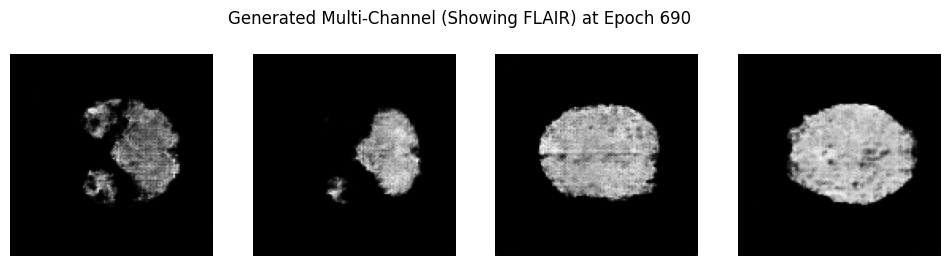

Epoch 691/1000
  Discriminator Loss: -54.3108 | Generator Loss: 39.5920 | D Accuracy: 0.8724
Epoch 692/1000
  Discriminator Loss: -52.8678 | Generator Loss: 34.6123 | D Accuracy: 0.8646
Epoch 693/1000
  Discriminator Loss: -55.5486 | Generator Loss: 33.3394 | D Accuracy: 0.8672
Epoch 694/1000
  Discriminator Loss: -51.9400 | Generator Loss: 34.2071 | D Accuracy: 0.9089
Epoch 695/1000
  Discriminator Loss: -53.6243 | Generator Loss: 39.6397 | D Accuracy: 0.8698
Epoch 696/1000
  Discriminator Loss: -47.2201 | Generator Loss: 32.4877 | D Accuracy: 0.8750
Epoch 697/1000
  Discriminator Loss: -46.8514 | Generator Loss: 36.9983 | D Accuracy: 0.8984
Epoch 698/1000
  Discriminator Loss: -56.7764 | Generator Loss: 39.1292 | D Accuracy: 0.9375
Epoch 699/1000
  Discriminator Loss: -54.9042 | Generator Loss: 33.1429 | D Accuracy: 0.8724
Epoch 700/1000
  Discriminator Loss: -47.7387 | Generator Loss: 37.2422 | D Accuracy: 0.9141


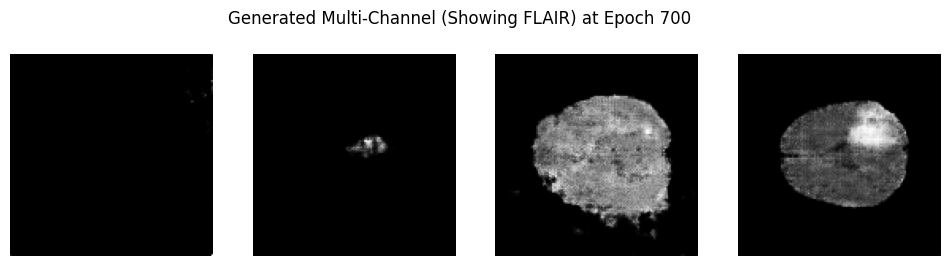

Epoch 701/1000
  Discriminator Loss: -44.2364 | Generator Loss: 34.3375 | D Accuracy: 0.8698
Epoch 702/1000
  Discriminator Loss: -50.6327 | Generator Loss: 36.1363 | D Accuracy: 0.9089
Epoch 703/1000
  Discriminator Loss: -51.9301 | Generator Loss: 27.9726 | D Accuracy: 0.9167
Epoch 704/1000
  Discriminator Loss: -54.0340 | Generator Loss: 39.4755 | D Accuracy: 0.8724
Epoch 705/1000
  Discriminator Loss: -50.6521 | Generator Loss: 38.9502 | D Accuracy: 0.8776
Epoch 706/1000
  Discriminator Loss: -50.2558 | Generator Loss: 38.8601 | D Accuracy: 0.8620
Epoch 707/1000
  Discriminator Loss: -53.8151 | Generator Loss: 39.5374 | D Accuracy: 0.8828
Epoch 708/1000
  Discriminator Loss: -53.1150 | Generator Loss: 46.1887 | D Accuracy: 0.8828
Epoch 709/1000
  Discriminator Loss: -51.2423 | Generator Loss: 27.7324 | D Accuracy: 0.9141
Epoch 710/1000
  Discriminator Loss: -45.4232 | Generator Loss: 27.2424 | D Accuracy: 0.9089


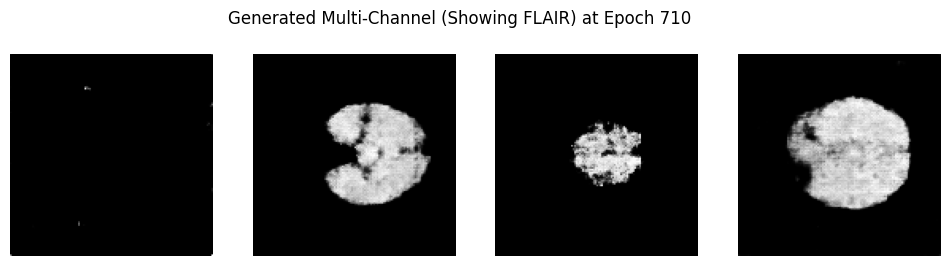

Epoch 711/1000
  Discriminator Loss: -56.2555 | Generator Loss: 41.2142 | D Accuracy: 0.9036
Epoch 712/1000
  Discriminator Loss: -47.8963 | Generator Loss: 29.8466 | D Accuracy: 0.8724
Epoch 713/1000
  Discriminator Loss: -59.1990 | Generator Loss: 48.8384 | D Accuracy: 0.9245
Epoch 714/1000
  Discriminator Loss: -56.8157 | Generator Loss: 41.4446 | D Accuracy: 0.8724
Epoch 715/1000
  Discriminator Loss: -48.1174 | Generator Loss: 32.4894 | D Accuracy: 0.9010
Epoch 716/1000
  Discriminator Loss: -48.7930 | Generator Loss: 35.5933 | D Accuracy: 0.8984
Epoch 717/1000
  Discriminator Loss: -58.5197 | Generator Loss: 50.2443 | D Accuracy: 0.8984
Epoch 718/1000
  Discriminator Loss: -53.0989 | Generator Loss: 41.9080 | D Accuracy: 0.8828
Epoch 719/1000
  Discriminator Loss: -51.1502 | Generator Loss: 39.1594 | D Accuracy: 0.8776
Epoch 720/1000
  Discriminator Loss: -55.7689 | Generator Loss: 55.4542 | D Accuracy: 0.9062


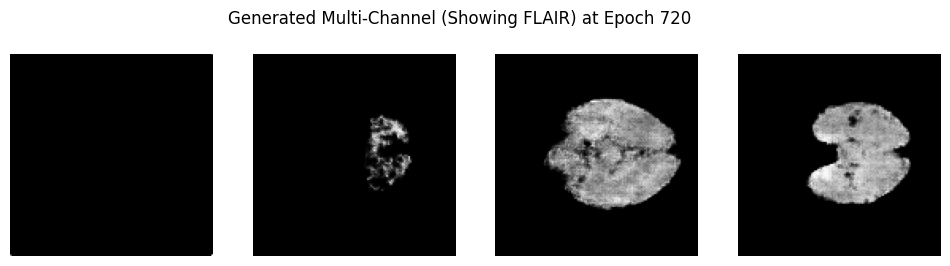

Epoch 721/1000
  Discriminator Loss: -54.1442 | Generator Loss: 49.2708 | D Accuracy: 0.8776
Epoch 722/1000
  Discriminator Loss: -58.0348 | Generator Loss: 49.9840 | D Accuracy: 0.8620
Epoch 723/1000
  Discriminator Loss: -51.1987 | Generator Loss: 49.9033 | D Accuracy: 0.8698
Epoch 724/1000
  Discriminator Loss: -50.7171 | Generator Loss: 34.3801 | D Accuracy: 0.9297
Epoch 725/1000
  Discriminator Loss: -59.1398 | Generator Loss: 39.1190 | D Accuracy: 0.9062
Epoch 726/1000
  Discriminator Loss: -50.8054 | Generator Loss: 39.0137 | D Accuracy: 0.8958
Epoch 727/1000
  Discriminator Loss: -53.0362 | Generator Loss: 51.5812 | D Accuracy: 0.8750
Epoch 728/1000
  Discriminator Loss: -54.9055 | Generator Loss: 40.0058 | D Accuracy: 0.8984
Epoch 729/1000
  Discriminator Loss: -53.1038 | Generator Loss: 43.6651 | D Accuracy: 0.8906
Epoch 730/1000
  Discriminator Loss: -55.1972 | Generator Loss: 38.7306 | D Accuracy: 0.9036


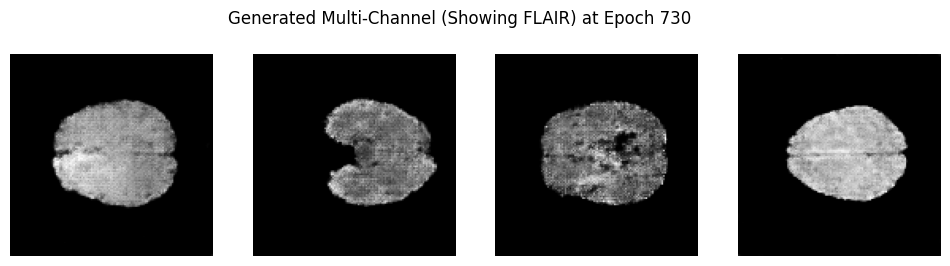

Epoch 731/1000
  Discriminator Loss: -53.7364 | Generator Loss: 47.1735 | D Accuracy: 0.8828
Epoch 732/1000
  Discriminator Loss: -54.7271 | Generator Loss: 31.6369 | D Accuracy: 0.9062
Epoch 733/1000
  Discriminator Loss: -54.3923 | Generator Loss: 36.6822 | D Accuracy: 0.8984
Epoch 734/1000
  Discriminator Loss: -52.0053 | Generator Loss: 42.7376 | D Accuracy: 0.9010
Epoch 735/1000
  Discriminator Loss: -61.6703 | Generator Loss: 32.9809 | D Accuracy: 0.9062
Epoch 736/1000
  Discriminator Loss: -48.1720 | Generator Loss: 40.0420 | D Accuracy: 0.8880
Epoch 737/1000
  Discriminator Loss: -53.8345 | Generator Loss: 39.8090 | D Accuracy: 0.8906
Epoch 738/1000
  Discriminator Loss: -52.7601 | Generator Loss: 44.3639 | D Accuracy: 0.9089
Epoch 739/1000
  Discriminator Loss: -56.0959 | Generator Loss: 40.5431 | D Accuracy: 0.9062
Epoch 740/1000
  Discriminator Loss: -60.1453 | Generator Loss: 29.2863 | D Accuracy: 0.8906


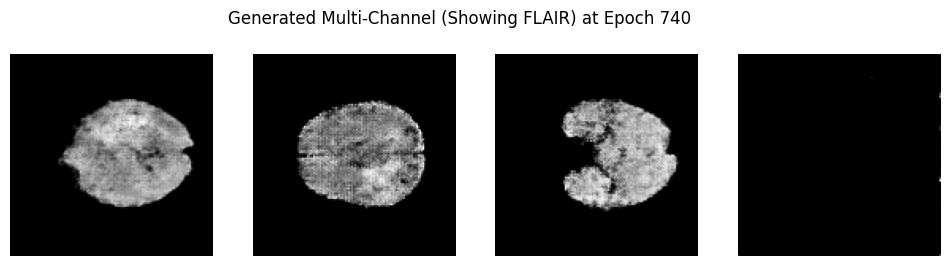

Epoch 741/1000
  Discriminator Loss: -53.9582 | Generator Loss: 37.2407 | D Accuracy: 0.9089
Epoch 742/1000
  Discriminator Loss: -49.4813 | Generator Loss: 35.9381 | D Accuracy: 0.9193
Epoch 743/1000
  Discriminator Loss: -44.4695 | Generator Loss: 35.5341 | D Accuracy: 0.9010
Epoch 744/1000
  Discriminator Loss: -52.1118 | Generator Loss: 36.7028 | D Accuracy: 0.8776
Epoch 745/1000
  Discriminator Loss: -52.1986 | Generator Loss: 41.1455 | D Accuracy: 0.8854
Epoch 746/1000
  Discriminator Loss: -60.1065 | Generator Loss: 37.6114 | D Accuracy: 0.8802
Epoch 747/1000
  Discriminator Loss: -53.4767 | Generator Loss: 34.3738 | D Accuracy: 0.8906
Epoch 748/1000
  Discriminator Loss: -53.3612 | Generator Loss: 41.2324 | D Accuracy: 0.8932
Epoch 749/1000
  Discriminator Loss: -63.1306 | Generator Loss: 47.0668 | D Accuracy: 0.8958
Epoch 750/1000
  Discriminator Loss: -58.3064 | Generator Loss: 38.3918 | D Accuracy: 0.8724


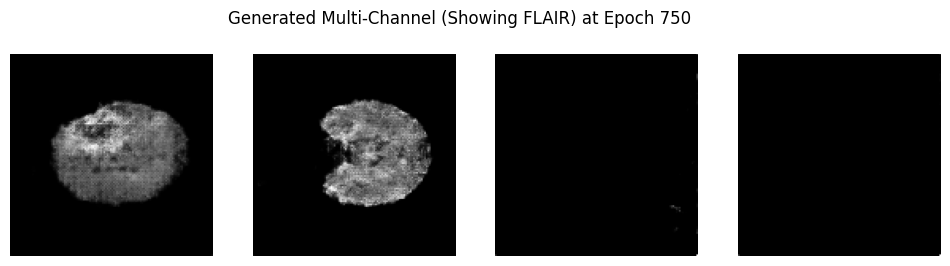

Epoch 751/1000
  Discriminator Loss: -55.3678 | Generator Loss: 39.5177 | D Accuracy: 0.8802
Epoch 752/1000
  Discriminator Loss: -55.0934 | Generator Loss: 41.5495 | D Accuracy: 0.8932
Epoch 753/1000
  Discriminator Loss: -57.8601 | Generator Loss: 44.2068 | D Accuracy: 0.8568
Epoch 754/1000
  Discriminator Loss: -55.5446 | Generator Loss: 35.7561 | D Accuracy: 0.9375
Epoch 755/1000
  Discriminator Loss: -59.9014 | Generator Loss: 51.1900 | D Accuracy: 0.8854
Epoch 756/1000
  Discriminator Loss: -55.6080 | Generator Loss: 51.0367 | D Accuracy: 0.9036
Epoch 757/1000
  Discriminator Loss: -55.7140 | Generator Loss: 36.0242 | D Accuracy: 0.8828
Epoch 758/1000
  Discriminator Loss: -52.7990 | Generator Loss: 37.9396 | D Accuracy: 0.8698
Epoch 759/1000
  Discriminator Loss: -54.4959 | Generator Loss: 38.3240 | D Accuracy: 0.9115
Epoch 760/1000
  Discriminator Loss: -57.8842 | Generator Loss: 35.0393 | D Accuracy: 0.9010


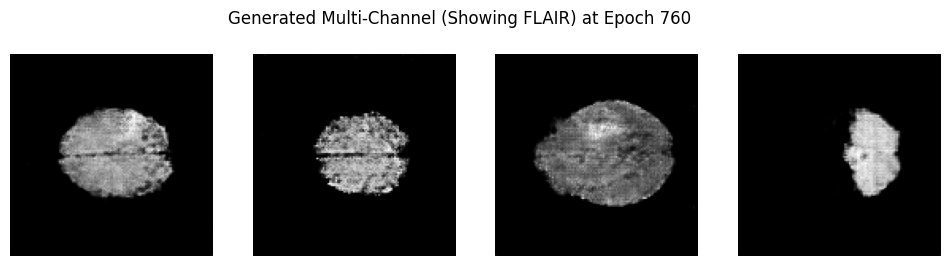

Epoch 761/1000
  Discriminator Loss: -54.2487 | Generator Loss: 40.4944 | D Accuracy: 0.9036
Epoch 762/1000
  Discriminator Loss: -49.8672 | Generator Loss: 49.5610 | D Accuracy: 0.9089
Epoch 763/1000
  Discriminator Loss: -55.4202 | Generator Loss: 35.1888 | D Accuracy: 0.8854
Epoch 764/1000
  Discriminator Loss: -53.8968 | Generator Loss: 37.5452 | D Accuracy: 0.9010
Epoch 765/1000
  Discriminator Loss: -55.7202 | Generator Loss: 39.5406 | D Accuracy: 0.8750
Epoch 766/1000
  Discriminator Loss: -53.0920 | Generator Loss: 39.7499 | D Accuracy: 0.8854
Epoch 767/1000
  Discriminator Loss: -57.6263 | Generator Loss: 45.4259 | D Accuracy: 0.9036
Epoch 768/1000
  Discriminator Loss: -50.7334 | Generator Loss: 35.5519 | D Accuracy: 0.9062
Epoch 769/1000
  Discriminator Loss: -57.3403 | Generator Loss: 35.5201 | D Accuracy: 0.9219
Epoch 770/1000
  Discriminator Loss: -36.7950 | Generator Loss: 34.0337 | D Accuracy: 0.9219


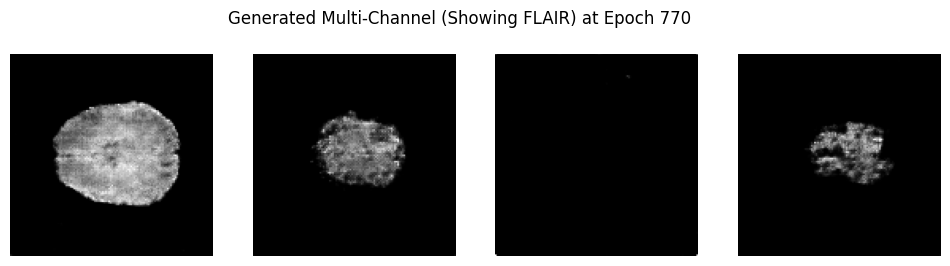

Epoch 771/1000
  Discriminator Loss: -52.6631 | Generator Loss: 39.6630 | D Accuracy: 0.9036
Epoch 772/1000
  Discriminator Loss: -64.2347 | Generator Loss: 37.5784 | D Accuracy: 0.9141
Epoch 773/1000
  Discriminator Loss: -60.2975 | Generator Loss: 41.9813 | D Accuracy: 0.8672
Epoch 774/1000
  Discriminator Loss: -55.8911 | Generator Loss: 37.1434 | D Accuracy: 0.8828
Epoch 775/1000
  Discriminator Loss: -53.3630 | Generator Loss: 41.5674 | D Accuracy: 0.8958
Epoch 776/1000
  Discriminator Loss: -55.9751 | Generator Loss: 39.9159 | D Accuracy: 0.9167
Epoch 777/1000
  Discriminator Loss: -56.9952 | Generator Loss: 41.3774 | D Accuracy: 0.9219
Epoch 778/1000
  Discriminator Loss: -55.4570 | Generator Loss: 37.1709 | D Accuracy: 0.8698
Epoch 779/1000
  Discriminator Loss: -57.8981 | Generator Loss: 38.2854 | D Accuracy: 0.9193
Epoch 780/1000
  Discriminator Loss: -54.4229 | Generator Loss: 38.4746 | D Accuracy: 0.9167


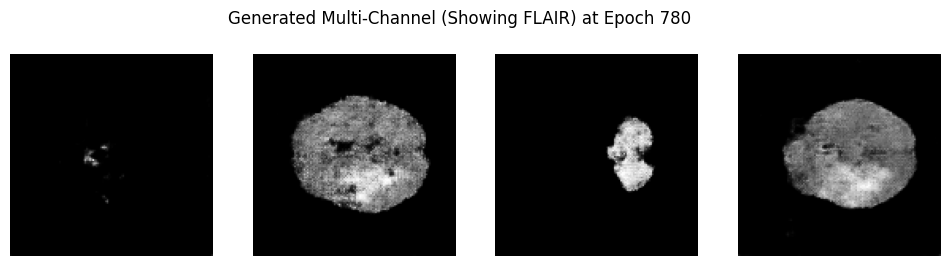

Epoch 781/1000
  Discriminator Loss: -34.0435 | Generator Loss: 38.3699 | D Accuracy: 0.9271
Epoch 782/1000
  Discriminator Loss: -68.8875 | Generator Loss: 43.0589 | D Accuracy: 0.8542
Epoch 783/1000
  Discriminator Loss: -51.7522 | Generator Loss: 36.1088 | D Accuracy: 0.8724
Epoch 784/1000
  Discriminator Loss: -59.6864 | Generator Loss: 34.5550 | D Accuracy: 0.9349
Epoch 785/1000
  Discriminator Loss: -56.3836 | Generator Loss: 36.0874 | D Accuracy: 0.8906
Epoch 786/1000
  Discriminator Loss: -61.2918 | Generator Loss: 47.0454 | D Accuracy: 0.8880
Epoch 787/1000
  Discriminator Loss: -52.3194 | Generator Loss: 38.5885 | D Accuracy: 0.9219
Epoch 788/1000
  Discriminator Loss: -58.2096 | Generator Loss: 38.1793 | D Accuracy: 0.9271
Epoch 789/1000
  Discriminator Loss: -57.6500 | Generator Loss: 39.7164 | D Accuracy: 0.8958
Epoch 790/1000
  Discriminator Loss: -55.2068 | Generator Loss: 49.9996 | D Accuracy: 0.8906


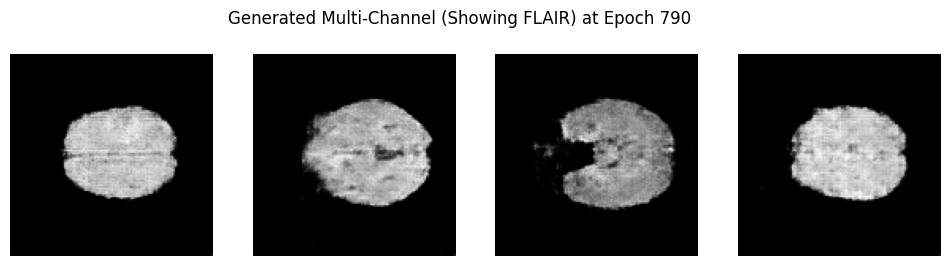

Epoch 791/1000
  Discriminator Loss: -51.0202 | Generator Loss: 32.9805 | D Accuracy: 0.9453
Epoch 792/1000
  Discriminator Loss: -56.8731 | Generator Loss: 34.5357 | D Accuracy: 0.9271
Epoch 793/1000
  Discriminator Loss: -55.6965 | Generator Loss: 37.3715 | D Accuracy: 0.8906
Epoch 794/1000
  Discriminator Loss: -52.3142 | Generator Loss: 43.1987 | D Accuracy: 0.8906
Epoch 795/1000
  Discriminator Loss: -61.6931 | Generator Loss: 41.5169 | D Accuracy: 0.8802
Epoch 796/1000
  Discriminator Loss: -59.0203 | Generator Loss: 45.7169 | D Accuracy: 0.8958
Epoch 797/1000
  Discriminator Loss: -55.7803 | Generator Loss: 37.1153 | D Accuracy: 0.9062
Epoch 798/1000
  Discriminator Loss: -56.2764 | Generator Loss: 29.3181 | D Accuracy: 0.9219
Epoch 799/1000
  Discriminator Loss: -52.1742 | Generator Loss: 30.4682 | D Accuracy: 0.9115
Epoch 800/1000
  Discriminator Loss: -59.6964 | Generator Loss: 37.7069 | D Accuracy: 0.9010


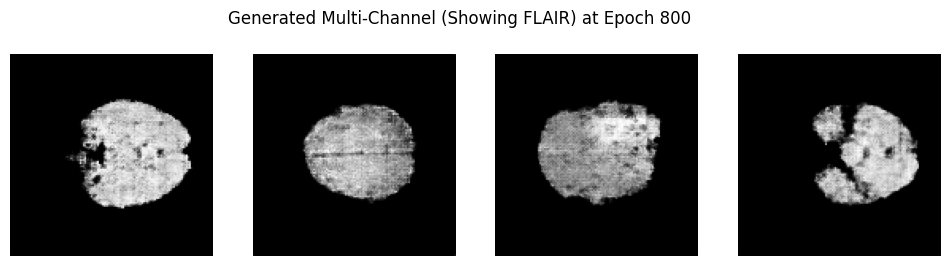

Epoch 801/1000
  Discriminator Loss: -50.8148 | Generator Loss: 32.3566 | D Accuracy: 0.9193
Epoch 802/1000
  Discriminator Loss: -59.6601 | Generator Loss: 39.3290 | D Accuracy: 0.8984
Epoch 803/1000
  Discriminator Loss: -56.2725 | Generator Loss: 40.1933 | D Accuracy: 0.9141
Epoch 804/1000
  Discriminator Loss: -61.3602 | Generator Loss: 46.7572 | D Accuracy: 0.8620
Epoch 805/1000
  Discriminator Loss: -54.4152 | Generator Loss: 49.6472 | D Accuracy: 0.8776
Epoch 806/1000
  Discriminator Loss: -54.1600 | Generator Loss: 49.3863 | D Accuracy: 0.8984
Epoch 807/1000
  Discriminator Loss: -60.0698 | Generator Loss: 50.5117 | D Accuracy: 0.9062
Epoch 808/1000
  Discriminator Loss: -57.8492 | Generator Loss: 52.7800 | D Accuracy: 0.9193
Epoch 809/1000
  Discriminator Loss: -54.7057 | Generator Loss: 45.1376 | D Accuracy: 0.9089
Epoch 810/1000
  Discriminator Loss: -56.7566 | Generator Loss: 48.5187 | D Accuracy: 0.8984


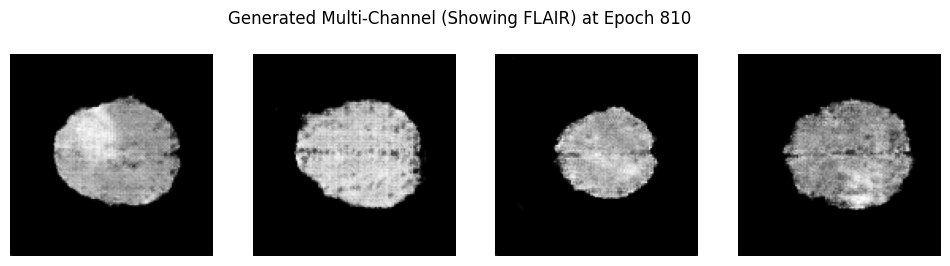

Epoch 811/1000
  Discriminator Loss: -57.3601 | Generator Loss: 46.5771 | D Accuracy: 0.9141
Epoch 812/1000
  Discriminator Loss: -58.6107 | Generator Loss: 43.1604 | D Accuracy: 0.8984
Epoch 813/1000
  Discriminator Loss: -48.4826 | Generator Loss: 55.6430 | D Accuracy: 0.8620
Epoch 814/1000
  Discriminator Loss: -57.3693 | Generator Loss: 43.8998 | D Accuracy: 0.9193
Epoch 815/1000
  Discriminator Loss: -58.2617 | Generator Loss: 49.8627 | D Accuracy: 0.9089
Epoch 816/1000
  Discriminator Loss: -57.9590 | Generator Loss: 49.2030 | D Accuracy: 0.8958
Epoch 817/1000
  Discriminator Loss: -55.1994 | Generator Loss: 49.6972 | D Accuracy: 0.8464
Epoch 818/1000
  Discriminator Loss: -58.0243 | Generator Loss: 47.5785 | D Accuracy: 0.9141
Epoch 819/1000
  Discriminator Loss: -58.0614 | Generator Loss: 47.5147 | D Accuracy: 0.9010
Epoch 820/1000
  Discriminator Loss: -56.0197 | Generator Loss: 45.0699 | D Accuracy: 0.8802


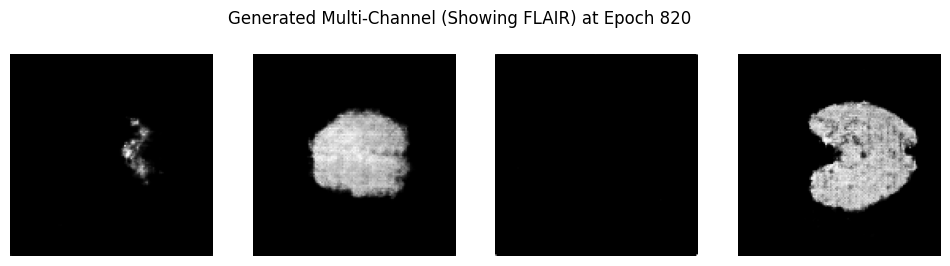

Epoch 821/1000
  Discriminator Loss: -53.5016 | Generator Loss: 40.9251 | D Accuracy: 0.8802
Epoch 822/1000
  Discriminator Loss: -53.2283 | Generator Loss: 37.1900 | D Accuracy: 0.9089
Epoch 823/1000
  Discriminator Loss: -57.9593 | Generator Loss: 38.0947 | D Accuracy: 0.9349
Epoch 824/1000
  Discriminator Loss: -58.5720 | Generator Loss: 40.1380 | D Accuracy: 0.9062
Epoch 825/1000
  Discriminator Loss: -61.8664 | Generator Loss: 44.2581 | D Accuracy: 0.8880
Epoch 826/1000
  Discriminator Loss: -56.5888 | Generator Loss: 46.6970 | D Accuracy: 0.8932
Epoch 827/1000
  Discriminator Loss: -59.8040 | Generator Loss: 53.6886 | D Accuracy: 0.9010
Epoch 828/1000
  Discriminator Loss: -55.1781 | Generator Loss: 51.0500 | D Accuracy: 0.8906
Epoch 829/1000
  Discriminator Loss: -54.6116 | Generator Loss: 46.0897 | D Accuracy: 0.8672
Epoch 830/1000
  Discriminator Loss: -62.2407 | Generator Loss: 40.5267 | D Accuracy: 0.9219


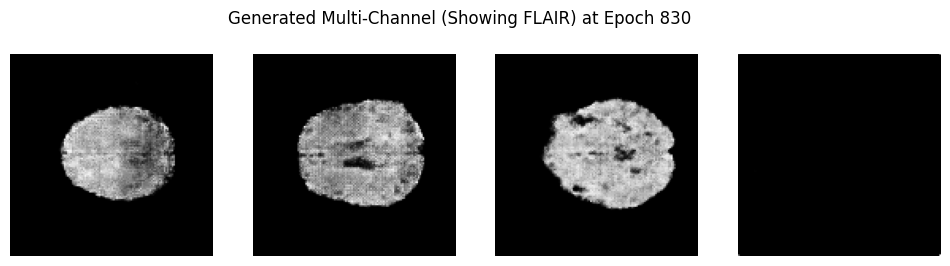

Epoch 831/1000
  Discriminator Loss: -57.4280 | Generator Loss: 48.2486 | D Accuracy: 0.9141
Epoch 832/1000
  Discriminator Loss: -60.4426 | Generator Loss: 42.8557 | D Accuracy: 0.9141
Epoch 833/1000
  Discriminator Loss: -50.4918 | Generator Loss: 38.3281 | D Accuracy: 0.9115
Epoch 834/1000
  Discriminator Loss: -52.6709 | Generator Loss: 40.6759 | D Accuracy: 0.9245
Epoch 835/1000
  Discriminator Loss: -56.6064 | Generator Loss: 47.2015 | D Accuracy: 0.9219
Epoch 836/1000
  Discriminator Loss: -57.1884 | Generator Loss: 48.0741 | D Accuracy: 0.9010
Epoch 837/1000
  Discriminator Loss: -56.5708 | Generator Loss: 52.5382 | D Accuracy: 0.8568
Epoch 838/1000
  Discriminator Loss: -53.8231 | Generator Loss: 52.4538 | D Accuracy: 0.9036
Epoch 839/1000
  Discriminator Loss: -56.6911 | Generator Loss: 47.1053 | D Accuracy: 0.8906
Epoch 840/1000
  Discriminator Loss: -59.1927 | Generator Loss: 49.5481 | D Accuracy: 0.9036


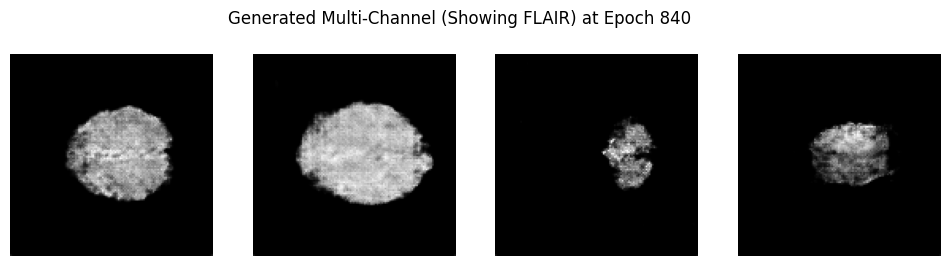

Epoch 841/1000
  Discriminator Loss: -61.7578 | Generator Loss: 44.0621 | D Accuracy: 0.8880
Epoch 842/1000
  Discriminator Loss: -59.9256 | Generator Loss: 44.2440 | D Accuracy: 0.8906
Epoch 843/1000
  Discriminator Loss: -59.5329 | Generator Loss: 36.9373 | D Accuracy: 0.9323
Epoch 844/1000
  Discriminator Loss: -58.0579 | Generator Loss: 53.6328 | D Accuracy: 0.9401
Epoch 845/1000
  Discriminator Loss: -57.8525 | Generator Loss: 49.2758 | D Accuracy: 0.8828
Epoch 846/1000
  Discriminator Loss: -58.5722 | Generator Loss: 47.8426 | D Accuracy: 0.8906
Epoch 847/1000
  Discriminator Loss: -64.7462 | Generator Loss: 46.7177 | D Accuracy: 0.8854
Epoch 848/1000
  Discriminator Loss: -59.6173 | Generator Loss: 49.3608 | D Accuracy: 0.8750
Epoch 849/1000
  Discriminator Loss: -64.9796 | Generator Loss: 52.0184 | D Accuracy: 0.9062
Epoch 850/1000
  Discriminator Loss: -53.7222 | Generator Loss: 47.8302 | D Accuracy: 0.8906


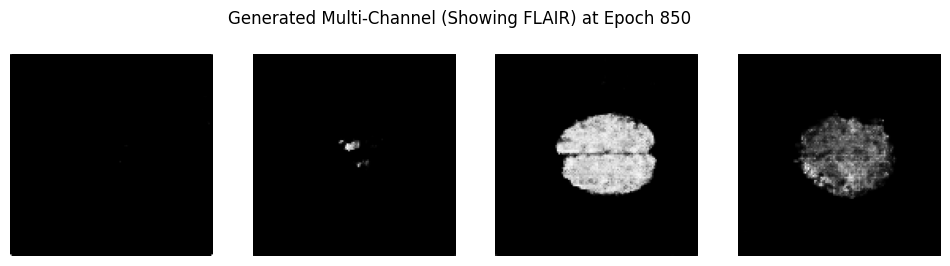

Epoch 851/1000
  Discriminator Loss: -58.1326 | Generator Loss: 39.8437 | D Accuracy: 0.9141
Epoch 852/1000
  Discriminator Loss: -54.6118 | Generator Loss: 34.3316 | D Accuracy: 0.9297
Epoch 853/1000
  Discriminator Loss: -63.0788 | Generator Loss: 47.3328 | D Accuracy: 0.9453
Epoch 854/1000
  Discriminator Loss: -58.4096 | Generator Loss: 42.4192 | D Accuracy: 0.9036
Epoch 855/1000
  Discriminator Loss: -52.7918 | Generator Loss: 40.8586 | D Accuracy: 0.9193
Epoch 856/1000
  Discriminator Loss: -54.8084 | Generator Loss: 42.5558 | D Accuracy: 0.9062
Epoch 857/1000
  Discriminator Loss: -56.5871 | Generator Loss: 53.8813 | D Accuracy: 0.9167
Epoch 858/1000
  Discriminator Loss: -56.3299 | Generator Loss: 42.6574 | D Accuracy: 0.9323
Epoch 859/1000
  Discriminator Loss: -62.0846 | Generator Loss: 50.6476 | D Accuracy: 0.9036
Epoch 860/1000
  Discriminator Loss: -55.8165 | Generator Loss: 53.4774 | D Accuracy: 0.9036


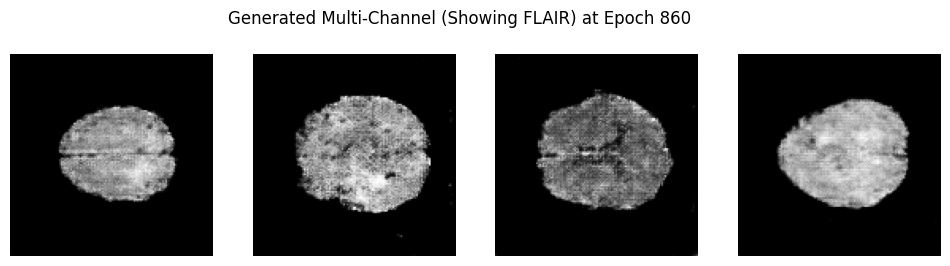

Epoch 861/1000
  Discriminator Loss: -60.3323 | Generator Loss: 48.9203 | D Accuracy: 0.9193
Epoch 862/1000
  Discriminator Loss: -60.5354 | Generator Loss: 44.4726 | D Accuracy: 0.9010
Epoch 863/1000
  Discriminator Loss: -57.7002 | Generator Loss: 53.7860 | D Accuracy: 0.9375
Epoch 864/1000
  Discriminator Loss: -61.7980 | Generator Loss: 51.0557 | D Accuracy: 0.9036
Epoch 865/1000
  Discriminator Loss: -58.1958 | Generator Loss: 56.1033 | D Accuracy: 0.8958
Epoch 866/1000
  Discriminator Loss: -57.1076 | Generator Loss: 55.6955 | D Accuracy: 0.9036
Epoch 867/1000
  Discriminator Loss: -56.6873 | Generator Loss: 44.9907 | D Accuracy: 0.9036
Epoch 868/1000
  Discriminator Loss: -57.8837 | Generator Loss: 50.5808 | D Accuracy: 0.9036
Epoch 869/1000
  Discriminator Loss: -57.7421 | Generator Loss: 48.4789 | D Accuracy: 0.9089
Epoch 870/1000
  Discriminator Loss: -60.0436 | Generator Loss: 48.2155 | D Accuracy: 0.9297


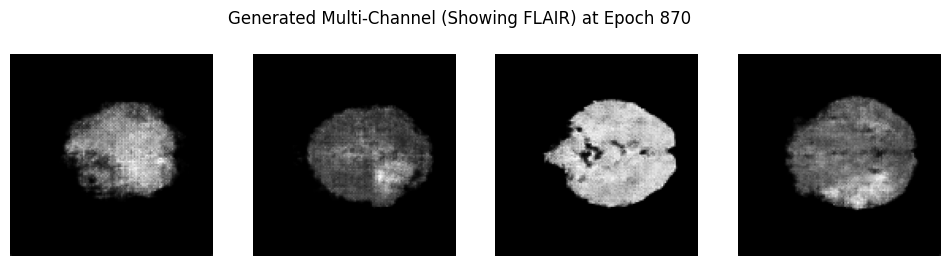

Epoch 871/1000
  Discriminator Loss: -58.6055 | Generator Loss: 51.3910 | D Accuracy: 0.8932
Epoch 872/1000
  Discriminator Loss: -62.9505 | Generator Loss: 58.1675 | D Accuracy: 0.9193
Epoch 873/1000
  Discriminator Loss: -54.3116 | Generator Loss: 53.1987 | D Accuracy: 0.8958
Epoch 874/1000
  Discriminator Loss: -57.2448 | Generator Loss: 45.9614 | D Accuracy: 0.9193
Epoch 875/1000
  Discriminator Loss: -59.7781 | Generator Loss: 49.7938 | D Accuracy: 0.9245
Epoch 876/1000
  Discriminator Loss: -55.6755 | Generator Loss: 46.7056 | D Accuracy: 0.9271
Epoch 877/1000
  Discriminator Loss: -57.2714 | Generator Loss: 52.1451 | D Accuracy: 0.8854
Epoch 878/1000
  Discriminator Loss: -56.3664 | Generator Loss: 46.0737 | D Accuracy: 0.9401
Epoch 879/1000
  Discriminator Loss: -57.2186 | Generator Loss: 58.3772 | D Accuracy: 0.9193
Epoch 880/1000
  Discriminator Loss: -65.6036 | Generator Loss: 53.3375 | D Accuracy: 0.8906


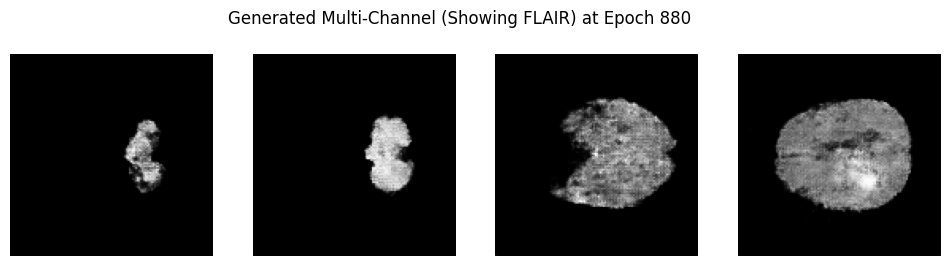

Epoch 881/1000
  Discriminator Loss: -59.6797 | Generator Loss: 46.8892 | D Accuracy: 0.9089
Epoch 882/1000
  Discriminator Loss: -60.5498 | Generator Loss: 48.6371 | D Accuracy: 0.9323
Epoch 883/1000
  Discriminator Loss: -54.6563 | Generator Loss: 43.3546 | D Accuracy: 0.9349
Epoch 884/1000
  Discriminator Loss: -57.2402 | Generator Loss: 48.5127 | D Accuracy: 0.8750
Epoch 885/1000
  Discriminator Loss: -63.8787 | Generator Loss: 58.3219 | D Accuracy: 0.8984
Epoch 886/1000
  Discriminator Loss: -53.5916 | Generator Loss: 59.9648 | D Accuracy: 0.8698
Epoch 887/1000
  Discriminator Loss: -63.2313 | Generator Loss: 51.4169 | D Accuracy: 0.9193
Epoch 888/1000
  Discriminator Loss: -64.0795 | Generator Loss: 48.8047 | D Accuracy: 0.9297
Epoch 889/1000
  Discriminator Loss: -67.0944 | Generator Loss: 67.1589 | D Accuracy: 0.8750
Epoch 890/1000
  Discriminator Loss: -57.1347 | Generator Loss: 57.1634 | D Accuracy: 0.8854


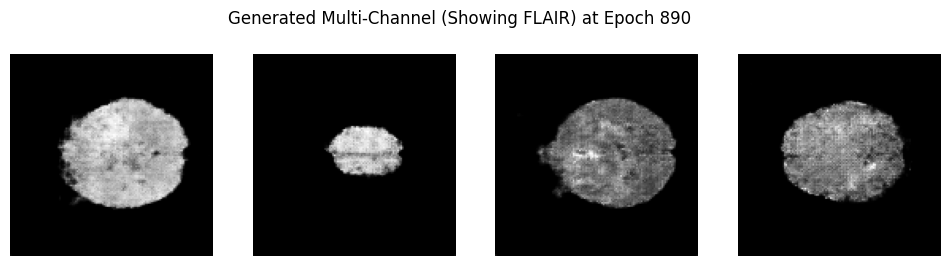

Epoch 891/1000
  Discriminator Loss: -60.8212 | Generator Loss: 60.6951 | D Accuracy: 0.8828
Epoch 892/1000
  Discriminator Loss: -59.9530 | Generator Loss: 57.8545 | D Accuracy: 0.9115
Epoch 893/1000
  Discriminator Loss: -61.9656 | Generator Loss: 62.0176 | D Accuracy: 0.8672
Epoch 894/1000
  Discriminator Loss: -66.3988 | Generator Loss: 47.5221 | D Accuracy: 0.9219
Epoch 895/1000
  Discriminator Loss: -58.6307 | Generator Loss: 58.8393 | D Accuracy: 0.8932
Epoch 896/1000
  Discriminator Loss: -58.7552 | Generator Loss: 53.2649 | D Accuracy: 0.9323
Epoch 897/1000
  Discriminator Loss: -61.8217 | Generator Loss: 55.3049 | D Accuracy: 0.8958
Epoch 898/1000
  Discriminator Loss: -59.1727 | Generator Loss: 56.2297 | D Accuracy: 0.9141
Epoch 899/1000
  Discriminator Loss: -54.4388 | Generator Loss: 51.0199 | D Accuracy: 0.9193
Epoch 900/1000
  Discriminator Loss: -59.8984 | Generator Loss: 50.8793 | D Accuracy: 0.9167


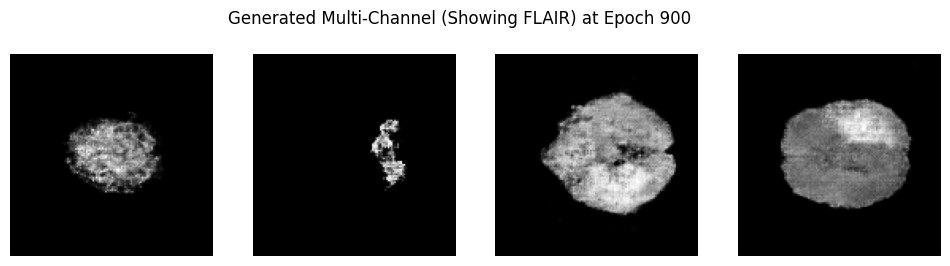

Epoch 901/1000
  Discriminator Loss: -60.7714 | Generator Loss: 59.6830 | D Accuracy: 0.9115
Epoch 902/1000
  Discriminator Loss: -56.8159 | Generator Loss: 62.7024 | D Accuracy: 0.9062
Epoch 903/1000
  Discriminator Loss: -57.3038 | Generator Loss: 56.1913 | D Accuracy: 0.9375
Epoch 904/1000
  Discriminator Loss: -60.0859 | Generator Loss: 59.0944 | D Accuracy: 0.8854
Epoch 905/1000
  Discriminator Loss: -58.6208 | Generator Loss: 49.7639 | D Accuracy: 0.9375
Epoch 906/1000
  Discriminator Loss: -58.3703 | Generator Loss: 65.2757 | D Accuracy: 0.9167
Epoch 907/1000
  Discriminator Loss: -60.4647 | Generator Loss: 61.3546 | D Accuracy: 0.9115
Epoch 908/1000
  Discriminator Loss: -70.1040 | Generator Loss: 62.1429 | D Accuracy: 0.9115
Epoch 909/1000
  Discriminator Loss: -74.2368 | Generator Loss: 57.7439 | D Accuracy: 0.8958
Epoch 910/1000
  Discriminator Loss: -55.0848 | Generator Loss: 49.3988 | D Accuracy: 0.9271


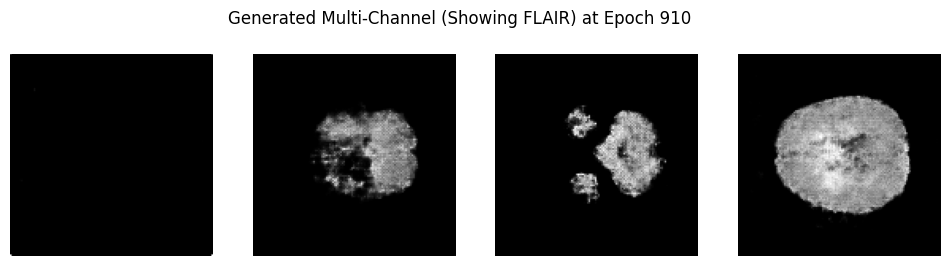

Epoch 911/1000
  Discriminator Loss: -55.6582 | Generator Loss: 53.2971 | D Accuracy: 0.9115
Epoch 912/1000
  Discriminator Loss: -66.9765 | Generator Loss: 53.8633 | D Accuracy: 0.9323
Epoch 913/1000
  Discriminator Loss: -59.7381 | Generator Loss: 62.7855 | D Accuracy: 0.9193
Epoch 914/1000
  Discriminator Loss: -62.9339 | Generator Loss: 58.5165 | D Accuracy: 0.9193
Epoch 915/1000
  Discriminator Loss: -62.7200 | Generator Loss: 48.1390 | D Accuracy: 0.9141
Epoch 916/1000
  Discriminator Loss: -61.3168 | Generator Loss: 46.2936 | D Accuracy: 0.9167
Epoch 917/1000
  Discriminator Loss: -58.7185 | Generator Loss: 50.0671 | D Accuracy: 0.9479
Epoch 918/1000
  Discriminator Loss: -62.6130 | Generator Loss: 55.0948 | D Accuracy: 0.8750
Epoch 919/1000
  Discriminator Loss: -62.1502 | Generator Loss: 57.8216 | D Accuracy: 0.9297
Epoch 920/1000
  Discriminator Loss: -68.7846 | Generator Loss: 58.8296 | D Accuracy: 0.9141


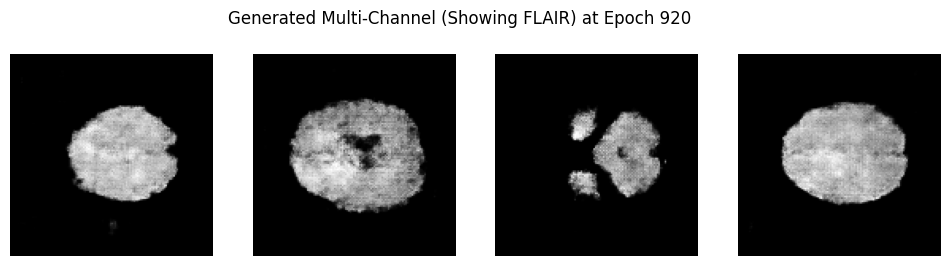

Epoch 921/1000
  Discriminator Loss: -56.7491 | Generator Loss: 52.6380 | D Accuracy: 0.9479
Epoch 922/1000
  Discriminator Loss: -60.7569 | Generator Loss: 51.8347 | D Accuracy: 0.9349
Epoch 923/1000
  Discriminator Loss: -58.3957 | Generator Loss: 48.9223 | D Accuracy: 0.9219
Epoch 924/1000
  Discriminator Loss: -62.0499 | Generator Loss: 49.2912 | D Accuracy: 0.9271
Epoch 925/1000
  Discriminator Loss: -63.8413 | Generator Loss: 54.9963 | D Accuracy: 0.9271
Epoch 926/1000
  Discriminator Loss: -61.3789 | Generator Loss: 59.1314 | D Accuracy: 0.9323
Epoch 927/1000
  Discriminator Loss: -64.1837 | Generator Loss: 56.6411 | D Accuracy: 0.9297
Epoch 928/1000
  Discriminator Loss: -49.6856 | Generator Loss: 50.9385 | D Accuracy: 0.9141
Epoch 929/1000
  Discriminator Loss: -56.7985 | Generator Loss: 53.4458 | D Accuracy: 0.9375
Epoch 930/1000
  Discriminator Loss: -62.8763 | Generator Loss: 48.8227 | D Accuracy: 0.9219


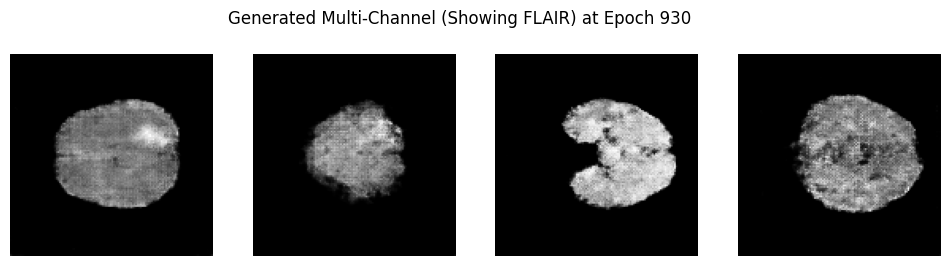

Epoch 931/1000
  Discriminator Loss: -63.2876 | Generator Loss: 60.9453 | D Accuracy: 0.8906
Epoch 932/1000
  Discriminator Loss: -59.2612 | Generator Loss: 56.7943 | D Accuracy: 0.9271
Epoch 933/1000
  Discriminator Loss: -60.7333 | Generator Loss: 48.5103 | D Accuracy: 0.8854
Epoch 934/1000
  Discriminator Loss: -55.7797 | Generator Loss: 52.2810 | D Accuracy: 0.9141
Epoch 935/1000
  Discriminator Loss: -59.7688 | Generator Loss: 57.4902 | D Accuracy: 0.9115
Epoch 936/1000
  Discriminator Loss: -61.6064 | Generator Loss: 69.7654 | D Accuracy: 0.8984
Epoch 937/1000
  Discriminator Loss: -62.2407 | Generator Loss: 58.0976 | D Accuracy: 0.8906
Epoch 938/1000
  Discriminator Loss: -63.6833 | Generator Loss: 63.1424 | D Accuracy: 0.9245
Epoch 939/1000
  Discriminator Loss: -57.6386 | Generator Loss: 57.1163 | D Accuracy: 0.9193
Epoch 940/1000
  Discriminator Loss: -60.5209 | Generator Loss: 52.4494 | D Accuracy: 0.9271


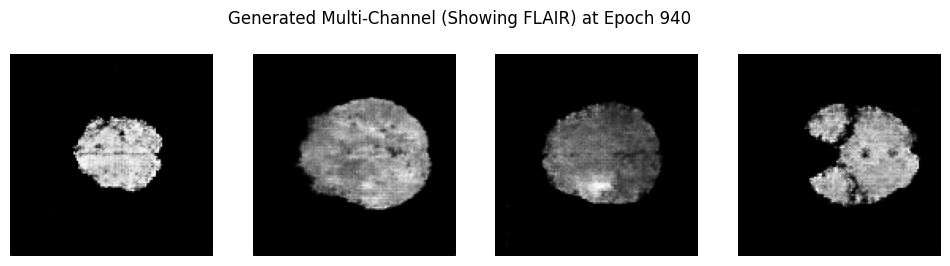

Epoch 941/1000
  Discriminator Loss: -62.1968 | Generator Loss: 48.7694 | D Accuracy: 0.9297
Epoch 942/1000
  Discriminator Loss: -59.7956 | Generator Loss: 59.9442 | D Accuracy: 0.9167
Epoch 943/1000
  Discriminator Loss: -56.8517 | Generator Loss: 52.5291 | D Accuracy: 0.9036
Epoch 944/1000
  Discriminator Loss: -52.0754 | Generator Loss: 53.8022 | D Accuracy: 0.9271
Epoch 945/1000
  Discriminator Loss: -61.9621 | Generator Loss: 51.3068 | D Accuracy: 0.9115
Epoch 946/1000
  Discriminator Loss: -55.8942 | Generator Loss: 52.0322 | D Accuracy: 0.9401
Epoch 947/1000
  Discriminator Loss: -61.6150 | Generator Loss: 61.7475 | D Accuracy: 0.9115
Epoch 948/1000
  Discriminator Loss: -60.3867 | Generator Loss: 56.2641 | D Accuracy: 0.9297
Epoch 949/1000
  Discriminator Loss: -55.1025 | Generator Loss: 55.4800 | D Accuracy: 0.9167
Epoch 950/1000
  Discriminator Loss: -67.8016 | Generator Loss: 62.4015 | D Accuracy: 0.9115


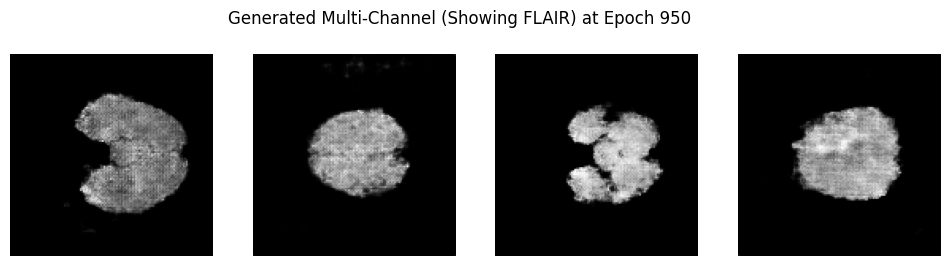

Epoch 951/1000
  Discriminator Loss: -55.0508 | Generator Loss: 54.7544 | D Accuracy: 0.9167
Epoch 952/1000
  Discriminator Loss: -63.7135 | Generator Loss: 60.3310 | D Accuracy: 0.9349
Epoch 953/1000
  Discriminator Loss: -68.3323 | Generator Loss: 62.9168 | D Accuracy: 0.9219
Epoch 954/1000
  Discriminator Loss: -57.9845 | Generator Loss: 59.8039 | D Accuracy: 0.8958
Epoch 955/1000
  Discriminator Loss: -60.8294 | Generator Loss: 59.9909 | D Accuracy: 0.9401
Epoch 956/1000
  Discriminator Loss: -62.3549 | Generator Loss: 58.8193 | D Accuracy: 0.9193
Epoch 957/1000
  Discriminator Loss: -65.0304 | Generator Loss: 63.2212 | D Accuracy: 0.9193
Epoch 958/1000
  Discriminator Loss: -58.7013 | Generator Loss: 66.3082 | D Accuracy: 0.9115
Epoch 959/1000
  Discriminator Loss: -64.5951 | Generator Loss: 53.3804 | D Accuracy: 0.9427
Epoch 960/1000
  Discriminator Loss: -71.7622 | Generator Loss: 58.2192 | D Accuracy: 0.9089


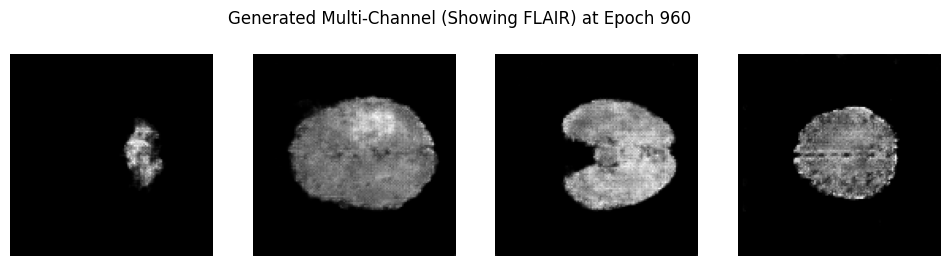

Epoch 961/1000
  Discriminator Loss: -63.4078 | Generator Loss: 57.9485 | D Accuracy: 0.8984
Epoch 962/1000
  Discriminator Loss: -58.5472 | Generator Loss: 58.5937 | D Accuracy: 0.9167
Epoch 963/1000
  Discriminator Loss: -63.2117 | Generator Loss: 59.6660 | D Accuracy: 0.9167
Epoch 964/1000
  Discriminator Loss: -61.3840 | Generator Loss: 56.8593 | D Accuracy: 0.9219
Epoch 965/1000
  Discriminator Loss: -64.9206 | Generator Loss: 64.7786 | D Accuracy: 0.9219
Epoch 966/1000
  Discriminator Loss: -62.6295 | Generator Loss: 59.1749 | D Accuracy: 0.9297
Epoch 967/1000
  Discriminator Loss: -62.3262 | Generator Loss: 60.2951 | D Accuracy: 0.9323
Epoch 968/1000
  Discriminator Loss: -54.0336 | Generator Loss: 60.5063 | D Accuracy: 0.9062
Epoch 969/1000
  Discriminator Loss: -57.7184 | Generator Loss: 60.2757 | D Accuracy: 0.9245
Epoch 970/1000
  Discriminator Loss: -60.1866 | Generator Loss: 58.9681 | D Accuracy: 0.9271


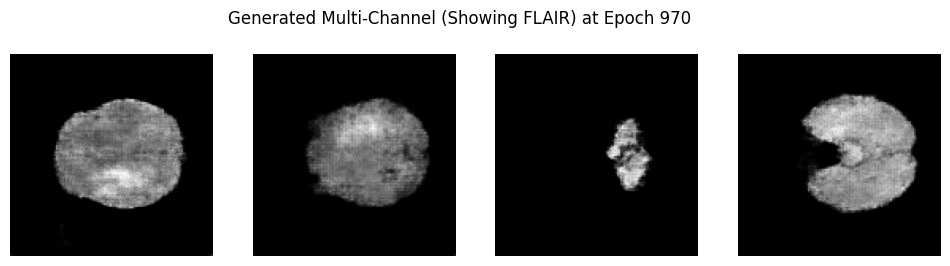

Epoch 971/1000
  Discriminator Loss: -59.8678 | Generator Loss: 55.0544 | D Accuracy: 0.9349
Epoch 972/1000
  Discriminator Loss: -64.1925 | Generator Loss: 62.3174 | D Accuracy: 0.9089
Epoch 973/1000
  Discriminator Loss: -65.8335 | Generator Loss: 69.9900 | D Accuracy: 0.9245
Epoch 974/1000
  Discriminator Loss: -57.8167 | Generator Loss: 64.7658 | D Accuracy: 0.9323
Epoch 975/1000
  Discriminator Loss: -61.9668 | Generator Loss: 61.9950 | D Accuracy: 0.9036
Epoch 976/1000
  Discriminator Loss: -56.5047 | Generator Loss: 55.5412 | D Accuracy: 0.9167
Epoch 977/1000
  Discriminator Loss: -61.1794 | Generator Loss: 55.0967 | D Accuracy: 0.9115
Epoch 978/1000
  Discriminator Loss: -60.4204 | Generator Loss: 57.4034 | D Accuracy: 0.9062
Epoch 979/1000
  Discriminator Loss: -59.0146 | Generator Loss: 54.5748 | D Accuracy: 0.9167
Epoch 980/1000
  Discriminator Loss: -60.0412 | Generator Loss: 55.4817 | D Accuracy: 0.8880


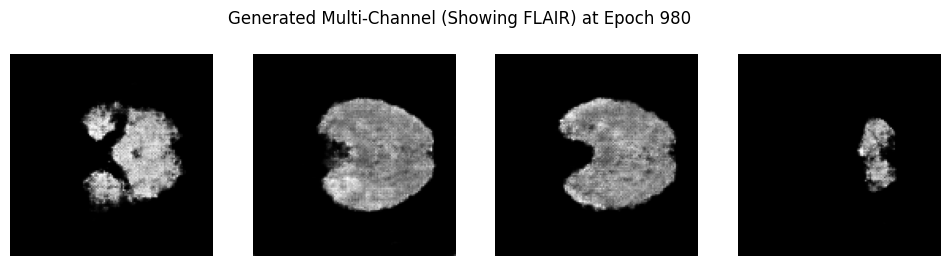

Epoch 981/1000
  Discriminator Loss: -67.1283 | Generator Loss: 58.6095 | D Accuracy: 0.9271
Epoch 982/1000
  Discriminator Loss: -54.7966 | Generator Loss: 53.2274 | D Accuracy: 0.9323
Epoch 983/1000
  Discriminator Loss: -60.3788 | Generator Loss: 53.6530 | D Accuracy: 0.9297
Epoch 984/1000
  Discriminator Loss: -59.5433 | Generator Loss: 56.9286 | D Accuracy: 0.9193
Epoch 985/1000
  Discriminator Loss: -70.3329 | Generator Loss: 64.4785 | D Accuracy: 0.9219
Epoch 986/1000
  Discriminator Loss: -62.7641 | Generator Loss: 65.3844 | D Accuracy: 0.9036
Epoch 987/1000
  Discriminator Loss: -66.7800 | Generator Loss: 56.9994 | D Accuracy: 0.9427
Epoch 988/1000
  Discriminator Loss: -63.8154 | Generator Loss: 69.4165 | D Accuracy: 0.9089
Epoch 989/1000
  Discriminator Loss: -59.4457 | Generator Loss: 61.8068 | D Accuracy: 0.9219
Epoch 990/1000
  Discriminator Loss: -66.9915 | Generator Loss: 60.2452 | D Accuracy: 0.9401


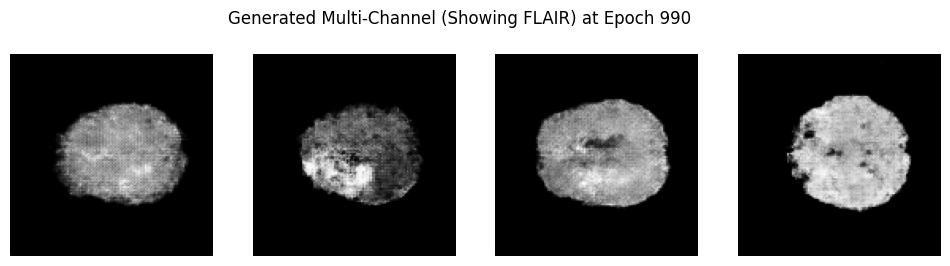

Epoch 991/1000
  Discriminator Loss: -57.1523 | Generator Loss: 59.8459 | D Accuracy: 0.8984
Epoch 992/1000
  Discriminator Loss: -61.5488 | Generator Loss: 47.8366 | D Accuracy: 0.9349
Epoch 993/1000
  Discriminator Loss: -67.1624 | Generator Loss: 49.8354 | D Accuracy: 0.9297
Epoch 994/1000
  Discriminator Loss: -64.3655 | Generator Loss: 55.7805 | D Accuracy: 0.9115
Epoch 995/1000
  Discriminator Loss: -62.3688 | Generator Loss: 51.1056 | D Accuracy: 0.9245
Epoch 996/1000
  Discriminator Loss: -67.3922 | Generator Loss: 62.2977 | D Accuracy: 0.8984
Epoch 997/1000
  Discriminator Loss: -57.9472 | Generator Loss: 61.5408 | D Accuracy: 0.9271
Epoch 998/1000
  Discriminator Loss: -64.0037 | Generator Loss: 57.8461 | D Accuracy: 0.8984
Epoch 999/1000
  Discriminator Loss: -58.3998 | Generator Loss: 53.3277 | D Accuracy: 0.9479
Epoch 1000/1000
  Discriminator Loss: -68.2396 | Generator Loss: 54.2209 | D Accuracy: 0.9375


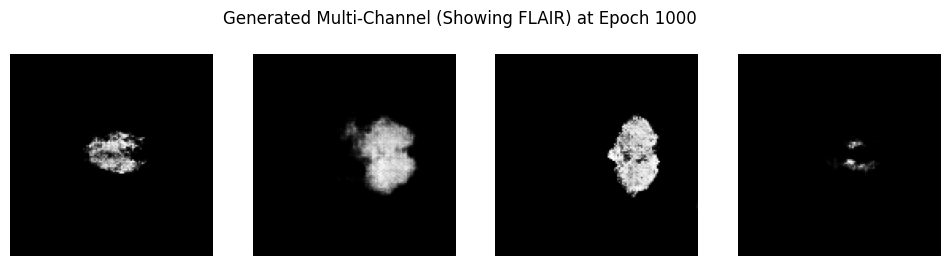

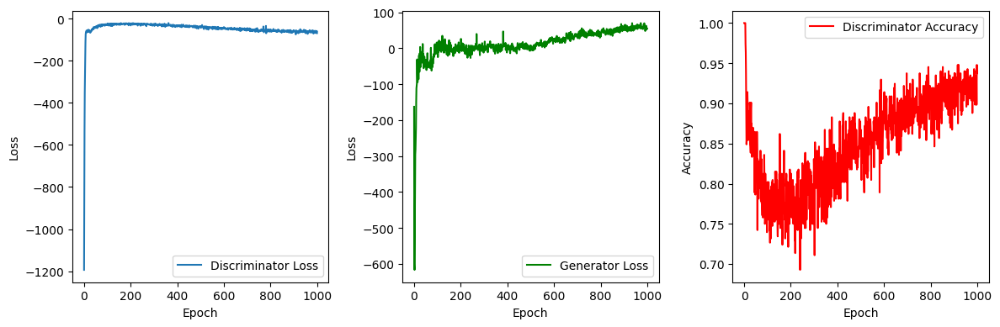

In [6]:
def remove_synthetic_images(train_path):
    """
    Removes synthetic images from the BraTS2020 dataset.
    """
    for root, _, files in os.walk(train_path):
        for file in files:
            if file.startswith('synthetic'):
                file_path = os.path.join(root, file)
                try:
                    os.remove(file_path)
                    print(f"Removed synthetic image: {file_path}")
                except OSError as e:
                    print(f"Error removing file: {file_path} - {e}")

# Call the function to remove synthetic images
remove_synthetic_images(Train_Path)

###############################################################################
# 1. Load T1, T1CE, T2, FLAIR, SEG as 5-channel slices
###############################################################################
def load_multimodal_images(train_path, img_size=128, slice_range=(0, 154)):
    """
    For each BraTS20_Training_### folder, load:
      - FLAIR, T1, T1CE, T2, SEG
    Pick a random slice from slice_range, resize to img_size x img_size,
    stack them as channels, normalize to [-1,1] for MRI intensities,
    and keep the segmentation mask as well.

    Returns: numpy array of shape (N, img_size, img_size, 5)
      - Channel order: [FLAIR, SEG, T1, T1CE, T2]
        (You can change the order as you wish.)
    """
    folders = sorted([
        os.path.join(train_path, f)
        for f in os.listdir(train_path)
        if f.startswith("BraTS20_Training_") and os.path.isdir(os.path.join(train_path, f))
    ])

    images = []

    for folder in folders:
        # Collect file paths
        flair_file = None
        seg_file   = None
        t1_file    = None
        t1ce_file  = None
        t2_file    = None

        for file in os.listdir(folder):
            if file.endswith("_flair.nii"):
                flair_file = os.path.join(folder, file)
            elif file.endswith("_seg.nii"):
                seg_file = os.path.join(folder, file)
            elif file.endswith("_t1.nii"):
                t1_file = os.path.join(folder, file)
            elif file.endswith("_t1ce.nii"):
                t1ce_file = os.path.join(folder, file)
            elif file.endswith("_t2.nii"):
                t2_file = os.path.join(folder, file)

        # If any modality is missing, skip
        if not all([flair_file, seg_file, t1_file, t1ce_file, t2_file]):
            continue

        # Load each NIfTI
        flair_nii = nib.load(flair_file).get_fdata()
        seg_nii   = nib.load(seg_file).get_fdata()
        t1_nii    = nib.load(t1_file).get_fdata()
        t1ce_nii  = nib.load(t1ce_file).get_fdata()
        t2_nii    = nib.load(t2_file).get_fdata()

        # The shape is typically (240,240,155) for each
        # Pick a random slice index from the valid range
        max_slices = flair_nii.shape[2]
        slice_index = np.random.randint(slice_range[0], min(slice_range[1], max_slices-1))

        # Extract that slice from each modality
        flair_slice = flair_nii[:, :, slice_index]
        seg_slice   = seg_nii[:, :, slice_index]
        t1_slice    = t1_nii[:, :, slice_index]
        t1ce_slice  = t1ce_nii[:, :, slice_index]
        t2_slice    = t2_nii[:, :, slice_index]

        # Resize to (img_size, img_size)
        flair_slice = cv2.resize(flair_slice, (img_size, img_size))
        seg_slice   = cv2.resize(seg_slice,   (img_size, img_size), interpolation=cv2.INTER_NEAREST)
        t1_slice    = cv2.resize(t1_slice,    (img_size, img_size))
        t1ce_slice  = cv2.resize(t1ce_slice,  (img_size, img_size))
        t2_slice    = cv2.resize(t2_slice,    (img_size, img_size))

        # Convert to float32
        flair_slice = flair_slice.astype(np.float32)
        seg_slice   = seg_slice.astype(np.float32)
        t1_slice    = t1_slice.astype(np.float32)
        t1ce_slice  = t1ce_slice.astype(np.float32)
        t2_slice    = t2_slice.astype(np.float32)

        # Normalize each MRI slice to [-1,1]
        # (seg_slice is 0/1, but for simplicity we'll also keep it in [-1,1])
        def norm_mri(img):
            min_val = np.min(img)
            max_val = np.max(img)
            # To avoid dividing by zero if the slice is uniform
            return 2.0 * ( (img - min_val) / (max_val - min_val + 1e-8) ) - 1.0

        flair_slice = norm_mri(flair_slice)
        t1_slice    = norm_mri(t1_slice)
        t1ce_slice  = norm_mri(t1ce_slice)
        t2_slice    = norm_mri(t2_slice)

        # For segmentation, you could leave it 0/1, but let's also do the same normalization
        seg_slice = norm_mri(seg_slice)

        # Stack them into a single 5-channel image: [H, W, 5]
        # Order them however you like; here we do [FLAIR, SEG, T1, T1CE, T2]
        multi_slice = np.stack([flair_slice, seg_slice, t1_slice, t1ce_slice, t2_slice], axis=-1)

        images.append(multi_slice)

    images = np.array(images, dtype=np.float32)
    return images

# Load multi-channel images
images = load_multimodal_images(Train_Path, img_size=128, slice_range=(0, 154))
print("Loaded images shape:", images.shape)  # (N, 128, 128, 5)

# Create tf.data.Dataset
batch_size = 16  # Might need smaller batch if memory is an issue
dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(buffer_size=len(images)).batch(batch_size)


###############################################################################
# 1. Self-Attention
###############################################################################
class SelfAttention(tf.keras.layers.Layer):
    def __init__(self, channels, **kwargs):
        super(SelfAttention, self).__init__(**kwargs)
        self.channels = channels
        self.f = Conv2D(filters=channels // 8, kernel_size=1, padding='same')
        self.g = Conv2D(filters=channels // 8, kernel_size=1, padding='same')
        self.h = Conv2D(filters=channels, kernel_size=1, padding='same')
        self.gamma = self.add_weight(name='gamma', shape=[1],
                                     initializer='zeros', trainable=True)

    def call(self, x):
        B, H, W, C = tf.shape(x)[0], tf.shape(x)[1], tf.shape(x)[2], tf.shape(x)[3]

        f_out = self.f(x)  # (B, H, W, C//8)
        g_out = self.g(x)  # (B, H, W, C//8)
        h_out = self.h(x)  # (B, H, W, C)

        f_flat = tf.reshape(f_out, [B, H*W, C // 8])   # (B, N, C//8), where N=H*W
        g_flat = tf.reshape(g_out, [B, H*W, C // 8])   # (B, N, C//8)
        h_flat = tf.reshape(h_out, [B, H*W, C])        # (B, N, C)

        attention = tf.matmul(f_flat, g_flat, transpose_b=True)  # (B, N, N)
        attention = tf.nn.softmax(attention, axis=-1)            # softmax over last dim
        self_attn = tf.matmul(attention, h_flat)                 # (B, N, C)
        self_attn = tf.reshape(self_attn, [B, H, W, C])

        return self.gamma * self_attn + x

###############################################################################
# 2. Generator
###############################################################################
def build_generator(latent_dim=100):
    input_tensor = Input(shape=(latent_dim,))

    # Start: 4x4
    x = Dense(4*4*512, use_bias=False)(input_tensor)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Reshape((4, 4, 512))(x)

    # 4 -> 8
    x = Conv2DTranspose(256, kernel_size=4, strides=2, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # 8 -> 16
    x = Conv2DTranspose(128, kernel_size=4, strides=2, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # 16 -> 32 (Insert Self-Attention here)
    x = Conv2DTranspose(128, kernel_size=4, strides=2, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = SelfAttention(128)(x)  # << single SA block

    # 32 -> 64
    x = Conv2DTranspose(64, kernel_size=4, strides=2, padding='same', use_bias=False)(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # 64 -> 128
    x = Conv2DTranspose(5, kernel_size=4, strides=2, padding='same', activation='tanh')(x)

    return Model(inputs=input_tensor, outputs=x)

###############################################################################
# 3. Discriminator
###############################################################################
def build_discriminator():
    input_tensor = Input(shape=(128, 128, 5))

    # 128 -> 64
    x = Conv2D(64, kernel_size=4, strides=2, padding='same')(input_tensor)
    x = LeakyReLU(0.2)(x)

    # 64 -> 32
    x = Conv2D(128, kernel_size=4, strides=2, padding='same')(x)
    x = LeakyReLU(0.2)(x)

    # 32 -> 16 (Insert Self-Attention)
    x = Conv2D(128, kernel_size=4, strides=2, padding='same')(x)
    x = LeakyReLU(0.2)(x)
    x = SelfAttention(128)(x)  # << single SA block

    # 16 -> 8
    x = Conv2D(256, kernel_size=4, strides=2, padding='same')(x)
    x = LeakyReLU(0.2)(x)

    # 8 -> 4
    x = Conv2D(512, kernel_size=4, strides=2, padding='same')(x)
    x = LeakyReLU(0.2)(x)

    # Flatten & single scalar
    x = Flatten()(x)
    x = Dense(1)(x)

    return Model(inputs=input_tensor, outputs=x)

generator = build_generator()
discriminator = build_discriminator()

generator.summary()
discriminator.summary()

generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.5, beta_2=0.9)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.5, beta_2=0.9)

###############################################################################
# 4. Loss Functions
###############################################################################
def discriminator_loss(real_output, fake_output):
    # real_output, fake_output have shape (batch, 8, 8, 1)
    return tf.reduce_mean(fake_output) - tf.reduce_mean(real_output)

def generator_loss(fake_output):
    return -tf.reduce_mean(fake_output)

###############################################################################
# 5. Training Loop with Gradient Penalty
###############################################################################
epochs = 1000
n_critic = 5
lambda_gp = 10.0
latent_dim = 100
@tf.function
def train_step(real_images):
    current_batch_size = tf.shape(real_images)[0]

    # Update the critic n_critic times
    for _ in range(n_critic):
        noise = tf.random.normal([current_batch_size, latent_dim])
        with tf.GradientTape() as disc_tape:
            fake_images = generator(noise, training=True)
            real_output = discriminator(real_images, training=True)
            fake_output = discriminator(fake_images, training=True)

            d_loss = discriminator_loss(real_output, fake_output)

            # Gradient penalty
            alpha = tf.random.uniform([current_batch_size, 1, 1, 1], 0.0, 1.0)
            interpolated = alpha * real_images + (1 - alpha) * fake_images
            with tf.GradientTape() as gp_tape:
                gp_tape.watch(interpolated)
                pred = discriminator(interpolated, training=True)
            grads = gp_tape.gradient(pred, [interpolated])[0]
            grad_norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1,2,3]) + 1e-12)
            gp = tf.reduce_mean((grad_norm - 1.0)**2)

            d_loss += lambda_gp * gp

        disc_grads = disc_tape.gradient(d_loss, discriminator.trainable_variables)
        discriminator_optimizer.apply_gradients(zip(disc_grads, discriminator.trainable_variables))

    # Simple "accuracy"
    noise = tf.random.normal([current_batch_size, latent_dim])
    fake_images = generator(noise, training=False)
    real_output = discriminator(real_images, training=False)
    fake_output = discriminator(fake_images, training=False)
    acc = tf.reduce_mean(tf.cast(real_output > fake_output, tf.float32))

    # Update generator
    noise = tf.random.normal([current_batch_size, latent_dim])
    with tf.GradientTape() as gen_tape:
        generated_images = generator(noise, training=True)
        fake_output = discriminator(generated_images, training=True)
        g_loss = generator_loss(fake_output)
    gen_grads = gen_tape.gradient(g_loss, generator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gen_grads, generator.trainable_variables))

    return d_loss, g_loss, acc

epochs_d_loss = []
epochs_g_loss = []
epochs_d_acc = []

# Directory to save synthetic images
synthetic_dir = os.path.join(Train_Path, "SyntheticMultiChannel")
os.makedirs(synthetic_dir, exist_ok=True)

for epoch in range(epochs):
    print(f"Epoch {epoch+1}/{epochs}")
    epoch_d_loss = []
    epoch_g_loss = []
    epoch_d_acc = []

    for real_batch in dataset:
        d_loss_val, g_loss_val, acc_val = train_step(real_batch)
        epoch_d_loss.append(d_loss_val.numpy())
        epoch_g_loss.append(g_loss_val.numpy())
        epoch_d_acc.append(acc_val.numpy())

    mean_d_loss = np.mean(epoch_d_loss)
    mean_g_loss = np.mean(epoch_g_loss)
    mean_d_acc = np.mean(epoch_d_acc)

    epochs_d_loss.append(mean_d_loss)
    epochs_g_loss.append(mean_g_loss)
    epochs_d_acc.append(mean_d_acc)

    print(f"  Discriminator Loss: {mean_d_loss:.4f} | Generator Loss: {mean_g_loss:.4f} | D Accuracy: {mean_d_acc:.4f}")

    # Generate a few sample images every 10 epochs
    if (epoch + 1) % 10 == 0:
        noise = tf.random.normal([4, latent_dim])
        gen_imgs = generator(noise, training=False)
        gen_flair = gen_imgs[..., 0]  # channel 0- Flair
        gen_flair_rescaled = (gen_flair + 1.0) / 2.0  # [-1,1] -> [0,1]

        fig, axes = plt.subplots(1, 4, figsize=(12, 3))
        for i in range(4):
            axes[i].imshow(gen_flair_rescaled[i], cmap='gray')
            axes[i].axis('off')
        plt.suptitle(f"Generated Multi-Channel (Showing FLAIR) at Epoch {epoch+1}")
        plt.show()
        for i in range(gen_imgs.shape[0]):
            img_5ch = gen_imgs[i].numpy()
            # Rescale all channels to [0,1]
            img_5ch = (img_5ch + 1.0) / 2.0
            nifti_img = nib.Nifti1Image(img_5ch, np.eye(4))
            save_path = os.path.join(synthetic_dir, f"synthetic_multich_epoch{epoch+1}_img{i}.nii")
            nib.save(nifti_img, save_path)

# Plot training metrics
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(epochs_d_loss, label='Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(epochs_g_loss, label='Generator Loss', color='green')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(epochs_d_acc, label='Discriminator Accuracy', color='red')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()
